# Exploring Statistical Relations Between Coda Sequences of Dominica Sperm Whale Pairs


This notebook contains the full codebase, analysis, and results accompanying the research paper titled "Exploring Statistical Relations Between Coda Sequences of Dominica Sperm Whale Pairs". This project delves into the complex vocalizations of sperm whales, specifically analyzing the dependencies and predictability within their coda sequences during dyadic interactions.

<img src="https://img.icons8.com/bubbles/50/000000/information.png" style="height:50px;display:inline">

### Summary

---

This Python notebook includes:

* **Exploratory Data Analysis (EDA):** Comprehensive analysis of the sperm whale coda dataset.
* **Sequence Analysis:** Methods to process and analyze temporal relationships within coda sequences.
* **Statistical Tests:** Application of various statistical methods to uncover dependencies.
* **Machine Learning Models:**
    * Implementation, training, and evaluation of **Gaussian Mixture Model Hidden Markov Models (GMM-HMM)** for capturing probabilistic dependencies.
    * Implementation, training, and evaluation of **Long Short-Term Memory (LSTM) networks** for sequence prediction.
    * Implementation, training, and evaluation of **Transformer models** for advanced sequence modeling.
* **Visualization:** Interactive and static plots to illustrate data distributions, model performance, and key findings.


### imports

In [13]:
import pandas as pd
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from scipy.stats import pearsonr, spearmanr
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import random
import torch.nn.functional as F
import itertools
from sklearn.feature_selection import mutual_info_regression
from hmmlearn import hmm
from torch.nn.utils.rnn import pad_sequence
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from torch.optim.lr_scheduler import CyclicLR

### set df

In [2]:
df_path = 'assets/from-guy/DB Annotations/Tags/DSWP/2014-2016/Shane_Annotations.csv'
shane_df = pd.read_csv(df_path)

ici_max_count = 10
ici_columns = [col for col in shane_df.columns if col.startswith('ICI')][:ici_max_count]
selected_columns = ici_columns + ['Duration', 'nClicks']
decision_tree_coda_type_field_name = 'decision_tree_coda_type'
guy_coda_type_field_name = 'guy_coda_type'
shane_df[guy_coda_type_field_name].fillna(shane_df[decision_tree_coda_type_field_name], inplace=True)
capacity_outage_col_name = 'CapacityOutage'
number_of_clicks_col_name = 'nClicks'

### Encode coda types

In [3]:
coda_types = np.concatenate(
    (shane_df[guy_coda_type_field_name].unique(), shane_df[decision_tree_coda_type_field_name].unique()))
coda_types = np.unique(coda_types.astype(str))
print(coda_types)
vocab2id = dict(zip(coda_types, range(len(coda_types))))

['1+1+3' '1+31' '1+32' '10R' '10i' '2+3' '3D' '3R' '4D' '4R1' '4R2' '5R1'
 '5R2' '5R3' '6R' '6i' '7C' '7D1' '7D2' '7R' '7i' '8D' '8R' '8i' '9R' '9i']


### capacity outage functions

In [4]:
def capacity_outage(ici_vector_a, ici_vector_b, nClick):
    return np.linalg.norm((ici_vector_a - ici_vector_b) / (nClick - 1))


def calculate_average_ici(df, coda_col_name, coda_types, ici_cols):
    result = {}
    for coda in coda_types:
        coda_group = df[df[coda_col_name] == coda]
        result[coda] = coda_group[ici_cols].mean().to_dict()
    return result


typical_coda_ici_df = calculate_average_ici(shane_df, guy_coda_type_field_name, coda_types, ici_columns)


def calculate_capacity_outage(row):
    return capacity_outage(np.array(list(typical_coda_ici_df[row[guy_coda_type_field_name]].values())),
                           np.array(row[ici_columns]), row[number_of_clicks_col_name])

## Extract pairs & categories (Overlap..)
### extract past coda's idxs and next coda idx

In [5]:
coda_df = shane_df[shane_df['nClicks'] > 2].sort_values(by=['Tag', 'TsTo']).reset_index(drop=True)
valid_indices = coda_df.index.to_list()
index_map = {valid_indices[i]: valid_indices[i + 1] for i in range(len(valid_indices) - 1)}
timeout_seconds = 7


def find_past_codas(df, idx, squence_max_len=10):
    past_indices = []

    focal = df.loc[idx, 'Focal']
    tag = df.loc[idx, 'Tag']
    curr_tsTo = df.loc[idx, 'TsTo']

    for i in range(idx - 1, -1, -1):
        if curr_tsTo - df.loc[i, 'TsTo'] > timeout_seconds:
            break
        if df.loc[i, 'Focal'] == focal and df.loc[i, 'Tag'] == tag:
            past_indices.append(i)
            curr_tsTo = df.loc[i, 'TsTo']
            if len(past_indices) == squence_max_len:
                break
    return past_indices


def find_codas_history(df, idx, squence_max_len=10):
    past_indices = []

    tag = df.loc[idx, 'Tag']
    curr_tsTo = df.loc[idx, 'TsTo']

    for i in range(idx - 1, -1, -1):
        if curr_tsTo - df.loc[i, 'TsTo'] > timeout_seconds:
            break
        if df.loc[i, 'Tag'] == tag:
            past_indices.append(i)
            curr_tsTo = df.loc[i, 'TsTo']
            if len(past_indices) == squence_max_len:
                break
    return past_indices


def overlap_pairs(row, df):
    if row.name + 1 < len(df):
        next_index = index_map.get(row.name, None)
        next_row = df.loc[next_index]

        if (
                row['Tag'] == next_row['Tag'] and  # Same Tag
                row['Focal'] == 1 and  # Current Focal is 1
                next_row['Focal'] == 0 and  # Next Focal is 0
                (next_row['TsTo'] - row['TsTo']) <= timeout_seconds and
                next_row['TsTo'] - (row['TsTo'] + row['Duration']) < 0):
            return next_index
        return None


def non_overlap_pairs(row, df):
    if row.name + 1 < len(df):
        next_index = index_map.get(row.name, None)
        next_row = df.loc[next_index]

        if (
                row['Tag'] == next_row['Tag'] and  # Same Tag
                row['Focal'] == 1 and  # Current Focal is 1
                next_row['Focal'] == 0 and  # Next Focal is 0
                (next_row['TsTo'] - row['TsTo']) <= timeout_seconds and
                next_row['TsTo'] - (row['TsTo'] + row['Duration']) >= 0):
            return next_index
        return None


def reverse_overlap_pairs(row, df):
    if row.name + 1 < len(df):
        next_index = index_map.get(row.name, None)
        next_row = df.loc[next_index]

        if (
                row['Tag'] == next_row['Tag'] and  # Same Tag
                row['Focal'] == 0 and  # Current Focal is 1
                next_row['Focal'] == 1 and  # Next Focal is 0
                (next_row['TsTo'] - row['TsTo']) <= timeout_seconds and
                next_row['TsTo'] - (row['TsTo'] + row['Duration']) < 0):
            return next_index

        return None


def reverse_non_overlap_pairs(row, df):
    if row.name + 1 < len(df):
        next_index = index_map.get(row.name, None)
        next_row = df.loc[next_index]

        if (
                row['Tag'] == next_row['Tag'] and  # Same Tag
                row['Focal'] == 0 and  # Current Focal is 1
                next_row['Focal'] == 1 and  # Next Focal is 0
                (next_row['TsTo'] - row['TsTo']) <= timeout_seconds and
                next_row['TsTo'] - (row['TsTo'] + row['Duration']) >= 0):
            return next_index
        return None


def classify_row(row):
    if not pd.isna(row['overlap_pair']):
        return 'overlap_pair'
    elif not pd.isna(row['non_overlap_pair']):
        return 'non_overlap_pair'
    elif not pd.isna(row['reverse_overlap_pair']):
        return 'reverse_overlap_pair'
    elif not pd.isna(row['reverse_non_overlap_pair']):
        return 'reverse_non_overlap_pair'
    else:
        return None


coda_df['past_codas'] = coda_df.apply(
    lambda row: find_past_codas(coda_df, row.name),
    axis=1
)

coda_df['codas_history'] = coda_df.apply(
    lambda row: find_codas_history(coda_df, row.name),
    axis=1
)

coda_df['overlap_pair'] = [overlap_pairs(row, coda_df) for _, row in coda_df.iterrows()]
coda_df['non_overlap_pair'] = [non_overlap_pairs(row, coda_df) for _, row in coda_df.iterrows()]
coda_df['reverse_overlap_pair'] = [reverse_overlap_pairs(row, coda_df) for _, row in coda_df.iterrows()]
coda_df['reverse_non_overlap_pair'] = [reverse_non_overlap_pairs(row, coda_df) for _, row in coda_df.iterrows()]
coda_df['pair_category'] = coda_df.apply(classify_row, axis=1)

In [6]:
print(coda_df[coda_df['pair_category'] == 'overlap_pair'].shape[0])
print(coda_df[coda_df['pair_category'] == 'non_overlap_pair'].shape[0])
print(coda_df[coda_df['pair_category'] == 'reverse_overlap_pair'].shape[0])
print(coda_df[coda_df['pair_category'] == 'reverse_non_overlap_pair'].shape[0])

340
412
316
440


### extract ici vectors, cb by idx.. utils

In [7]:
def calculate_ci(df):
    ci_values = []
    for i, row in df.iterrows():
        next_row = None
        for j in range(i + 1, len(df)):
            if df.at[j, 'TsTo'] - row['TsTo'] > timeout_seconds:
                break
            if df.at[j, 'Focal'] == row['Focal'] and df.at[j, 'Tag'] == row['Tag'] and row['Whale'] == df.at[
                j, 'Whale']:
                next_row = df.iloc[j]
                break
        if next_row is not None:
            ci = next_row['TsTo'] - (row['TsTo'] + row['Duration'])
        else:
            ci = None
        ci_values.append(ci)
    return ci_values


def calculate_cb_by_idx(df):
    cb_values = []
    for i, row in df.iterrows():
        next_row = None
        cb = None
        if row['pair_category'] is not None:
            next_row = df.iloc[int(row[row['pair_category']])]
        if next_row is not None:
            cb = next_row['TsTo'] - (row['TsTo'] + row['Duration'])
        cb_values.append(cb)
    return cb_values

def calculate_matched_by_idx(df):
    matched_values = []
    for i, row in df.iterrows():
        next_row = None
        is_matched = None
        if row['pair_category'] is not None:
            next_row = df.iloc[int(row[row['pair_category']])]
        if next_row is not None:
            is_matched = next_row[guy_coda_type_field_name] == row[guy_coda_type_field_name]
        matched_values.append(is_matched)
    return matched_values

def get_vectors_by_col(df, col_name, past_codas_col_name, pair_categories):
    vectors = []
    for i, row in df.iterrows():
        if row['pair_category'] is None:
            continue

        if pair_categories is not None and row['pair_category'] not in pair_categories:
            continue

        res = []
        if len(row[past_codas_col_name]) > 0:
            for j in reversed(row[past_codas_col_name]):
                res.append(df.iloc[j][col_name])
        res.append(row[col_name])
        res.append(df.iloc[int(row[row['pair_category']])][col_name])
        vectors.append(res)
    return vectors


def get_vectors_by_col_with_type_filter(df, col_name, past_codas_col_name, pair_categories, filterd_exchange):
    vectors = []
    for i, row in df.iterrows():
        if row['pair_category'] is None:
            continue

        if pair_categories is not None and row['pair_category'] not in pair_categories:
            continue

        focal_type = row[guy_coda_type_field_name]
        non_focal_type = df.iloc[int(row[row['pair_category']])][guy_coda_type_field_name]

        if (focal_type, non_focal_type) not in filterd_exchange:
            continue

        res = []
        if len(row[past_codas_col_name]) > 0:
            for j in reversed(row[past_codas_col_name]):
                res.append(df.iloc[j][col_name])
        res.append(row[col_name])
        res.append(df.iloc[int(row[row['pair_category']])][col_name])
        vectors.append(res)
    return vectors


def get_vectors_ci_cb_with_type_filter(df, past_codas_col_name, filter_categories, filterd_exchange):
    vectors = []
    for i, row in df.iterrows():
        if filter_categories is not None and not (row['pair_category'] in filter_categories):
            continue

        if row['pair_category'] is None:
            continue

        res = []
        if len(row[past_codas_col_name]) > 0:
            focal_type = df.iloc[row[past_codas_col_name][0]][guy_coda_type_field_name]
            non_focal_type = row[guy_coda_type_field_name]
            if (focal_type, non_focal_type) not in filterd_exchange:
                continue

            for j in reversed(row[past_codas_col_name]):
                res.append(df.iloc[j]['CI'])
        res.append(row['CB'])
        vectors.append(res)
    return vectors


def get_ici_vectors(df, past_codas_col_name, filter_categories):
    ici_max_count = 10
    ici_columns = [col for col in df.columns if col.startswith('ICI')][:ici_max_count]

    vectors = []
    for i, row in df.iterrows():
        if filter_categories is not None and not (row['pair_category'] in filter_categories):
            continue

        if row['pair_category'] is None:
            continue

        res = []
        if len(row[past_codas_col_name]) > 0:
            for j in reversed(row[past_codas_col_name]):
                res.append(np.array(df.iloc[j][ici_columns], float))
        res.append(np.array(row[ici_columns], float))
        res.append(np.array(df.iloc[int(row[row['pair_category']])][ici_columns], float))
        vectors.append(res)
    return vectors


def get_vectors_ci_cb(df, past_codas_col_name, filter_categories, cluster=None):
    vectors = []
    for i, row in df.iterrows():
        if filter_categories is not None and not (row['pair_category'] in filter_categories):
            continue

        if row['pair_category'] is None:
            continue

        if cluster is not None and row['Cluster'] != cluster:
            continue

        res = []
        if len(row[past_codas_col_name]) > 0:
            for j in reversed(row[past_codas_col_name]):
                res.append(df.iloc[j]['CI'])
        res.append(row['CI'])
        res.append(row['CB'])
        vectors.append(res)
    return vectors

In [8]:
coda_df['CI'] = calculate_ci(coda_df.reset_index(drop=True))
coda_df['CB'] = calculate_cb_by_idx(coda_df.reset_index(drop=True))

In [9]:
coda_df['matched'] = calculate_matched_by_idx(coda_df.reset_index(drop=True))

In [10]:
len(coda_df[coda_df['CB'] > 0 & coda_df['CB'].notna() & coda_df['CI'].notna()])

852

In [11]:
symmetric_duration_exchanges = [('1+1+3', '1+1+3'),
                                ('1+1+3', '4R2'),
                                ('3D', '5R1'),
                                ('4R2', '10i'),
                                ('5R1', '3D'),
                                ('5R1', '5R1'),
                                ('5R1', '5R2'),
                                ('5R2', '5R1'),
                                ('5R2', '5R2'),
                                ('6i', '1+1+3')]

In [12]:
ici1_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                  ['non_overlap_pair', 'overlap_pair'])

In [13]:
ici2_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
                                  ['non_overlap_pair', 'overlap_pair'])
duration_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                      ['non_overlap_pair', 'overlap_pair'])
ci_cb_vectors = get_vectors_ci_cb(coda_df.reset_index(drop=True), 'past_codas', ['non_overlap_pair', 'overlap_pair'])

In [13]:
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       ['overlap_pair',
                                        'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])

In [14]:
ici_vectors = get_ici_vectors(coda_df.reset_index(drop=True), 'past_codas', ['overlap_pair',
                                                                             'non_overlap_pair', 'reverse_overlap_pair',
                                                                             'reverse_non_overlap_pair'])

In [15]:
columns_to_front = ['Tag', 'TsTo', 'Duration', 'guy_coda_type', 'Focal', 'past_codas', 'codas_history', 'CI', 'CB',
                    'overlap_pair',
                    'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
new_column_order = columns_to_front + [col for col in coda_df.columns if col not in columns_to_front]
coda_df = coda_df[new_column_order]

### Correlations per order

In [16]:
def linear_pred(df, label_name, label_name_2):
    # Pearson correlation
    pearson_corr, _ = pearsonr(df[label_name], df[f'{label_name}_of_pair'])
    print(f"Pearson correlation between Focal {label_name} and non-focal {label_name}: {pearson_corr}")

    # Spearman correlation
    spearman_corr, _ = spearmanr(df[label_name], df[f'{label_name}_of_pair'])
    print(f"Spearman correlation between Focal {label_name} and non-focal {label_name}: {spearman_corr}")

    # Extract features (X) and target (y)
    X = df[[label_name]]  # Features: CI column
    y = df[f'{label_name}_of_pair']  # Target: CB column

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize a simple linear regression model
    linear_reg = LinearRegression()
    linear_reg.fit(X_train, y_train)

    # Predict CB using linear regression
    y_pred_linear = linear_reg.predict(X_test)

    # Evaluate linear regression model
    mse_linear = mean_squared_error(y_test, y_pred_linear)
    r2_linear = r2_score(y_test, y_pred_linear)

    # Initialize a polynomial regression model (degree 2)
    poly_reg = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
    poly_reg.fit(X_train, y_train)

    # Predict CB using polynomial regression
    y_pred_poly = poly_reg.predict(X_test)

    # Evaluate polynomial regression model
    mse_poly = mean_squared_error(y_test, y_pred_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    print(f"Linear Regression - MSE: {mse_linear:.2f}, R²: {r2_linear:.2f}")
    print(f"Polynomial Regression - MSE: {mse_poly:.2f}, R²: {r2_poly:.2f}")

    plt.figure(figsize=(12, 6))
    plt.scatter(X, y, color='blue', alpha=0.5, label=f'Actual {label_name}')
    plt.plot(X_test, y_pred_linear, color='red', label='Linear Regression')
    x_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
    plt.plot(x_range, poly_reg.predict(x_range), color='green', label='Polynomial Regression (degree 2)')
    plt.title(f'Predicting Non-Focal {label_name} from Focal {label_name}')
    plt.xlabel(f'Focal {label_name}')
    plt.ylabel(f'Non-Focal {label_name}')
    plt.legend()
    plt.show()

Pearson correlation between Focal Duration and non-focal Duration: 0.9343089230325365
Spearman correlation between Focal Duration and non-focal Duration: 0.8340835344062877
Linear Regression - MSE: 0.02, R²: 0.83
Polynomial Regression - MSE: 0.02, R²: 0.85


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


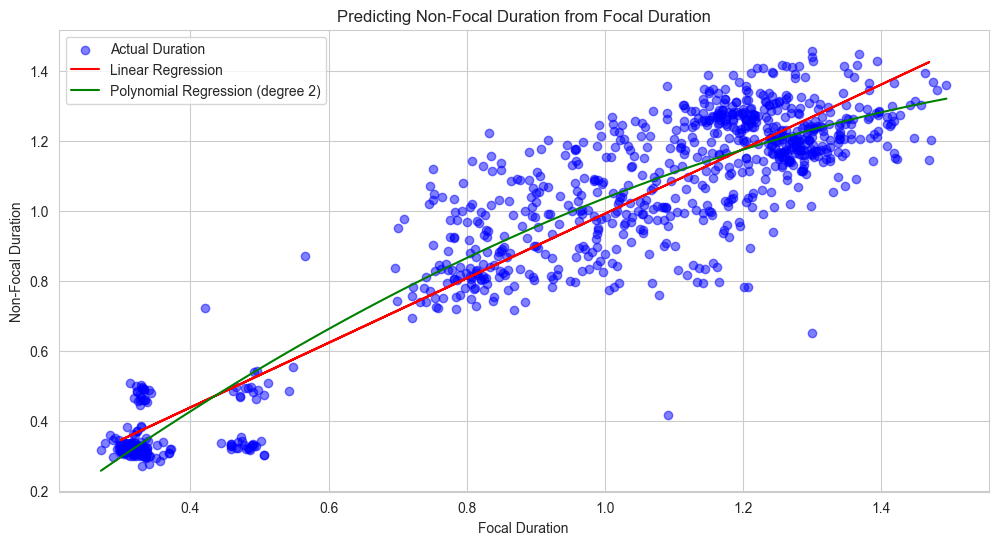

In [17]:
vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                              ['overlap_pair',
                                               'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'],
                                              symmetric_duration_exchanges)

# vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
#                                       ['overlap_pair',
#                     'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])


df = pd.DataFrame({
    "Duration": [vec[-2] for vec in vectors],  # Second to last value
    "Duration_of_pair": [vec[-1] for vec in vectors]  # Last value
})
linear_pred(df, "Duration", "Duration_of_pair")

### CI vs CB exploration

Pearson correlation between CI and CB: 0.22769545591172566
Spearman correlation between CI and CB: 0.25393263313197467


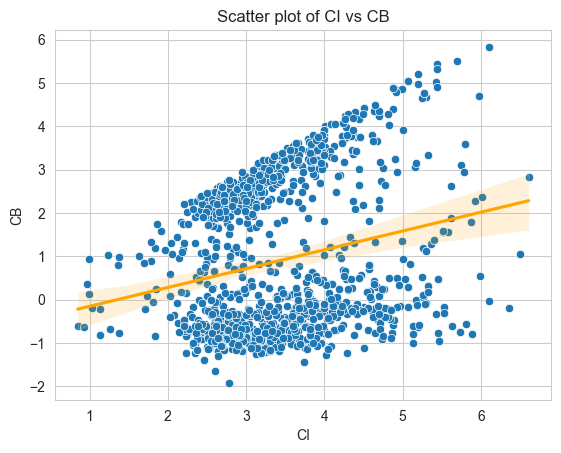

In [33]:
coda_df_clean = coda_df.dropna(subset=['CI', 'CB'])
# coda_df_clean = coda_df_clean[coda_df_clean['CB']<0]

# Pearson correlation
pearson_corr, _ = pearsonr(coda_df_clean['CI'], coda_df_clean['CB'])
print(f"Pearson correlation between CI and CB: {pearson_corr}")

# Spearman correlation
spearman_corr, _ = spearmanr(coda_df_clean['CI'], coda_df_clean['CB'])
print(f"Spearman correlation between CI and CB: {spearman_corr}")

# Scatter plot to visualize the relationship
sns.scatterplot(x=coda_df_clean['CI'], y=coda_df_clean['CB'])
sns.regplot(x='CI', y='CB', data=coda_df_clean, scatter=False, color='orange', ci=100)
plt.title('Scatter plot of CI vs CB')
plt.xlabel('CI')
plt.ylabel('CB')
plt.show()

In [48]:
len(coda_df[coda_df['CI'].notna() & (coda_df['CB'].notna())])

1145

In [49]:
print(coda_df[coda_df['pair_category'] == 'overlap_pair'].shape[0])
print(coda_df[coda_df['pair_category'] == 'non_overlap_pair'].shape[0])
print(coda_df[coda_df['pair_category'] == 'reverse_overlap_pair'].shape[0])
print(coda_df[coda_df['pair_category'] == 'reverse_non_overlap_pair'].shape[0])

340
412
316
440


C:\Users\Maor\AppData\Local\Temp\ipykernel_24796\2062548711.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)


623


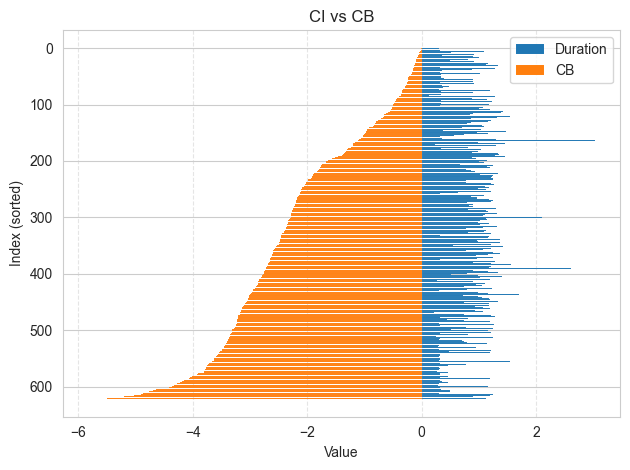

In [118]:
filtered_df = coda_df[(coda_df['CB'] < 6) & (coda_df['CB'] > 0) & (coda_df['CB'].notna()) & (coda_df['CI'].notna())]
filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)
df_standardized = filtered_df.copy()

ci_cb_pairs = np.array(df_standardized[['Duration', 'CB']])
print(len(ci_cb_pairs))

label1 = 'Duration'
label2 = 'CB'

data = ci_cb_pairs
pairs = np.vstack(data)
sorted_pairs = pairs[np.argsort(pairs[:, 1])]

column1 = sorted_pairs[:, 0]
column2 = sorted_pairs[:, 1]

y_positions = np.arange(len(sorted_pairs))

plt.barh(y_positions, column1, label=label1, linewidth=0.02)
plt.barh(y_positions, -column2, label=label2, linewidth=0.02)

# Plot the smooth lines connecting the edges of each column
# plt.plot(column1, np.arange(len(column1)), color='orange', lw=2)
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Index (sorted)')
plt.title('CI vs CB')

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\3216351994.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)


524


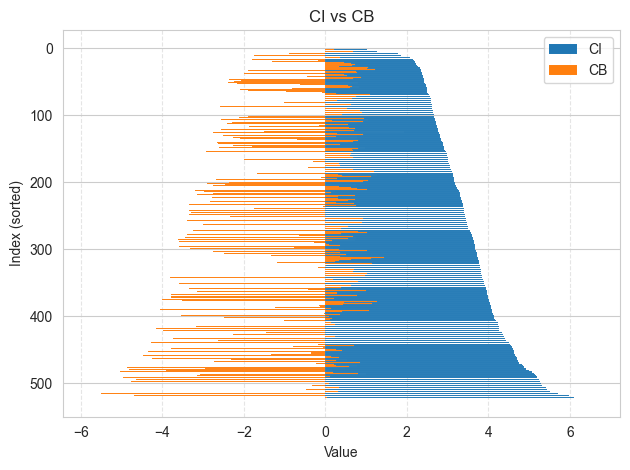

In [59]:
filtered_df = coda_df[(coda_df['matched']==False) & (coda_df['CB'].notna()) & (coda_df['CI'].notna())]
filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)
df_standardized = filtered_df.copy()

ci_cb_pairs = np.array(df_standardized[['CI', 'CB']])
print(len(ci_cb_pairs))

label1 = 'CI'
label2 = 'CB'

data = ci_cb_pairs
pairs = np.vstack(data)
sorted_pairs = pairs[np.argsort(pairs[:, 0])]

column1 = sorted_pairs[:, 0]
column2 = sorted_pairs[:, 1]

y_positions = np.arange(len(sorted_pairs))

plt.barh(y_positions, column1, label=label1, linewidth=0.02)
plt.barh(y_positions, -column2, label=label2, linewidth=0.02)

# Plot the smooth lines connecting the edges of each column
# plt.plot(column1, np.arange(len(column1)), color='orange', lw=2)
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Index (sorted)')
plt.title('CI vs CB')

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

C:\Users\Maor\AppData\Local\Temp\ipykernel_24796\1107341400.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)
C:\Users\Maor\AppData\Local\Temp\ipykernel_24796\1107341400.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  coda_df_clean['pair_category'] = label_encoder_1.fit_transform(coda_df_clean['pair_category'])
C:\Users\Maor\AppData\Local\Temp\ipykernel_24796\1107341400.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy

F-test results for each feature:
          Feature   F_score p_value
5   pair_category  0.687915    None
2              CI  0.402263    None
0        Duration  0.290253    None
8            ICI2  0.280963    None
10           ICI4  0.272453    None
9            ICI3  0.224658    None
7            ICI1  0.211516    None
4            Name  0.070595    None
3         nClicks  0.013868    None
14           ICI8  0.011073    None
13           ICI7  0.010356    None
11           ICI5  0.006284    None
16          ICI10  0.003794    None
15           ICI9  0.003679    None
12           ICI6  0.001518    None
6         matched  0.000000    None
1           Focal  0.000000    None


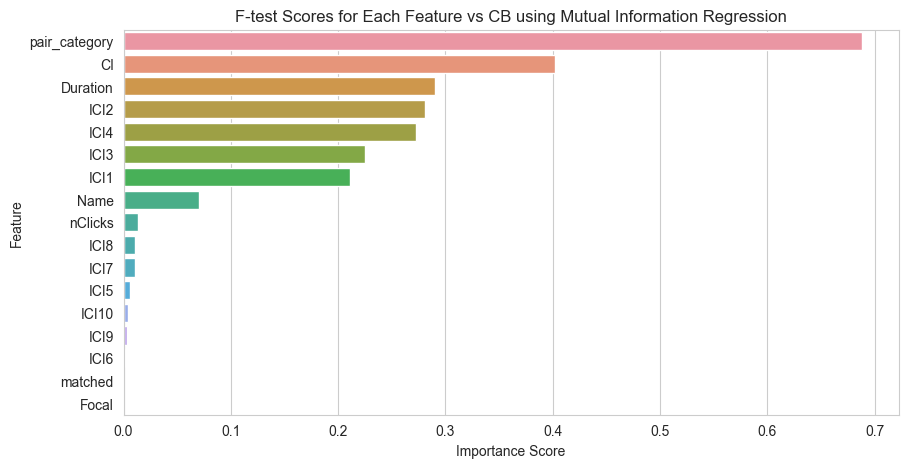

In [109]:
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_regression
from sklearn.preprocessing import LabelEncoder, StandardScaler

filtered_df = coda_df.dropna(subset=['CI', 'CB'])
# filtered_df = filtered_df[filtered_df['CB']]
filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)
col_to_keep = ['Duration', 'Focal', 'CI', 'CB', 'nClicks', 'Name', 'pair_category', 'matched'] + ici_columns
coda_df_clean = filtered_df[col_to_keep]

label_encoder_1 = LabelEncoder()
# label_encoder_2 = LabelEncoder()
label_encoder_3 = LabelEncoder()
coda_df_clean['pair_category'] = label_encoder_1.fit_transform(coda_df_clean['pair_category'])
# coda_df_clean['guy_coda_type'] = label_encoder_2.fit_transform(coda_df_clean['guy_coda_type'])
coda_df_clean['Name'] = label_encoder_3.fit_transform(coda_df_clean['Name'])

numeric_cols = ['Duration', 'CI', 'CB'] + ici_columns

scaler = StandardScaler()
df_standardized = coda_df_clean.copy()
df_standardized[numeric_cols] = scaler.fit_transform(df_standardized[numeric_cols])

X_std = df_standardized.drop(columns=['CB'])
y_std = df_standardized['CB']
selector_std = SelectKBest(score_func=mutual_info_regression, k='all')
selector_std.fit(X_std, y_std)

feature_scores = pd.DataFrame({
    'Feature': X_std.columns,
    'F_score': selector_std.scores_,
    'p_value': selector_std.pvalues_
}).sort_values(by='F_score', ascending=False)

print("F-test results for each feature:")
print(feature_scores)

plt.figure(figsize=(10, 5))
sns.barplot(x=feature_scores['F_score'], y=feature_scores['Feature'])
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.title("F-test Scores for Each Feature vs CB using Mutual Information Regression")
plt.show()

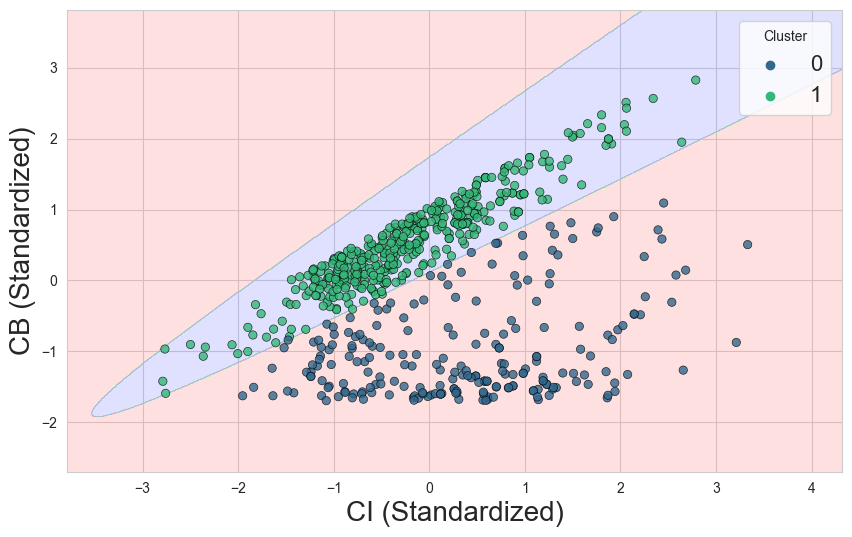

In [106]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler
from matplotlib.colors import ListedColormap

# filtered_df = coda_df.dropna(subset=['CI', 'CB'])
# filtered_df = filtered_df[filtered_df['CB']>0]
# filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)
col_to_keep = ['Duration', 'Focal', 'CI', 'CB', 'nClicks', 'Name', 'pair_category'] + ici_columns
# coda_df_clean = filtered_df[col_to_keep]
coda_df_clean = coda_df

# Load CI vs CB data
filtered_df = coda_df.dropna(subset=['CI', 'CB'])
filtered_df = filtered_df[filtered_df['CB'] > 0]
filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)
X = filtered_df[['CI', 'CB']].values

# Standardize data (important for GMM)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit GMM with hard assignment
n_clusters = 2  # Adjust based on data
gmm = GaussianMixture(n_components=n_clusters, covariance_type='full', random_state=42)
gmm.fit(X_scaled)

# Assign hard clusters (argmax of probabilities)
clusters = gmm.predict(X_scaled)
coda_df_clean['Cluster'] = -1
coda_df_clean.loc[
    (coda_df_clean['CB'] > 0) & (coda_df_clean['CB'].notna()) & (coda_df_clean['CI'].notna()), 'Cluster'] = clusters


# Define a function to plot decision boundaries
def plot_gmm_boundaries(X, gmm, ax):
    """Plots decision boundaries for a fitted GMM model."""
    h = 0.01  # Mesh step size
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))

    Z = gmm.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    cmap = ListedColormap(['#FF9999', '#99FF99', '#9999FF'])  # Color per cluster
    ax.contourf(xx, yy, Z, cmap=cmap, alpha=0.3)


# Plot clusters and decision regions
fig, ax = plt.subplots(figsize=(10, 6))
plot_gmm_boundaries(X_scaled, gmm, ax)
sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=
coda_df_clean[(coda_df_clean['CB'] > 0) & (coda_df_clean['CB'].notna()) & (coda_df_clean['CI'].notna())]['Cluster'],
                palette='viridis', alpha=0.8, edgecolor='k')
ax.set_xlabel("CI (Standardized)", fontsize=20)
ax.set_ylabel("CB (Standardized)", fontsize=20)
# ax.set_title("GMM Hard Assignment Clustering (Non-Overlapping)")
plt.legend(title="Cluster", fontsize=16)
plt.show()

C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


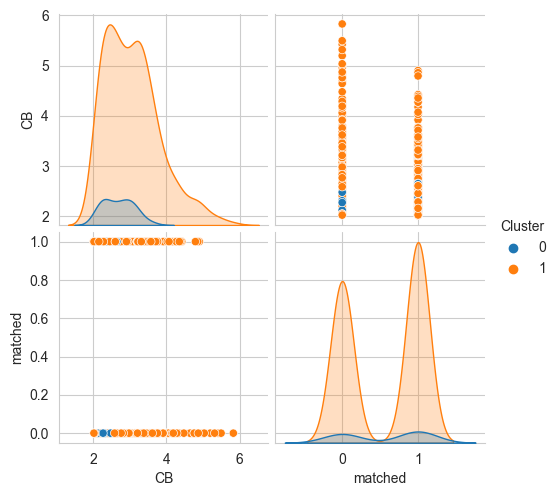

In [98]:
# 1. Create a copy of the DataFrame
coda_df_filtered = coda_df_clean.dropna(subset=['matched']).copy()
coda_df_filtered = coda_df_filtered[coda_df_filtered['CB'] > 2]
coda_df_filtered = coda_df_filtered[coda_df_filtered['Cluster'] >= 0]
# 2. Convert the boolean 'matched' column to integer (0s and 1s)
#    True becomes 1, False becomes 0
coda_df_filtered['matched'] = coda_df_filtered['matched'].astype(int)

# 3. Create the pairplot using the modified DataFrame
#    Now 'matched' is treated as a numerical variable (0 or 1)
sns.pairplot(coda_df_filtered, hue='Cluster', vars=['CB', 'matched'])

# Display the plot
plt.show()


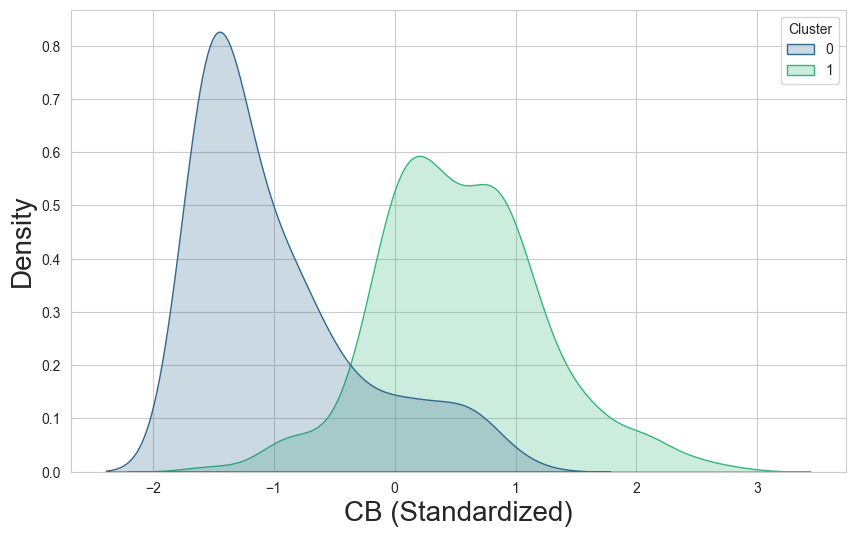

In [84]:
# Separate the data based on the 'Cluster' column
coda_df_filtered_ = coda_df_filtered[coda_df_filtered['CB']>0]
# cb_cluster_0 = coda_df_filtered[coda_df_filtered_['Cluster'] == 0]['CB']
# cb_cluster_1 = coda_df_filtered[coda_df_filtered_['Cluster'] == 1]['CB']

scaler = StandardScaler()
# Reshape the column to be a 2D array as required by StandardScaler
coda_df_filtered['cb_scaled'] = scaler.fit_transform(coda_df_filtered_[['CB']])
# --- End of StandardScaler application ---



fig, ax = plt.subplots(figsize=(10, 6))
sns.kdeplot(data=coda_df_filtered, x='cb_scaled', hue='Cluster', fill=True, common_norm=False, palette='viridis')

ax.set_xlabel("CB (Standardized)", fontsize=20)
ax.set_ylabel("Density", fontsize=20)
# ax.set_title("GMM Hard Assignment Clustering (Non-Overlapping)")
# plt.legend(title="Cluster", fontsize=16)
plt.show()



In [64]:
len(coda_df_filtered[(coda_df_filtered['Cluster'] == 1) & (coda_df_filtered['CB'] > 2)])

354

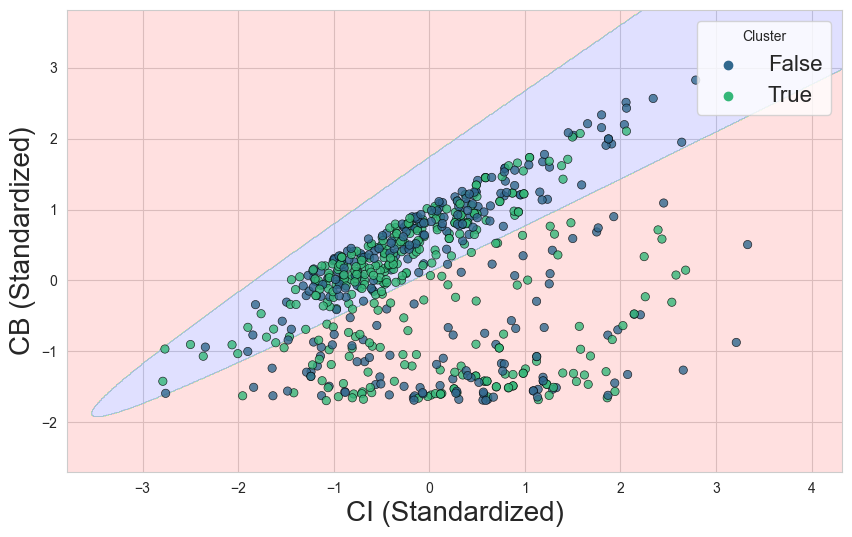

In [72]:
fig, ax = plt.subplots(figsize=(10, 6))
plot_gmm_boundaries(X_scaled, gmm, ax)
sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=
coda_df_clean[(coda_df_clean['CB'] > 0) & (coda_df_clean['CB'].notna()) & (coda_df_clean['CI'].notna())]['matched'],
                palette='viridis', alpha=0.8, edgecolor='k')
ax.set_xlabel("CI (Standardized)", fontsize=20)
ax.set_ylabel("CB (Standardized)", fontsize=20)
# ax.set_title("GMM Hard Assignment Clustering (Non-Overlapping)")
plt.legend(title="Cluster", fontsize=16)
plt.show()

In [100]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score, classification_report

features = coda_df_clean.drop(columns=['CB', 'Cluster'])
target = coda_df_clean['Cluster']

# Step 1: Feature Importance (SelectKBest with ANOVA F-test)
selector = SelectKBest(score_func=f_classif, k='all')  # Test all features
selector.fit(features, target)
feature_scores = pd.DataFrame({'Feature': features.columns, 'F-Score': selector.scores_})
feature_scores = feature_scores.sort_values(by='F-Score', ascending=False)

# Step 4: Plot Feature Importance as Heatmap
plt.figure(figsize=(8, 5))
sns.barplot(x='F-Score', y='Feature', data=feature_scores, palette="viridis")
plt.title("Feature Importance for Cluster Prediction (Excluding CB)")
plt.xlabel("F-Score (Importance)")
plt.ylabel("Features")
plt.show()

ValueError: could not convert string to float: 'sw061b001_124'

C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


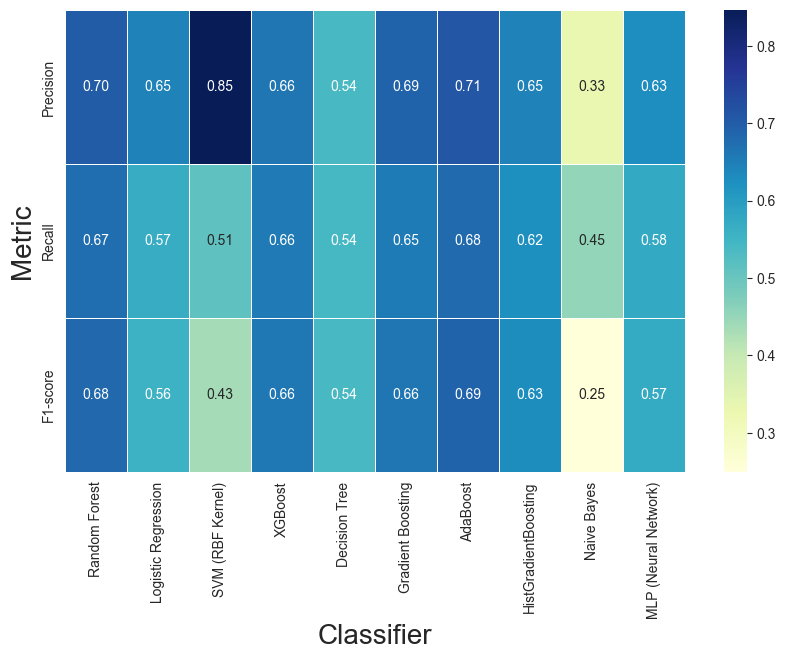

In [108]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, HistGradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier

col_to_keep = ['Duration', 'Focal', 'CI', 'CB', 'nClicks', 'Name', 'pair_category', 'Cluster'] + ici_columns
coda_df_features = coda_df_clean[col_to_keep]
coda_df_features = coda_df_features.dropna(subset=['CI', 'CB'])
coda_df_features = coda_df_features[coda_df_features['CB'] > 0]
coda_df_features['nClicks'] = coda_df_features['nClicks'].clip(upper=10)
label_encoder_1 = LabelEncoder()
label_encoder_3 = LabelEncoder()
coda_df_features['pair_category'] = label_encoder_1.fit_transform(coda_df_features['pair_category'])
coda_df_features['Name'] = label_encoder_3.fit_transform(coda_df_features['Name'])

features = coda_df_features.drop(columns=['CB', 'Cluster'])
target = coda_df_features['Cluster']

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

classifiers = {
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42),
    "Logistic Regression": LogisticRegression(max_iter=1000, random_state=42),
    "SVM (RBF Kernel)": SVC(kernel='rbf', C=1, gamma='scale'),
    "XGBoost": XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
    "Decision Tree": DecisionTreeClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42),
    "AdaBoost": AdaBoostClassifier(n_estimators=100, random_state=42),
    "HistGradientBoosting": HistGradientBoostingClassifier(random_state=42),
    "Naive Bayes": GaussianNB(),
    "MLP (Neural Network)": MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
}

# Initialize dictionary to store classification report results
classification_reports = {}

# Train and get classification report for each classifier
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)  # Train
    y_pred = clf.predict(X_test)  # Predict
    report = classification_report(y_test, y_pred, output_dict=True)  # Generate report as dict
    classification_reports[name] = report

# Convert the classification reports to a DataFrame
report_df = {}
for classifier, report in classification_reports.items():
    report_df[classifier] = {
        "Precision": report['macro avg']['precision'],
        "Recall": report['macro avg']['recall'],
        "F1-score": report['macro avg']['f1-score']
    }

# Create a DataFrame from the reports
report_df = pd.DataFrame(report_df)

# Plot the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(report_df, annot=True, cmap="YlGnBu", fmt='.2f', cbar=True, linewidths=0.5)
# plt.title("Classifier Performance (Precision, Recall, F1-Score)")
ax.tick_params(axis='both', which='major', labelsize=16) # Set tick label size here

plt.ylabel("Metric", fontsize=20)
plt.xlabel("Classifier", fontsize=20)
plt.show()

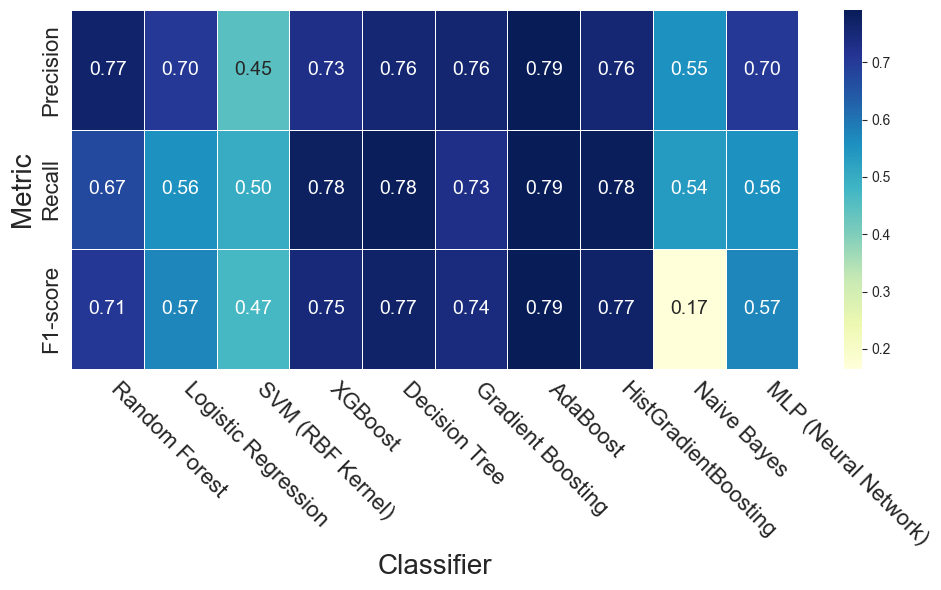

In [102]:
# Plot the heatmap
plt.figure(figsize=(10, 6))
ax = sns.heatmap(report_df, annot=True, cmap="YlGnBu", fmt='.2f', cbar=True, linewidths=0.5, annot_kws={'size': 14})
# plt.title("Classifier Performance (Precision, Recall, F1-Score)")
ax.tick_params(axis='both', which='major', labelsize=16) # Set tick label size here
current_xticklabels = ax.get_xticklabels()
# Set the labels with a rotation angle (e.g., 45 degrees) and adjust alignment
ax.set_xticklabels(current_xticklabels, rotation=-45, ha='left')
plt.ylabel("Metric", fontsize=20)
plt.xlabel("Classifier", fontsize=20)
plt.tight_layout()
plt.show()

Pearson correlation between Focal CI and non-focal CB: 0.9376362055807115
Spearman correlation between Focal CI and non-focal CB: 0.9173202332514578


NameError: name 'linear_pred_ci_cb' is not defined

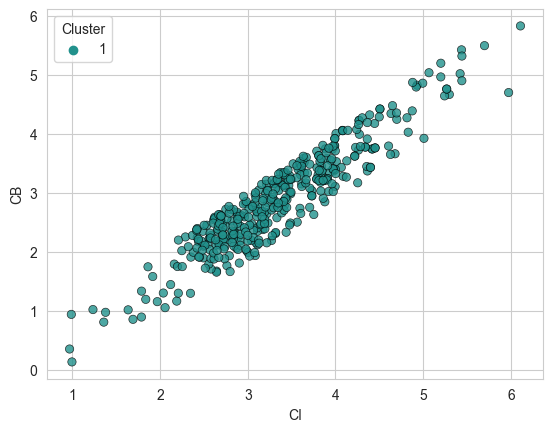

In [103]:
df_cluster_1 = coda_df_clean[coda_df_clean['Cluster'] == 1]
sns.scatterplot(x=df_cluster_1['CI'], y=df_cluster_1['CB'], hue=df_cluster_1['Cluster'], palette='viridis', alpha=0.8,
                edgecolor='k')

pearson_corr, _ = pearsonr(df_cluster_1['CI'], df_cluster_1['CB'])
print(f"Pearson correlation between Focal CI and non-focal CB: {pearson_corr}")
spearman_corr, _ = spearmanr(df_cluster_1['CI'], df_cluster_1['CB'])
print(f"Spearman correlation between Focal CI and non-focal CB: {spearman_corr}")

linear_pred_ci_cb(df_cluster_1['CI'], df_cluster_1['CB'])

In [59]:
def linear_pred_ci_cb(ci_col, cb_col):
    X = np.array(ci_col).reshape(-1, 1)
    y = cb_col

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize a simple linear regression model
    linear_reg = LinearRegression()
    linear_reg.fit(X_train, y_train)

    # Predict CB using linear regression
    y_pred_linear = linear_reg.predict(X_test)

    # Evaluate linear regression model
    mse_linear = mean_squared_error(y_test, y_pred_linear)
    r2_linear = r2_score(y_test, y_pred_linear)

    # Initialize a polynomial regression model (degree 3)
    poly_reg = make_pipeline(PolynomialFeatures(degree=3), LinearRegression())
    poly_reg.fit(X_train, y_train)

    # Predict CB using polynomial regression
    y_pred_poly = poly_reg.predict(X_test)

    # Evaluate polynomial regression model
    mse_poly = mean_squared_error(y_test, y_pred_poly)
    r2_poly = r2_score(y_test, y_pred_poly)

    print(f"Linear Regression - MSE: {mse_linear:.2f}, R²: {r2_linear:.2f}")
    print(f"Polynomial Regression - MSE: {mse_poly:.2f}, R²: {r2_poly:.2f}")

    plt.figure(figsize=(12, 6))
    plt.scatter(X, y, color='blue', alpha=0.5, label=f'CB')
    plt.plot(X_test, y_pred_linear, color='red', label='Linear Regression')
    x_range = np.linspace(X.min(), X.max(), 100).reshape(-1, 1)
    plt.plot(x_range, poly_reg.predict(x_range), color='green', label='Polynomial Regression (degree 3)')
    plt.title(f'Predicting Non-Focal CB from Focal CI')
    plt.xlabel(f'Signal CI')
    plt.ylabel(f'Response CB')
    plt.legend()
    plt.show()

In [1209]:
coda_df_clean

,Tag,TsTo,Duration,guy_coda_type,Focal,past_codas,codas_history,CI,CB,overlap_pair,...,IPI34,IPI35,IPI36,IPI37,IPI38,IPI39,IPI40,decision_tree_coda_type,pair_category,Cluster
0,sw061b,126.0372,0.927792,10i,1.0,[],[],1.360608,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10i,None,-1
1,sw061b,128.3256,1.092992,10i,1.0,[0],[0],2.329008,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,10i,None,-1
2,sw061b,131.7476,0.898250,1+1+3,1.0,"[1, 0]","[1, 0]",2.941850,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1+1+3,None,-1
3,sw061b,135.5877,0.865575,1+1+3,1.0,"[2, 1, 0]","[2, 1, 0]",3.068425,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1+1+3,None,-1
4,sw061b,139.5217,0.858317,1+1+3,1.0,"[3, 2, 1, 0]","[3, 2, 1, 0]",2.408083,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1+1+3,None,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3928,sw134a,423.7553,0.810248,1+1+3,0.0,"[3927, 3926, 3925, 3924]","[3927, 3926, 3925, 3924]",NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1+1+3,None,-1
3929,sw134a,429.3604,0.301578,5R1,0.0,"[3928, 3927, 3926, 3925, 3924]","[3928, 3927, 3926, 3925, 3924]",NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5R1,None,-1
3930,sw134a,463.0126,0.324174,5R1,0.0,[],[],4.518726,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5R1,None,-1
3931,sw134a,467.8555,0.333435,5R1,0.0,[3930],[3930],3.860265,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5R1,None,-1


In [1183]:
len(ci_cb_vectors)

723

Pearson correlation between Focal CI and non-focal CB: 0.25251923264474274
Spearman correlation between Focal CI and non-focal CB: 0.2895558639489056
Linear Regression - MSE: 1.45, R²: 0.11
Polynomial Regression - MSE: 1.47, R²: 0.10


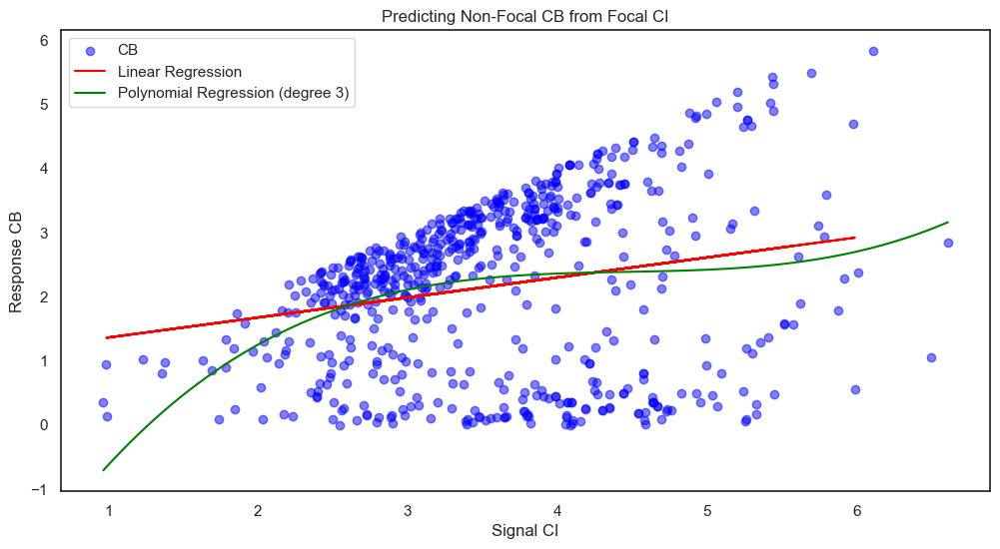

In [1222]:
df_checl = coda_df_clean[coda_df_clean['pair_category'].isin(['non_overlap_pair', 'reverse_non_overlap_pair'])].dropna(
    subset=['CI', 'CB'])
pearson_corr, _ = pearsonr(df_checl['CI'], df_checl['CB'])
print(f"Pearson correlation between Focal CI and non-focal CB: {pearson_corr}")
spearman_corr, _ = spearmanr(df_checl['CI'], df_checl['CB'])
print(f"Spearman correlation between Focal CI and non-focal CB: {spearman_corr}")

linear_pred_ci_cb(df_checl['CI'], df_checl['CB'])

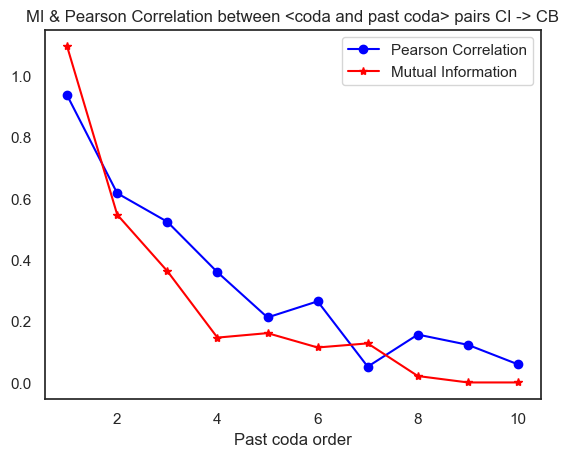

In [489]:
ci_cb_vectors = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 1)
ci_cb_vectors = [vec for vec in ci_cb_vectors if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]
plot_correlation_and_mi(ci_cb_vectors, range(1, 11), 'CI -> CB')

In [86]:
def get_pairs_by_idx(vectors, order):
    return [(vec[-order - 1], vec[-1]) for vec in vectors if len(vec) >= order + 1]


sequence_length_options = list(range(2, 12))


def plot_correlation_and_mi(vectors, sequence_options, feature_name):
    pearson_corrs = []
    mis = []
    seqs = []
    for seq in sequence_options:
        pairs = get_pairs_by_idx(vectors, seq)
        if len(pairs) == 0:
            continue

        first = list(map(lambda x: x[0], pairs))
        second = list(map(lambda x: x[1], pairs))
        # print(f"len pairs={len(pairs)}, len(first)={len(first)}, len(second)={len(second)}")

        pearson_corr, _ = pearsonr(first, second)
        pearson_corrs.append(pearson_corr)

        mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
        mis.append(mi)
        seqs.append(seq)
        #print(f"seq={seq}, pearson correlation={pearson_corr}")
        #print(f"seq={seq}, mi ={mi}")

    plt.plot(seqs, pearson_corrs, marker='o', color='blue', label='Pearson Correlation')
    plt.plot(seqs, mis, marker='*', color='red', label='Mutual Information')
    plt.xlabel('Past coda order')
    plt.title(f"MI & Pearson Correlation between <coda and past coda> pairs {feature_name}")
    plt.legend(loc='best')
    plt.show()

In [710]:
ci_cb_vectors = [vec for vec in ci_cb_vectors if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]

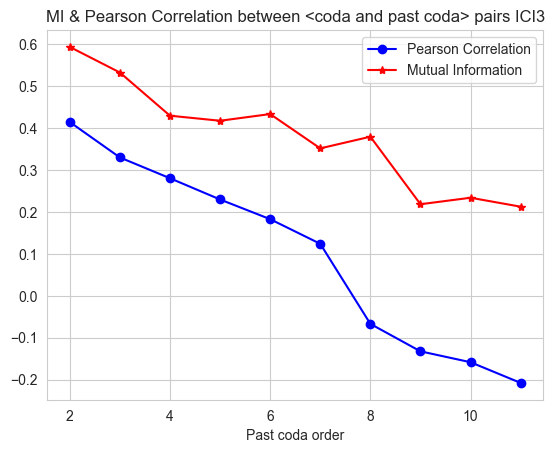

In [87]:
# ici2_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
#                                       ['overlap_pair',
#                     'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
# ici2_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
#                                       ['overlap_pair',
#                     'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'], symmetric_duration_exchanges)
# ci_cb_vectors = get_vectors_ci_cb(coda_df.reset_index(drop=True), 'past_codas', [
#     'overlap_pair', 'reverse_non_overlap_pair'])
# ci_cb_vectors = [vec for vec in ci_cb_vectors if len(vec) >= 2]
ici3_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI3', 'past_codas',
                                                   ['overlap_pair',
                                                    'non_overlap_pair', 'reverse_overlap_pair',
                                                    'reverse_non_overlap_pair'], symmetric_duration_exchanges)

# plot_correlation_and_mi(ici2_vectors, sequence_length_options, 'ICI2')
# plot_correlation_and_mi(ici2_vectors, sequence_length_options, 'ICI2')
# plot_correlation_and_mi(duration_vectors, sequence_length_options, 'Duration')
plot_correlation_and_mi(ici3_vectors, sequence_length_options, 'ICI3')

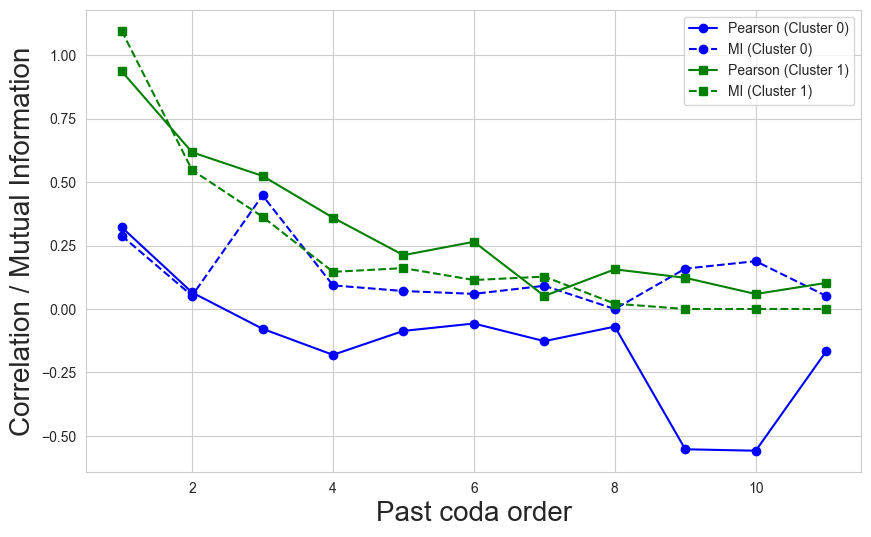

In [93]:
# ici1_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
#                                                    ['overlap_pair',
#                                                     'non_overlap_pair', 'reverse_overlap_pair',
#                                                     'reverse_non_overlap_pair'], symmetric_duration_exchanges)
# duration_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
#                                                    ['overlap_pair',
#                                                     'non_overlap_pair', 'reverse_overlap_pair',
#                                                     'reverse_non_overlap_pair'], symmetric_duration_exchanges)
# ici2_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
#                                                    ['overlap_pair',
#                                                     'non_overlap_pair', 'reverse_overlap_pair',
#                                                     'reverse_non_overlap_pair'], symmetric_duration_exchanges)

# ici1_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
#                                                    ['overlap_pair',
#                                                     'non_overlap_pair', 'reverse_overlap_pair',
#                                                     'reverse_non_overlap_pair'])
# duration_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
#                                                    ['overlap_pair',
#                                                     'non_overlap_pair', 'reverse_overlap_pair',
#                                                     'reverse_non_overlap_pair'])
# ici2_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
#                                                    ['overlap_pair',
#                                                     'non_overlap_pair', 'reverse_overlap_pair',
#                                                     'reverse_non_overlap_pair'])
vectors_1 = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 1)
vectors_1 = [vec for vec in vectors_1 if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]

vectors_0 = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 0)
vectors_0 = [vec for vec in vectors_0 if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]


vectors_list = [vectors_0, vectors_1]
feature_names = ["Cluster 0", "Cluster 1"]

plot_correlation_and_mi_multiple(vectors_list, list(range(1,12)), feature_names)

In [92]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.feature_selection import mutual_info_regression
from scipy.stats import pearsonr

def plot_correlation_and_mi_multiple(vectors_list, sequence_options, feature_names):
    plt.figure(figsize=(10, 6))
    
    colors = ['blue', 'green', 'orange']  # Adjust if more vectors
    markers = ['o', 's', 'D']  # Different markers for clarity

    for i, vectors in enumerate(vectors_list):
        pearson_corrs = []
        mis = []
        seqs = []
        
        for seq in sequence_options:
            pairs = get_pairs_by_idx(vectors, seq)
            if len(pairs) == 0:
                continue

            first = list(map(lambda x: x[0], pairs))
            second = list(map(lambda x: x[1], pairs))

            pearson_corr, _ = pearsonr(first, second)
            mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
            
            pearson_corrs.append(pearson_corr)
            mis.append(mi)
            seqs.append(seq)

        # Plot Pearson Correlation
        plt.plot(seqs, pearson_corrs, marker=markers[i], color=colors[i], linestyle='-', label=f'Pearson ({feature_names[i]})')
        # Plot Mutual Information
        plt.plot(seqs, mis, marker=markers[i], color=colors[i], linestyle='--', label=f'MI ({feature_names[i]})')

    plt.xlabel('Past coda order', fontsize=20)
    plt.ylabel('Correlation / Mutual Information', fontsize=20)
    # plt.title('MI & Pearson Correlation across Features - All Coda Pairs')
    plt.legend(loc='best')
    plt.grid(True)
    # plt.tight_layout()
    plt.show()


### duration vs CB exploration

C:\Users\Maor\AppData\Local\Temp\ipykernel_24796\491183561.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)


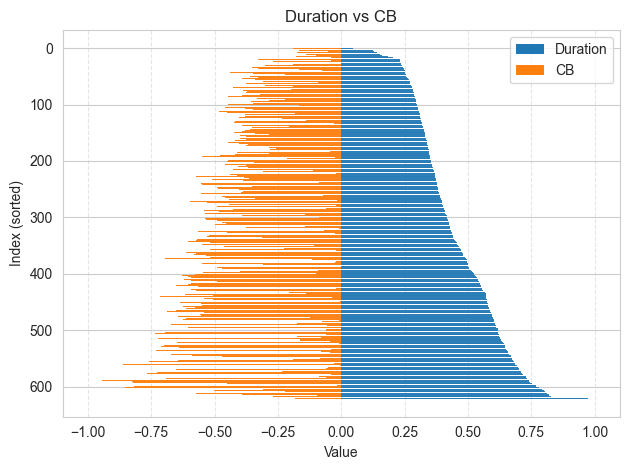

In [39]:
from sklearn.preprocessing import MinMaxScaler

filtered_df = coda_df[(coda_df['CB'] > 0) & (coda_df['CB'].notna()) & (coda_df['CI'].notna())]
filtered_df['nClicks'] = filtered_df['nClicks'].clip(upper=10)
df_standardized = filtered_df.copy()

numeric_cols = ['Duration', 'CI', 'CB', 'ScaledDuartionByCI'] + ici_columns
scaler = MinMaxScaler()
df_standardized = filtered_df.copy()
df_standardized['ScaledDuartionByCI'] = df_standardized['CI'] - df_standardized['Duration']
df_standardized[numeric_cols] = scaler.fit_transform(df_standardized[numeric_cols])

ci_cb_pairs = np.array(df_standardized[['ScaledDuartionByCI', 'CB']])

label1 = 'Duration'
label2 = 'CB'

data = ci_cb_pairs
pairs = np.vstack(data)
sorted_pairs = pairs[np.argsort(pairs[:, 0])]

column1 = sorted_pairs[:, 0]
column2 = sorted_pairs[:, 1]

y_positions = np.arange(len(sorted_pairs))

plt.barh(y_positions, column1, label=label1, linewidth=0.02)
plt.barh(y_positions, -column2, label=label2, linewidth=0.02)

# Plot the smooth lines connecting the edges of each column
# plt.plot(column1, np.arange(len(column1)), color='orange', lw=2)
plt.gca().invert_yaxis()

# Add labels and title
plt.xlabel('Value')
plt.ylabel('Index (sorted)')
plt.title('Duration vs CB')

plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

In [43]:
pearson_corr, _ = pearsonr(df_standardized['CB'], df_standardized['ScaledDuartionByCI'])
print(f"Pearson correlation between Focal CI and non-focal CB: {pearson_corr}")
spearman_corr, _ = spearmanr(df_standardized['CB'], df_standardized['ScaledDuartionByCI'])
print(f"Spearman correlation between Focal CI and non-focal CB: {spearman_corr}")



Pearson correlation between Focal CI and non-focal CB: -0.07919450505817627
Spearman correlation between Focal CI and non-focal CB: 0.2811642817242731


Linear Regression - MSE: 0.05, R²: 0.01
Polynomial Regression - MSE: 0.05, R²: 0.00


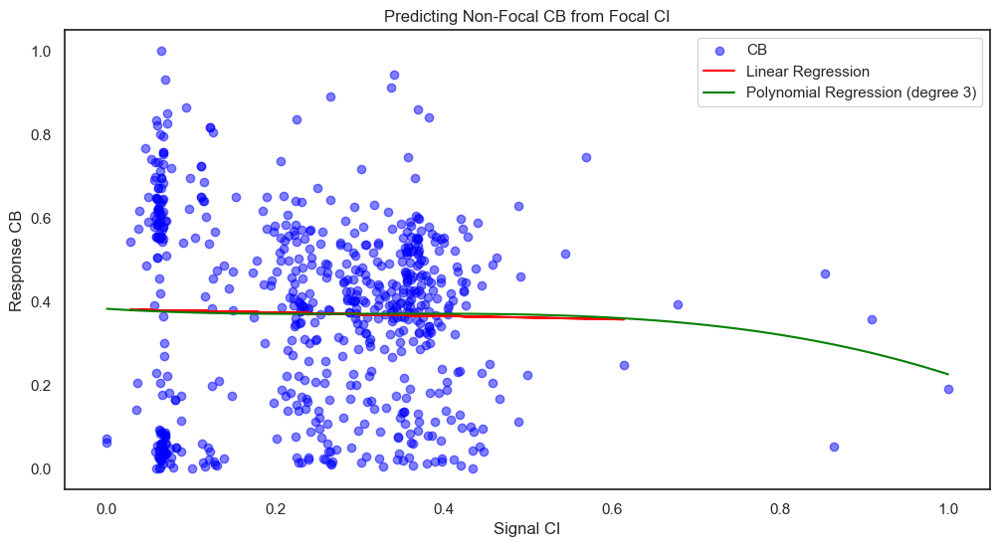

In [199]:
linear_pred_ci_cb(df_standardized['Duration'], df_standardized['CB'])


## LSTM pred

#### GPU init

In [143]:
print(f'PyTorch version: {torch.__version__}')
print('*' * 10)

# Check if GPU is available
torch.cuda.init()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f'Torch device available: {device}')
print(f'Available GPU devices: {torch.cuda.device_count()}')
print(f'Device Name: {torch.cuda.get_device_name()}')
print('*' * 10)

PyTorch version: 2.1.1+cu121
**********
Torch device available: cuda
Available GPU devices: 1
Device Name: NVIDIA GeForce RTX 3050 Ti Laptop GPU
**********


#### Model Architecture


In [146]:
class LSTMModel_ICI(nn.Module):
    def __init__(self, device, input_size, output_size, hidden_dim, num_layers, dropout_rate):
        super(LSTMModel_ICI, self).__init__()
        self.num_layers = num_layers
        self.hidden_dim = hidden_dim
        self.device = device

        self.lstm1 = nn.LSTM(input_size, hidden_dim, num_layers, batch_first=True, bidirectional=False)
        self.dropout1 = nn.Dropout(dropout_rate)
        self.fc1 = nn.Linear(hidden_dim, hidden_dim // 2)

        self.lstm2 = nn.LSTM(hidden_dim // 2, hidden_dim // 2, num_layers)
        self.dropout2 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim // 2, output_size)

    def forward(self, x):
        # Initialize hidden and cell states
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(self.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(self.device)

        # Forward propagation
        output, _ = self.lstm1(x, (h0, c0))
        output = output[:, -1, :]  # Get the last hidden state
        output = self.dropout1(output)
        output = self.fc1(output)

        output, _ = self.lstm2(output)
        output = self.dropout2(output)
        output = self.fc2(output)

        return output

In [147]:
def train_loop(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0.0
    total_mse = 0.0
    batch_count = 0

    for inputs, targets in dataloader:
        inputs, targets = inputs.to(device), targets.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(inputs.unsqueeze(1))
        loss = criterion(outputs, targets)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()
        total_loss += loss.item()

        # Compute MSE for the batch
        if targets.var(unbiased=False) != 0:
            batch_mse = F.mse_loss(outputs, targets).item()
            # batch_mse /= (targets.var(unbiased=False))
            total_mse += batch_mse
            batch_count += 1

    avg_mse = total_mse / batch_count if batch_count > 0 else 0
    avg_loss = total_loss / batch_count if batch_count > 0 else 0

    return avg_mse, avg_loss


def eval_loop(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0.0
    total_mse = 0.0
    batch_count = 0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs.unsqueeze(1))

            # Compute loss
            loss = criterion(outputs, targets)
            total_loss += loss.item()

            # Compute accuracy
            if targets.var(unbiased=False) != 0:
                batch_mse = F.mse_loss(outputs, targets).item()
                #batch_mse /= (targets.var(unbiased=False))
                total_mse += batch_mse
                batch_count += 1

    avg_mse = total_mse / batch_count if batch_count > 0 else 0
    avg_loss = total_loss / batch_count if batch_count > 0 else 0

    return avg_mse, avg_loss

#### Data preprocessing

In [27]:
def filter_vectors_by_size(vectors, size):
    return [vec[-size:] for vec in vectors if len(vec) >= size]

# sequence_length_options = list(range(2, 13))
# filtered_vectors_len_ici1 = [len(filter_vectors_by_size(ici1_vectors, s)) for s in sequence_length_options]
# print("Number of vectors after filtering: ", filtered_vectors_len_ici1)

In [149]:
def get_loaders(data):
    X, y = [], []
    np.random.seed(42)
    np.random.shuffle(data)

    for seq in data:
        X.append(seq[:-1])
        y.append(seq[-1])
    X = torch.tensor(X, dtype=torch.float32).to(device)
    y = torch.tensor(y, dtype=torch.float32).to(device).view(-1, 1)

    train_data = TensorDataset(X[:int(0.7 * len(X))].to(device), y[:int(0.7 * len(y))].to(device))
    val_data = TensorDataset(X[int(0.7 * len(X)):int(0.85 * len(X))].to(device),
                             y[int(0.7 * len(y)):int(0.85 * len(y))].to(device))
    test_data = TensorDataset(X[int(0.85 * len(X)):].to(device), y[int(0.85 * len(y)):].to(device))

    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader, X.shape[1]

In [150]:
batch_size = 16
hidden_dim = 64
lr = 0.001
num_layers = 2
num_epochs = 300
dropout_rate = 0.05

#### train

In [726]:
def train_lstm(vectors, num_epochs, label1, label2, limit_vectors=250, log=False):
    sequence_length_options = list(range(2, 12))
    mse_acc = []
    loss_acc = []

    for sequence_length in sequence_length_options:
        filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        train_loader, val_loader, test_loader, input_shape = get_loaders(filtered_vectors)
        model = LSTMModel_ICI(device, input_shape, 1, hidden_dim, num_layers, dropout_rate).to(device)
        criterion = nn.SmoothL1Loss()
        optimizer = optim.Adam(model.parameters(), lr=lr)

        # Training loop
        #train_mses = []
        #val_mses = []
        test_mses = []
        #val_losses = []
        #train_losses = []
        test_losses = []

        for epoch in range(num_epochs + 1):
            train_accuracy, train_loss = train_loop(train_loader, model, criterion, optimizer, device)
            val_accuracy, val_loss = eval_loop(val_loader, model, criterion, device)
            test_accuracy, test_loss = eval_loop(test_loader, model, criterion, device)

            #train_mses.append(train_accuracy)
            #val_mses.append(val_accuracy)
            test_mses.append(test_accuracy)
            #train_losses.append(train_loss)
            #val_losses.append(val_loss)
            test_losses.append(test_loss)

            if epoch % 50 == 0:
                if log: print(
                    f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy MSE: {train_accuracy:.4f}, Validation Accuracy MSE: {val_accuracy:.4f}, Test Accuracy MSE: {test_accuracy:.4f}")

        mse_acc.append(test_mses)
        loss_acc.append(test_losses)

    return mse_acc, loss_acc

In [151]:
def train_lstm_with_cross_validation(vectors, num_epochs, label1, label2, limit_vectors=250, log=False, n_splits=5):
    sequence_length_options = list(range(2, 12))
    mse_acc = []
    loss_acc = []

    # Set up K-fold cross-validation
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    for sequence_length in sequence_length_options:
        filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')

        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        # K-fold cross-validation
        fold_mses = []  # List to accumulate MSEs for each fold
        fold_losses = []  # List to accumulate MSEs for each fold

        for train_index, val_index in kf.split(filtered_vectors):
            # Split the dataset into train and validation based on indices
            train_data = [filtered_vectors[i] for i in train_index]
            val_data = [filtered_vectors[i] for i in val_index]

            # Prepare the train and validation loaders
            train_loader, val_loader, _, input_shape = get_loaders(train_data)
            _, _, test_loader, _ = get_loaders(val_data)  # You can decide to have separate test data

            model = LSTMModel_ICI(device, input_shape, 1, hidden_dim, num_layers, dropout_rate).to(device)
            criterion = nn.SmoothL1Loss()
            optimizer = optim.Adam(model.parameters(), lr=lr)

            # Training loop
            test_mses = []
            test_losses = []

            for epoch in range(num_epochs + 1):
                train_accuracy, train_loss = train_loop(train_loader, model, criterion, optimizer, device)
                val_accuracy, val_loss = eval_loop(val_loader, model, criterion, device)
                test_accuracy, test_loss = eval_loop(test_loader, model, criterion, device)

                test_mses.append(test_accuracy)
                test_losses.append(test_loss)

                if epoch % 50 == 0:
                    if log: print(
                        f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy MSE: {train_accuracy:.4f}, Validation Accuracy MSE: {val_accuracy:.4f}, Test Accuracy MSE: {test_accuracy:.4f}")

            fold_mses.append(np.mean(test_mses))
            fold_losses.append(np.mean(test_losses))

        mse_acc.append(np.mean(fold_mses))

    return mse_acc, loss_acc

In [31]:
def visualize_lstm(sequence_length_options, num_epochs, mse_acc, loss_acc, original_vectors, col_name_1, col_name_2):
    # mse_acc = [
    #     [tensor.detach().cpu() for tensor in inner_list]
    #     for inner_list in mse_acc]

    plt.figure(figsize=(10, 6))
    for i, sequence_length in enumerate(sequence_length_options):
        plt.plot(range(1, num_epochs + 1), mse_acc[i], label=f'Test Euclidean Distance, seq={sequence_length}')
    plt.xlabel('epoch')
    plt.ylabel('LSTM Euclidean Distance')
    plt.title(f'{col_name_1} Focal -> Non-Focal prediction using LSTM, per order')
    plt.legend()
    plt.show()

    colors = plt.cm.viridis(np.linspace(0, 1, len(sequence_length_options)))

    plt.figure(figsize=(10, 6))
    means = [np.mean(lst[-200:]) for lst in mse_acc]
    plt.scatter(sequence_length_options, means, color=colors, label='Average MSE')
    for i, mean in enumerate(means):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])

    plt.xlabel('sequence length')
    plt.ylabel('Average LSTM Euclidean Distance')
    plt.title(f'{col_name_1} Focal -> Non-Focal prediction using LSTM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    plt.figure(figsize=(10, 6))
    means = [np.mean(lst[-200:]) for lst in loss_acc]
    plt.scatter(sequence_length_options, means, color=colors, label='Average Loss')
    for i, mean in enumerate(means):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])

    plt.xlabel('sequence length')
    plt.ylabel('Average LSTM Loss')
    plt.title(f'{col_name_1} Focal -> Non-Focal prediction using LSTM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

In [162]:
def visualize_lstm_mse(sequence_length_options, mse_acc, col_name_1):
    colors = plt.cm.viridis(np.linspace(0, 1, len(sequence_length_options)))
    plt.figure(figsize=(10, 6))
    plt.scatter(sequence_length_options, mse_acc, color=colors, label='Average MSE')
    for i, mean in enumerate(mse_acc):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])
    plt.xlabel('sequence length')
    plt.ylabel('Average LSTM MSE')
    plt.title(f'{col_name_1} Focal -> Non-Focal prediction using LSTM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

In [218]:
def visualize_average_lstms(sequence_length_options, mse_acc, loss_acc, col_name_1):
    colors = plt.cm.viridis(np.linspace(0, 1, len(sequence_length_options)))

    plt.figure(figsize=(10, 6))
    means = []
    for i in range(len(mse_acc[0])):
        inner_values = []
        for k in range(len(mse_acc)):
            inner_values.extend([t.detach().item() for t in mse_acc[k][i][-100:]])
        means.append(sum(inner_values) / len(inner_values))
    plt.scatter(sequence_length_options, means, color=colors, label='Average MSE')
    for i, mean in enumerate(means):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])

    plt.xlabel('sequence length')
    plt.ylabel('Average LSTM MSE')
    plt.title(f'{col_name_1} Focal -> Non-Focal prediction using LSTM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    plt.figure(figsize=(10, 6))
    means = []
    for i in range(len(loss_acc[0])):
        inner_values = []
        for k in range(len(loss_acc)):
            inner_values.extend([t for t in loss_acc[k][i][-100:]])
        means.append(sum(inner_values) / len(inner_values))
    plt.scatter(sequence_length_options, means, color=colors, label='Average Loss')
    for i, mean in enumerate(means):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])
    plt.xlabel('sequence length')
    plt.ylabel('Average LSTM Loss')
    plt.title(f'{col_name_1} Focal -> Non-Focal prediction using LSTM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    mse_nested = list(itertools.chain(*mse_acc))
    mse_df = pd.DataFrame(
        [(num.detach().cpu().item(), sequence_length_options[seq % len(sequence_length_options)]) for seq, inner_list in
         enumerate(mse_nested) for num in
         inner_list],
        columns=['mse', 'seq']
    )
    f, ax = plt.subplots(figsize=(7, 6))
    sns.set_theme(style="white")
    sns.despine(bottom=True, left=True)
    sns.stripplot(
        data=mse_df, x="seq", y="mse", hue="seq",
        dodge=False, alpha=.25, zorder=1, legend=False)

    sns.pointplot(
        data=mse_df, x="seq", y="mse", hue="seq", palette="dark", errorbar=None, dodge=True,
        markers="d")
    ax.xaxis.grid(True)
    ax.set(ylabel="MSE")
    plt.show()

    loss_nested = list(itertools.chain(*loss_acc))
    loss_df = pd.DataFrame(
        [(num, sequence_length_options[seq % len(sequence_length_options)]) for seq, inner_list in
         enumerate(loss_nested) for num in
         inner_list],
        columns=['loss', 'seq']
    )
    f, ax = plt.subplots(figsize=(7, 6))
    sns.set_theme(style="white")
    sns.despine(bottom=True, left=True)
    sns.stripplot(
        data=loss_df, x="seq", y="loss", hue="seq",
        dodge=False, alpha=.25, zorder=1, legend=False)

    sns.pointplot(
        data=loss_df, x="seq", y="loss", hue="seq", palette="dark", errorbar=None, dodge=True,
        markers="d")
    ax.xaxis.grid(True)
    ax.set(ylabel="LOSS")
    plt.show()

In [219]:
def train_lstm_repeat(times, epochs, vectors, label1, label2, limit_vectors=250):
    mse_acc, loss_acc = [], []
    for i in range(times):
        print(f"Training LSTM loop #{i}")
        mse, loss = train_lstm(vectors, epochs, label1, label2, limit_vectors)
        mse_acc.append(mse)
        loss_acc.append(loss)

    return mse_acc, loss_acc

### ICI2

In [347]:
# ici2_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
#                                       ['overlap_pair',
#                     'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'], symmetric_duration_exchanges)

ici2_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
                                  ['overlap_pair',
                                   'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
len(ici2_vectors)

mse_acc, loss_acc = train_lstm(ici2_vectors, 300, "ICI2 Focal", "ICI2 Non-Focal", None, log=True)

ICI2 Focal ICI2 Non-Focal, Sequence length: 2, samples count: 1538
Epoch [1/300], Train Accuracy MSE: 0.0263, Validation Accuracy MSE: 0.0216, Test Accuracy MSE: 0.0202
Epoch [51/300], Train Accuracy MSE: 0.0089, Validation Accuracy MSE: 0.0079, Test Accuracy MSE: 0.0073
Epoch [101/300], Train Accuracy MSE: 0.0085, Validation Accuracy MSE: 0.0079, Test Accuracy MSE: 0.0068
Epoch [151/300], Train Accuracy MSE: 0.0082, Validation Accuracy MSE: 0.0083, Test Accuracy MSE: 0.0076
Epoch [201/300], Train Accuracy MSE: 0.0086, Validation Accuracy MSE: 0.0079, Test Accuracy MSE: 0.0070
Epoch [251/300], Train Accuracy MSE: 0.0082, Validation Accuracy MSE: 0.0077, Test Accuracy MSE: 0.0068
ICI2 Focal ICI2 Non-Focal, Sequence length: 3, samples count: 1317
Epoch [1/300], Train Accuracy MSE: 0.0202, Validation Accuracy MSE: 0.0190, Test Accuracy MSE: 0.0174
Epoch [51/300], Train Accuracy MSE: 0.0082, Validation Accuracy MSE: 0.0083, Test Accuracy MSE: 0.0074
Epoch [101/300], Train Accuracy MSE: 0.0

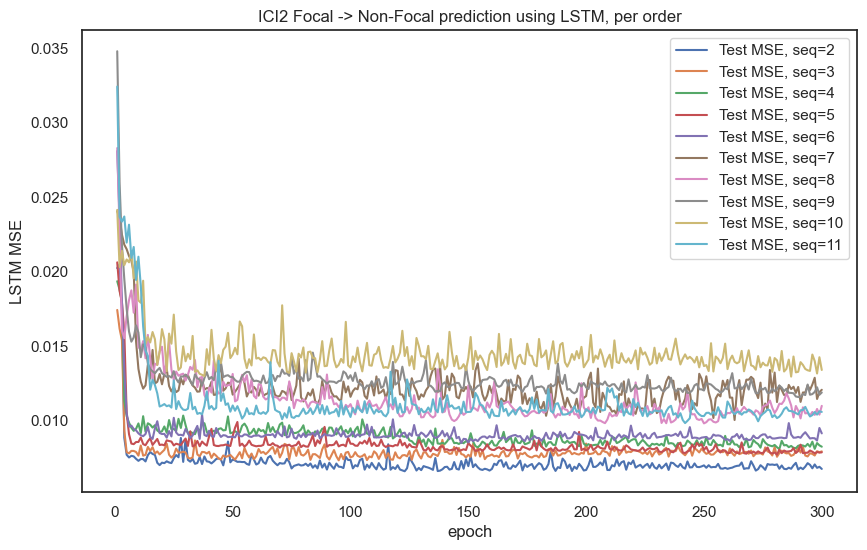

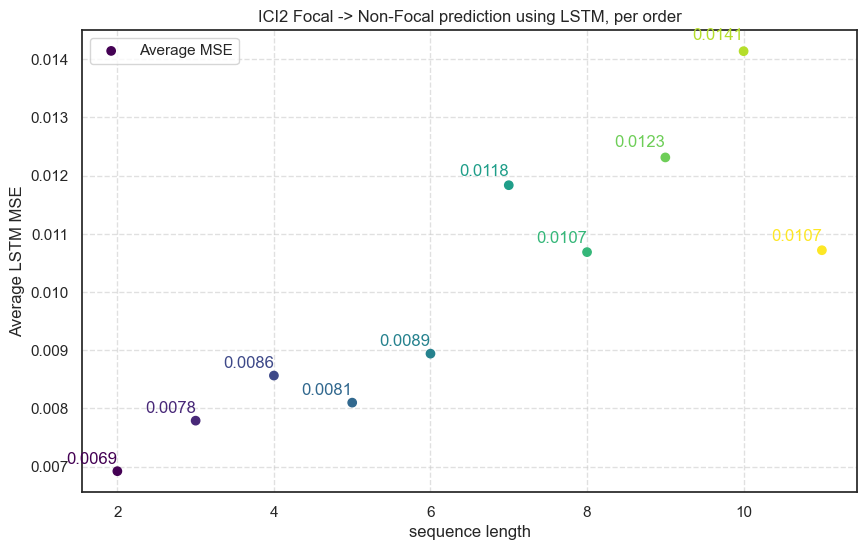

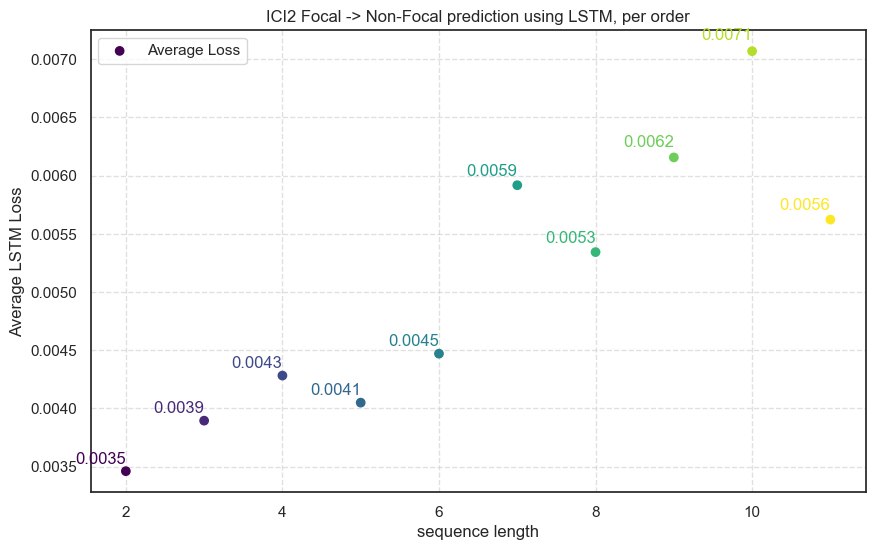

In [348]:
visualize_lstm(list(range(2, 12)), 300, mse_acc, loss_acc, ici2_vectors, 'ICI2', '')

### ICI1

#### cross validation - all pairs

In [164]:
ici1_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                  ['overlap_pair',
                                   'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
mse_acc, loss_acc = train_lstm_with_cross_validation(vectors=ici1_vectors, num_epochs=150, label1="ICI1 Focal",
                                                     label2="ICI1 Non-Focal", limit_vectors=None, log=False, n_splits=5)

ICI1 Focal ICI1 Non-Focal, Sequence length: 2, samples count: 1508
ICI1 Focal ICI1 Non-Focal, Sequence length: 3, samples count: 1191
ICI1 Focal ICI1 Non-Focal, Sequence length: 4, samples count: 937
ICI1 Focal ICI1 Non-Focal, Sequence length: 5, samples count: 756
ICI1 Focal ICI1 Non-Focal, Sequence length: 6, samples count: 608
ICI1 Focal ICI1 Non-Focal, Sequence length: 7, samples count: 493
ICI1 Focal ICI1 Non-Focal, Sequence length: 8, samples count: 397
ICI1 Focal ICI1 Non-Focal, Sequence length: 9, samples count: 319
ICI1 Focal ICI1 Non-Focal, Sequence length: 10, samples count: 268
ICI1 Focal ICI1 Non-Focal, Sequence length: 11, samples count: 227


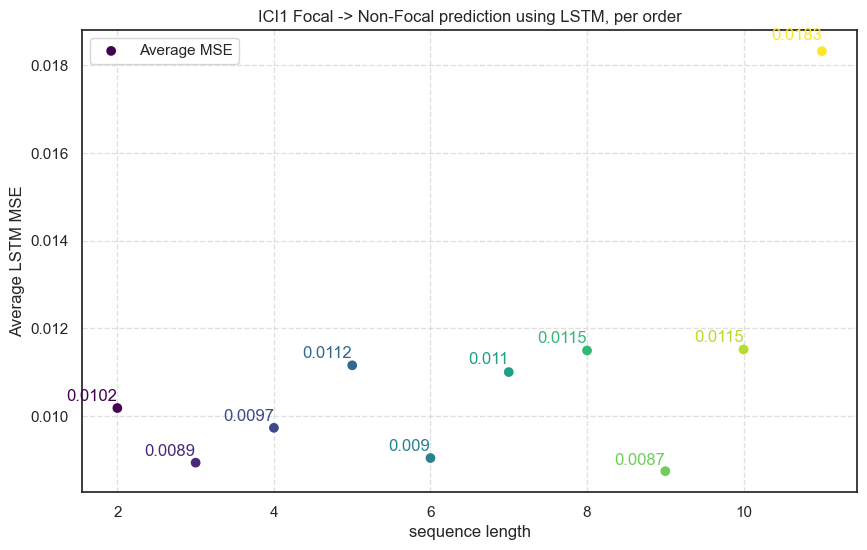

In [165]:
visualize_lstm_mse(list(range(2, 12)), mse_acc, 'ICI1')

#### cross-validation - symmetric pairs

In [166]:
ici1_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                                   ['overlap_pair',
                                                    'non_overlap_pair', 'reverse_overlap_pair',
                                                    'reverse_non_overlap_pair'], symmetric_duration_exchanges)
mse_acc, loss_acc = train_lstm_with_cross_validation(vectors=ici1_vectors, num_epochs=150, label1="ICI1 Focal",
                                                     label2="ICI1 Non-Focal", limit_vectors=None, log=False, n_splits=5)

ICI1 Focal ICI1 Non-Focal, Sequence length: 2, samples count: 958
ICI1 Focal ICI1 Non-Focal, Sequence length: 3, samples count: 763
ICI1 Focal ICI1 Non-Focal, Sequence length: 4, samples count: 602
ICI1 Focal ICI1 Non-Focal, Sequence length: 5, samples count: 485
ICI1 Focal ICI1 Non-Focal, Sequence length: 6, samples count: 389
ICI1 Focal ICI1 Non-Focal, Sequence length: 7, samples count: 320
ICI1 Focal ICI1 Non-Focal, Sequence length: 8, samples count: 259
ICI1 Focal ICI1 Non-Focal, Sequence length: 9, samples count: 215
ICI1 Focal ICI1 Non-Focal, Sequence length: 10, samples count: 185
ICI1 Focal ICI1 Non-Focal, Sequence length: 11, samples count: 154


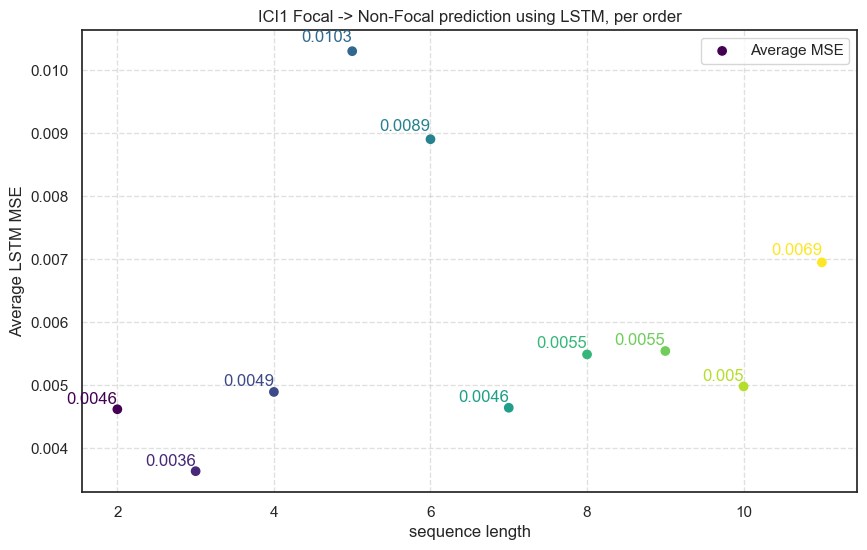

In [167]:
visualize_lstm_mse(list(range(2, 12)), mse_acc, 'ICI1')

In [168]:
np.sqrt(0.0036) / 0.32

0.1875

#### without cross validation

In [355]:
ici1_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                  ['overlap_pair',
                                   'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
mse_acc, loss_acc = train_lstm(ici1_vectors, 150, "ICI1 Focal", "ICI1 Non-Focal", 150, log=True)

ICI1 Focal ICI1 Non-Focal, Sequence length: 2, samples count: 1538
limited to samples count: 150
Epoch [1/150], Train Accuracy MSE: 0.0617, Validation Accuracy MSE: 0.0614, Test Accuracy MSE: 0.0608
Epoch [51/150], Train Accuracy MSE: 0.0092, Validation Accuracy MSE: 0.0068, Test Accuracy MSE: 0.0050
Epoch [101/150], Train Accuracy MSE: 0.0092, Validation Accuracy MSE: 0.0074, Test Accuracy MSE: 0.0055
ICI1 Focal ICI1 Non-Focal, Sequence length: 3, samples count: 1317
limited to samples count: 150
Epoch [1/150], Train Accuracy MSE: 0.0569, Validation Accuracy MSE: 0.0502, Test Accuracy MSE: 0.0588
Epoch [51/150], Train Accuracy MSE: 0.0109, Validation Accuracy MSE: 0.0036, Test Accuracy MSE: 0.0171
Epoch [101/150], Train Accuracy MSE: 0.0084, Validation Accuracy MSE: 0.0025, Test Accuracy MSE: 0.0162
ICI1 Focal ICI1 Non-Focal, Sequence length: 4, samples count: 1109
limited to samples count: 150
Epoch [1/150], Train Accuracy MSE: 0.1390, Validation Accuracy MSE: 0.1007, Test Accuracy M

In [356]:
[np.mean(lst[-100:]) for lst in mse_acc]

[0.004624046741519124,
 0.015996919949539005,
 0.016078520892187954,
 0.01132143358234316,
 0.009208816597238182,
 0.012065030205994844,
 0.008842094088322483,
 0.003872013725922443,
 0.014280366566963494,
 0.007004161262884736]

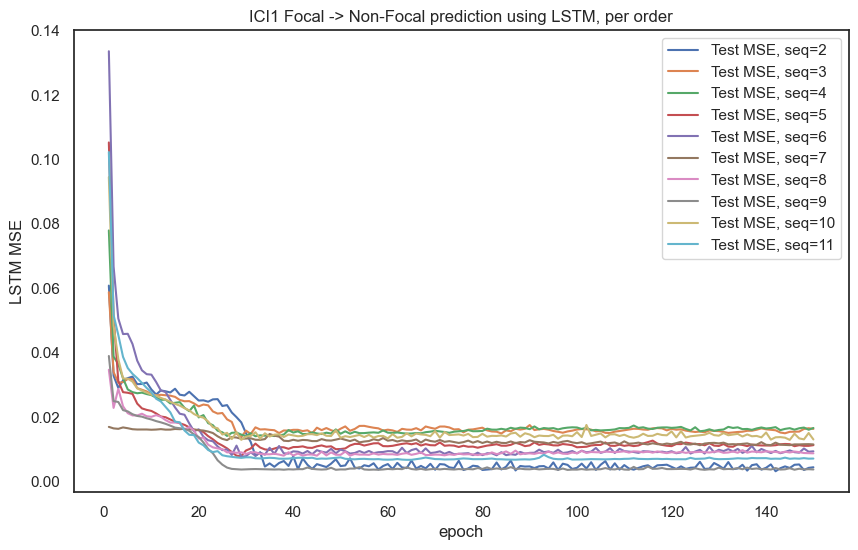

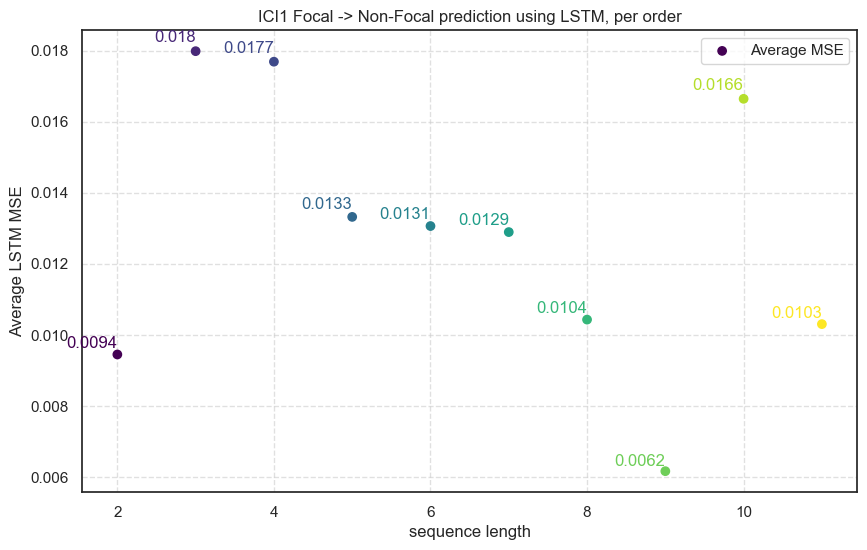

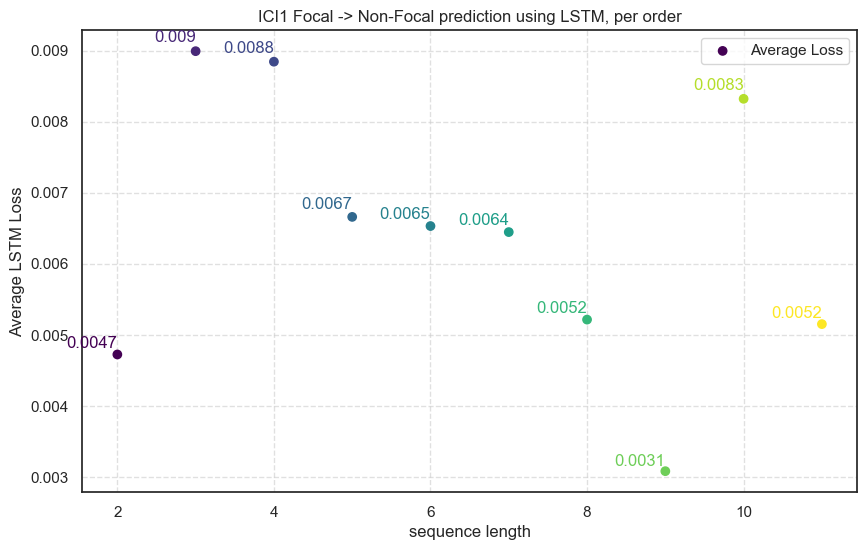

In [357]:
visualize_lstm(list(range(2, 12)), 150, mse_acc, loss_acc, ici1_vectors, 'ICI1', '')

In [60]:
mse_acc, loss_acc = train_lstm_repeat(5, 300, ici1_vectors, "ICI1 Focal", "ICI1 Non-Focal", None)

Training LSTM loop #0
ICI1 Focal ICI1 Non-Focal, Sequence length: 2, samples count: 752
ICI1 Focal ICI1 Non-Focal, Sequence length: 3, samples count: 599
ICI1 Focal ICI1 Non-Focal, Sequence length: 4, samples count: 472
ICI1 Focal ICI1 Non-Focal, Sequence length: 5, samples count: 380
ICI1 Focal ICI1 Non-Focal, Sequence length: 6, samples count: 298
ICI1 Focal ICI1 Non-Focal, Sequence length: 7, samples count: 236
ICI1 Focal ICI1 Non-Focal, Sequence length: 8, samples count: 187
ICI1 Focal ICI1 Non-Focal, Sequence length: 9, samples count: 150
ICI1 Focal ICI1 Non-Focal, Sequence length: 10, samples count: 119
ICI1 Focal ICI1 Non-Focal, Sequence length: 11, samples count: 94
Training LSTM loop #1
ICI1 Focal ICI1 Non-Focal, Sequence length: 2, samples count: 752
ICI1 Focal ICI1 Non-Focal, Sequence length: 3, samples count: 599
ICI1 Focal ICI1 Non-Focal, Sequence length: 4, samples count: 472
ICI1 Focal ICI1 Non-Focal, Sequence length: 5, samples count: 380
ICI1 Focal ICI1 Non-Focal, Sequ

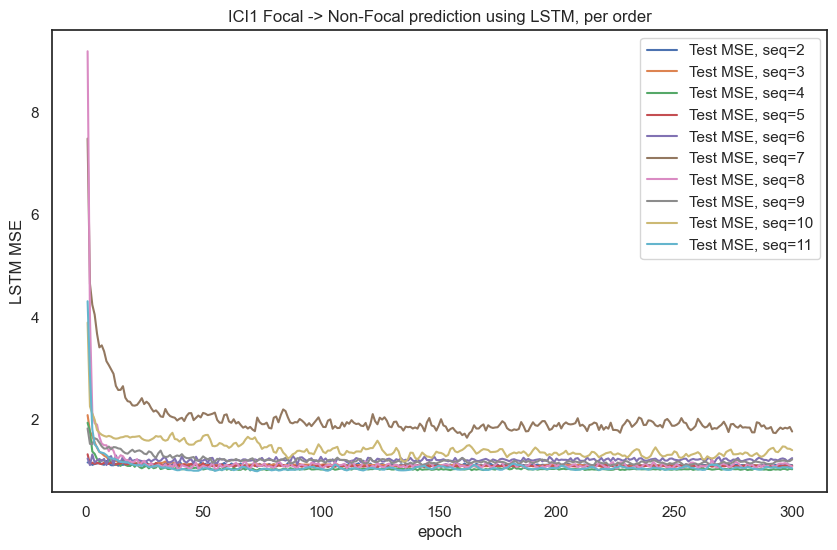

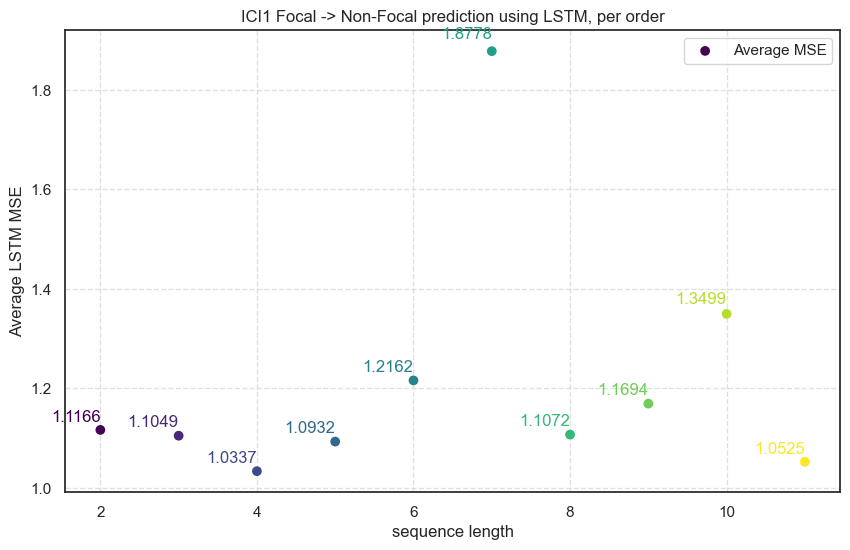

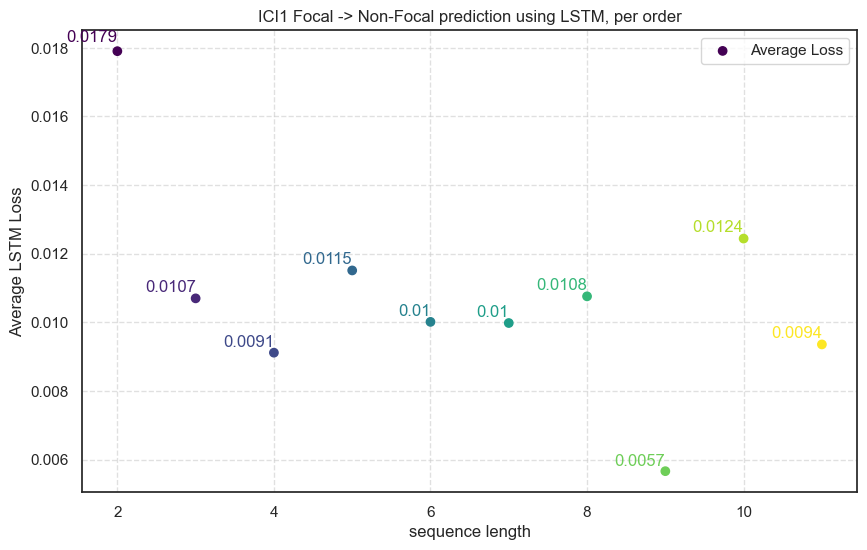

In [62]:
visualize_lstm(list(range(2, 12)), 300, mse_acc[0], loss_acc[0], ici1_vectors, 'ICI1', '')

In [103]:
means = []
for i in range(len(mse_acc[0])):
    inner_values = []
    for k in range(len(mse_acc)):
        tmp = mse_acc[k][i][-100:]
        inner_values.extend([t.detach().item() for t in tmp])
    means.append(sum(inner_values) / len(inner_values))
means

[1.0897979991436004,
 1.1163127572536469,
 1.0575558125972748,
 1.177110031604767,
 1.1629335536956786,
 1.322819361448288,
 1.1148694001436235,
 1.0299021158218384,
 2.212316562652588,
 1.1721065974235534]

In [315]:
visualize_average_lstms(list(range(2, 12)), mse_acc, loss_acc, "ICI1")

IndexError: Dimension specified as 0 but tensor has no dimensions

<Figure size 1000x600 with 0 Axes>

### duration

In [385]:
duration_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                      ['overlap_pair',
                                       'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
len(duration_vectors)

mse_acc, loss_acc = train_lstm(duration_vectors, 150, "Duration Focal", "Duration Non-Focal", None, log=True)

Duration Focal Duration Non-Focal, Sequence length: 2, samples count: 1538
Epoch [1/150], Train Accuracy MSE: 0.5002, Validation Accuracy MSE: 0.2048, Test Accuracy MSE: 0.2067
Epoch [51/150], Train Accuracy MSE: 0.0681, Validation Accuracy MSE: 0.0673, Test Accuracy MSE: 0.0561
Epoch [101/150], Train Accuracy MSE: 0.0664, Validation Accuracy MSE: 0.0682, Test Accuracy MSE: 0.0508
Duration Focal Duration Non-Focal, Sequence length: 3, samples count: 1317
Epoch [1/150], Train Accuracy MSE: 0.3722, Validation Accuracy MSE: 0.1861, Test Accuracy MSE: 0.1524
Epoch [51/150], Train Accuracy MSE: 0.0689, Validation Accuracy MSE: 0.0465, Test Accuracy MSE: 0.0575
Epoch [101/150], Train Accuracy MSE: 0.0670, Validation Accuracy MSE: 0.0467, Test Accuracy MSE: 0.0564
Duration Focal Duration Non-Focal, Sequence length: 4, samples count: 1109
Epoch [1/150], Train Accuracy MSE: 0.5920, Validation Accuracy MSE: 0.2173, Test Accuracy MSE: 0.2801
Epoch [51/150], Train Accuracy MSE: 0.0600, Validation 

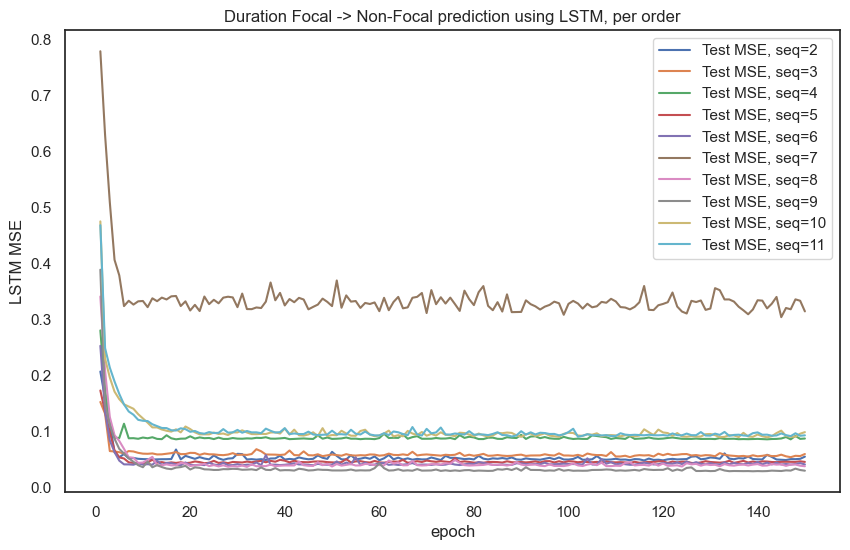

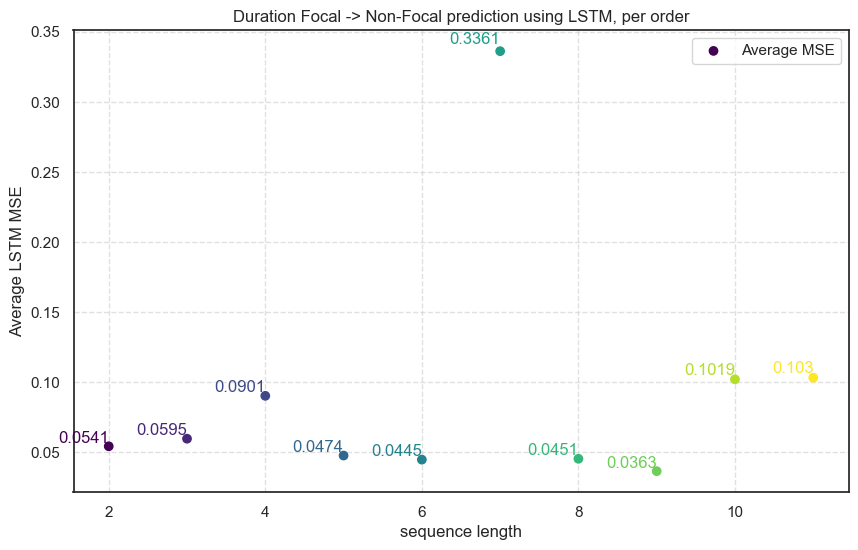

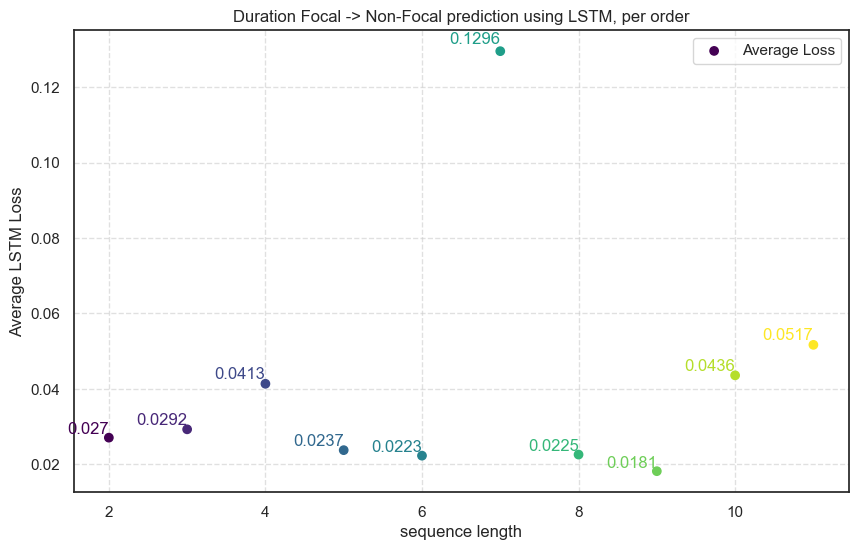

In [386]:
visualize_lstm(list(range(2, 12)), 150, mse_acc, loss_acc, duration_vectors, 'Duration', '')

### ci -> cb

In [720]:
ci_cb_vectors

[[1.3606084000000038,
  2.329008299999998,
  2.9418500000000165,
  3.0684249999999906,
  2.408083399999981,
  2.2070584000000224,
  2.699674999999985,
  2.707866700000011,
  2.242358299999978],
 [1.3606084000000038,
  2.329008299999998,
  2.9418500000000165,
  3.0684249999999906,
  2.408083399999981,
  2.2070584000000224,
  2.699674999999985,
  2.707866700000011,
  2.4232582999999863,
  3.898566599999981],
 [3.084691699999979, 3.4654667000000074, 2.6430915999999627],
 [3.084691699999979,
  3.4654667000000074,
  2.8814915999999755,
  2.621558399999998],
 [3.084691699999979,
  3.4654667000000074,
  2.8814915999999755,
  6.979658400000005,
  2.4739416000000176],
 [3.084691699999979,
  3.4654667000000074,
  2.8814915999999755,
  6.979658400000005,
  3.1905416000000173,
  2.5773332999999923],
 [3.084691699999979,
  3.4654667000000074,
  2.8814915999999755,
  6.979658400000005,
  3.1905416000000173,
  3.331633299999993,
  2.5448833000000093],
 [3.084691699999979,
  3.4654667000000074,
  2.88

In [728]:
mse_acc, loss_acc = train_lstm(ci_cb_vectors, 150, "CI Focal", "CB Non-Focal", None, log=True)

CI Focal CB Non-Focal, Sequence length: 2, samples count: 639
Epoch [1/150], Train Accuracy MSE: 7.6029, Validation Accuracy MSE: 4.0856, Test Accuracy MSE: 4.1114
Epoch [51/150], Train Accuracy MSE: 2.4742, Validation Accuracy MSE: 2.3519, Test Accuracy MSE: 2.1606
Epoch [101/150], Train Accuracy MSE: 2.4366, Validation Accuracy MSE: 2.3486, Test Accuracy MSE: 2.1774
Epoch [151/150], Train Accuracy MSE: 2.4443, Validation Accuracy MSE: 2.3667, Test Accuracy MSE: 2.1737
CI Focal CB Non-Focal, Sequence length: 3, samples count: 511
Epoch [1/150], Train Accuracy MSE: 6.3862, Validation Accuracy MSE: 4.5572, Test Accuracy MSE: 4.5226
Epoch [51/150], Train Accuracy MSE: 2.2574, Validation Accuracy MSE: 2.6065, Test Accuracy MSE: 2.8719
Epoch [101/150], Train Accuracy MSE: 2.2540, Validation Accuracy MSE: 2.5990, Test Accuracy MSE: 2.9427
Epoch [151/150], Train Accuracy MSE: 2.1800, Validation Accuracy MSE: 2.5668, Test Accuracy MSE: 2.8793
CI Focal CB Non-Focal, Sequence length: 4, samples

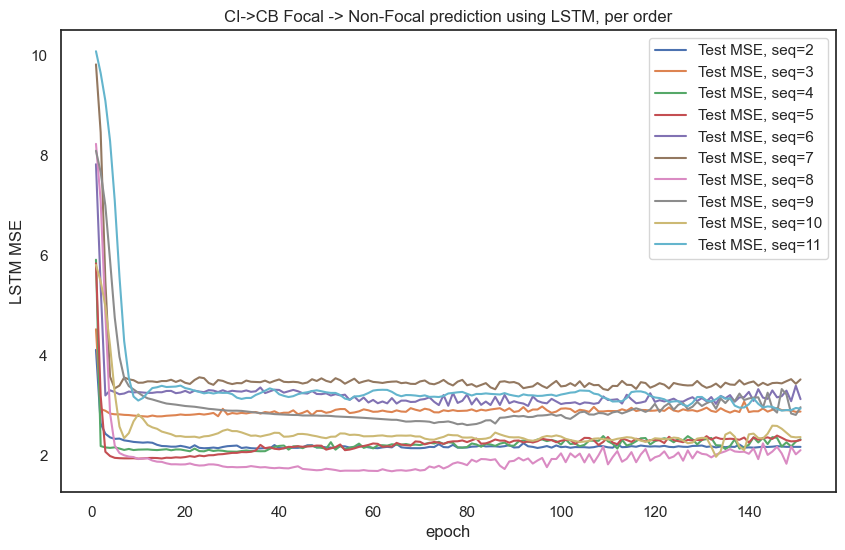

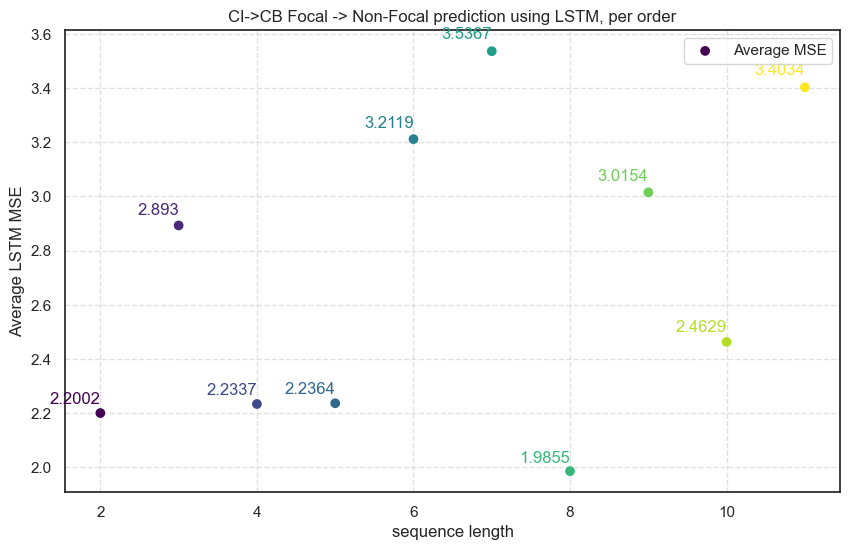

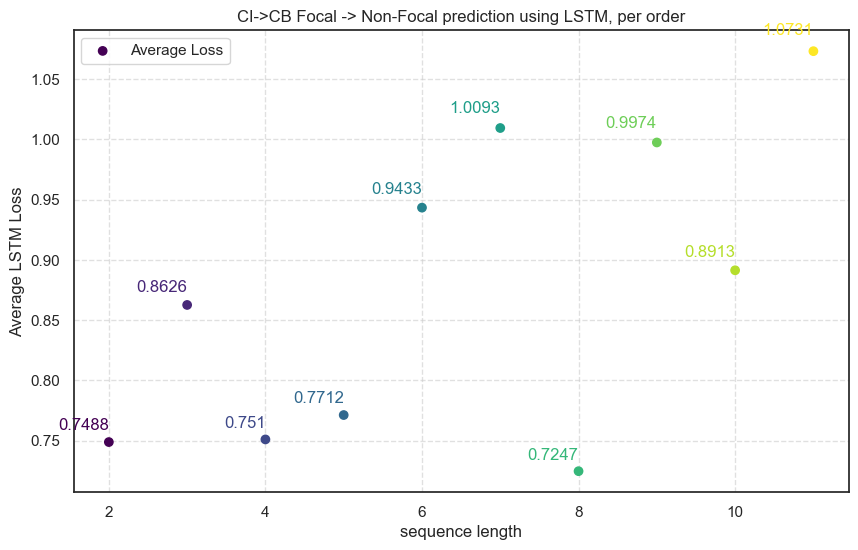

In [730]:
visualize_lstm(list(range(2, 12)), 151, mse_acc, loss_acc, ci_cb_vectors, 'CI->CB', '')

## HMM pred

In [439]:
def fit_hmm_on_sequence(vectors, label1, limit_vectors=None, skip_order=None, loops=10):
    sequence_length_options = list(range(2, 11))
    mae_acc = []
    mse_acc = []
    for iter in range(loops):
        for sequence_length in sequence_length_options:
            filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
            print(f'{label1}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')

            if limit_vectors is not None:
                filtered_vectors = random.sample(filtered_vectors, limit_vectors)
                #print(f'limited to samples count: {limit_vectors}')

            if skip_order is not None and sequence_length >= skip_order and sequence_length > 2:
                filtered_vectors = [np.delete(v, len(v) - skip_order) for v in filtered_vectors]
                #print(f"iter {iter} sequence_length {sequence_length}, skip_order {skip_order}")
                # for v in filtered_vectors:
                # v[-skip_order] = 0

            test_size_ratio = 0.2
            train_data, test_data = train_test_split(filtered_vectors, test_size=test_size_ratio)
            #train_sequences = np.array([vector[:-1] for vector in train_data])
            train_sequences = train_data
            test_sequences = np.array([vector[:-1] for vector in test_data])
            true_test_values = np.array([vector[-1] for vector in test_data])

            model = hmm.GaussianHMM(n_components=5, covariance_type="full", n_iter=100)
            # model = hmm.GMMHMM(n_components=3, n_mix=2, covariance_type="diag", n_iter=20)
            model.fit(train_sequences)

            # Predict hidden states and map to numeric values
            predicted_values = []
            for sequence in test_sequences:
                hidden_states = model.predict(sequence.reshape(-1, 1))
                predicted_value = model.means_[hidden_states[-1]].mean()
                predicted_values.append(predicted_value)

            # Calculate statistics
            # mse = mean_squared_error(true_test_values, predicted_values)
            mse = (true_test_values - predicted_values) ** 2
            mae = np.abs(true_test_values - predicted_values)
            #print(np.mean(mae))

            mae_acc.extend([(sequence_length, mae) for mae in mae])
            mse_acc.extend([(sequence_length, mse) for mse in mse])
            # mae_acc.append(mae)
            # mse_acc.append(mse)

    df_mae = pd.DataFrame(mae_acc, columns=["SEQ", "MAE"])
    df_mse = pd.DataFrame(mse_acc, columns=["SEQ", "MSE"])
    return df_mae, df_mse

In [133]:
from sklearn.model_selection import KFold
import numpy as np
import random
import pandas as pd
from hmmlearn import hmm
from sklearn.metrics import mean_squared_error, mean_absolute_error


def fit_hmm_on_sequence_with_cross_validation(vectors, label1, limit_vectors=None, skip_order=None, loops=10,
                                              n_splits=5):
    sequence_length_options = list(range(2, 11))
    mae_acc = []
    mse_acc = []

    # Set up KFold cross-validation
    kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

    for iter in range(loops):
        for sequence_length in sequence_length_options:
            filtered_vectors = filter_vectors_by_size(vectors, sequence_length)

            if limit_vectors is not None:
                filtered_vectors = random.sample(filtered_vectors, limit_vectors)

            if skip_order is not None and sequence_length >= skip_order and sequence_length > 2:
                filtered_vectors = [np.delete(v, len(v) - skip_order) for v in filtered_vectors]

            # K-fold cross-validation
            for train_index, test_index in kf.split(filtered_vectors):
                train_data = [filtered_vectors[i] for i in train_index]
                test_data = [filtered_vectors[i] for i in test_index]

                # Prepare train/test sequences
                train_sequences = train_data
                test_sequences = np.array([vector[:-1] for vector in test_data])
                true_test_values = np.array([vector[-1] for vector in test_data])

                # Model initialization
                model = hmm.GMMHMM(n_components=3, n_mix=2, covariance_type="diag", n_iter=20)
                model.fit(train_sequences)

                # Predict hidden states and map to numeric values
                predicted_values = []
                for sequence in test_sequences:
                    hidden_states = model.predict(sequence.reshape(-1, 1))
                    predicted_value = model.means_[hidden_states[-1]].mean()
                    predicted_values.append(predicted_value)

                # Calculate statistics
                mse = (true_test_values - predicted_values) ** 2
                mae = np.abs(true_test_values - predicted_values)

                mae_acc.extend([(sequence_length, mae) for mae in mae])
                mse_acc.extend([(sequence_length, mse) for mse in mse])

    # Return MAE and MSE results
    df_mae = pd.DataFrame(mae_acc, columns=["SEQ", "MAE"])
    df_mse = pd.DataFrame(mse_acc, columns=["SEQ", "MSE"])
    return df_mae, df_mse

In [447]:
def visualize_hmm_resutls(df, sequence_length_options, metric_label):
    # df = pd.DataFrame(
    #     [(num, sequence_length_options[seq]) for seq, inner_list in enumerate(res) for num in
    #      inner_list],
    #     columns=[metric_label, 'order']
    # )

    f, ax = plt.subplots(figsize=(7, 6))
    sns.set_theme(style="white")
    sns.despine(bottom=True, left=True)
    sns.stripplot(
        data=df, x="SEQ", y=metric_label, hue="SEQ",
        dodge=False, alpha=.25, zorder=1, legend=False)
    sns.pointplot(
        data=df, x="SEQ", y=metric_label, hue="SEQ", palette="dark", errorbar=None, dodge=True,
        markers="d")
    ax.legend().remove()
    ax.xaxis.grid(True)
    ax.set(ylabel=metric_label)
    plt.show()

### ICI1

#### all pairs

In [20]:
ici1_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                  ['overlap_pair',
                                   'non_overlap_pair', 'reverse_overlap_pair',
                                   'reverse_non_overlap_pair'])
mae_acc, mse_acc = fit_hmm_on_sequence(ici1_vectors, 'ICI1')

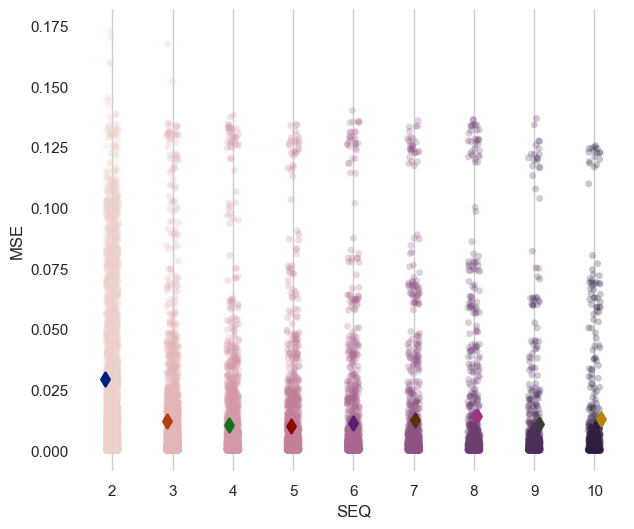

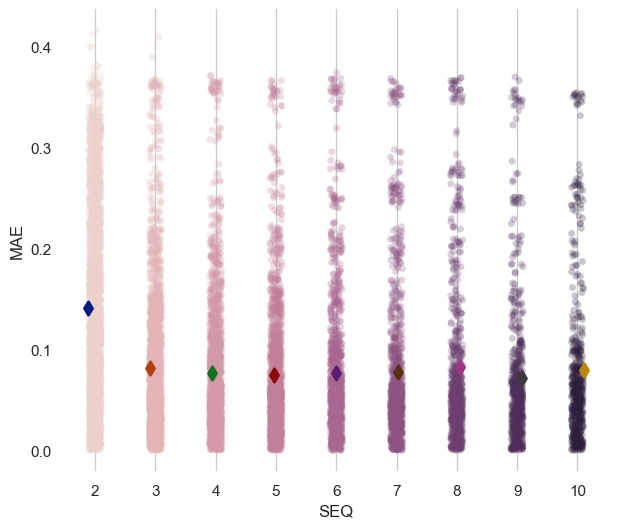

In [22]:
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")
visualize_hmm_resutls(mae_acc, sequence_length_options, "MAE")

In [30]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici1_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")

print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

data_range=0.6648411
data_std=0.14080631083747877
Baseline MSE: 0.02
mean: 0.29
rmse: 0.10926517002269238
relative MSE: 0.3754303734963933


#### symteric pairs

In [35]:
ici1_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                                   ['overlap_pair',
                                                    'non_overlap_pair', 'reverse_overlap_pair',
                                                    'reverse_non_overlap_pair'], symmetric_duration_exchanges)
mae_acc, mse_acc = fit_hmm_on_sequence(ici1_vectors, 'ICI1')

In [36]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici1_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")

print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")


   SEQ       MSE
0    2  0.034674
1    3  0.008155
2    4  0.006261
3    5  0.005772
4    6  0.005615
5    7  0.005357
6    8  0.005230
7    9  0.005414
8   10  0.004817
data_range=0.5358349
data_std=0.13946465012196504
Baseline MSE: 0.02
mean: 0.32
rmse: 0.09030602401527338
relative MSE: 0.2863104957728255


In [52]:
vectors = ici1_vectors
skip_order = 3
sequence_length = 3
filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
filtered_vectors = [np.delete(v, len(v) - skip_order) for v in filtered_vectors]
filtered_vectors

[array([0.2584333, 0.2998227]),
 array([0.2567917, 0.326062 ]),
 array([0.2681917, 0.3755167]),
 array([0.3423583, 0.3895084]),
 array([0.3444583, 0.3348   ]),
 array([0.350825 , 0.3303356]),
 array([0.3889833, 0.3575296]),
 array([0.3881   , 0.3394932]),
 array([0.3856417, 0.3343285]),
 array([0.3392334, 0.3332917]),
 array([0.0336   , 0.3237028]),
 array([0.034325 , 0.2947978]),
 array([0.0354166, 0.2824183]),
 array([0.03785  , 0.1369975]),
 array([0.0998583, 0.1960397]),
 array([0.0928417, 0.1917153]),
 array([0.0935834, 0.1913224]),
 array([0.0800583, 0.2508048]),
 array([0.0923583, 0.2453292]),
 array([0.0973584, 0.2565052]),
 array([0.0933416, 0.2467354]),
 array([0.1105   , 0.2624938]),
 array([0.0971333, 0.2480523]),
 array([0.0920833, 0.2502008]),
 array([0.0834333, 0.202369 ]),
 array([0.06005  , 0.1895672]),
 array([0.3749417, 0.6089268]),
 array([0.3280917, 0.2624046]),
 array([0.3139917, 0.2765   ]),
 array([0.3671583, 0.314775 ]),
 array([0.36145  , 0.3166584]),
 array([

In [85]:
vectors = ici1_vectors
sequence_length = 3
filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
filtered_vectors

[[0.2522667, 0.2584333, 0.2998227],
 [0.2584333, 0.2567917, 0.326062],
 [0.2567917, 0.2681917, 0.3755167],
 [0.3581333, 0.3423583, 0.3895084],
 [0.3423583, 0.3444583, 0.3348],
 [0.3444583, 0.350825, 0.3303356],
 [0.3829667, 0.3889833, 0.3575296],
 [0.3889833, 0.3881, 0.3394932],
 [0.3881, 0.3856417, 0.3343285],
 [0.3856417, 0.3392334, 0.3332917],
 [0.0373167, 0.0336, 0.3237028],
 [0.04205, 0.034325, 0.2947978],
 [0.034325, 0.0354166, 0.2824183],
 [0.0339334, 0.03785, 0.1369975],
 [0.0819083, 0.0998583, 0.1960397],
 [0.0998583, 0.0928417, 0.1917153],
 [0.09035, 0.0935834, 0.1913224],
 [0.0935834, 0.0800583, 0.2508048],
 [0.0800583, 0.0923583, 0.2453292],
 [0.0896083, 0.0973584, 0.2565052],
 [0.0973584, 0.0933416, 0.2467354],
 [0.0933416, 0.1105, 0.2624938],
 [0.1105, 0.0971333, 0.2480523],
 [0.0971333, 0.0920833, 0.2502008],
 [0.1169916, 0.0834333, 0.202369],
 [0.0834333, 0.06005, 0.1895672],
 [0.412725, 0.3749417, 0.6089268],
 [0.3749417, 0.3280917, 0.2624046],
 [0.3280917, 0.3139917, 

In [83]:
mae_acc, mse_acc = fit_hmm_on_sequence(ici1_vectors, 'ICI1', skip_order=3, loops=5)

Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance


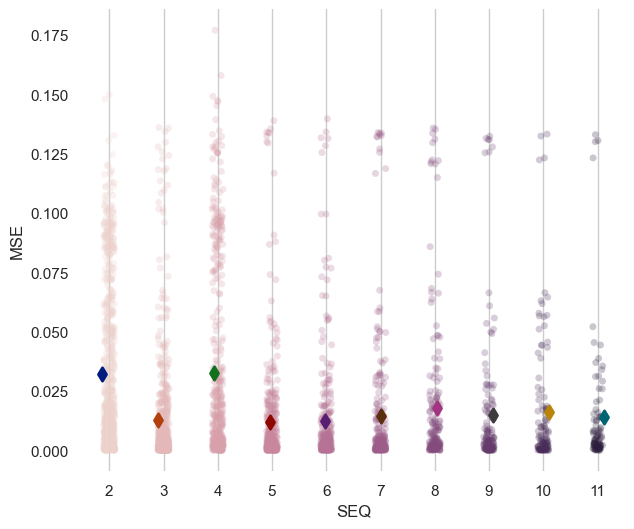

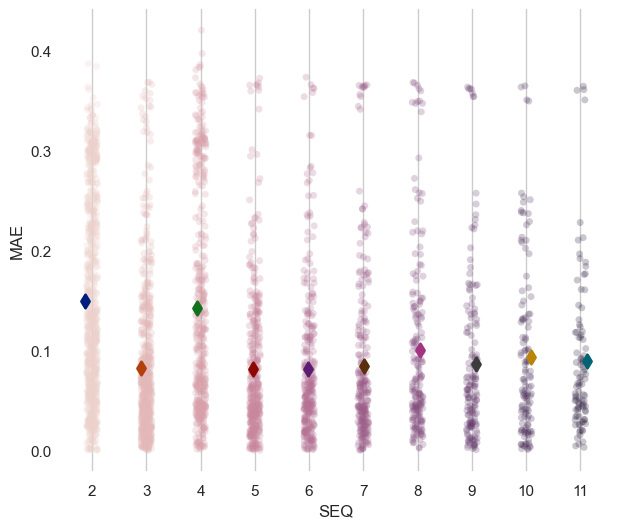

In [84]:
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")
visualize_hmm_resutls(mae_acc, sequence_length_options, "MAE")

### ICI2

#### all pairs

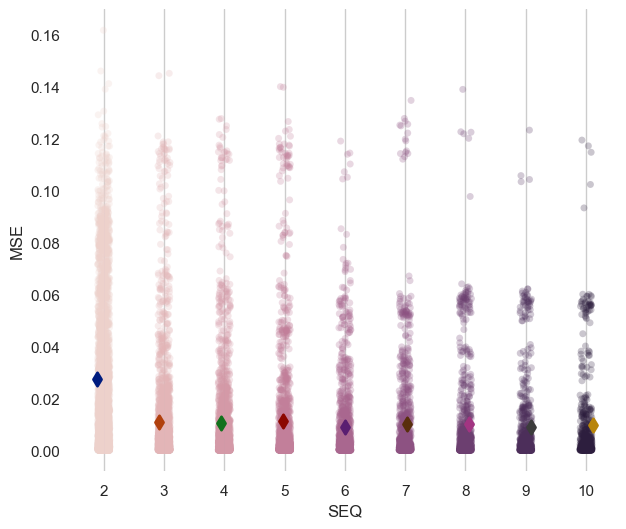

In [42]:
ici2_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
                                  ['overlap_pair',
                                   'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
mae_acc, mse_acc = fit_hmm_on_sequence(ici2_vectors, 'ICI2')
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")

In [43]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici2_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")

print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.027249
1    3  0.010829
2    4  0.010348
3    5  0.011128
4    6  0.008830
5    7  0.009930
6    8  0.009908
7    9  0.008994
8   10  0.009671
data_range=0.5894388
data_std=0.12944231036928908
Baseline MSE: 0.02
mean: 0.28
rmse: 0.10406343453220088
relative MSE: 0.3722229886673738


#### symmetric pairs

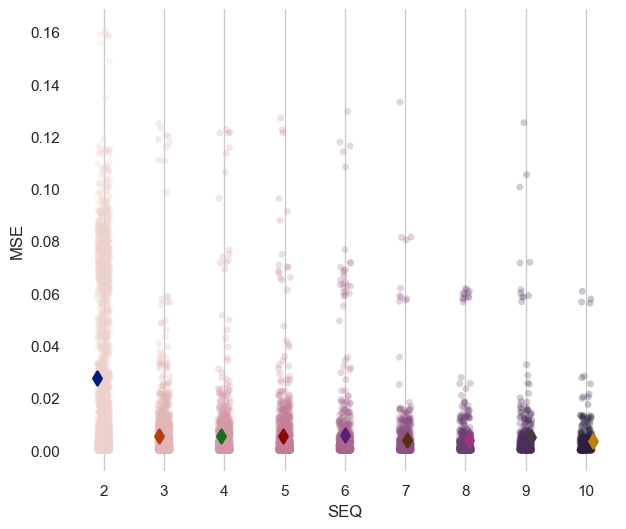

In [44]:
ici2_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
                                                   ['overlap_pair',
                                                    'non_overlap_pair', 'reverse_overlap_pair',
                                                    'reverse_non_overlap_pair'], symmetric_duration_exchanges)
mae_acc, mse_acc = fit_hmm_on_sequence(ici2_vectors, 'ICI2')
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")

In [46]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici2_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")

print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.027756
1    3  0.005416
2    4  0.005276
3    5  0.005512
4    6  0.005648
5    7  0.004045
6    8  0.003998
7    9  0.005062
8   10  0.003529
data_range=0.5194707000000001
data_std=0.1288087068628932
Baseline MSE: 0.02
mean: 0.30
rmse: 0.07359272784310174
relative MSE: 0.24312559149284255


### Duration

#### all pairs

##### cross validation

Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

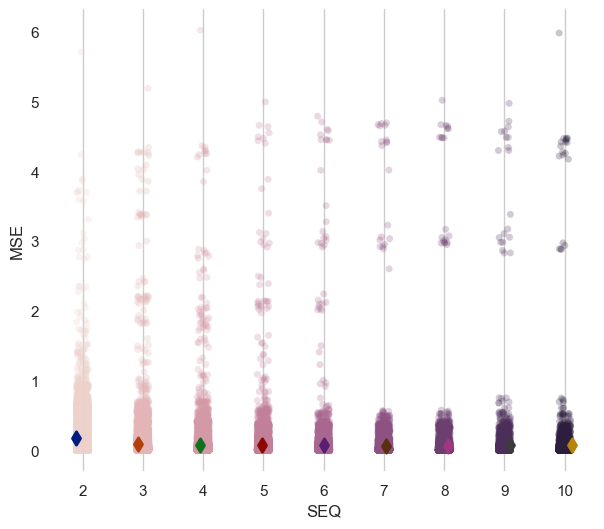

In [134]:
duration_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                      ['overlap_pair',
                                       'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
mae_acc, mse_acc = fit_hmm_on_sequence_with_cross_validation(duration_vectors, 'Duration')
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")

In [138]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(duration_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.171859
1    3  0.085941
2    4  0.079043
3    5  0.073252
4    6  0.070445
5    7  0.066260
6    8  0.067322
7    9  0.071704
8   10  0.079021
data_range=3.318217
data_std=0.3650873351934162
Baseline MSE: 0.13
mean: 0.93
rmse: 0.29315618134894317
relative MSE: 0.31405237276152304


##### no cross validation

Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

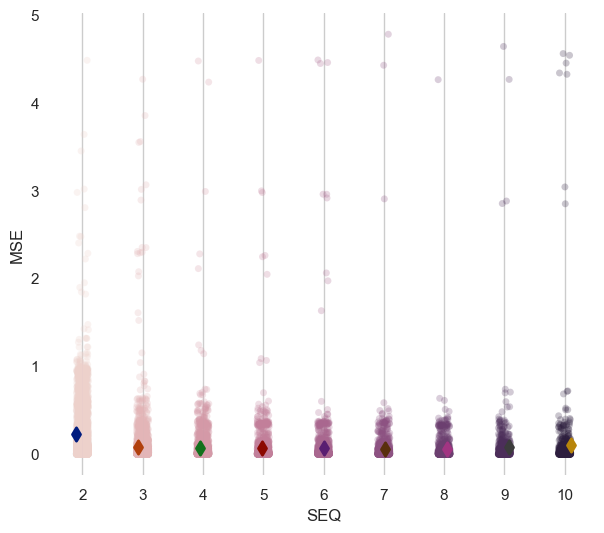

In [37]:
duration_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                      ['overlap_pair',
                                       'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
mae_acc, mse_acc = fit_hmm_on_sequence(duration_vectors, 'Duration')
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")

In [39]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(duration_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")

print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.229146
1    3  0.087017
2    4  0.069147
3    5  0.068067
4    6  0.073048
5    7  0.064105
6    8  0.058881
7    9  0.078617
8   10  0.109583
data_range=3.318217
data_std=0.3650873351934162
Baseline MSE: 0.13
mean: 0.93
rmse: 0.2949858126643717
relative MSE: 0.3160124203144865


#### symmetric pairs

Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

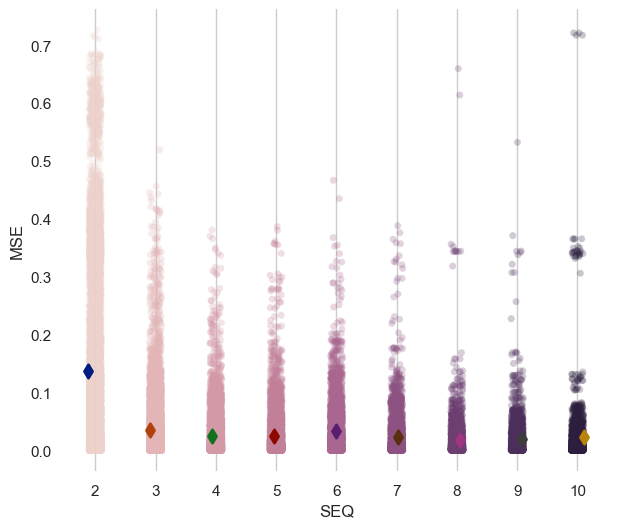

In [139]:
duration_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                                       ['overlap_pair',
                                                        'non_overlap_pair', 'reverse_overlap_pair',
                                                        'reverse_non_overlap_pair'], symmetric_duration_exchanges)
mae_acc, mse_acc = fit_hmm_on_sequence_with_cross_validation(duration_vectors, 'Duration')
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")

In [140]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(duration_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.136379
1    3  0.035484
2    4  0.025312
3    5  0.025386
4    6  0.032718
5    7  0.023641
6    8  0.018258
7    9  0.019137
8   10  0.022515
data_range=3.2175667000000003
data_std=0.3514346078683625
Baseline MSE: 0.12
mean: 0.96
rmse: 0.18837246517890852
relative MSE: 0.1966891405866199


Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

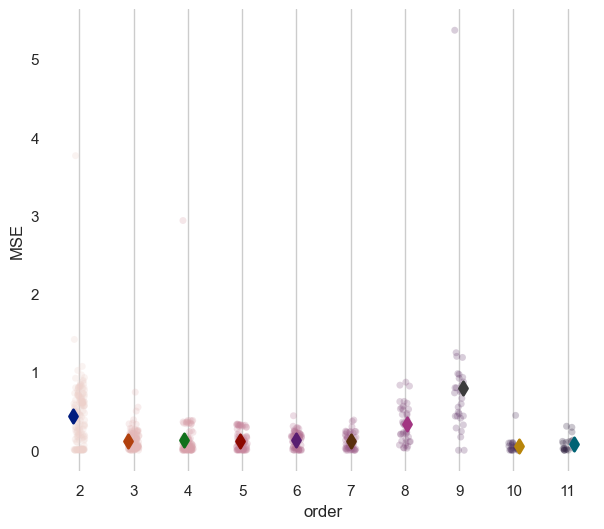

In [343]:
mae_acc, mse_acc = fit_hmm_on_sequence(duration_vectors, 'Duration', skip_order=3)
visualize_hmm_resutls(mse_acc, sequence_length_options, "MSE")

In [712]:
mse_acc, mae_acc = fit_hmm_on_sequence(ci_cb_vectors, 'CI->CB')

Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

In [714]:
mse_acc

,SEQ,MAE
0,2,0.371244
1,2,2.000665
2,2,0.844410
3,2,1.824015
4,2,0.451368
...,...,...
5795,11,1.764614
5796,11,4.091786
5797,11,1.007859
5798,11,1.059025


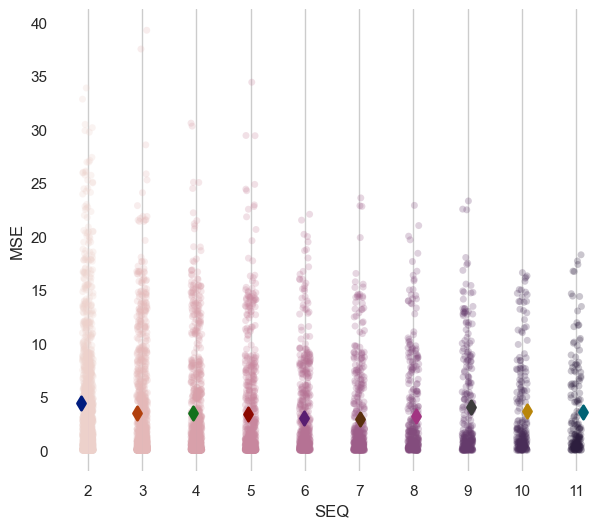

In [716]:
visualize_hmm_resutls(mae_acc, sequence_length_options, "MSE")

In [718]:
mean_mse_per_seq = mae_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

   SEQ       MSE
0    2  4.460818
1    3  3.481705
2    4  3.504253
3    5  3.349394
4    6  3.050134
5    7  2.899971
6    8  3.208807
7    9  4.031463
8   10  3.628418
9   11  3.544640


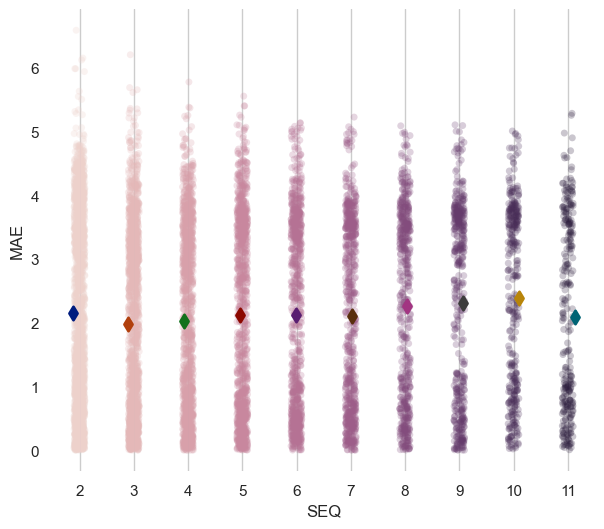

In [416]:
ci_cb_vectors = get_vectors_ci_cb(coda_df.reset_index(drop=True), 'past_codas', ['overlap_pair',
                                                                                 'non_overlap_pair',
                                                                                 'reverse_non_overlap_pair',
                                                                                 'reverse_non_overlap_pair'])

ci_cb_vectors = [vec for vec in ci_cb_vectors if len(vec) >= 2 and not any(np.isnan(x) for x in vec)]

mae_acc, mse_acc = fit_hmm_on_sequence(ci_cb_vectors, 'CI->CB')
visualize_hmm_resutls(mae_acc, sequence_length_options, "MAE")

In [422]:
cbs = coda_df['CB']
flat_list = np.concatenate(ci_cb_vectors).tolist()

data_range = np.max(cbs) - np.min(cbs)
data_std = np.std(cbs)
print(data_range)
print(data_std)
print(np.mean(cbs))

11.1772025000015
1.9664184987251943
1.1353552171651675


In [419]:
mean_mse_per_seq = mae_acc.groupby('SEQ')['MAE'].mean().reset_index()
print(mean_mse_per_seq)

   SEQ       MAE
0    2  2.159377
1    3  1.981890
2    4  2.020854
3    5  2.124609
4    6  2.121551
5    7  2.109802
6    8  2.268997
7    9  2.312040
8   10  2.381323
9   11  2.093368


In [1229]:
sequence_length_options

[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

### CI -> CB after clustering

#### cluster 1

In [60]:
ci_cb_vectors = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 1)
ci_cb_vectors = [vec for vec in ci_cb_vectors if len(vec) >= 2 and not any(np.isnan(x) for x in vec)]
mae_acc, mse_acc = fit_hmm_on_sequence(ci_cb_vectors, 'CI->CB')

Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate mixture covariance
Degenerate

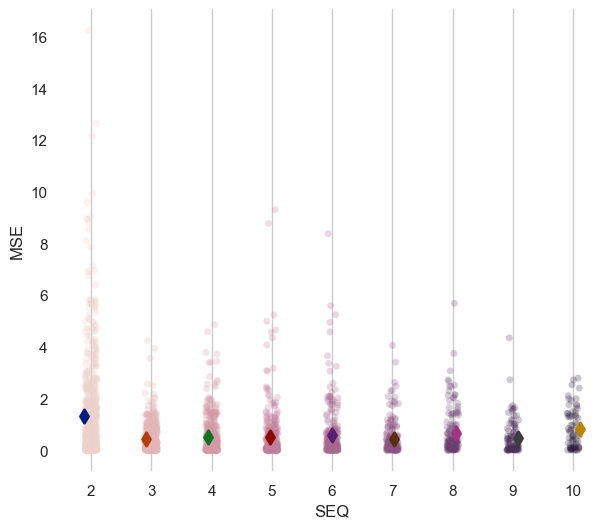

In [61]:
visualize_hmm_resutls(mse_acc, range(2, 11), "MSE")

In [107]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

cbs = coda_df_clean[coda_df_clean['Cluster'] == 1]['CB']

flat_list = np.concatenate(ci_cb_vectors).tolist()
data_range = np.max(cbs) - np.min(cbs)
data_std = np.std(cbs)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((cbs - np.mean(cbs)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  1.335240
1    3  0.437024
2    4  0.500149
3    5  0.531115
4    6  0.577353
5    7  0.437516
6    8  0.677765
7    9  0.484877
8   10  0.816004
data_range=5.69769539999686
data_std=0.8762895049256962
Baseline MSE: 0.77
mean: 3.08
rmse: 0.6610780827994843
relative MSE: 0.21473114681076885


#### heatmap example for rMSE

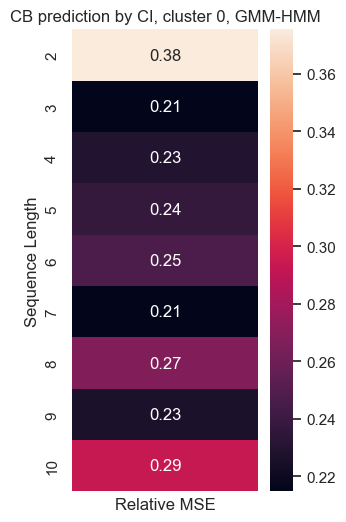

In [123]:
data_2d = rmses.values.reshape(-1, 1)
plt.figure(figsize=(3, 6))
ax = sns.heatmap(data_2d, annot=True, fmt=".2f", cbar=True)
plt.xlabel("Relative MSE")
plt.ylabel("Sequence Length")
plt.xticks([])
y_ticks = ax.get_yticks()
y_labels = [str(int(tick) + 2) for tick in y_ticks]  # Add 2 to each label
ax.set_yticklabels(y_labels)
plt.title("CB prediction by CI, cluster 0, GMM-HMM")
plt.show()

#### cluster 0

In [443]:
ci_cb_vectors = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 0)
ci_cb_vectors = [vec for vec in ci_cb_vectors if len(vec) >= 2 and not any(np.isnan(x) for x in vec)]
mae_acc, mse_acc = fit_hmm_on_sequence(ci_cb_vectors, 'CI->CB', loops=1)

CI->CB, Sequence length: 2, samples count: 188
CI->CB, Sequence length: 3, samples count: 144
CI->CB, Sequence length: 4, samples count: 104
CI->CB, Sequence length: 5, samples count: 76
CI->CB, Sequence length: 6, samples count: 54


Model is not converging.  Current: 27.818516919772694 is not greater than 36.81968071168644. Delta is -9.001163791913743
Model is not converging.  Current: 166.80261718820597 is not greater than 277.4506220804926. Delta is -110.64800489228665
Fitting a model with 244 free scalar parameters with only 216 data points will result in a degenerate solution.
Model is not converging.  Current: 236.08267452385968 is not greater than 300.0242823215706. Delta is -63.9416077977109
Fitting a model with 294 free scalar parameters with only 180 data points will result in a degenerate solution.
Fitting a model with 349 free scalar parameters with only 150 data points will result in a degenerate solution.
Model is not converging.  Current: 567.0492449254681 is not greater than 634.745156239086. Delta is -67.6959113136179


CI->CB, Sequence length: 7, samples count: 41
CI->CB, Sequence length: 8, samples count: 34
CI->CB, Sequence length: 9, samples count: 25
CI->CB, Sequence length: 10, samples count: 19


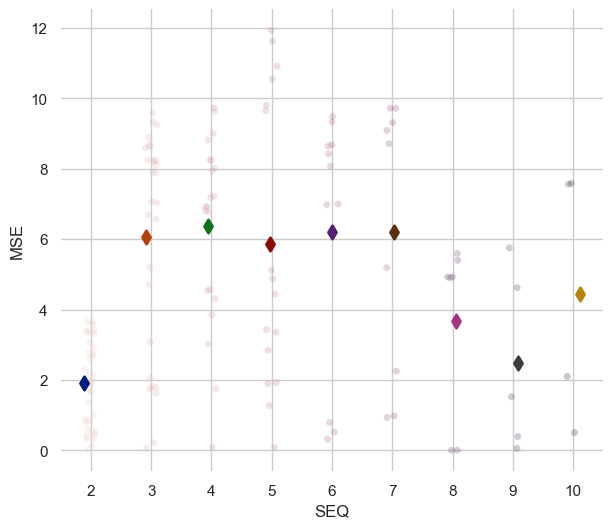

In [448]:
visualize_hmm_resutls(mse_acc, range(2, 11), "MSE")

In [449]:
mean_mse_per_seq = mse_acc.groupby('SEQ')['MSE'].mean().reset_index()
print(mean_mse_per_seq)

rmse_per_seq = mse_acc.groupby('SEQ')['MSE'].apply(lambda x: np.sqrt(np.mean(x))).reset_index()
rmse_per_seq.columns = ['SEQ', 'RMSE']

cbs = coda_df_clean[coda_df_clean['Cluster'] == 0]['CB']

flat_list = np.concatenate(ci_cb_vectors).tolist()
data_range = np.max(cbs) - np.min(cbs)
data_std = np.std(cbs)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((cbs - np.mean(cbs)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq['RMSE'] / np.mean(flat_list)}")

   SEQ       MSE
0    2  1.908051
1    3  6.046513
2    4  6.359794
3    5  5.856200
4    6  6.203047
5    7  6.210409
6    8  3.679155
7    9  2.468816
8   10  4.438573
data_range=3.594283299999006
data_std=0.8776359629548813
Baseline MSE: 0.77
mean: 3.08
rmse: 2.4589657904052173
relative MSE: 0    0.448681
1    0.798720
2    0.819151
3    0.786050
4    0.808993
5    0.809473
6    0.623041
7    0.510372
8    0.684327
Name: RMSE, dtype: float64


# predict coda type

## LSTM

### GPU init

In [99]:
print(f'PyTorch version: {torch.__version__}')
print('*' * 10)

# Check if GPU is available
torch.cuda.init()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f'Torch device available: {device}')
print(f'Available GPU devices: {torch.cuda.device_count()}')
print(f'Device Name: {torch.cuda.get_device_name()}')
print('*' * 10)

PyTorch version: 2.1.1+cu121
**********
Torch device available: cuda
Available GPU devices: 1
Device Name: NVIDIA GeForce RTX 3050 Ti Laptop GPU
**********


### Model Architecture

In [100]:
class LSTMModel_CODA(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, num_layers, dropout_rate):
        super(LSTMModel_CODA, self).__init__()
        self.num_layers = num_layers
        self.hidden_dim = hidden_dim
        self.embedding = nn.Embedding(vocab_size, embedding_dim, padding_idx=0)
        self.lstm1 = nn.LSTM(input_size=embedding_dim, hidden_size=hidden_dim, num_layers=num_layers, batch_first=True)
        self.lstm2 = nn.LSTM(input_size=hidden_dim, hidden_size=hidden_dim // 2, num_layers=num_layers,
                             batch_first=True)
        self.dropout1 = nn.Dropout(dropout_rate)
        self.fc1 = nn.Linear(hidden_dim // 2, vocab_size)

        # self.embedding = nn.Embedding(vocab_size, embedding_dim)
        # self.lstm1 = nn.LSTM(embedding_dim, hidden_dim, num_layers, batch_first=True, bidirectional=False)
        # self.dropout1 = nn.Dropout(dropout_rate)
        # self.fc1 = nn.Linear(hidden_dim, hidden_dim)  # Bidirectional LSTM, so double hidden_dim

        # self.lstm2 = nn.LSTM(hidden_dim, hidden_dim, num_layers)
        # self.dropout2 = nn.Dropout(dropout_rate)
        # self.fc2 = nn.Linear(hidden_dim, vocab_size)

    def forward(self, x, lengths):
        x = self.embedding(x)
        batch_size = x.size(0)
        packed_x = nn.utils.rnn.pack_padded_sequence(x, lengths, batch_first=True, enforce_sorted=False)
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)
        packed_out, (hn, cn) = self.lstm1(packed_x, (h0, c0))
        out, _ = nn.utils.rnn.pad_packed_sequence(packed_out, batch_first=True)
        packed_out1 = nn.utils.rnn.pack_padded_sequence(out, lengths, batch_first=True, enforce_sorted=False)

        h0_2 = torch.zeros(self.num_layers, batch_size, self.hidden_dim // 2).to(x.device)
        c0_2 = torch.zeros(self.num_layers, batch_size, self.hidden_dim // 2).to(x.device)
        packed_out2, (hn2, cn2) = self.lstm2(packed_out1, (h0_2, c0_2))
        out2, _ = nn.utils.rnn.pad_packed_sequence(packed_out2, batch_first=True)
        last_idx = (lengths - 1).clamp(min=0)
        batch_indices = torch.arange(batch_size, device=x.device)
        last_out = out2[batch_indices, last_idx, :]
        last_out = self.dropout1(last_out)
        logits = self.fc1(last_out)
        return logits

        # embeddings = self.embedding(x)
        # output, _ = self.lstm1(embeddings)
        # output = self.dropout1(output)
        # output = output[:, -1, :]  # Get the last hidden state
        # output = self.fc1(output)

        # output, _ = self.lstm2(output)
        # output = self.dropout2(output)
        # output = self.fc2(output)
        # return output

### utils

In [101]:
class SparseCategoricalCrossentropy(nn.Module):
    def __init__(self):
        super(SparseCategoricalCrossentropy, self).__init__()
        self.logsoftmax = nn.LogSoftmax(dim=1)
        self.nllloss = nn.NLLLoss()

    def forward(self, output, target):
        log_probs = self.logsoftmax(output)  # Apply log softmax to get log probabilities
        loss = self.nllloss(log_probs, target)  # Calculate negative log-likelihood loss
        return loss


# Pad sequences for batching
def collate_fn(batch):
    x, y = zip(*batch)
    x_padded = pad_sequence(x, batch_first=True, padding_value=0)
    y = torch.stack(y)
    lengths = torch.tensor([len(seq) for seq in x])
    return x_padded, y, lengths


In [107]:
def train_loop_coda(dataloader, model, criterion, optimizer, device):
    model.train()
    train_loss = 0.0
    total_correct = 0
    total_samples = 0
    for inputs, targets, lengths in dataloader:
        inputs, targets = inputs.to(device), targets.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(inputs, lengths)
        loss = criterion(outputs, targets)

        # Backward pass and optimization
        loss.backward()

        # Gradient clipping
        #torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        train_loss += loss.item()

        # Compute accuracy
        _, predicted = torch.max(outputs.data, 1)
        total_correct += (predicted == targets).sum().item()
        total_samples += targets.size(0)

    return total_correct / total_samples, train_loss


def eval_loop_coda(dataloader, model, criterion, device):
    model.eval()
    val_loss = 0.0
    total_correct = 0
    total_samples = 0
    with torch.no_grad():
        for inputs, targets, lengths in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs, lengths)

            # Compute loss
            loss = criterion(outputs, targets)
            val_loss += loss.item()

            # Compute accuracy
            _, predicted = torch.max(outputs.data, 1)
            total_correct += (predicted == targets).sum().item()
            total_samples += targets.size(0)

    return total_correct / total_samples, val_loss


def eval_loop_coda_cm(dataloader, model, device):
    model.eval()
    all_targets = []
    all_predictions = []

    with torch.no_grad():
        for inputs, targets, lengths in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs, lengths)

            # Compute accuracy
            _, predicted = torch.max(outputs.data, 1)

            all_targets.extend(targets.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    return confusion_matrix(all_targets, all_predictions)

### data preprocessing

In [11]:
vocab2id = dict(zip(coda_types, range(len(coda_types))))

In [13]:
len(coda_types)

26

In [103]:
def get_loaders_coda(data, shuffle=True):
    X, y = [], []
    if shuffle:
        np.random.seed(42)
        np.random.shuffle(data)

    for seq in data:
        X.append([vocab2id[coda] for coda in seq[:-1]])
        y.append(vocab2id[seq[-1]])

    X = torch.tensor(X).to(device)
    y = torch.tensor(y).to(device)

    train_data = TensorDataset(X[:int(0.7 * len(X))].to(device), y[:int(0.7 * len(y))].to(device))
    val_data = TensorDataset(X[int(0.7 * len(X)):int(0.85 * len(X))].to(device),
                             y[int(0.7 * len(y)):int(0.85 * len(y))].to(device))
    test_data = TensorDataset(X[int(0.85 * len(X)):].to(device), y[int(0.85 * len(y)):].to(device))

    train_loader = DataLoader(train_data, batch_size=batch_size, collate_fn=collate_fn, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, collate_fn=collate_fn, shuffle=False)
    test_loader = DataLoader(test_data, batch_size=batch_size, collate_fn=collate_fn, shuffle=False)

    return train_loader, val_loader, test_loader, X.shape[1]

### train loop

In [109]:
batch_size = 4
hidden_dim = 128
embedding_dim = 32
lr = 0.01
num_layers = 1
dropout_rate = 0.15
vocab_size = len(coda_types)


#### train
def train_lstm_coda(vectors, num_epochs, label1, label2, limit_vectors=250, log=False,
                    sequence_length_options=list(range(2, 12)), shuffle_data=True, cm_seq=5):
    print(f"\nTraining with num_layers={num_layers}, embedding_dim={embedding_dim}, hidden_dim={hidden_dim}, lr={lr}")
    accuracy_acc = []
    loss_acc = []

    for sequence_length in sequence_length_options:
        filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        train_loader, val_loader, test_loader, input_shape = get_loaders_coda(filtered_vectors, shuffle_data)
        model = LSTMModel_CODA(vocab_size, embedding_dim, hidden_dim, num_layers, dropout_rate).to(device)
        criterion = SparseCategoricalCrossentropy()
        #criterion = nn.CrossEntropyLoss()
        optimizer = optim.Adam(model.parameters(), lr=lr)
        # scheduler = CyclicLR(
        #     optimizer,
        #     base_lr=0.0001,
        #     max_lr=0.1, 
        #     step_size_up=10,  
        #     mode='triangular2',
        #     cycle_momentum=False
        # )

        # Training loop
        train_accuracies = []
        val_accuracies = []
        test_accuracies = []
        val_losses = []
        train_losses = []
        test_losses = []

        for epoch in range(num_epochs + 1):
            train_accuracy, train_loss = train_loop_coda(train_loader, model, criterion, optimizer, device)
            val_accuracy, val_loss = eval_loop_coda(val_loader, model, criterion, device)
            test_accuracy, test_loss = eval_loop_coda(test_loader, model, criterion, device)

            train_accuracies.append(train_accuracy)
            val_accuracies.append(val_accuracy)
            test_accuracies.append(test_accuracy)
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            test_losses.append(test_loss)

            if epoch % 10 == 0:
                if log: print(
                    f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}")

        accuracy_acc.append(test_accuracies)
        loss_acc.append(test_losses)
        if sequence_length == cm_seq:
            cm = eval_loop_coda_cm(test_loader, model, device)

    return accuracy_acc, loss_acc, cm

In [105]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
len(coda_type_vectors)

1538

### Focal -> Focal prediction

In [234]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

accuracy_acc, loss_acc = train_lstm_coda(coda_type_vectors, 400, "Coda Focal", "Coda Non-Focal", None, True,
                                         list(range(2, 12)))


Training with num_layers=1, embedding_dim=32, hidden_dim=128, lr=0.01
Coda Focal Coda Non-Focal, Sequence length: 2, samples count: 1508
Epoch [1/400], Train Accuracy: 0.6114, Validation Accuracy: 0.6106, Test Accuracy: 0.5727
Epoch [11/400], Train Accuracy: 0.6265, Validation Accuracy: 0.6681, Test Accuracy: 0.6344
Epoch [21/400], Train Accuracy: 0.6351, Validation Accuracy: 0.6549, Test Accuracy: 0.6256
Epoch [31/400], Train Accuracy: 0.6322, Validation Accuracy: 0.6504, Test Accuracy: 0.6211
Epoch [41/400], Train Accuracy: 0.6351, Validation Accuracy: 0.6726, Test Accuracy: 0.6388
Epoch [51/400], Train Accuracy: 0.6445, Validation Accuracy: 0.6637, Test Accuracy: 0.6388
Epoch [61/400], Train Accuracy: 0.6370, Validation Accuracy: 0.6726, Test Accuracy: 0.6388
Epoch [71/400], Train Accuracy: 0.6427, Validation Accuracy: 0.6372, Test Accuracy: 0.6167
Epoch [81/400], Train Accuracy: 0.6360, Validation Accuracy: 0.6504, Test Accuracy: 0.6344
Epoch [91/400], Train Accuracy: 0.6341, Vali

#### with limit

In [29]:
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]
accuracy_acc_focal, loss_acc_focal = train_lstm_coda(coda_type_vectors_filterd, 100, "Coda Focal", "Coda Focal", 220,
                                                     True, list(range(2, 11)))


Training with num_layers=1, embedding_dim=32, hidden_dim=128, lr=0.01
Coda Focal Coda Focal, Sequence length: 2, samples count: 1191
limited to samples count: 220
Epoch [1/100], Train Accuracy: 0.6883, Validation Accuracy: 0.7879, Test Accuracy: 0.8788
Epoch [11/100], Train Accuracy: 0.7792, Validation Accuracy: 0.8485, Test Accuracy: 0.9091
Epoch [21/100], Train Accuracy: 0.7922, Validation Accuracy: 0.8485, Test Accuracy: 0.9091
Epoch [31/100], Train Accuracy: 0.7857, Validation Accuracy: 0.7879, Test Accuracy: 0.9091
Epoch [41/100], Train Accuracy: 0.8052, Validation Accuracy: 0.8485, Test Accuracy: 0.9091
Epoch [51/100], Train Accuracy: 0.7922, Validation Accuracy: 0.8485, Test Accuracy: 0.9091
Epoch [61/100], Train Accuracy: 0.8117, Validation Accuracy: 0.8485, Test Accuracy: 0.9091
Epoch [71/100], Train Accuracy: 0.7922, Validation Accuracy: 0.7879, Test Accuracy: 0.9091
Epoch [81/100], Train Accuracy: 0.7987, Validation Accuracy: 0.8485, Test Accuracy: 0.9091
Epoch [91/100], Tr

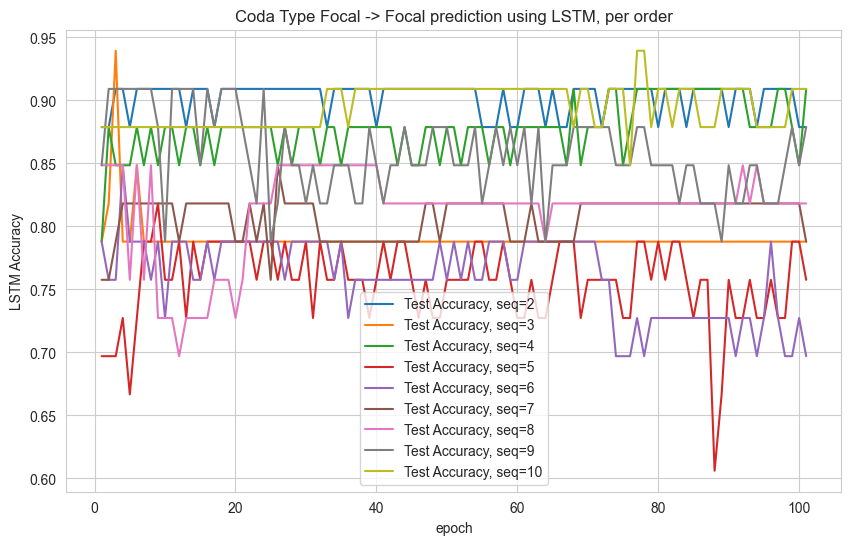

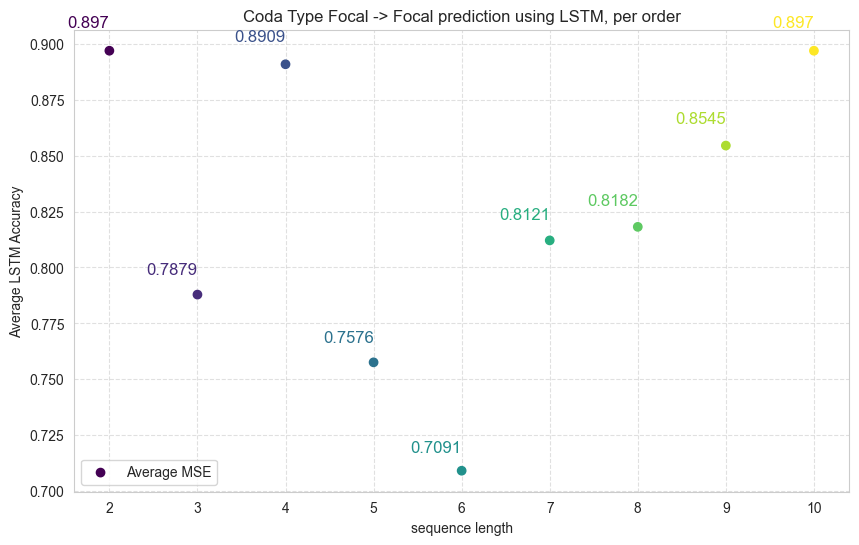

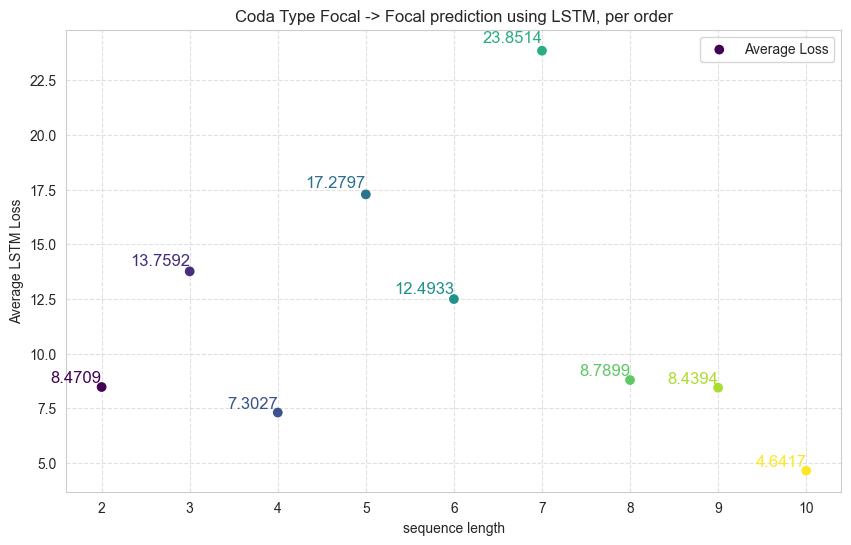

In [32]:
visualize_lstm_coda_type(list(range(2, 11)), 101, accuracy_acc_focal, loss_acc_focal, "Coda Type", "Focal")

#### without limit

In [261]:
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]
accuracy_acc_focal, loss_acc_focal = train_lstm_coda(coda_type_vectors_filterd, 100, "Coda Focal", "Coda Focal", None,
                                                     True, list(range(2, 11)))


Training with num_layers=1, embedding_dim=32, hidden_dim=128, lr=0.01
Coda Focal Coda Focal, Sequence length: 2, samples count: 1191
Epoch [1/100], Train Accuracy: 0.7455, Validation Accuracy: 0.8045, Test Accuracy: 0.7877
Epoch [11/100], Train Accuracy: 0.8151, Validation Accuracy: 0.8212, Test Accuracy: 0.7933
Epoch [21/100], Train Accuracy: 0.8103, Validation Accuracy: 0.8101, Test Accuracy: 0.7877
Epoch [31/100], Train Accuracy: 0.8115, Validation Accuracy: 0.8101, Test Accuracy: 0.8101
Epoch [41/100], Train Accuracy: 0.8187, Validation Accuracy: 0.8212, Test Accuracy: 0.7933
Epoch [51/100], Train Accuracy: 0.8199, Validation Accuracy: 0.8101, Test Accuracy: 0.7821
Epoch [61/100], Train Accuracy: 0.8175, Validation Accuracy: 0.8045, Test Accuracy: 0.7933
Epoch [71/100], Train Accuracy: 0.8247, Validation Accuracy: 0.8045, Test Accuracy: 0.8101
Epoch [81/100], Train Accuracy: 0.8151, Validation Accuracy: 0.7989, Test Accuracy: 0.7877
Epoch [91/100], Train Accuracy: 0.8103, Validati

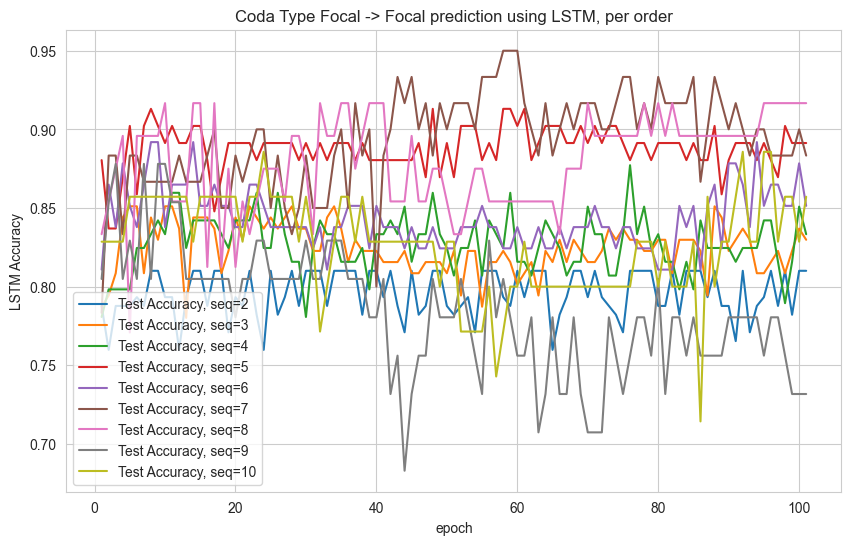

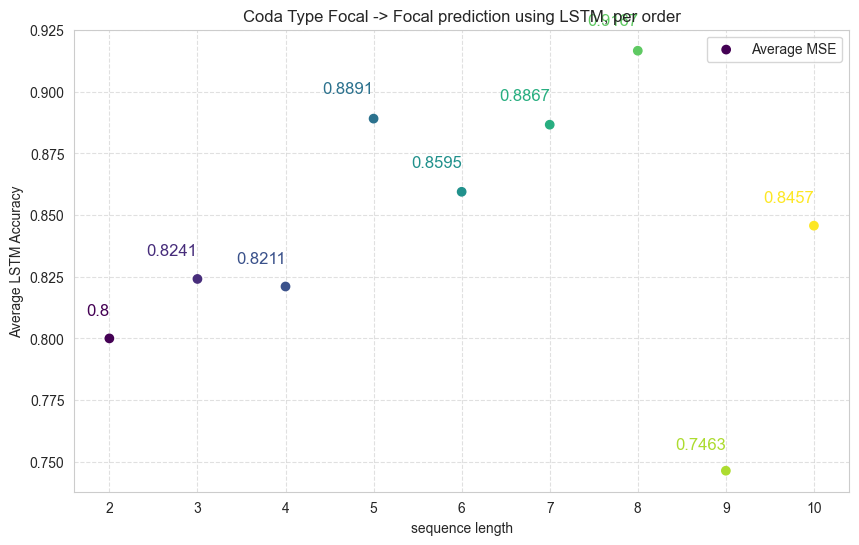

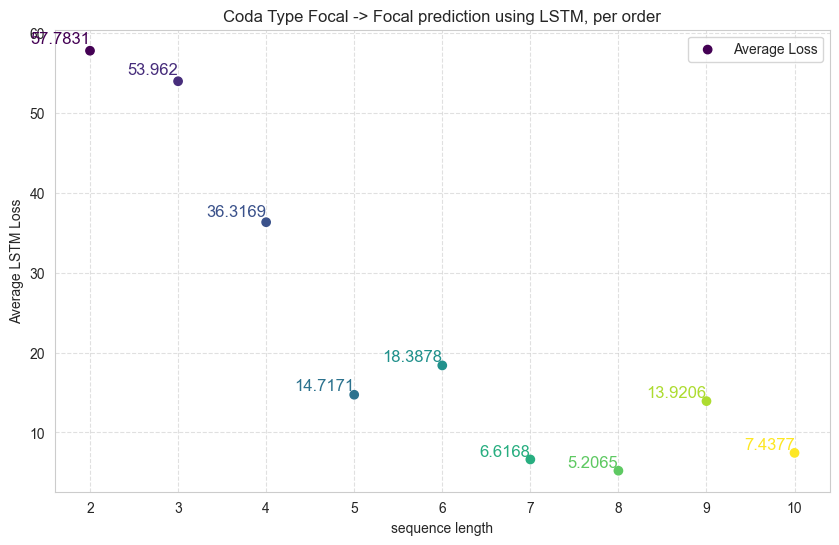

In [265]:
visualize_lstm_coda_type(list(range(2, 11)), 101, accuracy_acc_focal, loss_acc_focal, "Coda Type", "Focal")

In [112]:
def visualize_lstm_coda_type(sequence_length_options, num_epochs, accuracy_acc, loss_acc, col_name_1, col_name_2):
    plt.figure(figsize=(10, 6))
    for i, sequence_length in enumerate(sequence_length_options):
        plt.plot(range(1, num_epochs + 1), accuracy_acc[i], label=f'Test Accuracy, seq={sequence_length}')
    plt.xlabel('epoch')
    plt.ylabel('LSTM Accuracy')
    plt.title(f'{col_name_1} Focal -> {col_name_2} prediction using LSTM, per order')
    plt.legend()
    plt.show()

    colors = plt.cm.viridis(np.linspace(0, 1, len(sequence_length_options)))
    plt.figure(figsize=(10, 6))
    means = [np.mean(lst[-len(accuracy_acc) // 2:]) for lst in accuracy_acc]
    plt.scatter(sequence_length_options, means, color=colors, label='Average MSE')
    for i, mean in enumerate(means):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])
    plt.xlabel('sequence length')
    plt.ylabel('Average LSTM Accuracy')
    plt.title(f'{col_name_1} Focal -> {col_name_2} prediction using LSTM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

    plt.figure(figsize=(10, 6))
    means = [np.mean(lst[-len(loss_acc) // 4:]) for lst in loss_acc]
    plt.scatter(sequence_length_options, means, color=colors, label='Average Loss')
    for i, mean in enumerate(means):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])
    plt.xlabel('sequence length')
    plt.ylabel('Average LSTM Loss')
    plt.title(f'{col_name_1} Focal -> {col_name_2} prediction using LSTM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

#### confusion matrix

In [ ]:
from sklearn.metrics import confusion_matrix

# Create a confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Visualize the confusion matrix using seaborn
plt.figure(figsize=(16, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=clf.classes_, yticklabels=clf.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### Focal -> Non-Focal prediction

#### with limit

In [112]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

accuracy_acc, loss_acc, cm = train_lstm_coda(coda_type_vectors, 100, "Coda Focal", "Coda Non-Focal", 200, True,
                                             list(range(7, 8)), shuffle_data=True, cm_seq=7)


Training with num_layers=1, embedding_dim=32, hidden_dim=128, lr=0.01
Coda Focal Coda Non-Focal, Sequence length: 7, samples count: 649
limited to samples count: 200
Epoch [1/100], Train Accuracy: 0.6500, Validation Accuracy: 0.7000, Test Accuracy: 0.7333
Epoch [11/100], Train Accuracy: 0.7071, Validation Accuracy: 0.7333, Test Accuracy: 0.7000
Epoch [21/100], Train Accuracy: 0.7214, Validation Accuracy: 0.7333, Test Accuracy: 0.7333
Epoch [31/100], Train Accuracy: 0.7857, Validation Accuracy: 0.7000, Test Accuracy: 0.7333
Epoch [41/100], Train Accuracy: 0.8286, Validation Accuracy: 0.7000, Test Accuracy: 0.7000
Epoch [51/100], Train Accuracy: 0.8429, Validation Accuracy: 0.7333, Test Accuracy: 0.7000
Epoch [61/100], Train Accuracy: 0.8429, Validation Accuracy: 0.7000, Test Accuracy: 0.6667
Epoch [71/100], Train Accuracy: 0.8500, Validation Accuracy: 0.7000, Test Accuracy: 0.6000
Epoch [81/100], Train Accuracy: 0.8643, Validation Accuracy: 0.6667, Test Accuracy: 0.6667
Epoch [91/100],

In [114]:
cm

array([[17,  2,  1,  3,  0,  0,  0],
       [ 1,  0,  0,  0,  0,  0,  0],
       [ 0,  0,  1,  0,  0,  0,  0],
       [ 1,  0,  0,  1,  0,  0,  0],
       [ 1,  0,  0,  0,  0,  0,  0],
       [ 1,  0,  0,  0,  0,  0,  0],
       [ 1,  0,  0,  0,  0,  0,  0]], dtype=int64)

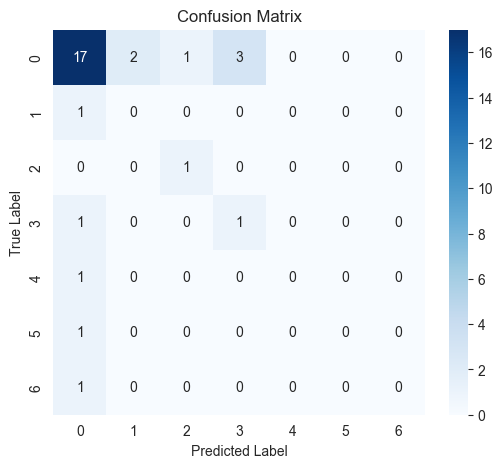

In [113]:
# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

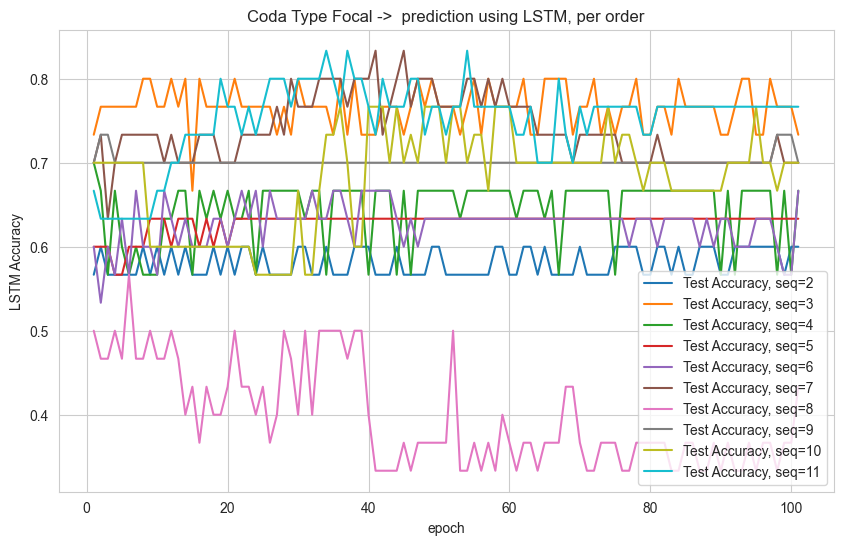

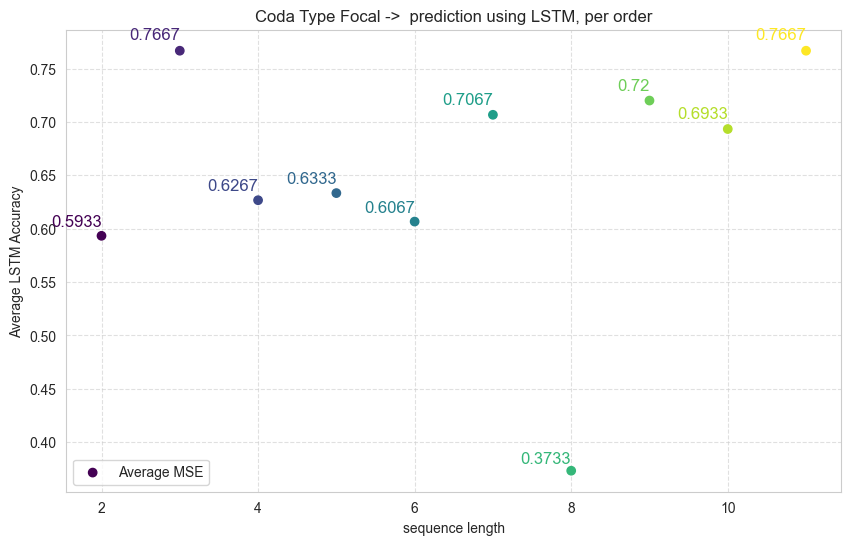

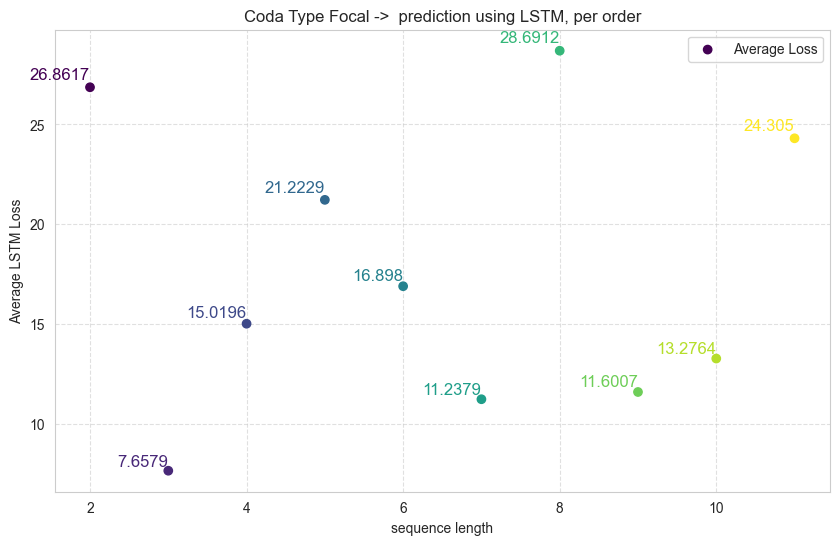

In [43]:
visualize_lstm_coda_type(list(range(2, 12)), 101, accuracy_acc, loss_acc, "Coda Type", "")

#### without limit

In [39]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

accuracy_acc, loss_acc = train_lstm_coda(coda_type_vectors, 100, "Coda Focal", "Coda Non-Focal", None, True,
                                         list(range(2, 12)))


Training with num_layers=1, embedding_dim=32, hidden_dim=128, lr=0.01
Coda Focal Coda Non-Focal, Sequence length: 2, samples count: 1508
Epoch [1/100], Train Accuracy: 0.6104, Validation Accuracy: 0.6283, Test Accuracy: 0.6828
Epoch [11/100], Train Accuracy: 0.6379, Validation Accuracy: 0.5885, Test Accuracy: 0.6740
Epoch [21/100], Train Accuracy: 0.6294, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [31/100], Train Accuracy: 0.6332, Validation Accuracy: 0.6372, Test Accuracy: 0.6520
Epoch [41/100], Train Accuracy: 0.6360, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [51/100], Train Accuracy: 0.6351, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [61/100], Train Accuracy: 0.6294, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [71/100], Train Accuracy: 0.6379, Validation Accuracy: 0.6283, Test Accuracy: 0.6784
Epoch [81/100], Train Accuracy: 0.6360, Validation Accuracy: 0.6283, Test Accuracy: 0.6828
Epoch [91/100], Train Accuracy: 0.6360, Vali

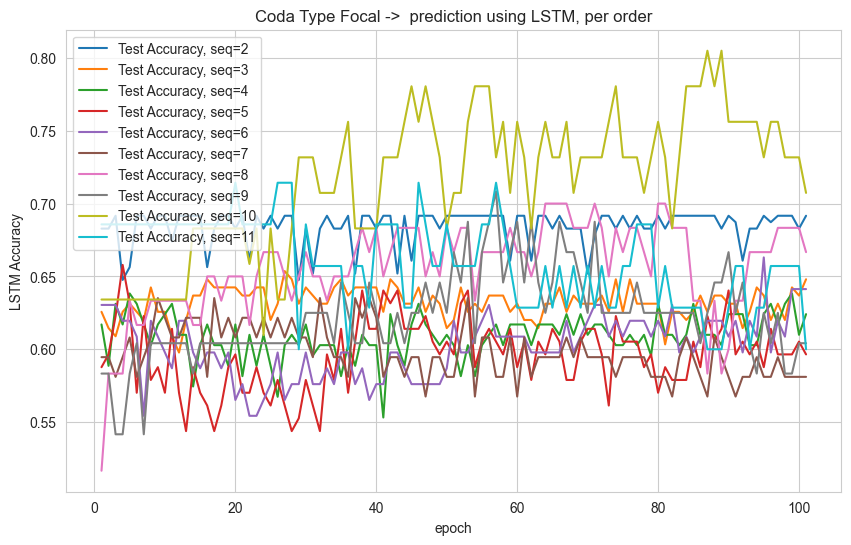

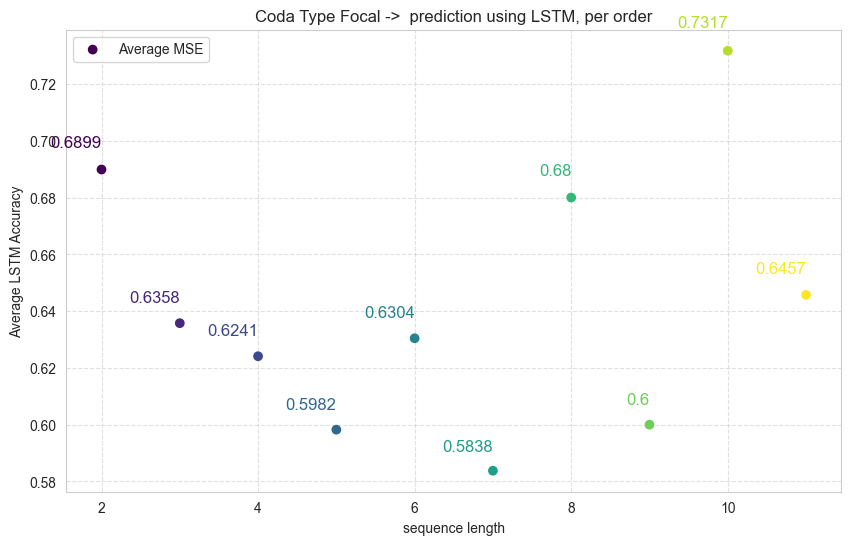

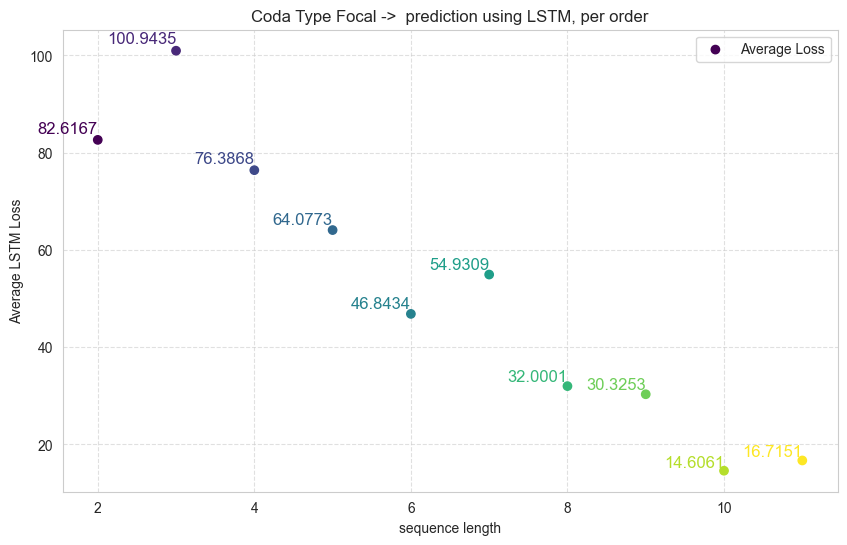

In [41]:
visualize_lstm_coda_type(list(range(2, 12)), 101, accuracy_acc, loss_acc, "Coda Type", "")

### Next coda prediction - full coda history (focal&non-focal)

#### without limit

In [46]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'codas_history',
                                       filterd_coda_types)
accuracy_acc_history, loss_acc_history = train_lstm_coda(coda_type_vectors, 100, "Coda Focal", "Coda Non-Focal", None,
                                                         True,
                                                         list(range(2, 12)), shuffle_data=False)



Training with num_layers=1, embedding_dim=32, hidden_dim=128, lr=0.01
Coda Focal Coda Non-Focal, Sequence length: 2, samples count: 1508
Epoch [1/100], Train Accuracy: 0.6692, Validation Accuracy: 0.2080, Test Accuracy: 0.3172
Epoch [11/100], Train Accuracy: 0.7090, Validation Accuracy: 0.2080, Test Accuracy: 0.2863
Epoch [21/100], Train Accuracy: 0.7109, Validation Accuracy: 0.2080, Test Accuracy: 0.3084
Epoch [31/100], Train Accuracy: 0.7175, Validation Accuracy: 0.1726, Test Accuracy: 0.3216
Epoch [41/100], Train Accuracy: 0.7109, Validation Accuracy: 0.2080, Test Accuracy: 0.3084
Epoch [51/100], Train Accuracy: 0.7090, Validation Accuracy: 0.2080, Test Accuracy: 0.3260
Epoch [61/100], Train Accuracy: 0.7118, Validation Accuracy: 0.2080, Test Accuracy: 0.3128
Epoch [71/100], Train Accuracy: 0.7147, Validation Accuracy: 0.2080, Test Accuracy: 0.3128
Epoch [81/100], Train Accuracy: 0.7071, Validation Accuracy: 0.2080, Test Accuracy: 0.3524
Epoch [91/100], Train Accuracy: 0.7062, Vali

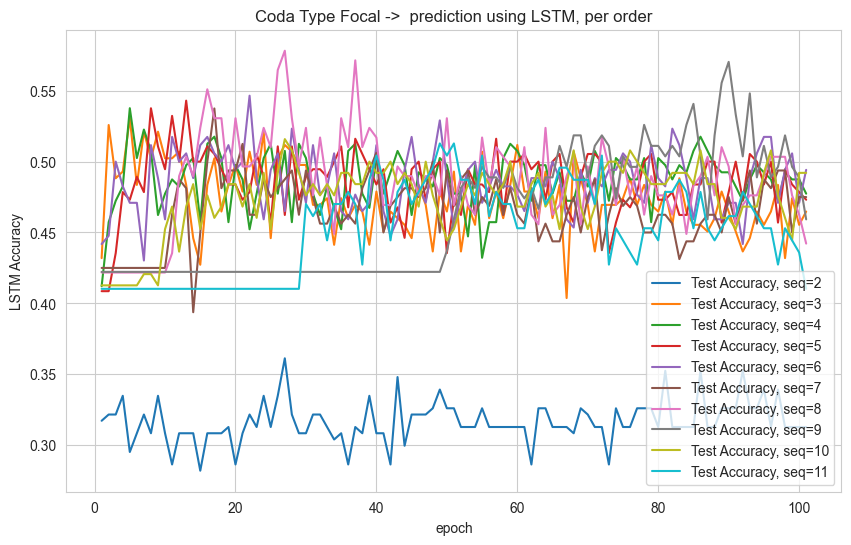

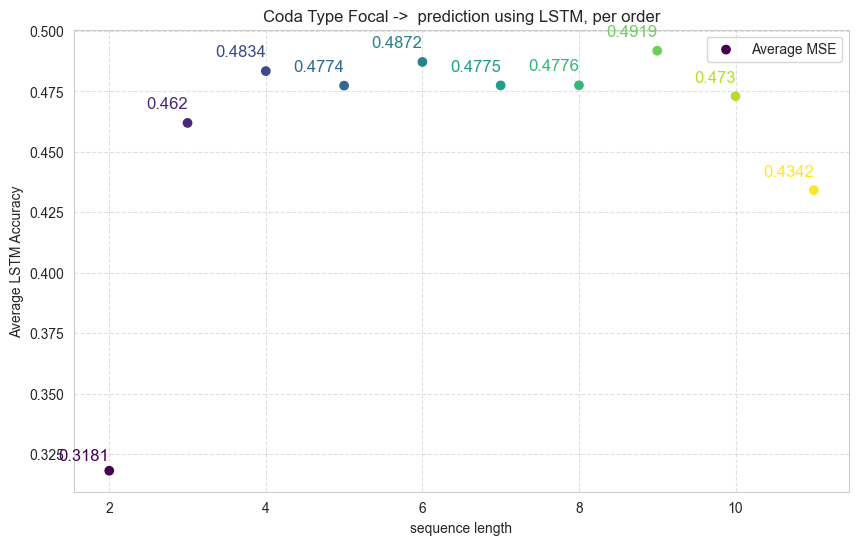

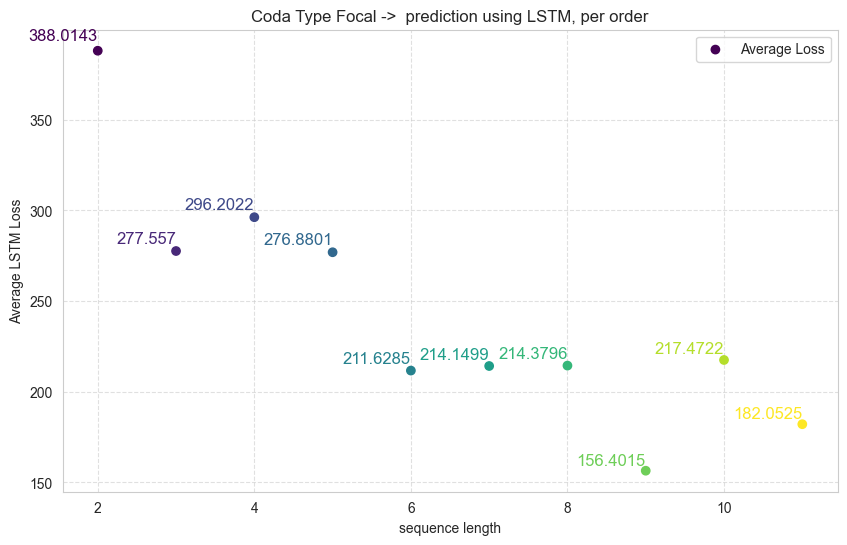

In [48]:
visualize_lstm_coda_type(list(range(2, 12)), 101, accuracy_acc_history, loss_acc_history, "Coda Type", "")

In [52]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'codas_history',
                                       filterd_coda_types)
accuracy_acc_history, loss_acc_history = train_lstm_coda(coda_type_vectors, 100, "Coda Focal", "Coda Non-Focal", None,
                                                         True,
                                                         list(range(2, 12)), shuffle_data=True)


Training with num_layers=1, embedding_dim=32, hidden_dim=128, lr=0.01
Coda Focal Coda Non-Focal, Sequence length: 2, samples count: 1508
Epoch [1/100], Train Accuracy: 0.5943, Validation Accuracy: 0.6106, Test Accuracy: 0.6696
Epoch [11/100], Train Accuracy: 0.6332, Validation Accuracy: 0.6283, Test Accuracy: 0.6828
Epoch [21/100], Train Accuracy: 0.6303, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [31/100], Train Accuracy: 0.6417, Validation Accuracy: 0.6283, Test Accuracy: 0.6828
Epoch [41/100], Train Accuracy: 0.6379, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [51/100], Train Accuracy: 0.6227, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [61/100], Train Accuracy: 0.6398, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [71/100], Train Accuracy: 0.6379, Validation Accuracy: 0.6283, Test Accuracy: 0.6828
Epoch [81/100], Train Accuracy: 0.6294, Validation Accuracy: 0.6283, Test Accuracy: 0.6916
Epoch [91/100], Train Accuracy: 0.6303, Vali

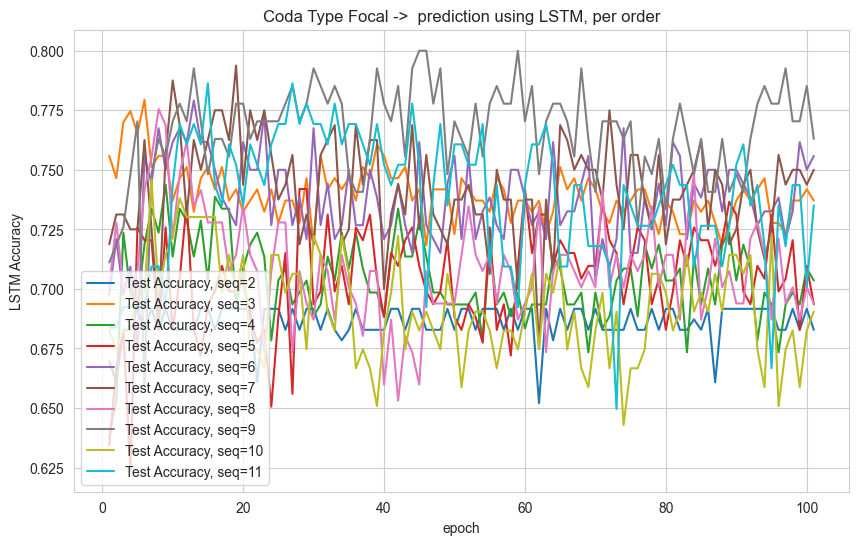

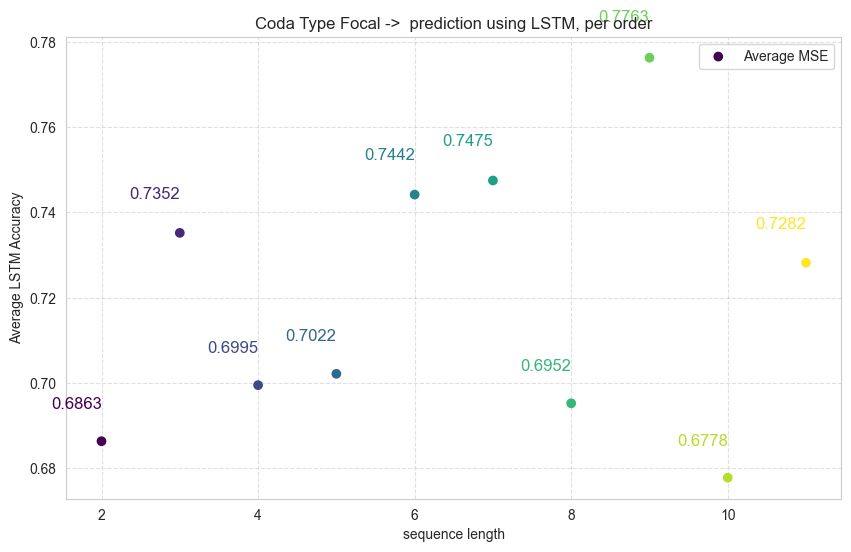

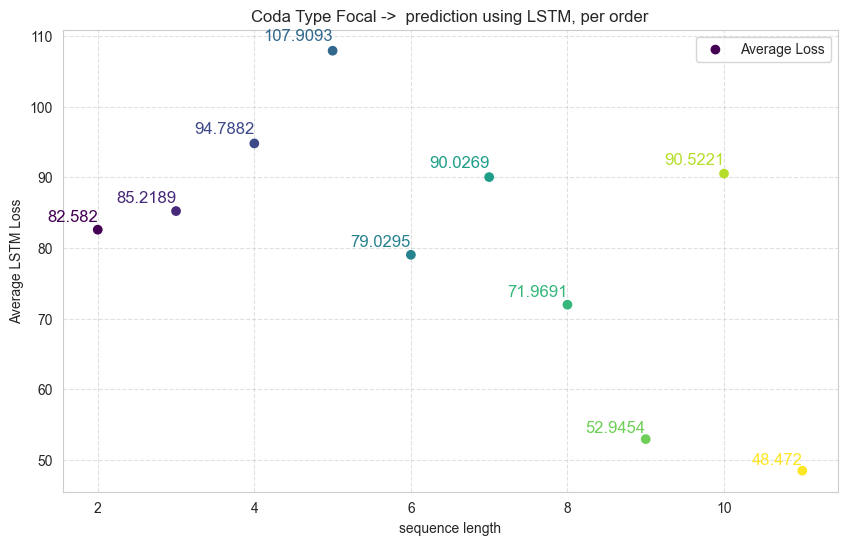

In [53]:
visualize_lstm_coda_type(list(range(2, 12)), 101, accuracy_acc_history, loss_acc_history, "Coda Type", "")


## HMM

### utils

In [24]:
def predict_next_observation(A, B, pi, observations):
    """
    Predicts the most likely next observation in an HMM.
    
    Args:
        A (numpy.ndarray): Transition matrix of the HMM.
        B (numpy.ndarray): Emission matrix of the HMM.
        pi (numpy.ndarray): Initial state probabilities.
        observations (list): List of past 4 observations.
    
    Returns:
        int: The most likely next observation (index).
    """
    # Get the number of states and number of possible observations
    num_states = A.shape[0]
    num_observations = B.shape[1]

    # Forward probabilities for the past 4 observations
    alpha = np.zeros((num_states, len(observations)))
    alpha[:, 0] = pi * B[:, observations[0]]  # Initial probabilities for first observation

    for t in range(1, len(observations)):
        for i in range(num_states):
            alpha[i, t] = np.sum(alpha[:, t - 1] * A[:, i]) * B[i, observations[t]]

    # Calculate probabilities of next observation given each state
    next_observation_probs = np.zeros(num_observations)
    for i in range(num_states):
        next_observation_probs += alpha[i, -1] * B[i, :]

    # Find the index of the most likely next observation
    predicted_observation = np.argmax(next_observation_probs)

    return predicted_observation


def predict_next_coda_observation(X, hmm, n_components):
    obs_true = []
    obs_pred = []

    for seq in X:
        obs_true.append(seq[-1])

        predicted_next_observation_index = predict_next_observation(A=hmm.a, B=hmm.b, pi=hmm.pi, observations=seq[:-1])
        obs_pred.append(predicted_next_observation_index)

    return obs_true, obs_pred

### Train loop

In [25]:
def visualize_hmm_coda_type(sequence_length_options, num_epochs, accuracy_acc, col_name_1, col_name_2):
    plt.figure(figsize=(10, 6))
    for i, sequence_length in enumerate(sequence_length_options):
        plt.plot(range(1, num_epochs + 1), accuracy_acc[i], label=f'Test Accuracy, seq={sequence_length}')
    plt.xlabel('epoch')
    plt.ylabel('HMM Accuracy')
    plt.title(f'{col_name_1} Focal -> {col_name_2} prediction using HMM, per order')
    plt.legend()
    plt.show()

    colors = plt.cm.viridis(np.linspace(0, 1, len(sequence_length_options)))
    plt.figure(figsize=(10, 6))
    means = [np.mean(lst[-len(accuracy_acc) // 4:]) for lst in accuracy_acc]
    plt.scatter(sequence_length_options, means, color=colors, label='Average Accuracy')
    for i, mean in enumerate(means):
        plt.text(sequence_length_options[i], mean * 1.01, round(mean, 4), fontsize=12, ha='right', va='bottom',
                 color=colors[i])
    plt.xlabel('sequence length')
    plt.ylabel('Average HMM Accuracy')
    plt.title(f'{col_name_1} Focal -> {col_name_2} prediction using HMM, per order')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

In [26]:
import hmms

test_size_ratio = 0.2


def train_hmm_coda_type_pred(vectors, n_iter, num_hidden_states, label1, label2, limit_vectors=250, log=False,
                             sequence_length_options=list(range(2, 12)), shuffle_data=True):
    print(f"\nTraining HMM with num_hidden_states={num_hidden_states}, n_iter={n_iter}")
    accuracy_acc = []

    for sequence_length in sequence_length_options:
        # filter vectors
        filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        # encode coda types
        data = np.array([np.array([vocab2id[word] for word in sequence]) for sequence in filtered_vectors])
        X_train, X_test = train_test_split(data, test_size=test_size_ratio, random_state=42, shuffle=shuffle_data)

        # init random distribution
        start_probs = np.random.rand(num_hidden_states)
        start_probs = np.array(start_probs / start_probs.sum())
        emission_probs = np.random.rand(num_hidden_states, len(coda_types))
        emission_probs /= emission_probs.sum(axis=1, keepdims=True)
        trans_mat = np.random.rand(num_hidden_states, num_hidden_states)
        trans_mat /= trans_mat.sum(axis=1, keepdims=True)

        # fit HMM
        dhmm_codas = hmms.DtHMM(A=trans_mat, B=emission_probs, Pi=start_probs)

        accuracy = []
        intervals = 5
        for i in range(0, n_iter, intervals):
            dhmm_codas.baum_welch(e_seqs=X_train, iterations=intervals)

            # calculate accuracy
            obs_true, obs_pred = predict_next_coda_observation(X_test, dhmm_codas, num_hidden_states)
            obs_true_train, obs_pred_train = predict_next_coda_observation(X_train, dhmm_codas, num_hidden_states)
            print(
                f'HMM Test Accuracy Score: {100 * accuracy_score(obs_true, obs_pred):.3f} % Train Accuracy Score: {100 * accuracy_score(obs_true_train, obs_pred_train):.3f} %')
            accuracy.append(accuracy_score(obs_true, obs_pred))
        accuracy_acc.append(accuracy)

    return accuracy_acc

## Focal -> Focal prediction

In [29]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]
num_hidden_states = 20
print(f"num_hidden_states={num_hidden_states}")
accuracy_acc = train_hmm_coda_type_pred(coda_type_vectors_filterd, 60, num_hidden_states, "Coda Focal",
                                        "Coda Non-Focal", None,
                                        False,
                                        list(range(2, 12)), False)


num_hidden_states=20

Training HMM with num_hidden_states=20, n_iter=60
Coda Focal Coda Non-Focal, Sequence length: 2, samples count: 1191
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 52.301 % Train Accuracy Score: 67.542 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.690 % Train Accuracy Score: 79.727 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.272 % Train Accuracy Score: 79.832 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.272 % Train Accuracy Score: 79.832 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.272 % Train Accuracy Score: 79.832 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5


KeyboardInterrupt: 

In [ ]:
visualize_hmm_coda_type(list(range(2, 11)), 12, accuracy_acc, "Coda Type", "Focal")


### Focal -> Non-Focal prediction

#### with limit

In [30]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

num_hidden_states = 20
print(f"num_hidden_states={num_hidden_states}")
accuracy_acc = train_hmm_coda_type_pred(coda_type_vectors, 60, num_hidden_states, "Coda Focal",
                                        "Coda Non-Focal", 200,
                                        False,
                                        list(range(2, 11)), False)

num_hidden_states=20

Training HMM with num_hidden_states=20, n_iter=60
Coda Focal Coda Non-Focal, Sequence length: 2, samples count: 1508
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 55.000 % Train Accuracy Score: 60.625 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 60.000 % Train Accuracy Score: 63.125 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.000 % Train Accuracy Score: 63.750 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.000 % Train Accuracy Score: 63.750 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.000 % Train Accuracy Score: 62.500 %
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 6

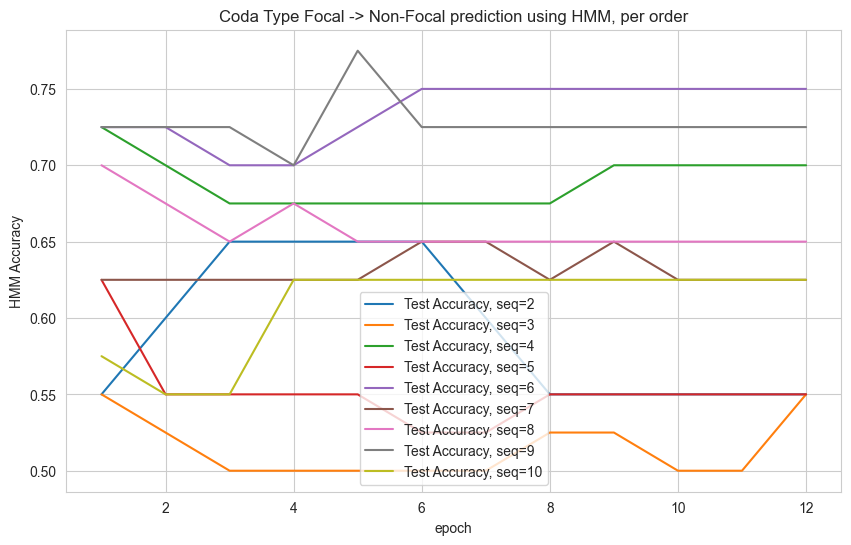

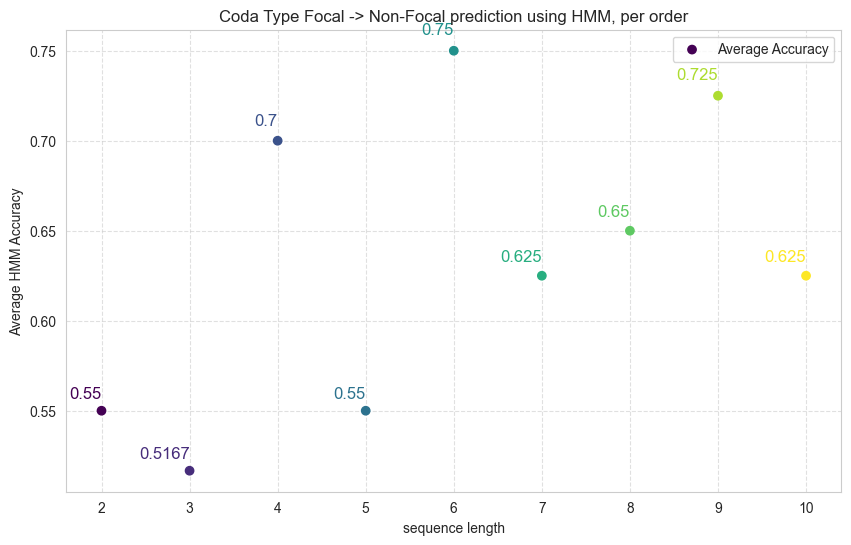

In [31]:
visualize_hmm_coda_type(list(range(2, 11)), 12, accuracy_acc, "Coda Type", "Non-Focal")

In [68]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

num_hidden_states = 25
print(f"num_hidden_states={num_hidden_states}")
accuracy_acc = train_hmm_coda_type_pred(coda_type_vectors, 5, num_hidden_states, "Coda Focal",
                                        "Coda Non-Focal", None,
                                        True,
                                        list(range(8, 9)), True)

num_hidden_states=1

Training HMM with num_hidden_states=1, n_iter=5
Coda Focal Coda Non-Focal, Sequence length: 8, samples count: 544
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.138 % Train Accuracy Score: 63.218 %
num_hidden_states=2

Training HMM with num_hidden_states=2, n_iter=5
Coda Focal Coda Non-Focal, Sequence length: 8, samples count: 544
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 65.138 % Train Accuracy Score: 63.218 %
num_hidden_states=3

Training HMM with num_hidden_states=3, n_iter=5
Coda Focal Coda Non-Focal, Sequence length: 8, samples count: 544
iteration  1 / 5
iteration  2 / 5
iteration  3 / 5
iteration  4 / 5
iteration  5 / 5
HMM Test Accuracy Score: 57.798 % Train Accuracy Score: 63.908 %
num_hidden_states=4

Training HMM with num_hidden_states=4, n_iter=5
Coda Focal Coda Non-Focal, Sequence length: 8, samples count: 544
iteration 

KeyboardInterrupt: 

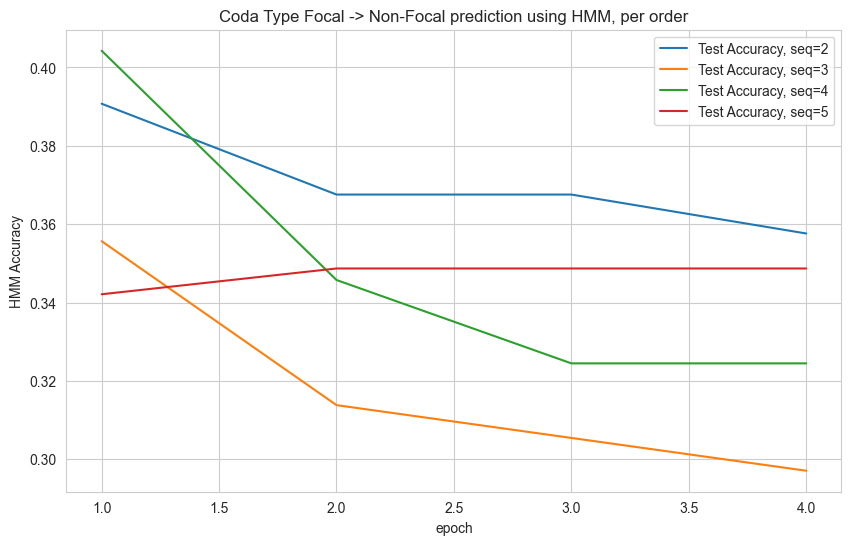

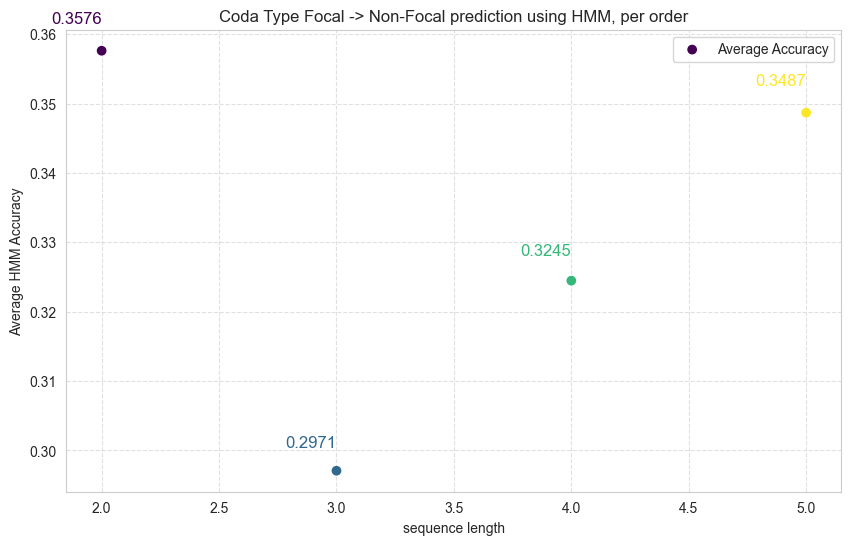

In [35]:
visualize_hmm_coda_type(list(range(2, 6)), 4, accuracy_acc, "Coda Type", "Non-Focal")

# ICI vector pred

## LSTM

In [14]:
print(f'PyTorch version: {torch.__version__}')
print('*' * 10)

# Check if GPU is available
torch.cuda.init()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f'Torch device available: {device}')
print(f'Available GPU devices: {torch.cuda.device_count()}')
print(f'Device Name: {torch.cuda.get_device_name()}')
print('*' * 10)

PyTorch version: 2.1.1+cu121
**********
Torch device available: cuda
Available GPU devices: 1
Device Name: NVIDIA GeForce RTX 3050 Ti Laptop GPU
**********


In [80]:
class LSTMModel_ICI_vector(nn.Module):
    def __init__(self, device, input_size, output_size, hidden_dim, num_layers, dropout_rate):
        super(LSTMModel_ICI_vector, self).__init__()
        self.num_layers = num_layers
        self.hidden_dim = hidden_dim
        self.device = device

        self.lstm1 = nn.LSTM(input_size, hidden_dim, num_layers, batch_first=True, bidirectional=True)
        self.dropout1 = nn.Dropout(dropout_rate)
        self.fc1 = nn.Linear(hidden_dim * 2, hidden_dim)  # Bidirectional LSTM, so double hidden_dim
        self.lstm2 = nn.LSTM(hidden_dim, hidden_dim, num_layers)
        self.dropout2 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, output_size)

    def forward(self, x):
        # Initialize hidden and cell states
        batch_size = x.size(0)
        h0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.num_layers, batch_size, self.hidden_dim).to(x.device)

        # Forward propagation
        packed_out, _ = self.lstm1(x, (h0, c0))

        # output, _ = self.lstm1(x)
        output = output[:, -1, :]  # Get the last hidden state
        output = self.dropout1(output)
        # if output.ndim > 2:
        output = self.fc1(output)
        output, _ = self.lstm2(output)
        output = self.dropout2(output)
        output = self.fc2(output)

        return output

In [18]:
# def train_loop_ici(dataloader, model, criterion, optimizer, device):
#     model.train()
#     total_loss = 0.0
#     total_mse = 0.0
#     batch_count = 0
# 
#     for inputs, targets in dataloader:
#         inputs, targets = inputs.to(device), targets.to(device)
# 
#         # Forward pass
#         optimizer.zero_grad()
#         outputs = model(inputs)
#         loss = criterion(outputs, targets)
# 
#         # Backward pass and optimization
#         loss.backward()
#         optimizer.step()
#         total_loss += loss.item()
# 
#         # Compute MSE for the batch
#         if targets.var(unbiased=False) != 0:
#             batch_mse = F.mse_loss(outputs, targets).item()
#             # batch_mse /= (targets.var(unbiased=False))
#             total_mse += batch_mse
#             batch_count += 1
# 
#     avg_mse = total_mse / batch_count if batch_count > 0 else 0
#     avg_loss = total_loss / batch_count if batch_count > 0 else 0
# 
#     return avg_mse, avg_loss


def compute_euclidean_distance_torch(tensor1, tensor2):
  """
  Computes the Euclidean Distance between two PyTorch tensors.

  Args:
    tensor1 (torch.Tensor): The first tensor.
    tensor2 (torch.Tensor): The second tensor.

  Returns:
    float: The Euclidean Distance between the two tensors.

  Raises:
    ValueError: If the input tensors do not have the same shape.
  """
  # Ensure tensors have the same shape for element-wise operations
  if tensor1.shape != tensor2.shape:
    raise ValueError("Input tensors must have the same shape for Euclidean distance calculation.")

  # PyTorch's torch.dist computes the Lp norm. p=2 for Euclidean distance (L2 norm).
  # The result is a single scalar tensor representing the distance.
  euclidean_distance = torch.dist(tensor1, tensor2, p=2)

  return euclidean_distance.item() # Return as a standard Python number

def train_loop_ici(dataloader, model, criterion, optimizer, device):
    """
    Trains the model for one epoch, calculating loss and Euclidean distance per batch.

    Args:
      dataloader (torch.utils.data.DataLoader): DataLoader for the training data.
      model (torch.nn.Module): The model to train.
      criterion (torch.nn.Module): The loss function.
      optimizer (torch.optim.Optimizer): The optimizer.
      device (torch.device): The device (CPU or GPU) to run the training on.

    Returns:
      tuple: A tuple containing the average Euclidean distance and average loss
             across all batches.
    """
    model.train()
    total_loss = 0.0
    total_euclidean_distance = 0.0 # Renamed from total_mse
    batch_count = 0

    for inputs, targets in dataloader:
        # Move data to the specified device
        inputs, targets = inputs.to(device), targets.to(device)

        # Forward pass
        optimizer.zero_grad() # Clear previous gradients
        outputs = model(inputs) # Get model predictions

        # Calculate the loss for backpropagation
        loss = criterion(outputs, targets)

        # Backward pass and optimization
        loss.backward() # Compute gradients
        optimizer.step() # Update model parameters

        # Accumulate the loss
        total_loss += loss.item()

        # Compute Euclidean Distance for the batch and accumulate
        # Using the helper function for clarity, or torch.dist directly
        batch_euclidean_distance = compute_euclidean_distance_torch(outputs, targets)
        total_euclidean_distance += batch_euclidean_distance
        batch_count += 1

    # Calculate average metrics
    avg_euclidean_distance = total_euclidean_distance / batch_count if batch_count > 0 else 0 # Renamed from avg_mse
    avg_loss = total_loss / batch_count if batch_count > 0 else 0

    return avg_euclidean_distance, avg_loss # Return average Euclidean distance and average loss

# Note: This code assumes 'outputs' and 'targets' are PyTorch tensors.
# The 'criterion' is the loss function used for training (e.g., F.mse_loss, F.cross_entropy, etc.)
# and remains unchanged as per the request to only replace the metric calculation.

def eval_loop_ici(dataloader, model, criterion, device):
    """
    Evaluates the model for one epoch, calculating loss and Euclidean distance per batch.

    Args:
      dataloader (torch.utils.data.DataLoader): DataLoader for the evaluation data.
      model (torch.nn.Module): The model to evaluate.
      criterion (torch.nn.Module): The loss function.
      device (torch.device): The device (CPU or GPU) to run the evaluation on.

    Returns:
      tuple: A tuple containing the average Euclidean distance and average loss
             across all batches.
    """
    model.eval() # Set the model to evaluation mode
    total_loss = 0.0
    total_euclidean_distance = 0.0 # Renamed from total_mse
    batch_count = 0

    # Disable gradient calculation during evaluation
    with torch.no_grad():

        for inputs, targets in dataloader: 
            # Move data to the specified device
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs) 

            # Compute loss
            loss = criterion(outputs, targets)
            total_loss += loss.item() # Accumulate the loss

            # Compute Euclidean Distance for the batch and accumulate
            # Using the helper function for clarity
            batch_euclidean_distance = compute_euclidean_distance_torch(outputs, targets)
            total_euclidean_distance += batch_euclidean_distance
            batch_count += 1

    # Calculate average metrics
    avg_euclidean_distance = total_euclidean_distance / batch_count if batch_count > 0 else 0 # Renamed from avg_mse
    avg_loss = total_loss / batch_count if batch_count > 0 else 0

    return avg_euclidean_distance, avg_loss # Return average Euclidean distance and average loss


# def eval_loop_ici(dataloader, model, criterion, device):
#     model.eval()
#     total_loss = 0.0
#     total_mse = 0.0
#     batch_count = 0
# 
#     with torch.no_grad():
#         for inputs, targets, lengths in dataloader:
#             inputs, targets = inputs.to(device), targets.to(device)
# 
#             # Forward pass
#             outputs = model(inputs, lengths)
# 
#             # Compute loss
#             loss = criterion(outputs, targets)
#             total_loss += loss.item()
# 
#             # Compute accuracy
#             if targets.var(unbiased=False) != 0:
#                 batch_mse = F.mse_loss(outputs, targets).item()
#                 #batch_mse /= (targets.var(unbiased=False))
#                 total_mse += batch_mse
#                 batch_count += 1
# 
#     avg_mse = total_mse / batch_count if batch_count > 0 else 0
#     avg_loss = total_loss / batch_count if batch_count > 0 else 0
# 
#     return avg_mse, avg_loss

In [17]:
def get_loaders_ici_vectors(data, shuffle=True):
    X, y = [], []
    if shuffle:
        np.random.seed(42)
        np.random.shuffle(data)

    for seq in data:
        X.append(seq[:-1])
        y.append(seq[-1])

    X = torch.tensor(X, dtype=torch.float32).to(device)
    y = torch.tensor(y, dtype=torch.float32).to(device)

    train_data = TensorDataset(X[:int(0.7 * len(X))].to(device), y[:int(0.7 * len(y))].to(device))
    val_data = TensorDataset(X[int(0.7 * len(X)):int(0.85 * len(X))].to(device),
                             y[int(0.7 * len(y)):int(0.85 * len(y))].to(device))
    test_data = TensorDataset(X[int(0.85 * len(X)):].to(device), y[int(0.85 * len(y)):].to(device))

    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader, X.shape[1]

In [16]:
# Pad sequences for batching
def collate_fn(batch):
    x, y = zip(*batch)
    x_padded = pad_sequence(x, batch_first=True, padding_value=0)
    y = torch.stack(y)
    lengths = torch.tensor([len(seq) for seq in x])
    return x_padded, y, lengths

### data preprocess

In [15]:
def ici_vectors_sequences_by_context(sequences, context_size):
    window_sequences = []
    for group in sequences:
        if len(group) >= context_size:
            for i in range(len(group) - context_size + 1):
                window_sequences.append(group[i:i + context_size].astype(np.float32))
    return window_sequences

In [13]:
def filter_vectors_by_size(vectors, size):
    return [vec[-size:] for vec in vectors if len(vec) >= size]

In [86]:
X, y = [], []
for seq in filter_vectors_by_size(ici_vectors, 4):
    X.append(seq[:-1])
    y.append(seq[-1])

### train loop

In [87]:
batch_size = 5
hidden_dim = 128
embedding_dim = 64
lr = 0.005
num_layers = 2
dropout_rate = 0.15
vocab_size = len(coda_types)


#### train
def train_ici_coda(vectors, num_epochs, label1, label2, limit_vectors=250, log=False,
                   sequence_length_options=list(range(2, 12)), shuffle_data=True, cm_seq=5):
    print(f"\nTraining with num_layers={num_layers}, embedding_dim={embedding_dim}, hidden_dim={hidden_dim}, lr={lr}")
    accuracy_acc = []
    loss_acc = []

    for sequence_length in sequence_length_options:
        filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        train_loader, val_loader, test_loader, input_shape = get_loaders_ici_vectors(filtered_vectors, shuffle_data)

        model = LSTMModel_ICI_vector(device, X.shape[2], X.shape[2], hidden_dim, num_layers, dropout_rate).to(
            device)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=lr)

        # Training loop
        train_accuracies = []
        val_accuracies = []
        test_accuracies = []
        val_losses = []
        train_losses = []
        test_losses = []

        for epoch in range(num_epochs + 1):
            train_accuracy, train_loss = train_loop_ici(train_loader, model, criterion, optimizer, device)
            val_accuracy, val_loss = eval_loop_ici(val_loader, model, criterion, device)
            test_accuracy, test_loss = eval_loop_ici(test_loader, model, criterion, device)

            train_accuracies.append(train_accuracy)
            val_accuracies.append(val_accuracy)
            test_accuracies.append(test_accuracy)
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            test_losses.append(test_loss)

            if epoch % 10 == 0:
                if log: print(
                    f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}")

        accuracy_acc.append(test_accuracies)
        loss_acc.append(test_losses)

    return accuracy_acc, loss_acc

In [96]:
ici_vectors = get_ici_vectors(coda_df.reset_index(drop=True), 'past_codas', ['overlap_pair',
                                                                             'non_overlap_pair', 'reverse_overlap_pair',
                                                                             'reverse_non_overlap_pair'])


In [97]:
ici_vectors

[[array([0.03395  , 0.0361166, 0.0488667, 0.0489083, 0.042275 , 0.0404834,
         0.040975 , 0.0396083, 0.0421334, 0.0416916]),
  array([0.0328166, 0.0393584, 0.045325 , 0.0499333, 0.0440834, 0.0447833,
         0.0436833, 0.04065  , 0.0421917, 0.0428083]),
  array([0.27585  , 0.2867833, 0.1974   , 0.1382167, 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       ]),
  array([0.262275 , 0.2768833, 0.1833333, 0.1430834, 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       ]),
  array([0.266675 , 0.2693583, 0.178325 , 0.1439583, 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       ]),
  array([0.2686583, 0.2851417, 0.1784083, 0.1297333, 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       ]),
  array([0.2522667, 0.2530833, 0.1827334, 0.1507416, 0.       , 0.       ,
         0.       , 0.       , 0.       , 0.       ]),
  array([0.2584333, 0.2746417, 0.174025 , 0.1376333, 0.       , 0.       ,
         0.    

In [98]:
accuracy_acc_focal, loss_acc_focal = train_ici_coda(ici_vectors, 100, "ICI Focal", "ICI Non-Focal", None,
                                                    True, list(range(2, 3)))



Training with num_layers=2, embedding_dim=64, hidden_dim=128, lr=0.005
ICI Focal ICI Non-Focal, Sequence length: 2, samples count: 1508


C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\2454063301.py:11: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_new.cpp:264.)
  X = torch.tensor(X, dtype=torch.float32).to(device)


AttributeError: 'list' object has no attribute 'shape'

## try 2

In [19]:
# param_grid = {'num_layers': [1, 2, 3],
#               'embedding_dim': [128],
#               'hidden_dim': [64, 128],
#               'lr': [0.001]}

best_val_loss = float('inf')
best_model = None
params = None

In [20]:
class LSTMModel_ICI(nn.Module):
    def __init__(self, device, input_size, output_size, hidden_dim, num_layers, dropout_rate):
        super(LSTMModel_ICI, self).__init__()
        self.num_layers = num_layers
        self.hidden_dim = hidden_dim
        self.device = device

        self.lstm1 = nn.LSTM(input_size, hidden_dim, num_layers, batch_first=True, bidirectional=True)
        self.dropout1 = nn.Dropout(dropout_rate)
        self.fc1 = nn.Linear(hidden_dim * 2, hidden_dim)  # Bidirectional LSTM, so double hidden_dim
        self.lstm2 = nn.LSTM(hidden_dim, hidden_dim, num_layers)
        self.dropout2 = nn.Dropout(dropout_rate)
        self.fc2 = nn.Linear(hidden_dim, output_size)

    def forward(self, x):
        # Initialize hidden and cell states
        h0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_dim)
        c0 = torch.zeros(self.num_layers * 2, x.size(0), self.hidden_dim)

        # Forward propagation
        output, _ = self.lstm1(x, (h0.to(self.device), c0.to(self.device)))

        # output, _ = self.lstm1(x)
        output = output[:, -1, :]  # Get the last hidden state
        output = self.dropout1(output)
        # if output.ndim > 2:
        output = self.fc1(output)
        output, _ = self.lstm2(output)
        output = self.dropout2(output)
        output = self.fc2(output)

        return output

In [21]:
def train_loop(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0.0
    total_mse = 0.0
    batch_count = 0

    for inputs, targets in dataloader:
        inputs, targets = inputs.to(device), targets.to(device)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        # Compute accuracy
        if targets.var(unbiased=False) != 0:
            total_loss += loss.item()
            batch_mse = F.mse_loss(outputs, targets).item()
            # batch_mse /= (targets.var(unbiased=False))
            total_mse += batch_mse
            batch_count += 1

    avg_mse = total_mse / batch_count if batch_count > 0 else 0
    avg_loss = total_loss / batch_count if batch_count > 0 else 0

    return avg_mse, avg_loss


def eval_loop(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0.0
    total_mse = 0.0
    batch_count = 0

    with torch.no_grad():
        for inputs, targets in dataloader:
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)

            # Compute loss
            loss = criterion(outputs, targets)

        if targets.var(unbiased=False) != 0:
            total_loss += loss.item()
            batch_mse = F.mse_loss(outputs, targets).item()
            # batch_mse /= (targets.var(unbiased=False))
            total_mse += batch_mse
            batch_count += 1

    avg_mse = total_mse / batch_count if batch_count > 0 else 0
    avg_loss = total_loss / batch_count if batch_count > 0 else 0

    return avg_mse, avg_loss

In [22]:
def get_loaders_ici_vectors_n(data, shuffle=False):
    if shuffle:
        np.random.seed(42)
        np.random.shuffle(data)

    X, y = [], []
    for seq in data:
        X.append(seq[:-1])
        y.append(seq[-1])

    X = torch.tensor(X, dtype=torch.float32).to(device)
    y = torch.tensor(y, dtype=torch.float32).to(device)

    train_data = TensorDataset(X[:int(0.7 * len(X))].to(device), y[:int(0.7 * len(y))].to(device))
    val_data = TensorDataset(X[int(0.7 * len(X)):int(0.85 * len(X))].to(device),
                             y[int(0.7 * len(y)):int(0.85 * len(y))].to(device))
    test_data = TensorDataset(X[int(0.85 * len(X)):].to(device), y[int(0.85 * len(y)):].to(device))

    train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader

In [23]:
batch_size = 16
vocab_size = len(coda_types)
embedding_dim = 32
hidden_dim = 64
lr = 0.00002
num_layers = 4
num_epochs = 150
dropout_rate = 0.15

param_grid = {'num_layers': [4],
              'embedding_dim': [128],
              'hidden_dim': [256],
              'lr': [0.0001]}

In [24]:
def train_ici_vectors(vectors, num_epochs, label1, label2, limit_vectors=250, log=False,
                      sequence_length_options=list(range(2, 12)), shuffle_data=True):
    accuracy_acc = []
    loss_acc = []

    print(f"\nTraining with num_layers={num_layers}, embedding_dim={embedding_dim}, hidden_dim={hidden_dim}, lr={lr}")

    for sequence_length in sequence_length_options:
        filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        train_loader, val_loader, test_loader = get_loaders_ici_vectors_n(filtered_vectors, shuffle_data)

        model = LSTMModel_ICI(device, 10, 10, hidden_dim, num_layers, dropout_rate).to(device)
        criterion = nn.MSELoss()
        optimizer = optim.Adam(model.parameters(), lr=lr)

        # Training loop
        train_accuracies = []
        val_accuracies = []
        test_accuracies = []
        val_losses = []
        train_losses = []
        test_losses = []

        for epoch in range(num_epochs):
            train_accuracy, train_loss = train_loop_ici(train_loader, model, criterion, optimizer, device)
            val_accuracy, val_loss = eval_loop_ici(val_loader, model, criterion, device)
            test_accuracy, test_loss = eval_loop_ici(test_loader, model, criterion, device)

            train_accuracies.append(train_accuracy)
            val_accuracies.append(val_accuracy)
            test_accuracies.append(test_accuracy)
            train_losses.append(train_loss)
            val_losses.append(val_loss)
            test_losses.append(test_loss)

            print(
                f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy MSE: {train_accuracy:.4f}, Validation Accuracy MSE: {val_accuracy:.4f}, Test Accuracy MSE: {test_accuracy:.4f}")

        accuracy_acc.append(test_accuracies)
        loss_acc.append(test_losses)

    return accuracy_acc, loss_acc

In [25]:
ici_vectors = get_ici_vectors(coda_df.reset_index(drop=True), 'past_codas', ['overlap_pair',
                                                                             'non_overlap_pair', 'reverse_overlap_pair',
                                                                             'reverse_non_overlap_pair'])

### train loop

In [29]:
num_epochs = 1000
accuracy_acc, loss_acc = train_ici_vectors(ici_vectors, num_epochs, "ICI Focal", "ICI Non-Focal", limit_vectors=225,
                                           log=False,
                                           sequence_length_options=list(range(2, 12)), shuffle_data=True)



Training with num_layers=4, embedding_dim=32, hidden_dim=64, lr=2e-05
ICI Focal ICI Non-Focal, Sequence length: 2, samples count: 1508
Epoch [1/1000], Train Accuracy MSE: 2.0797, Validation Accuracy MSE: 1.5866, Test Accuracy MSE: 1.6895
Epoch [2/1000], Train Accuracy MSE: 2.0644, Validation Accuracy MSE: 1.5742, Test Accuracy MSE: 1.6776
Epoch [3/1000], Train Accuracy MSE: 2.0354, Validation Accuracy MSE: 1.5618, Test Accuracy MSE: 1.6658
Epoch [4/1000], Train Accuracy MSE: 2.0279, Validation Accuracy MSE: 1.5495, Test Accuracy MSE: 1.6541
Epoch [5/1000], Train Accuracy MSE: 2.0097, Validation Accuracy MSE: 1.5372, Test Accuracy MSE: 1.6425
Epoch [6/1000], Train Accuracy MSE: 1.9962, Validation Accuracy MSE: 1.5250, Test Accuracy MSE: 1.6309
Epoch [7/1000], Train Accuracy MSE: 1.9753, Validation Accuracy MSE: 1.5126, Test Accuracy MSE: 1.6192
Epoch [8/1000], Train Accuracy MSE: 1.9647, Validation Accuracy MSE: 1.5005, Test Accuracy MSE: 1.6078
Epoch [9/1000], Train Accuracy MSE: 1.94

In [38]:
accuracy_acc

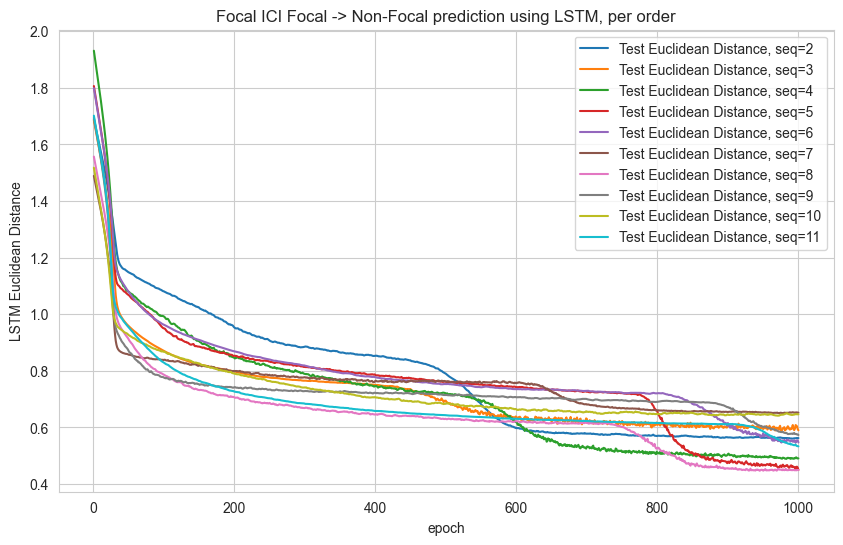

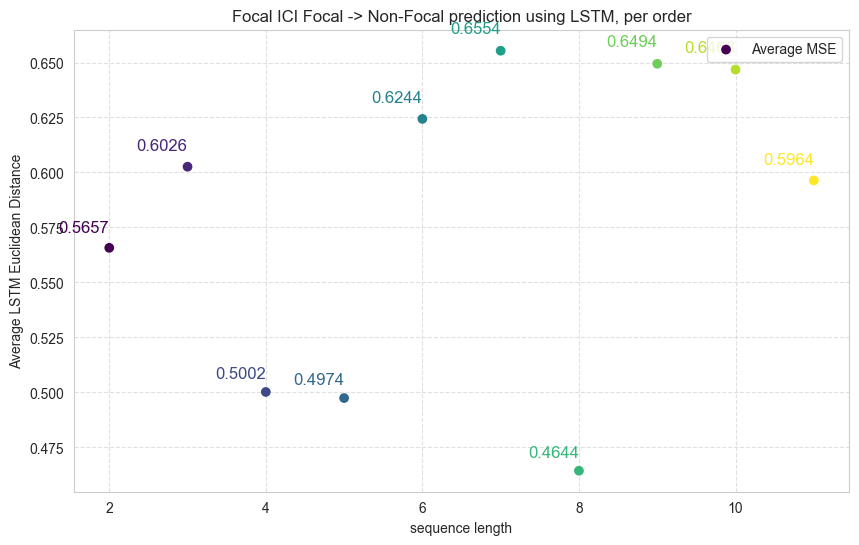

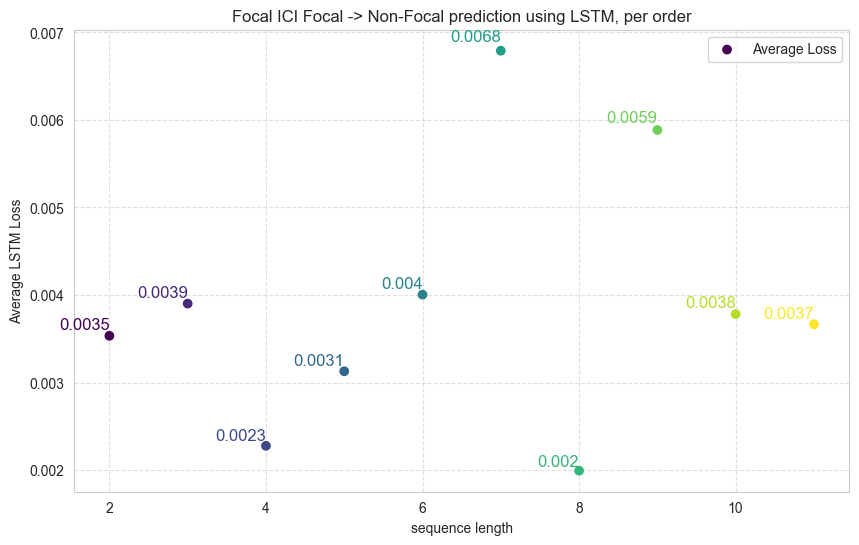

In [32]:
visualize_lstm(sequence_length_options=list(range(2, 12)), num_epochs=num_epochs, mse_acc=accuracy_acc,
               loss_acc=loss_acc, original_vectors=ici_vectors, col_name_1="Focal ICI", col_name_2="Non-Focal ICI")

Data Range (Max - Min): 0.7734
Mean Training MSE: 0.0057
Relative MSE (MSE / Data Range): 0.7324%


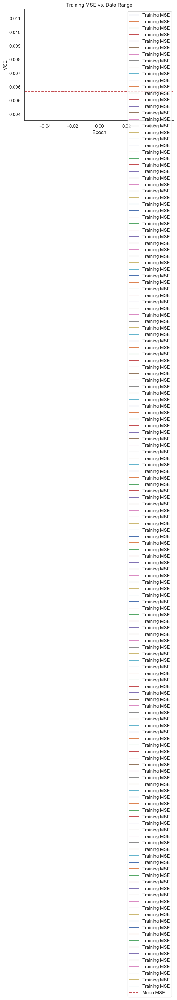

In [570]:
# Compute data range (max - min)
all_values = np.concatenate(ici_vectors)  # Flatten all vectors
data_range = np.ptp(all_values)  # Peak-to-Peak (max - min)

# Compare MSE to data range
mean_mse = np.mean(accuracy_acc)
relative_mse = mean_mse / data_range  # How MSE compares to range

# Print evaluation
print(f"Data Range (Max - Min): {data_range:.4f}")
print(f"Mean Training MSE: {mean_mse:.4f}")
print(f"Relative MSE (MSE / Data Range): {relative_mse:.4%}")

# Plot MSE trend
# plt.plot(train_accuracy, label="Training MSE")
plt.plot(accuracy_acc, label='Training MSE')
plt.axhline(y=mean_mse, color='r', linestyle='--', label="Mean MSE")
# plt.axhline(y=data_range, color='g', linestyle=':', label="Data Range")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Training MSE vs. Data Range")
plt.legend()
plt.show()

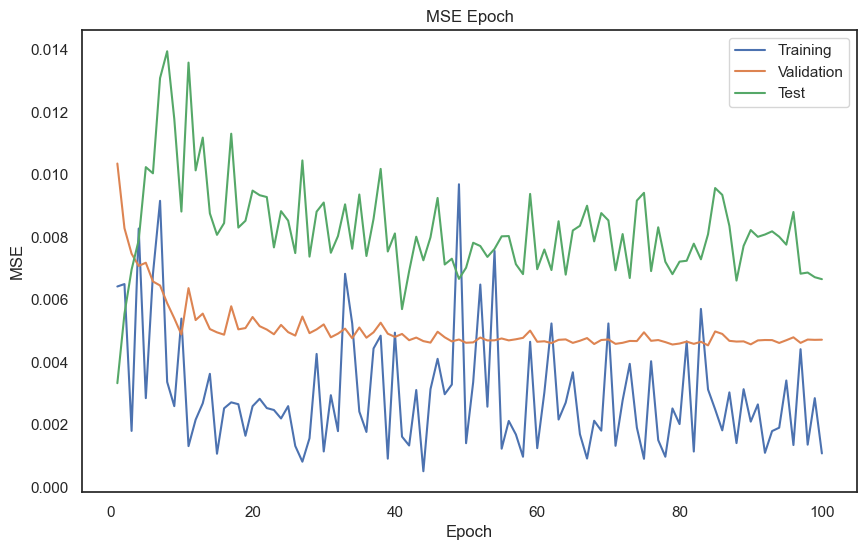

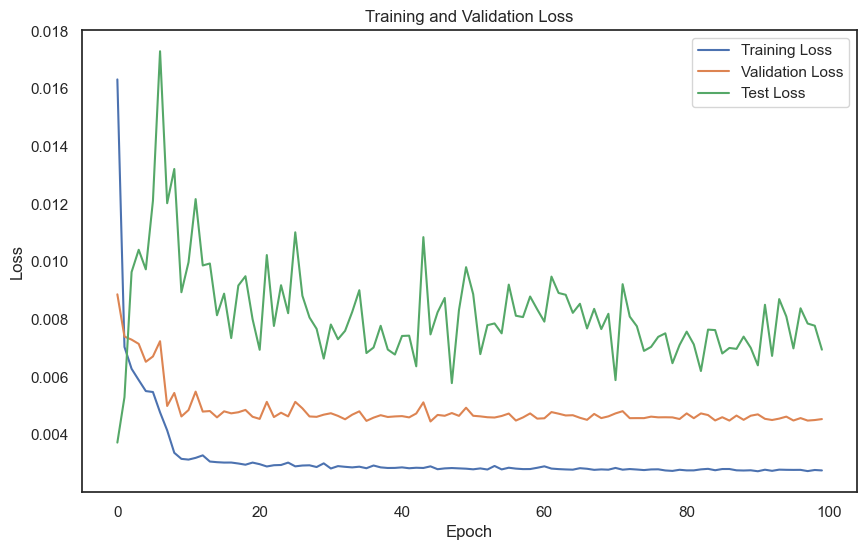

In [529]:
# train_accuracies_ = [t.detach().cpu() for t in train_accuracies]
# val_accuracies_ = [t.detach().cpu() for t in val_accuracies]
# test_accuracies_ = [t.detach().cpu() for t in test_accuracies]

# Visualize accuracies
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), train_accuracies_, label='Training')
plt.plot(range(1, num_epochs + 1), val_accuracies_, label='Validation')
plt.plot(range(1, num_epochs + 1), test_accuracies_, label='Test')
plt.xlabel('Epoch')
plt.ylabel('MSE')
plt.title('MSE Epoch')
plt.legend()
plt.show()

# Visualize losses
plt.figure(figsize=(10, 6))
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.plot(test_losses, label='Test Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Transformers

## init

In [56]:
print(f'PyTorch version: {torch.__version__}')
print('*' * 10)

# Check if GPU is available
torch.cuda.init()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f'Torch device available: {device}')
print(f'Available GPU devices: {torch.cuda.device_count()}')
print(f'Device Name: {torch.cuda.get_device_name()}')
print('*' * 10)

PyTorch version: 2.1.1+cu121
**********
Torch device available: cuda
Available GPU devices: 1
Device Name: NVIDIA GeForce RTX 3050 Ti Laptop GPU
**********


In [11]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import random

In [119]:
# def get_loaders(filtered_vectors, batch_size=32):
#     inputs = [v[:-1] for v in filtered_vectors]
#     targets = [v[-1] for v in filtered_vectors]
# 
#     inputs = torch.tensor(inputs, dtype=torch.float32).unsqueeze(-1)  # Add a feature dimension of 1
#     targets = torch.tensor(targets, dtype=torch.float32).unsqueeze(1)
# 
#     dataset = TensorDataset(inputs, targets)
#     train_size = int(0.7 * len(dataset))
#     val_size = int(0.15 * len(dataset))
#     test_size = len(dataset) - train_size - val_size
# 
#     train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])
# 
#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
#     test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
# 
#     input_shape = inputs.shape[1]  # This will be the sequence length
#     return train_loader, val_loader, test_loader, input_shape
# 
# 
# def train_loop(dataloader, model, criterion, optimizer, device):
#     model.train()
#     total_loss = 0
#     total_samples = 0
#     total_mse = 0
# 
#     for batch, (X, y) in enumerate(dataloader):
#         X, y = X.to(device), y.to(device)
#         optimizer.zero_grad()
#         y_pred = model(X)
#         loss = criterion(y_pred, y)
#         loss.backward()
#         optimizer.step()
# 
#         total_loss += loss.item() * len(y)
#         total_samples += len(y)
#         mse = nn.functional.mse_loss(y_pred, y)
#         total_mse += mse.item() * len(y)
# 
#     avg_loss = total_loss / total_samples
#     avg_mse = total_mse / total_samples
#     return avg_mse, avg_loss
# 
# 
# def eval_loop(dataloader, model, criterion, device):
#     model.eval()
#     total_loss = 0
#     total_samples = 0
#     total_mse = 0
# 
#     with torch.no_grad():
#         for X, y in dataloader:
#             X, y = X.to(device), y.to(device)
#             y_pred = model(X)
#             loss = criterion(y_pred, y)
# 
#             total_loss += loss.item() * len(y)
#             total_samples += len(y)
#             mse = nn.functional.mse_loss(y_pred, y)
#             total_mse += mse.item() * len(y)
# 
#     avg_loss = total_loss / total_samples
#     avg_mse = total_mse / total_samples
#     return avg_mse, avg_loss

def get_loaders_trans(filtered_vectors, batch_size=32, prediction_length=1):
    inputs = [v[:-prediction_length] for v in filtered_vectors]
    targets = [v[-prediction_length:] for v in filtered_vectors]

    inputs = torch.tensor(inputs, dtype=torch.float32).unsqueeze(-1)  # Add a feature dimension of 1
    targets = torch.tensor(targets, dtype=torch.float32).unsqueeze(-1) # Add a feature dimension of 1

    dataset = TensorDataset(inputs, targets)
    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size

    train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    input_shape = inputs.shape[1]  # This will be the input sequence length
    output_shape = targets.shape[1] # This will be the prediction length
    return train_loader, val_loader, test_loader, input_shape, output_shape

def train_loop_trans(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0
    total_samples = 0
    total_mse = 0

    for batch, (src, tgt) in enumerate(dataloader):
        src, tgt = src.to(device), tgt.to(device)
        optimizer.zero_grad()
        y_pred = model(src, tgt) # Pass both source and target
        loss = criterion(y_pred, tgt)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) # Try different values for max_norm (e.g., 0.5, 1.0, 5.0)
        optimizer.step()

        total_loss += loss.item() * len(tgt)
        total_samples += len(tgt)
        mse = nn.functional.mse_loss(y_pred, tgt)
        total_mse += mse.item() * len(tgt)

    avg_loss = total_loss / total_samples
    avg_mse = total_mse / total_samples
    return avg_mse, avg_loss

def eval_loop_trans(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0
    total_samples = 0
    total_mse = 0

    with torch.no_grad():
        for src, tgt in dataloader:
            src, tgt = src.to(device), tgt.to(device)
            y_pred = model(src, tgt) # Pass both source and target
            loss = criterion(y_pred, tgt)

            total_loss += loss.item() * len(tgt)
            total_samples += len(tgt)
            mse = nn.functional.mse_loss(y_pred, tgt)
            total_mse += mse.item() * len(tgt)

    avg_loss = total_loss / total_samples
    avg_mse = total_mse / total_samples
    return avg_mse, avg_loss

In [120]:
# class TransformerModel(nn.Module):
#     def __init__(self, input_size, num_heads, num_layers, d_model, dropout=0.1):
#         super(TransformerModel, self).__init__()
#         self.d_model = d_model
#         # Input size is now 1, as each number is a single feature
#         self.embedding = nn.Linear(1, d_model)
#         self.transformer_encoder = nn.TransformerEncoder(
#             nn.TransformerEncoderLayer(d_model, num_heads, dim_feedforward=d_model * 4, dropout=dropout),
#             num_layers,
#             norm=nn.LayerNorm(d_model)
#         )
#         self.decoder = nn.Linear(d_model, 1)
# 
#         self.init_weights()
# 
#     def init_weights(self):
#         initrange = 0.1
#         self.embedding.weight.data.uniform_(-initrange, initrange)
#         self.decoder.bias.data.zero_()
#         self.decoder.weight.data.uniform_(-initrange, initrange)
# 
#     def forward(self, src):
#         # src shape: (batch_size, seq_len, 1) - now correctly shaped
#         embedded = self.embedding(src)  # Shape: (batch_size, seq_len, d_model)
#         embedded = embedded.permute(1, 0, 2)  # Shape: (seq_len, batch_size, d_model)
#         output = self.transformer_encoder(embedded)  # Shape: (seq_len, batch_size, d_model)
#         output = output[-1, :, :]  # Shape: (batch_size, d_model)
#         output = self.decoder(output)  # Shape: (batch_size, 1)
#         return output

class TransformerModelWithDecoder(nn.Module):
    def __init__(self, input_size, output_size, num_heads, num_layers, d_model, dropout=0.1):
        super(TransformerModelWithDecoder, self).__init__()
        self.d_model = d_model
        self.embedding_encoder = nn.Linear(input_size, d_model) # For the input sequence
        self.embedding_decoder = nn.Linear(output_size, d_model) # For the target sequence (what we want to predict)
        self.pos_encoder = PositionalEncoding(d_model, dropout)
        self.pos_decoder = PositionalEncoding(d_model, dropout)
        self.transformer = nn.Transformer(
            d_model=d_model,
            nhead=num_heads,
            num_encoder_layers=num_layers,
            num_decoder_layers=num_layers,
            dropout=dropout,
            batch_first=True # Important for our data shape
        )
        self.fc_out = nn.Linear(d_model, output_size) # Output to the desired number of future steps

        self.init_weights()

    def init_weights(self):
        initrange = 0.1
        self.embedding_encoder.weight.data.uniform_(-initrange, initrange)
        self.embedding_decoder.weight.data.uniform_(-initrange, initrange)
        self.fc_out.bias.data.zero_()
        self.fc_out.weight.data.uniform_(-initrange, initrange)

    def forward(self, src, tgt, src_mask=None, tgt_mask=None, memory_mask=None):
        # src shape: (batch_size, src_seq_len, input_size) - e.g., (batch_size, past_steps, 1)
        # tgt shape: (batch_size, tgt_seq_len, output_size) - e.g., (batch_size, future_steps, 1)

        src_embedded = self.pos_encoder(self.embedding_encoder(src) * np.sqrt(self.d_model))
        tgt_embedded = self.pos_decoder(self.embedding_decoder(tgt) * np.sqrt(self.d_model))

        # The standard Transformer expects seq_len to be the first dimension.
        # With batch_first=True, the shapes are (batch_size, seq_len, feature_dim)
        output = self.transformer(
            src_embedded,
            tgt_embedded,
            src_mask=src_mask,
            tgt_mask=tgt_mask,
            memory_mask=memory_mask
        )

        output = self.fc_out(output) # Shape: (batch_size, tgt_seq_len, output_size)
        return output

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-np.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

## train loop

In [121]:
# def train_transformer(vectors, num_epochs, label1, label2, limit_vectors=None, log=False,
#                       num_heads=2, num_layers=2, d_model=32, dropout_rate=0.1, lr=0.001, batch_size=32,
#                       sequence_length_options=list(range(2, 12))):
#     mse_acc = []
#     loss_acc = []
#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# 
#     for sequence_length in sequence_length_options:
#         filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
#         print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
#         if limit_vectors is not None:
#             filtered_vectors = random.sample(filtered_vectors, limit_vectors)
#             if log: print(f'limited to samples count: {limit_vectors}')
# 
#         train_loader, val_loader, test_loader, seq_len = get_loaders(filtered_vectors, batch_size=batch_size)
# 
#         # Initialize the Transformer model with input_size=1
#         model = TransformerModel(1, num_heads, num_layers, d_model, dropout_rate).to(device)
#         criterion = nn.SmoothL1Loss()
#         optimizer = optim.Adam(model.parameters(), lr=lr)
# 
#         test_mses = []
#         test_losses = []
# 
#         for epoch in range(num_epochs + 1):
#             train_accuracy, train_loss = train_loop(train_loader, model, criterion, optimizer, device)
#             val_accuracy, val_loss = eval_loop(val_loader, model, criterion, device)
#             test_accuracy, test_loss = eval_loop(test_loader, model, criterion, device)
# 
#             test_mses.append(test_accuracy)
#             test_losses.append(test_loss)
# 
#             if epoch % 50 == 0:
#                 if log: print(
#                     f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy MSE: {train_accuracy:.4f}, Validation Accuracy MSE: {val_accuracy:.4f}, Test Accuracy MSE: {test_accuracy:.4f}")
# 
#         # mse_acc.append(test_mses)
#         # loss_acc.append(test_losses)
#         mse_acc.extend([(sequence_length, mse) for mse in test_mses])
#         loss_acc.extend([(sequence_length, loss) for loss in test_losses])
#             # mae_acc.append(mae)
#             # mse_acc.append(mse)
# 
#     df_mse = pd.DataFrame(mse_acc, columns=["SEQ", "MSE"])
#     df_loss = pd.DataFrame(loss_acc, columns=["SEQ", "LOSS"])
#     return df_mse, df_loss

def train_transformer(vectors, num_epochs, label1, label2, limit_vectors=None, log=False,
                      num_heads=2, num_layers=1, d_model=16, dropout_rate=0.3, lr=0.001, batch_size=32,
                      sequence_length_options=list(range(2, 12)), prediction_length=1):
    mse_acc = []
    loss_acc = []
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    for sequence_length in sequence_length_options:
        filtered_vectors = filter_vectors_by_size(vectors, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        train_loader, val_loader, test_loader, seq_len, output_len = get_loaders_trans(filtered_vectors, batch_size=batch_size, prediction_length=prediction_length)

        # Initialize the Transformer model with decoder
        model = TransformerModelWithDecoder(1, 1, num_heads, num_layers, d_model, dropout_rate).to(device)
        criterion = nn.SmoothL1Loss()
        optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=0.0001) # Try different values for weight_decay
        
        test_mses = []
        test_losses = []

        for epoch in range(num_epochs + 1):
            train_accuracy, train_loss = train_loop_trans(train_loader, model, criterion, optimizer, device)
            val_accuracy, val_loss = eval_loop_trans(val_loader, model, criterion, device)
            test_accuracy, test_loss = eval_loop_trans(test_loader, model, criterion, device)

            test_mses.append(test_accuracy)
            test_losses.append(test_loss)

            if epoch % 50 == 0:
                if log: print(
                    f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy MSE: {train_accuracy:.4f}, Validation Accuracy MSE: {val_accuracy:.4f}, Test Accuracy MSE: {test_accuracy:.4f}")

        mse_acc.extend([(sequence_length, mse) for mse in test_mses])
        loss_acc.extend([(sequence_length, loss) for loss in test_losses])

    df_mse = pd.DataFrame(mse_acc, columns=["SEQ", "MSE"])
    df_loss = pd.DataFrame(loss_acc, columns=["SEQ", "LOSS"])
    return df_mse, df_loss

## duration

### symmetric exchanges

In [125]:
num_epochs = 1500
label1 = "Example"
label2 = "Data"

duration_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                                       ['overlap_pair',
                                                        'non_overlap_pair', 'reverse_overlap_pair',
                                                        'reverse_non_overlap_pair'], symmetric_duration_exchanges)
len(duration_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(duration_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=4, num_layers=2, d_model=32, dropout_rate=0.25,
                                                      lr=0.00001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 958
Epoch [1/1500], Train Accuracy MSE: 0.4864, Validation Accuracy MSE: 0.1365, Test Accuracy MSE: 0.1426
Epoch [51/1500], Train Accuracy MSE: 0.1272, Validation Accuracy MSE: 0.1466, Test Accuracy MSE: 0.1501
Epoch [101/1500], Train Accuracy MSE: 0.1201, Validation Accuracy MSE: 0.1346, Test Accuracy MSE: 0.1372
Epoch [151/1500], Train Accuracy MSE: 0.1137, Validation Accuracy MSE: 0.1125, Test Accuracy MSE: 0.1122
Epoch [201/1500], Train Accuracy MSE: 0.0976, Validation Accuracy MSE: 0.0643, Test Accuracy MSE: 0.0591
Epoch [251/1500], Train Accuracy MSE: 0.0708, Validation Accuracy MSE: 0.0329, Test Accuracy MSE: 0.0263
Epoch [301/1500], Train Accuracy MSE: 0.0552, Validation Accuracy MSE: 0.0210, Test Accuracy MSE: 0.0142
Epoch [351/1500], Train Accuracy MSE: 0.0453, Validation Accuracy MSE: 0.0183, Test Accuracy MSE: 0.0129
Epoch [401/1500], Train Accuracy MSE: 0.0385, Validation Accuracy MSE: 0.0194, Test Accuracy MSE: 0.0139
Epoch

KeyboardInterrupt: 

In [22]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(duration_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.013247
1    3  0.009016
2    4  0.016715
3    5  0.011713
4    6  0.014699
5    7  0.014338
6    8  0.012569
7    9  0.009640
8   10  0.011870
data_range=3.2175667000000003
data_std=0.3514346078683625
Baseline MSE: 0.12
mean: 0.96
rmse: 0.09495345935834068
relative MSE: 0.09914567025058872


### all exchanges

In [27]:
num_epochs = 1500
label1 = "Example"
label2 = "Data"

duration_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                                       ['overlap_pair',
                                                        'non_overlap_pair', 'reverse_overlap_pair',
                                                        'reverse_non_overlap_pair'])
len(duration_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(duration_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=2, num_layers=2, d_model=32, dropout_rate=0.15,
                                                      lr=0.0001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 1508


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [1/1500], Train Accuracy MSE: 0.4015, Validation Accuracy MSE: 0.1329, Test Accuracy MSE: 0.1435
Epoch [51/1500], Train Accuracy MSE: 0.0609, Validation Accuracy MSE: 0.0692, Test Accuracy MSE: 0.0833
Epoch [101/1500], Train Accuracy MSE: 0.0582, Validation Accuracy MSE: 0.0686, Test Accuracy MSE: 0.0825
Epoch [151/1500], Train Accuracy MSE: 0.0580, Validation Accuracy MSE: 0.0685, Test Accuracy MSE: 0.0832
Epoch [201/1500], Train Accuracy MSE: 0.0581, Validation Accuracy MSE: 0.0691, Test Accuracy MSE: 0.0825
Epoch [251/1500], Train Accuracy MSE: 0.0584, Validation Accuracy MSE: 0.0687, Test Accuracy MSE: 0.0825
Epoch [301/1500], Train Accuracy MSE: 0.0570, Validation Accuracy MSE: 0.0697, Test Accuracy MSE: 0.0837
Epoch [351/1500], Train Accuracy MSE: 0.0578, Validation Accuracy MSE: 0.0698, Test Accuracy MSE: 0.0836
Epoch [401/1500], Train Accuracy MSE: 0.0580, Validation Accuracy MSE: 0.0686, Test Accuracy MSE: 0.0813
Epoch [451/1500], Train Accuracy MSE: 0.0576, Validation A

In [28]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(duration_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 3]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.081085
1    3  0.058017
2    4  0.046786
3    5  0.076229
4    6  0.085709
5    7  0.037830
6    8  0.023245
7    9  0.040006
8   10  0.035850
data_range=3.318217
data_std=0.3650873351934162
Baseline MSE: 0.13
mean: 0.93
rmse: 0.24086690802778576
relative MSE: 0.25803591668366627


## ICI1

### symmetric exchanges

In [23]:
num_epochs = 1000
label1 = "Example"
label2 = "Data"

ici1_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                                       ['overlap_pair',
                                                        'non_overlap_pair', 'reverse_overlap_pair',
                                                        'reverse_non_overlap_pair'], symmetric_duration_exchanges)
len(ici1_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(ici1_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=2, num_layers=2, d_model=32, dropout_rate=0.15,
                                                      lr=0.0001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 958


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [1/1000], Train Accuracy MSE: 0.0306, Validation Accuracy MSE: 0.0244, Test Accuracy MSE: 0.0201
Epoch [51/1000], Train Accuracy MSE: 0.0056, Validation Accuracy MSE: 0.0054, Test Accuracy MSE: 0.0041
Epoch [101/1000], Train Accuracy MSE: 0.0055, Validation Accuracy MSE: 0.0061, Test Accuracy MSE: 0.0041
Epoch [151/1000], Train Accuracy MSE: 0.0047, Validation Accuracy MSE: 0.0053, Test Accuracy MSE: 0.0039
Epoch [201/1000], Train Accuracy MSE: 0.0046, Validation Accuracy MSE: 0.0060, Test Accuracy MSE: 0.0041
Epoch [251/1000], Train Accuracy MSE: 0.0045, Validation Accuracy MSE: 0.0056, Test Accuracy MSE: 0.0038
Epoch [301/1000], Train Accuracy MSE: 0.0046, Validation Accuracy MSE: 0.0054, Test Accuracy MSE: 0.0039
Epoch [351/1000], Train Accuracy MSE: 0.0044, Validation Accuracy MSE: 0.0054, Test Accuracy MSE: 0.0037
Epoch [401/1000], Train Accuracy MSE: 0.0043, Validation Accuracy MSE: 0.0054, Test Accuracy MSE: 0.0039
Epoch [451/1000], Train Accuracy MSE: 0.0045, Validation A

In [26]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici1_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0] / np.mean(flat_list)}")


   SEQ       MSE
0    2  0.003803
1    3  0.003744
2    4  0.002527
3    5  0.002258
4    6  0.002690
5    7  0.002722
6    8  0.004623
7    9  0.001270
8   10  0.003626
data_range=0.5358349
data_std=0.13946465012196504
Baseline MSE: 0.02
mean: 0.32
rmse: 0.05026804736316913
relative MSE: 0.1593721982450105


### all exchanges

In [30]:
num_epochs = 1000
label1 = "Example"
label2 = "Data"

ici1_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI1', 'past_codas',
                                                       ['overlap_pair',
                                                        'non_overlap_pair', 'reverse_overlap_pair',
                                                        'reverse_non_overlap_pair'])
len(ici1_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(ici1_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=2, num_layers=2, d_model=32, dropout_rate=0.15,
                                                      lr=0.0001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 1508


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [1/1000], Train Accuracy MSE: 0.0322, Validation Accuracy MSE: 0.0206, Test Accuracy MSE: 0.0220
Epoch [51/1000], Train Accuracy MSE: 0.0107, Validation Accuracy MSE: 0.0114, Test Accuracy MSE: 0.0078
Epoch [101/1000], Train Accuracy MSE: 0.0098, Validation Accuracy MSE: 0.0115, Test Accuracy MSE: 0.0080
Epoch [151/1000], Train Accuracy MSE: 0.0097, Validation Accuracy MSE: 0.0112, Test Accuracy MSE: 0.0077
Epoch [201/1000], Train Accuracy MSE: 0.0094, Validation Accuracy MSE: 0.0111, Test Accuracy MSE: 0.0078
Epoch [251/1000], Train Accuracy MSE: 0.0094, Validation Accuracy MSE: 0.0109, Test Accuracy MSE: 0.0073
Epoch [301/1000], Train Accuracy MSE: 0.0093, Validation Accuracy MSE: 0.0111, Test Accuracy MSE: 0.0075
Epoch [351/1000], Train Accuracy MSE: 0.0091, Validation Accuracy MSE: 0.0111, Test Accuracy MSE: 0.0076
Epoch [401/1000], Train Accuracy MSE: 0.0090, Validation Accuracy MSE: 0.0108, Test Accuracy MSE: 0.0076
Epoch [451/1000], Train Accuracy MSE: 0.0088, Validation A

In [31]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici1_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0] / np.mean(flat_list)}")


   SEQ       MSE
0    2  0.007548
1    3  0.008174
2    4  0.009024
3    5  0.008528
4    6  0.008418
5    7  0.004675
6    8  0.006483
7    9  0.010106
8   10  0.014014
data_range=0.6648411
data_std=0.14080631083747877
Baseline MSE: 0.02
mean: 0.29
rmse: 0.09499264429256131
relative MSE: 0.3263905956377476


## ICI2

### symmetric exchanges

In [34]:
num_epochs = 1000
label1 = "Example"
label2 = "Data"

ici2_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
                                                       ['overlap_pair',
                                                        'non_overlap_pair', 'reverse_overlap_pair',
                                                        'reverse_non_overlap_pair'], symmetric_duration_exchanges)
len(ici2_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(ici2_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=2, num_layers=2, d_model=32, dropout_rate=0.15,
                                                      lr=0.0001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 958


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [1/1000], Train Accuracy MSE: 0.0736, Validation Accuracy MSE: 0.0215, Test Accuracy MSE: 0.0183
Epoch [51/1000], Train Accuracy MSE: 0.0058, Validation Accuracy MSE: 0.0034, Test Accuracy MSE: 0.0038
Epoch [101/1000], Train Accuracy MSE: 0.0046, Validation Accuracy MSE: 0.0034, Test Accuracy MSE: 0.0039
Epoch [151/1000], Train Accuracy MSE: 0.0040, Validation Accuracy MSE: 0.0033, Test Accuracy MSE: 0.0036
Epoch [201/1000], Train Accuracy MSE: 0.0041, Validation Accuracy MSE: 0.0039, Test Accuracy MSE: 0.0046
Epoch [251/1000], Train Accuracy MSE: 0.0038, Validation Accuracy MSE: 0.0035, Test Accuracy MSE: 0.0037
Epoch [301/1000], Train Accuracy MSE: 0.0038, Validation Accuracy MSE: 0.0032, Test Accuracy MSE: 0.0035
Epoch [351/1000], Train Accuracy MSE: 0.0037, Validation Accuracy MSE: 0.0032, Test Accuracy MSE: 0.0038
Epoch [401/1000], Train Accuracy MSE: 0.0037, Validation Accuracy MSE: 0.0033, Test Accuracy MSE: 0.0035
Epoch [451/1000], Train Accuracy MSE: 0.0036, Validation A

In [36]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici2_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0] / np.mean(flat_list)}")


   SEQ       MSE
0    2  0.003497
1    3  0.002237
2    4  0.002963
3    5  0.002914
4    6  0.003574
5    7  0.005190
6    8  0.003392
7    9  0.004888
8   10  0.003738
data_range=0.5194707000000001
data_std=0.1288087068628932
Baseline MSE: 0.02
mean: 0.30
rmse: 0.05443585100791128
relative MSE: 0.17983772123423536


### all exchanges

In [37]:
num_epochs = 1000
label1 = "Example"
label2 = "Data"

ici2_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), 'ICI2', 'past_codas',
                                                       ['overlap_pair',
                                                        'non_overlap_pair', 'reverse_overlap_pair',
                                                        'reverse_non_overlap_pair'])
len(ici2_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(ici2_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=2, num_layers=2, d_model=32, dropout_rate=0.15,
                                                      lr=0.0001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 1508


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [1/1000], Train Accuracy MSE: 0.0266, Validation Accuracy MSE: 0.0200, Test Accuracy MSE: 0.0223
Epoch [51/1000], Train Accuracy MSE: 0.0097, Validation Accuracy MSE: 0.0072, Test Accuracy MSE: 0.0079
Epoch [101/1000], Train Accuracy MSE: 0.0092, Validation Accuracy MSE: 0.0077, Test Accuracy MSE: 0.0085
Epoch [151/1000], Train Accuracy MSE: 0.0090, Validation Accuracy MSE: 0.0066, Test Accuracy MSE: 0.0074
Epoch [201/1000], Train Accuracy MSE: 0.0087, Validation Accuracy MSE: 0.0065, Test Accuracy MSE: 0.0073
Epoch [251/1000], Train Accuracy MSE: 0.0087, Validation Accuracy MSE: 0.0066, Test Accuracy MSE: 0.0073
Epoch [301/1000], Train Accuracy MSE: 0.0087, Validation Accuracy MSE: 0.0067, Test Accuracy MSE: 0.0075
Epoch [351/1000], Train Accuracy MSE: 0.0085, Validation Accuracy MSE: 0.0067, Test Accuracy MSE: 0.0077
Epoch [401/1000], Train Accuracy MSE: 0.0083, Validation Accuracy MSE: 0.0065, Test Accuracy MSE: 0.0075
Epoch [451/1000], Train Accuracy MSE: 0.0083, Validation A

In [38]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ici2_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0] / np.mean(flat_list)}")


   SEQ       MSE
0    2  0.007490
1    3  0.006876
2    4  0.007811
3    5  0.007088
4    6  0.007739
5    7  0.005960
6    8  0.007744
7    9  0.009761
8   10  0.011966
data_range=0.5894388
data_std=0.12944231036928908
Baseline MSE: 0.02
mean: 0.28
rmse: 0.08837911756938616
relative MSE: 0.3161219829553359


## CI -> CB

### cluster 1

In [46]:
num_epochs = 1000
label1 = "Example"
label2 = "Data"

ci_cb_vectors = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 1)
ci_cb_vectors = [vec for vec in ci_cb_vectors if len(vec) >= 2 and not any(np.isnan(x) for x in vec)]
len(ci_cb_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(ci_cb_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=2, num_layers=2, d_model=32, dropout_rate=0.15,
                                                      lr=0.0001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 381
Epoch [1/1000], Train Accuracy MSE: 8.5660, Validation Accuracy MSE: 6.4502, Test Accuracy MSE: 7.1092


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [51/1000], Train Accuracy MSE: 0.6720, Validation Accuracy MSE: 0.4780, Test Accuracy MSE: 0.5266
Epoch [101/1000], Train Accuracy MSE: 0.1858, Validation Accuracy MSE: 0.1149, Test Accuracy MSE: 0.1425
Epoch [151/1000], Train Accuracy MSE: 0.1379, Validation Accuracy MSE: 0.0766, Test Accuracy MSE: 0.1254
Epoch [201/1000], Train Accuracy MSE: 0.1204, Validation Accuracy MSE: 0.0750, Test Accuracy MSE: 0.1231
Epoch [251/1000], Train Accuracy MSE: 0.1186, Validation Accuracy MSE: 0.0754, Test Accuracy MSE: 0.1262
Epoch [301/1000], Train Accuracy MSE: 0.1179, Validation Accuracy MSE: 0.0764, Test Accuracy MSE: 0.1271
Epoch [351/1000], Train Accuracy MSE: 0.1063, Validation Accuracy MSE: 0.0774, Test Accuracy MSE: 0.1294
Epoch [401/1000], Train Accuracy MSE: 0.1034, Validation Accuracy MSE: 0.0791, Test Accuracy MSE: 0.1263
Epoch [451/1000], Train Accuracy MSE: 0.1034, Validation Accuracy MSE: 0.0811, Test Accuracy MSE: 0.1379
Epoch [501/1000], Train Accuracy MSE: 0.0952, Validation

In [47]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ci_cb_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0] / np.mean(flat_list)}")


   SEQ       MSE
0    2  0.128304
1    3  0.115439
2    4  0.067256
3    5  0.058158
4    6  0.144722
5    7  0.125965
6    8  0.136542
7    9  0.139195
8   10  0.449256
data_range=6.477002299996457
data_std=0.9081308817771981
Baseline MSE: 0.82
mean: 3.28
rmse: 0.2593367047413148
relative MSE: 0.07916193894290306


### cluster 0

In [48]:
num_epochs = 1000
label1 = "Example"
label2 = "Data"

ci_cb_vectors = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 0)
ci_cb_vectors = [vec for vec in ci_cb_vectors if len(vec) >= 2 and not any(np.isnan(x) for x in vec)]
len(ci_cb_vectors)

# Train the Transformer model
transformer_mse, transformer_loss = train_transformer(ci_cb_vectors, num_epochs, label1, label2, limit_vectors=None,
                                                      log=True,
                                                      num_heads=2, num_layers=2, d_model=32, dropout_rate=0.15,
                                                      lr=0.0001, batch_size=16,
                                                      sequence_length_options=list(range(2, 11)))

Example Data, Sequence length: 2, samples count: 188
Epoch [1/1000], Train Accuracy MSE: 0.9430, Validation Accuracy MSE: 1.0668, Test Accuracy MSE: 0.4185


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [51/1000], Train Accuracy MSE: 0.8281, Validation Accuracy MSE: 0.9647, Test Accuracy MSE: 0.3818
Epoch [101/1000], Train Accuracy MSE: 0.7786, Validation Accuracy MSE: 0.9279, Test Accuracy MSE: 0.3658
Epoch [151/1000], Train Accuracy MSE: 0.7641, Validation Accuracy MSE: 0.9027, Test Accuracy MSE: 0.3667
Epoch [201/1000], Train Accuracy MSE: 0.7628, Validation Accuracy MSE: 0.8940, Test Accuracy MSE: 0.3594
Epoch [251/1000], Train Accuracy MSE: 0.7665, Validation Accuracy MSE: 0.8840, Test Accuracy MSE: 0.3584
Epoch [301/1000], Train Accuracy MSE: 0.7551, Validation Accuracy MSE: 0.8599, Test Accuracy MSE: 0.3624
Epoch [351/1000], Train Accuracy MSE: 0.7463, Validation Accuracy MSE: 0.8549, Test Accuracy MSE: 0.3618
Epoch [401/1000], Train Accuracy MSE: 0.7375, Validation Accuracy MSE: 0.8840, Test Accuracy MSE: 0.3684
Epoch [451/1000], Train Accuracy MSE: 0.7534, Validation Accuracy MSE: 0.8759, Test Accuracy MSE: 0.3692
Epoch [501/1000], Train Accuracy MSE: 0.7654, Validation

In [49]:
mean_mse_per_seq = (
    transformer_mse.groupby('SEQ')
    .apply(lambda x: x.tail(200)['MSE'].mean())
    .reset_index(name='MSE')
)
print(mean_mse_per_seq)

rmse_per_seq = (
    transformer_mse.groupby('SEQ')['MSE']
    .apply(lambda x: np.sqrt(np.mean(x.tail(200))))
    .reset_index(name='RMSE')
)
rmse_per_seq.columns = ['SEQ', 'RMSE']

flat_list = np.concatenate(ci_cb_vectors).tolist()
data_range = np.max(flat_list) - np.min(flat_list)
data_std = np.std(flat_list)
print(f"data_range={data_range}")
print(f"data_std={data_std}")
baseline_mse = np.mean((flat_list - np.mean(flat_list)) ** 2)
print(f"Baseline MSE: {baseline_mse:.2f}")
print(f"mean: {np.mean(flat_list):.2f}")
print(f"rmse: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0]}")
print(f"relative MSE: {rmse_per_seq.loc[rmse_per_seq['SEQ'] == 4]['RMSE'].values[0] / np.mean(flat_list)}")

   SEQ       MSE
0    2  0.379434
1    3  1.130190
2    4  0.901728
3    5  1.155854
4    6  0.681832
5    7  1.044428
6    8  0.528190
7    9  1.608993
8   10  0.254816
data_range=6.6096464000002015
data_std=1.5031330164571486
Baseline MSE: 2.26
mean: 3.08
rmse: 0.9495937075296157
relative MSE: 0.30844668901838723


## predict coda type

### utils functions

In [51]:
def collate_fn(batch):
    inputs = [item[0] for item in batch]
    targets = [item[1] for item in batch]
    inputs = torch.nn.utils.rnn.pad_sequence(inputs, batch_first=True)
    targets = torch.tensor(targets)
    return inputs, targets

def get_loaders_coda_type(data, batch_size, shuffle=True):
    X, y = [], []
    if shuffle:
        np.random.seed(42)
        np.random.shuffle(data)

    for seq in data:
        X.append(torch.tensor([vocab2id[coda] for coda in seq[:-1]]))
        y.append(vocab2id[seq[-1]])

    X = torch.nn.utils.rnn.pad_sequence(X, batch_first=True).to(device)
    y = torch.tensor(y).to(device)

    dataset = TensorDataset(X, y)
    train_size = int(0.7 * len(dataset))
    val_size = int(0.15 * len(dataset))
    test_size = len(dataset) - train_size - val_size

    train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader, X.shape[1] # Returning padded sequence length

### TransformerModelCategorical

In [52]:
class TransformerModelCategorical(nn.Module):
    def __init__(self, num_classes, vocab_size, num_heads, num_layers, d_model, dropout=0.1):
        super(TransformerModelCategorical, self).__init__()
        self.d_model = d_model
        self.embedding = nn.Embedding(vocab_size, d_model)
        self.transformer_encoder = nn.TransformerEncoder(
            nn.TransformerEncoderLayer(d_model, num_heads, dim_feedforward=d_model * 4, dropout=dropout),
            num_layers,
            norm=nn.LayerNorm(d_model)
        )
        self.decoder = nn.Linear(d_model, num_classes) # Output size is now num_classes

        self.init_weights()

    def init_weights(self):
        initrange = 0.1
        self.embedding.weight.data.uniform_(-initrange, initrange)
        self.decoder.bias.data.zero_()
        self.decoder.weight.data.uniform_(-initrange, initrange)

    def forward(self, src):
        # src shape: (batch_size, seq_len) - contains token IDs
        embedded = self.embedding(src) * np.sqrt(self.d_model) # Shape: (batch_size, seq_len, d_model)
        embedded = embedded.permute(1, 0, 2) # Shape: (seq_len, batch_size, d_model)
        output = self.transformer_encoder(embedded) # Shape: (seq_len, batch_size, d_model)
        # We are interested in predicting the *next* category, so we can take the output
        # corresponding to the last input in the sequence.
        output = output[-1, :, :] # Shape: (batch_size, d_model)
        output = self.decoder(output) # Shape: (batch_size, num_classes)
        return output


In [53]:
def train_loop_categorical(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)
        optimizer.zero_grad()
        y_pred = model(X)
        loss = criterion(y_pred, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * len(y)
        total_samples += len(y)
        _, predicted = torch.max(y_pred.data, 1)
        correct_predictions += (predicted == y).sum().item()

    avg_loss = total_loss / total_samples
    accuracy = correct_predictions / total_samples
    return accuracy, avg_loss

def eval_loop_categorical(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            y_pred = model(X)
            loss = criterion(y_pred, y)

            total_loss += loss.item() * len(y)
            total_samples += len(y)
            _, predicted = torch.max(y_pred.data, 1)
            correct_predictions += (predicted == y).sum().item()

    avg_loss = total_loss / total_samples
    accuracy = correct_predictions / total_samples
    return accuracy, avg_loss


### train loop

In [54]:
num_classes = len(vocab2id)

In [58]:
def train_transformer_categorical(data, num_epochs, label1, label2, limit_vectors=None, log=False,
                                  num_heads=2, num_layers=2, d_model=32, dropout_rate=0.1, lr=0.001, batch_size=32, sequence_length_options= list(range(2, 11))):
    accuracies = []
    losses = []

    for sequence_length in sequence_length_options:
        filtered_vectors = filter_vectors_by_size(data, sequence_length)
        print(f'{label1} {label2}, Sequence length: {sequence_length}, samples count: {len(filtered_vectors)}')
        if limit_vectors is not None:
            filtered_vectors = random.sample(filtered_vectors, limit_vectors)
            if log: print(f'limited to samples count: {limit_vectors}')

        train_loader, val_loader, test_loader, seq_len = get_loaders_coda_type(filtered_vectors, batch_size)

        # Initialize the Transformer model for categorical prediction
        model = TransformerModelCategorical(num_classes, len(vocab2id), num_heads, num_layers, d_model, dropout_rate).to(device)
        
        train_labels_list = [item[-1] for item in filtered_vectors]
        train_labels_list_ids = [vocab2id[label_str] for label_str in train_labels_list]
        train_labels_tensor = torch.tensor(train_labels_list_ids)
        class_counts = torch.bincount(train_labels_tensor, minlength=num_classes)
        total_samples = train_labels_tensor.size(0)
        weights = total_samples / (class_counts.float() + 1e-5)
        weights = weights.to(device)

        criterion = nn.CrossEntropyLoss(weight=weights, reduction='mean')
        optimizer = optim.Adam(model.parameters(), lr=lr)

        test_accuracies = []
        test_losses = []

        for epoch in range(num_epochs + 1):
            train_accuracy, train_loss = train_loop_categorical(train_loader, model, criterion, optimizer, device)
            val_accuracy, val_loss = eval_loop_categorical(val_loader, model, criterion, device)
            test_accuracy, test_loss = eval_loop_categorical(test_loader, model, criterion, device)

            test_accuracies.append(test_accuracy)
            test_losses.append(test_loss)

            if epoch % 50 == 0:
                if log: print(
                    f"Epoch [{epoch + 1}/{num_epochs}], Train Accuracy: {train_accuracy:.4f}, Validation Accuracy: {val_accuracy:.4f}, Test Accuracy: {test_accuracy:.4f}")

        accuracies.extend([(sequence_length, mse) for mse in test_accuracies])
        losses.extend([(sequence_length, loss) for loss in test_losses])

    df_accuracy = pd.DataFrame(accuracies, columns=["SEQ", "MSE"])
    df_loss = pd.DataFrame(losses, columns=["SEQ", "LOSS"])
    return df_accuracy, df_loss

### focal -> non-focal prediction

In [49]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

In [50]:
len(coda_type_vectors)

1508

In [78]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

df_accuracy, df_loss = train_transformer_categorical(data=coda_type_vectors, num_epochs=1000, label1="Focal", label2="Non-Focal", limit_vectors=300, log=True,
                                  num_heads=8, num_layers=4, d_model=32, dropout_rate=0.1, lr=0.001, batch_size=16, sequence_length_options=list(range(6, 7)))

Focal Non-Focal, Sequence length: 6, samples count: 608
limited to samples count: 300


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [1/1000], Train Accuracy: 0.5381, Validation Accuracy: 0.5778, Test Accuracy: 0.6667
Epoch [51/1000], Train Accuracy: 0.7571, Validation Accuracy: 0.6444, Test Accuracy: 0.7333
Epoch [101/1000], Train Accuracy: 0.7667, Validation Accuracy: 0.6444, Test Accuracy: 0.7111
Epoch [151/1000], Train Accuracy: 0.7857, Validation Accuracy: 0.6444, Test Accuracy: 0.7111
Epoch [201/1000], Train Accuracy: 0.7476, Validation Accuracy: 0.6000, Test Accuracy: 0.6444
Epoch [251/1000], Train Accuracy: 0.7762, Validation Accuracy: 0.6444, Test Accuracy: 0.7111
Epoch [301/1000], Train Accuracy: 0.7619, Validation Accuracy: 0.6444, Test Accuracy: 0.7111
Epoch [351/1000], Train Accuracy: 0.7667, Validation Accuracy: 0.6222, Test Accuracy: 0.7111
Epoch [401/1000], Train Accuracy: 0.7762, Validation Accuracy: 0.6222, Test Accuracy: 0.7111
Epoch [451/1000], Train Accuracy: 0.7619, Validation Accuracy: 0.6222, Test Accuracy: 0.7111
Epoch [501/1000], Train Accuracy: 0.7810, Validation Accuracy: 0.6222, Te

### Focal -> Focal

In [59]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]

df_accuracy, df_loss = train_transformer_categorical(data=coda_type_vectors_filterd, num_epochs=1000, label1="Focal", label2="Focal", limit_vectors=None, log=True,
                                  num_heads=4, num_layers=2, d_model=32, dropout_rate=0.1, lr=0.001, batch_size=16, sequence_length_options=list(range(4, 5)))

Focal Focal, Sequence length: 4, samples count: 756


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\torch\nn\modules\transformer.py:282: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


Epoch [1/1000], Train Accuracy: 0.7599, Validation Accuracy: 0.7965, Test Accuracy: 0.7807
Epoch [51/1000], Train Accuracy: 0.7977, Validation Accuracy: 0.6991, Test Accuracy: 0.7193
Epoch [101/1000], Train Accuracy: 0.8166, Validation Accuracy: 0.6991, Test Accuracy: 0.7193
Epoch [151/1000], Train Accuracy: 0.8336, Validation Accuracy: 0.7345, Test Accuracy: 0.7719
Epoch [201/1000], Train Accuracy: 0.8507, Validation Accuracy: 0.6991, Test Accuracy: 0.7281
Epoch [251/1000], Train Accuracy: 0.8318, Validation Accuracy: 0.7168, Test Accuracy: 0.7368
Epoch [301/1000], Train Accuracy: 0.8336, Validation Accuracy: 0.7168, Test Accuracy: 0.7368
Epoch [351/1000], Train Accuracy: 0.8582, Validation Accuracy: 0.7168, Test Accuracy: 0.7807
Epoch [401/1000], Train Accuracy: 0.8582, Validation Accuracy: 0.7257, Test Accuracy: 0.7807
Epoch [451/1000], Train Accuracy: 0.8544, Validation Accuracy: 0.7080, Test Accuracy: 0.7281
Epoch [501/1000], Train Accuracy: 0.8488, Validation Accuracy: 0.7257, Te

## predict coda type using BERT

### utils

In [97]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split, TensorDataset
from transformers import DistilBertTokenizer, DistilBertModel
import numpy as np
import pandas as pd
import random
from tqdm.notebook import tqdm 

In [98]:
all_codas = set(coda for seq in coda_type_vectors for coda in seq)


In [81]:
all_codas

{'1+1+3',
 '1+31',
 '10R',
 '10i',
 '2+3',
 '3D',
 '3R',
 '4R1',
 '4R2',
 '5R1',
 '5R2',
 '5R3',
 '6R',
 '6i',
 '7C',
 '7D1',
 '7D2',
 '7i',
 '8D',
 '8R',
 '9R',
 '9i'}

In [99]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
data = coda_type_vectors
# Determine unique coda types for vocab mapping (needed for target labels)
all_codas = set(coda for seq in data for coda in seq)
vocab = sorted(list(all_codas))
vocab2id = {coda: i for i, coda in enumerate(vocab)}
id2vocab = {i: coda for coda, i in vocab2id.items()}
num_classes = len(vocab2id)

print(f"Vocabulary: {vocab}")
print(f"Vocab Size (Num Classes): {num_classes}")

# Model and Tokenizer configuration
MODEL_NAME = 'distilbert-base-uncased'
MAX_LEN = 10 
BATCH_SIZE = 16y
LEARNING_RATE = 2e-5
NUM_EPOCHS = 30
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# --- Tokenizer ---
tokenizer = DistilBertTokenizer.from_pretrained(MODEL_NAME)

Vocabulary: ['1+1+3', '1+31', '10R', '10i', '2+3', '3D', '3R', '4R1', '4R2', '5R1', '5R2', '5R3', '6R', '6i', '7C', '7D1', '7D2', '7i', '8D', '8R', '9R', '9i']
Vocab Size (Num Classes): 22
Using device: cuda


In [100]:
class CodaSequenceDataset(Dataset):
    def __init__(self, sequences, tokenizer, vocab2id, max_len):
        self.sequences = sequences
        self.tokenizer = tokenizer
        self.vocab2id = vocab2id
        self.max_len = max_len

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        seq = self.sequences[idx]
        if len(seq) < 2: # Need at least one input and one target

            print(f"Warning: Sequence too short at index {idx}: {seq}")
            dummy_text = ""
            dummy_target = list(self.vocab2id.values())[0] # First class as dummy
            encoding = self.tokenizer(
                dummy_text,
                add_special_tokens=True,
                max_length=self.max_len,
                padding='max_length',
                truncation=True,
                return_attention_mask=True,
                return_tensors='pt',
            )
            return {
                'input_ids': encoding['input_ids'].flatten(),
                'attention_mask': encoding['attention_mask'].flatten(),
                'labels': torch.tensor(dummy_target, dtype=torch.long)
            }


        input_codas = seq[:-1]
        target_coda = seq[-1]

        # Represent the input sequence as a single string
        input_text = " ".join(input_codas)

        encoding = self.tokenizer(
            input_text,
            add_special_tokens=True, # Adds [CLS] and [SEP]
            max_length=self.max_len,
            padding='max_length', # Pad to max_len
            truncation=True,      # Truncate if longer than max_len
            return_attention_mask=True,
            return_tensors='pt',  # Return PyTorch tensors
        )

        target_id = self.vocab2id.get(target_coda, -1) # Use -1 or handle unknown targets
        if target_id == -1:
             print(f"Warning: Target coda '{target_coda}' not in vocab!")
             # Handle appropriately, maybe assign a default ID or raise error
             target_id = 0 # Assigning first class for now


        return {
            'input_text': input_text, # Optional: for debugging
            'target_coda': target_coda, # Optional: for debugging
            'input_ids': encoding['input_ids'].flatten(), # Remove batch dim
            'attention_mask': encoding['attention_mask'].flatten(), # Remove batch dim
            'labels': torch.tensor(target_id, dtype=torch.long)
        }

In [101]:
def get_dataloaders(data, tokenizer, vocab2id, max_len, batch_size, test_split=0.15, val_split=0.15):
    # Filter out sequences that are too short
    valid_data = [seq for seq in data if len(seq) >= 2]
    print(f"Original data size: {len(data)}, Filtered data size: {len(valid_data)}")

    dataset = CodaSequenceDataset(valid_data, tokenizer, vocab2id, max_len)

    dataset_size = len(dataset)
    test_size = int(test_split * dataset_size)
    val_size = int(val_split * dataset_size)
    train_size = dataset_size - test_size - val_size

    print(f"Train size: {train_size}, Val size: {val_size}, Test size: {test_size}")

    # Ensure sizes are non-negative
    if train_size < 0 or val_size < 0 or test_size < 0:
        raise ValueError("Calculated dataset split sizes are invalid. Check split ratios and data size.")

    # Split dataset
    train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader

In [102]:
# --- DistilBERT Model for Coda Prediction ---
class DistilBertForCodaPrediction(nn.Module):
    def __init__(self, num_classes):
        super(DistilBertForCodaPrediction, self).__init__()
        self.distilbert = DistilBertModel.from_pretrained(MODEL_NAME)
        # Classifier head
        self.dropout = nn.Dropout(0.1) # Dropout layer
        # Use DistilBERT's hidden size
        self.classifier = nn.Linear(self.distilbert.config.hidden_size, num_classes)

    def forward(self, input_ids, attention_mask):
        # Get output from DistilBERT
        outputs = self.distilbert(input_ids=input_ids, attention_mask=attention_mask)

        # Use the hidden state of the [CLS] token for classification
        # outputs[0] contains last_hidden_state (batch_size, sequence_length, hidden_size)
        cls_hidden_state = outputs.last_hidden_state[:, 0, :] # Shape: (batch_size, hidden_size)

        # Apply dropout and classifier
        pooled_output = self.dropout(cls_hidden_state)
        logits = self.classifier(pooled_output) # Shape: (batch_size, num_classes)

        return logits

In [103]:
# --- Training and Evaluation Loops (Adapted) ---
def train_loop(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    for batch in tqdm(dataloader, desc="Training", leave=False): # Added tqdm
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        optimizer.zero_grad()
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * labels.size(0)
        total_samples += labels.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

def eval_loop(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating", leave=False): # Added tqdm
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * labels.size(0)
            total_samples += labels.size(0)
            _, predicted = torch.max(outputs.data, 1)
            correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

In [104]:
# --- Main Training Execution ---
def train_distilbert_coda_predictor(data, num_epochs, batch_size, max_len, lr, device):
    tokenizer = DistilBertTokenizer.from_pretrained(MODEL_NAME)

    # Get vocabulary and number of classes
    all_codas_set = set(coda for seq in data for coda in seq)
    local_vocab = sorted(list(all_codas_set))
    local_vocab2id = {coda: i for i, coda in enumerate(local_vocab)}
    local_num_classes = len(local_vocab2id)

    print(f"Using {local_num_classes} classes.")

    # Get data loaders
    train_loader, val_loader, test_loader = get_dataloaders(
        data, tokenizer, local_vocab2id, max_len, batch_size
    )

    # Initialize model, criterion, optimizer
    model = DistilBertForCodaPrediction(num_classes=local_num_classes).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.AdamW(model.parameters(), lr=lr) # AdamW is often preferred for transformers

    train_accuracies, train_losses = [], []
    val_accuracies, val_losses = [], []
    test_accuracies, test_losses = [], [] # Store test results per epoch

    print("\nStarting Training...")
    for epoch in range(num_epochs):
        train_accuracy, train_loss = train_loop(train_loader, model, criterion, optimizer, device)
        val_accuracy, val_loss = eval_loop(val_loader, model, criterion, device)
        test_accuracy, test_loss = eval_loop(test_loader, model, criterion, device) # Evaluate test set each epoch

        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)
        test_accuracies.append(test_accuracy)
        test_losses.append(test_loss)

        print(f"Epoch [{epoch + 1}/{num_epochs}]")
        print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"  Val   Loss: {val_loss:.4f}, Val   Accuracy: {val_accuracy:.4f}")
        print(f"  Test  Loss: {test_loss:.4f}, Test  Accuracy: {test_accuracy:.4f}")
        print("-" * 30)

    # --- Final Evaluation ---
    final_test_accuracy, final_test_loss = eval_loop(test_loader, model, criterion, device)
    print(f"\nFinal Test Accuracy: {final_test_accuracy:.4f}")
    print(f"Final Test Loss: {final_test_loss:.4f}")

    # --- Prepare results (optional) ---
    # Create DataFrames similar to original function if needed
    # Note: The concept of varying sequence length is removed for simplicity with BERT's fixed max_len
    results = {
        'epoch': list(range(1, num_epochs + 1)),
        'train_accuracy': train_accuracies,
        'train_loss': train_losses,
        'val_accuracy': val_accuracies,
        'val_loss': val_losses,
        'test_accuracy': test_accuracies,
        'test_loss': test_losses
    }
    df_results = pd.DataFrame(results)

    return df_results, model # Return results and the trained model

### Focal -> Non-focal

In [92]:

results_df, trained_model = train_distilbert_coda_predictor(
        data=data,
        num_epochs=NUM_EPOCHS,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE)

Using 22 classes.
Original data size: 1508, Filtered data size: 1508
Train size: 1056, Val size: 226, Test size: 226

Starting Training...


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [1/30]
  Train Loss: 1.6416, Train Accuracy: 0.6089
  Val   Loss: 1.5720, Val   Accuracy: 0.5885
  Test  Loss: 1.4642, Test  Accuracy: 0.5973
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [2/30]
  Train Loss: 1.3793, Train Accuracy: 0.6676
  Val   Loss: 1.4732, Val   Accuracy: 0.6195
  Test  Loss: 1.4059, Test  Accuracy: 0.6283
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [3/30]
  Train Loss: 1.3362, Train Accuracy: 0.6723
  Val   Loss: 1.4126, Val   Accuracy: 0.6195
  Test  Loss: 1.3732, Test  Accuracy: 0.6150
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [4/30]
  Train Loss: 1.2981, Train Accuracy: 0.6714
  Val   Loss: 1.4082, Val   Accuracy: 0.6283
  Test  Loss: 1.3557, Test  Accuracy: 0.6460
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [5/30]
  Train Loss: 1.2662, Train Accuracy: 0.6723
  Val   Loss: 1.4405, Val   Accuracy: 0.6106
  Test  Loss: 1.3726, Test  Accuracy: 0.6416
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [6/30]
  Train Loss: 1.2524, Train Accuracy: 0.6771
  Val   Loss: 1.4035, Val   Accuracy: 0.6372
  Test  Loss: 1.3380, Test  Accuracy: 0.6460
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [7/30]
  Train Loss: 1.2362, Train Accuracy: 0.6837
  Val   Loss: 1.4059, Val   Accuracy: 0.6106
  Test  Loss: 1.3762, Test  Accuracy: 0.6239
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [8/30]
  Train Loss: 1.2384, Train Accuracy: 0.6752
  Val   Loss: 1.4206, Val   Accuracy: 0.6239
  Test  Loss: 1.3457, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [9/30]
  Train Loss: 1.2075, Train Accuracy: 0.6847
  Val   Loss: 1.3872, Val   Accuracy: 0.6106
  Test  Loss: 1.3456, Test  Accuracy: 0.6106
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [10/30]
  Train Loss: 1.1918, Train Accuracy: 0.6837
  Val   Loss: 1.4230, Val   Accuracy: 0.6195
  Test  Loss: 1.3662, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [11/30]
  Train Loss: 1.1742, Train Accuracy: 0.6884
  Val   Loss: 1.4315, Val   Accuracy: 0.6195
  Test  Loss: 1.3619, Test  Accuracy: 0.6239
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [12/30]
  Train Loss: 1.1627, Train Accuracy: 0.6913
  Val   Loss: 1.3925, Val   Accuracy: 0.6062
  Test  Loss: 1.3397, Test  Accuracy: 0.6416
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [13/30]
  Train Loss: 1.1443, Train Accuracy: 0.6932
  Val   Loss: 1.4582, Val   Accuracy: 0.6106
  Test  Loss: 1.3427, Test  Accuracy: 0.6504
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [14/30]
  Train Loss: 1.1339, Train Accuracy: 0.7017
  Val   Loss: 1.4656, Val   Accuracy: 0.6195
  Test  Loss: 1.3445, Test  Accuracy: 0.6460
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [15/30]
  Train Loss: 1.1264, Train Accuracy: 0.7045
  Val   Loss: 1.4156, Val   Accuracy: 0.6106
  Test  Loss: 1.3630, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [16/30]
  Train Loss: 1.1056, Train Accuracy: 0.7055
  Val   Loss: 1.4611, Val   Accuracy: 0.6062
  Test  Loss: 1.3747, Test  Accuracy: 0.6416
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [17/30]
  Train Loss: 1.1046, Train Accuracy: 0.7017
  Val   Loss: 1.4591, Val   Accuracy: 0.6150
  Test  Loss: 1.3594, Test  Accuracy: 0.6460
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [18/30]
  Train Loss: 1.1005, Train Accuracy: 0.7093
  Val   Loss: 1.4616, Val   Accuracy: 0.6018
  Test  Loss: 1.3482, Test  Accuracy: 0.6504
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [19/30]
  Train Loss: 1.0768, Train Accuracy: 0.7131
  Val   Loss: 1.4796, Val   Accuracy: 0.6062
  Test  Loss: 1.3958, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [20/30]
  Train Loss: 1.0730, Train Accuracy: 0.7102
  Val   Loss: 1.4935, Val   Accuracy: 0.6018
  Test  Loss: 1.3966, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [21/30]
  Train Loss: 1.0663, Train Accuracy: 0.7121
  Val   Loss: 1.4785, Val   Accuracy: 0.6018
  Test  Loss: 1.4024, Test  Accuracy: 0.6195
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [22/30]
  Train Loss: 1.0707, Train Accuracy: 0.7074
  Val   Loss: 1.4845, Val   Accuracy: 0.6106
  Test  Loss: 1.4370, Test  Accuracy: 0.6239
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [23/30]
  Train Loss: 1.0484, Train Accuracy: 0.7206
  Val   Loss: 1.5026, Val   Accuracy: 0.6239
  Test  Loss: 1.4476, Test  Accuracy: 0.6150
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [24/30]
  Train Loss: 1.0419, Train Accuracy: 0.7216
  Val   Loss: 1.5268, Val   Accuracy: 0.5973
  Test  Loss: 1.4503, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [25/30]
  Train Loss: 1.0412, Train Accuracy: 0.7140
  Val   Loss: 1.5096, Val   Accuracy: 0.6106
  Test  Loss: 1.4408, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [26/30]
  Train Loss: 1.0454, Train Accuracy: 0.7131
  Val   Loss: 1.5259, Val   Accuracy: 0.6062
  Test  Loss: 1.4380, Test  Accuracy: 0.6416
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [27/30]
  Train Loss: 1.0298, Train Accuracy: 0.7206
  Val   Loss: 1.5164, Val   Accuracy: 0.6062
  Test  Loss: 1.4281, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [28/30]
  Train Loss: 1.0374, Train Accuracy: 0.7206
  Val   Loss: 1.5403, Val   Accuracy: 0.6106
  Test  Loss: 1.4726, Test  Accuracy: 0.6372
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [29/30]
  Train Loss: 1.0401, Train Accuracy: 0.7131
  Val   Loss: 1.5430, Val   Accuracy: 0.5929
  Test  Loss: 1.4714, Test  Accuracy: 0.6416
------------------------------


Training:   0%|          | 0/66 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]

Epoch [30/30]
  Train Loss: 1.0220, Train Accuracy: 0.7225
  Val   Loss: 1.5347, Val   Accuracy: 0.6062
  Test  Loss: 1.4521, Test  Accuracy: 0.6372
------------------------------


Evaluating:   0%|          | 0/15 [00:00<?, ?it/s]


Final Test Accuracy: 0.6372
Final Test Loss: 1.4521


In [ ]:
print(results_df)

### Focal -> Focal

In [105]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]

data = coda_type_vectors_filterd

results_df, trained_model = train_distilbert_coda_predictor(
        data=data,
        num_epochs=NUM_EPOCHS,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE)

Using 22 classes.
Original data size: 1508, Filtered data size: 1191
Train size: 835, Val size: 178, Test size: 178

Starting Training...


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [1/30]
  Train Loss: 1.3984, Train Accuracy: 0.6635
  Val   Loss: 1.3071, Val   Accuracy: 0.6854
  Test  Loss: 0.9403, Test  Accuracy: 0.7809
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [2/30]
  Train Loss: 0.9103, Train Accuracy: 0.7904
  Val   Loss: 1.1116, Val   Accuracy: 0.7528
  Test  Loss: 0.7495, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [3/30]
  Train Loss: 0.7733, Train Accuracy: 0.8108
  Val   Loss: 1.0300, Val   Accuracy: 0.7697
  Test  Loss: 0.7185, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [4/30]
  Train Loss: 0.7097, Train Accuracy: 0.8347
  Val   Loss: 1.0282, Val   Accuracy: 0.7640
  Test  Loss: 0.7561, Test  Accuracy: 0.8371
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [5/30]
  Train Loss: 0.6578, Train Accuracy: 0.8431
  Val   Loss: 1.0434, Val   Accuracy: 0.7584
  Test  Loss: 0.7730, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [6/30]
  Train Loss: 0.6610, Train Accuracy: 0.8395
  Val   Loss: 1.0296, Val   Accuracy: 0.7472
  Test  Loss: 0.7669, Test  Accuracy: 0.8315
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [7/30]
  Train Loss: 0.6297, Train Accuracy: 0.8419
  Val   Loss: 1.0047, Val   Accuracy: 0.7640
  Test  Loss: 0.7381, Test  Accuracy: 0.8371
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [8/30]
  Train Loss: 0.5914, Train Accuracy: 0.8515
  Val   Loss: 1.0143, Val   Accuracy: 0.7640
  Test  Loss: 0.7574, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [9/30]
  Train Loss: 0.5908, Train Accuracy: 0.8431
  Val   Loss: 1.0460, Val   Accuracy: 0.7640
  Test  Loss: 0.7462, Test  Accuracy: 0.8483
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [10/30]
  Train Loss: 0.5862, Train Accuracy: 0.8455
  Val   Loss: 1.0488, Val   Accuracy: 0.7640
  Test  Loss: 0.7902, Test  Accuracy: 0.8315
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [11/30]
  Train Loss: 0.5528, Train Accuracy: 0.8539
  Val   Loss: 1.0336, Val   Accuracy: 0.7584
  Test  Loss: 0.7641, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [12/30]
  Train Loss: 0.5428, Train Accuracy: 0.8575
  Val   Loss: 1.0472, Val   Accuracy: 0.7528
  Test  Loss: 0.7299, Test  Accuracy: 0.8483
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [13/30]
  Train Loss: 0.5311, Train Accuracy: 0.8611
  Val   Loss: 1.0259, Val   Accuracy: 0.7584
  Test  Loss: 0.7510, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [14/30]
  Train Loss: 0.5292, Train Accuracy: 0.8563
  Val   Loss: 1.0185, Val   Accuracy: 0.7697
  Test  Loss: 0.7483, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [15/30]
  Train Loss: 0.5114, Train Accuracy: 0.8623
  Val   Loss: 1.0464, Val   Accuracy: 0.7416
  Test  Loss: 0.7769, Test  Accuracy: 0.8371
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [16/30]
  Train Loss: 0.4994, Train Accuracy: 0.8611
  Val   Loss: 1.0724, Val   Accuracy: 0.7640
  Test  Loss: 0.7726, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [17/30]
  Train Loss: 0.4915, Train Accuracy: 0.8719
  Val   Loss: 1.0873, Val   Accuracy: 0.7528
  Test  Loss: 0.7779, Test  Accuracy: 0.8371
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [18/30]
  Train Loss: 0.5138, Train Accuracy: 0.8587
  Val   Loss: 1.0853, Val   Accuracy: 0.7584
  Test  Loss: 0.7507, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [19/30]
  Train Loss: 0.4909, Train Accuracy: 0.8695
  Val   Loss: 1.0632, Val   Accuracy: 0.7697
  Test  Loss: 0.7885, Test  Accuracy: 0.8427
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [20/30]
  Train Loss: 0.4838, Train Accuracy: 0.8719
  Val   Loss: 1.0687, Val   Accuracy: 0.7640
  Test  Loss: 0.7654, Test  Accuracy: 0.8483
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [21/30]
  Train Loss: 0.4755, Train Accuracy: 0.8707
  Val   Loss: 1.1553, Val   Accuracy: 0.7528
  Test  Loss: 0.7963, Test  Accuracy: 0.8483
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [22/30]
  Train Loss: 0.4693, Train Accuracy: 0.8659
  Val   Loss: 1.1284, Val   Accuracy: 0.7528
  Test  Loss: 0.7771, Test  Accuracy: 0.8483
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch [23/30]
  Train Loss: 0.4830, Train Accuracy: 0.8599
  Val   Loss: 1.1423, Val   Accuracy: 0.7640
  Test  Loss: 0.8116, Test  Accuracy: 0.8483
------------------------------


Training:   0%|          | 0/53 [00:00<?, ?it/s]

KeyboardInterrupt: 

## predict coda type using GPT2

In [22]:
print(2e-5+1)

1.00002


In [93]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import GPT2Tokenizer, GPT2Model, AdamW # Import GPT2 specific classes
from tqdm import tqdm # For progress bars

# Determine unique coda types for vocab mapping (needed for target labels)
# We use a set comprehension for efficiency and uniqueness
all_codas = set(coda for seq in data for coda in seq)
vocab = sorted(list(all_codas))
vocab2id = {coda: i for i, coda in enumerate(vocab)}
id2vocab = {i: coda for coda, i in vocab2id.items()}
num_classes = len(vocab2id)

print(f"Vocabulary: {vocab}")
print(f"Vocab Size (Num Classes): {num_classes}")

# Model and Tokenizer configuration
MODEL_NAME = 'gpt2' # Use the GPT-2 model name
MAX_LEN = 20 
LEARNING_RATE = 2e-5 # Common starting point for fine-tuning transformer models
NUM_EPOCHS = 10
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# --- Tokenizer ---
tokenizer = GPT2Tokenizer.from_pretrained(MODEL_NAME)
# GPT-2 doesn't have a default padding token. Common practice is to use the EOS token.
# Ensure the pad token is set in the tokenizer
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token
    print(f"Setting tokenizer.pad_token to tokenizer.eos_token ({tokenizer.eos_token_id})")
# You might also explicitly add a padding token if you don't want to use EOS
# tokenizer.add_special_tokens({'pad_token': '[PAD]'})
# num_added_toks = tokenizer.add_special_tokens({'pad_token': '[PAD]'})
# print(f"Added {num_added_toks} new tokens (e.g., [PAD])")
# Ensure the model's embedding layer is resized after adding tokens if you added new ones
# model.resize_token_embeddings(len(tokenizer))


# --- Custom Dataset ---
class CodaSequenceDataset(Dataset):
    def __init__(self, sequences, tokenizer, vocab2id, max_len):
        self.sequences = sequences
        self.tokenizer = tokenizer
        self.vocab2id = vocab2id
        self.max_len = max_len

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        seq = self.sequences[idx]

        # sequences were already filtered to be >= 2 in get_dataloaders,
        # but a final check is good practice.
        if len(seq) < 2:
             # This case should ideally not happen if get_dataloaders filters correctly,
             # but we handle it defensively.
             print(f"Error: Sequence too short at index {idx}: {seq}. This should have been filtered.")
             # Return dummy data or handle error, depending on desired behavior
             raise ValueError(f"Sequence too short: {seq}")

        input_codas = seq[:-1]
        target_coda = seq[-1]

        # Represent the input sequence as a single string for the tokenizer
        # Using space as separator
        input_text = " ".join(input_codas)

        encoding = self.tokenizer(
            input_text,
            # GPT-2 does not typically use [CLS]/[SEP] like BERT for this task setup.
            # The task is framed as predicting the next item after the sequence.
            # We rely on the last token's representation.
            add_special_tokens=False, # Do not add default BOS/EOS automatically here
                                       # We might add EOS manually later if needed, but
                                       # for classification on the last token, it's often not.
            max_length=self.max_len,
            padding='max_length', # Pad to max_len
            truncation=True,      # Truncate if longer than max_len
            return_attention_mask=True,
            return_tensors='pt',  # Return PyTorch tensors
            # GPT-2 is typically trained with left padding, but right padding
            # works fine for this classification task where we look at the end.
            # tokenizer.padding_side = 'left' # uncomment if you want left padding
        )

        # Ensure the attention mask reflects padding correctly (1 for tokens, 0 for pad)
        # This is standard when using padding='max_length'

        target_id = self.vocab2id.get(target_coda, -1) # Use -1 or handle unknown targets
        if target_id == -1:
             print(f"Warning: Target coda '{target_coda}' not in vocab! Assigning 0.")
             # Handle appropriately, maybe assign a default ID or raise error
             target_id = 0 # Assigning first class for now

        return {
            'input_text': input_text, # Optional: for debugging
            'target_coda': target_coda, # Optional: for debugging
            'input_ids': encoding['input_ids'].flatten(), # Remove batch dim
            'attention_mask': encoding['attention_mask'].flatten(), # Remove batch dim
            'labels': torch.tensor(target_id, dtype=torch.long)
        }

def get_dataloaders(data, tokenizer, vocab2id, max_len, batch_size, test_split=0.15, val_split=0.15):
    # Filter out sequences that are too short (need at least one input and one target)
    valid_data = [seq for seq in data if len(seq) >= 2]
    print(f"Original data size: {len(data)}, Filtered data size: {len(valid_data)}")

    if not valid_data:
        raise ValueError("No valid sequences found after filtering (length >= 2).")

    dataset = CodaSequenceDataset(valid_data, tokenizer, vocab2id, max_len)

    dataset_size = len(dataset)
    test_size = int(test_split * dataset_size)
    val_size = int(val_split * dataset_size)
    train_size = dataset_size - test_size - val_size

    print(f"Train size: {train_size}, Val size: {val_size}, Test size: {test_size}")

    # Ensure sizes are non-negative and sum up correctly
    if train_size < 0 or val_size < 0 or test_size < 0 or (train_size + val_size + test_size) != dataset_size:
         # Adjust sizes if necessary due to rounding
         total_split_size = test_size + val_size
         if total_split_size > dataset_size:
             # This shouldn't happen with int(), but good to be safe
             print("Warning: Total split size exceeds dataset size. Adjusting test/val sizes.")
             test_size = int(test_split * dataset_size)
             val_size = dataset_size - test_size - (dataset_size - int((1-test_split-val_split) * dataset_size)) # recalculate val size to make total sum correct
             train_size = dataset_size - test_size - val_size

         if train_size < 0: train_size = 0
         if val_size < 0: val_size = 0
         if test_size < 0: test_size = 0

         current_total = train_size + val_size + test_size
         if current_total != dataset_size:
              diff = dataset_size - current_total
              train_size += diff # Add difference to the largest set, e.g., train

         print(f"Adjusted sizes: Train size: {train_size}, Val size: {val_size}, Test size: {test_size}")
         if train_size < 1 or test_size < 1:
              print("Warning: Train or Test set size is less than 1 after adjustment. Consider changing split ratios or data size.")


    # Split dataset
    # Ensure the sum of sizes matches the dataset length exactly
    split_sizes = [train_size, val_size, test_size]
    # Adjust last size slightly if needed due to rounding
    split_sizes[-1] = len(dataset) - sum(split_sizes[:-1])
    print(f"Final split sizes for random_split: {split_sizes}")

    if any(size < 0 for size in split_sizes):
         raise ValueError(f"Calculated dataset split sizes are invalid: {split_sizes}. Check split ratios and data size.")


    train_dataset, val_dataset, test_dataset = random_split(dataset, split_sizes)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader


# --- GPT-2 Model for Coda Prediction (Classification Head) ---
class GPT2ForCodaPrediction(nn.Module):
    def __init__(self, num_classes, model_name='gpt2'):
        super(GPT2ForCodaPrediction, self).__init__()
        # Load the base GPT-2 model
        self.gpt2 = GPT2Model.from_pretrained(model_name)

        # Get the hidden size from the GPT-2 config
        gpt2_hidden_size = self.gpt2.config.hidden_size

        # Add a classification head on top of the last token's hidden state
        self.dropout = nn.Dropout(0.1) # Dropout layer
        self.classifier = nn.Linear(gpt2_hidden_size, num_classes)

    def forward(self, input_ids, attention_mask):
        # Get output from GPT-2
        # GPT2Model returns last_hidden_state, past_key_values
        outputs = self.gpt2(input_ids=input_ids, attention_mask=attention_mask)

        # outputs[0] contains last_hidden_state (batch_size, sequence_length, hidden_size)
        last_hidden_state = outputs.last_hidden_state

        # We want the hidden state of the *last non-padding token* for classification.
        # The attention mask indicates which tokens are real (1) vs padding (0).
        # The sum of the attention mask along dim=1 gives the actual sequence length for each item in the batch.
        sequence_lengths = attention_mask.sum(dim=1) -1 # -1 because indices are 0-based

        # Get the hidden states corresponding to the last token for each item in the batch
        # Use torch.gather or manual indexing
        pooled_output = torch.stack([
            last_hidden_state[i, sequence_lengths[i], :] for i in range(last_hidden_state.shape[0])
        ])
        # Alternative using gather (slightly more complex but potentially faster on GPU for very large batches)
        # B, L, H = last_hidden_state.shape
        # # Indices needs shape (B, 1, H) to match last_hidden_state for gather
        # indices = sequence_lengths.unsqueeze(-1).unsqueeze(-1).expand(B, 1, H)
        # pooled_output = torch.gather(last_hidden_state, 1, indices).squeeze(1)


        # Apply dropout and classifier
        pooled_output = self.dropout(pooled_output)
        logits = self.classifier(pooled_output) # Shape: (batch_size, num_classes)

        return logits

# --- Training and Evaluation Loops (Same as before) ---
def train_loop(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    for batch in tqdm(dataloader, desc="Training", leave=False): # Added tqdm
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        optimizer.zero_grad()
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * labels.size(0)
        total_samples += labels.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

def eval_loop(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating", leave=False): # Added tqdm
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * labels.size(0)
            total_samples += labels.size(0)
            _, predicted = torch.max(outputs.data, 1)
            correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

# --- Main Training Execution (Adapted for GPT-2) ---
def train_gpt2_coda_predictor(data, num_epochs, batch_size, max_len, lr, device):
    # Initialize the GPT-2 tokenizer
    tokenizer = GPT2Tokenizer.from_pretrained(MODEL_NAME)
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token
        print(f"Setting tokenizer.pad_token to tokenizer.eos_token ({tokenizer.eos_token_id})")


    # Get vocabulary and number of classes (recalculate locally for robustness)
    all_codas_set = set(coda for seq in data for coda in seq)
    local_vocab = sorted(list(all_codas_set))
    local_vocab2id = {coda: i for i, coda in enumerate(local_vocab)}
    local_num_classes = len(local_vocab2id)

    print(f"Using {local_num_classes} classes.")

    # Get data loaders
    train_loader, val_loader, test_loader = get_dataloaders(
        data, tokenizer, local_vocab2id, max_len, batch_size
    )

    # Initialize model, criterion, optimizer
    # Pass the correct number of classes to the model
    model = GPT2ForCodaPrediction(num_classes=local_num_classes, model_name=MODEL_NAME).to(device)

    # If you added new tokens to the tokenizer *after* loading the model, resize embeddings here
    # Example (uncomment if needed):
    # if len(tokenizer) > model.gpt2.get_input_embeddings().weight.shape[0]:
    #      print(f"Resizing model embeddings from {model.gpt2.get_input_embeddings().weight.shape[0]} to {len(tokenizer)}")
    #      model.gpt2.resize_token_embeddings(len(tokenizer))
    #      print("Resized model embeddings.")


    criterion = nn.CrossEntropyLoss()
    optimizer = AdamW(model.parameters(), lr=lr) # AdamW is standard for fine-tuning transformers

    train_accuracies, train_losses = [], []
    val_accuracies, val_losses = [], []
    test_accuracies, test_losses = [], [] # Store test results per epoch

    print("\nStarting Training...")
    for epoch in range(num_epochs):
        train_accuracy, train_loss = train_loop(train_loader, model, criterion, optimizer, device)
        val_accuracy, val_loss = eval_loop(val_loader, model, criterion, device)
        test_accuracy, test_loss = eval_loop(test_loader, model, criterion, device) # Evaluate test set each epoch

        train_accuracies.append(train_accuracy)
        train_losses.append(train_loss)
        val_accuracies.append(val_accuracy)
        val_losses.append(val_loss)
        test_accuracies.append(test_accuracy)
        test_losses.append(test_loss)

        print(f"Epoch [{epoch + 1}/{num_epochs}]")
        print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"  Val   Loss: {val_loss:.4f}, Val   Accuracy: {val_accuracy:.4f}")
        print(f"  Test  Loss: {test_loss:.4f}, Test  Accuracy: {test_accuracy:.4f}")
        print("-" * 30)

    # --- Final Evaluation ---
    final_test_accuracy, final_test_loss = eval_loop(test_loader, model, criterion, device)
    print(f"\nFinal Test Accuracy: {final_test_accuracy:.4f}")
    print(f"Final Test Loss: {final_test_loss:.4f}")

    # --- Prepare results ---
    results = {
        'epoch': list(range(1, num_epochs + 1)),
        'train_accuracy': train_accuracies,
        'train_loss': train_losses,
        'val_accuracy': val_accuracies,
        'val_loss': val_losses,
        'test_accuracy': test_accuracies,
        'test_loss': test_losses
    }
    df_results = pd.DataFrame(results)

    return df_results, model # Return results and the trained model

Vocabulary: ['1+1+3', '1+31', '10R', '10i', '2+3', '3D', '3R', '4R1', '4R2', '5R1', '5R2', '5R3', '6R', '6i', '7C', '7D1', '7D2', '7i', '8D', '8R', '9R', '9i']
Vocab Size (Num Classes): 22
Using device: cuda


tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

Setting tokenizer.pad_token to tokenizer.eos_token (50256)


### Focal -> Non-Focal

In [94]:
# --- Execute the training ---
results_df, trained_model = train_gpt2_coda_predictor(
        data=data,
        num_epochs=NUM_EPOCHS,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE)

print("\nTraining complete.")
print("Results DataFrame:")
print(results_df)

Setting tokenizer.pad_token to tokenizer.eos_token (50256)
Using 22 classes.
Original data size: 1508, Filtered data size: 1508
Train size: 1056, Val size: 226, Test size: 226
Final split sizes for random_split: [1056, 226, 226]


model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(



Starting Training...


Epoch [1/10]
  Train Loss: 1.9751, Train Accuracy: 0.5540
  Val   Loss: 1.6335, Val   Accuracy: 0.6150
  Test  Loss: 1.6275, Test  Accuracy: 0.6195
------------------------------


Epoch [2/10]
  Train Loss: 1.5818, Train Accuracy: 0.6250
  Val   Loss: 1.4526, Val   Accuracy: 0.6195
  Test  Loss: 1.4621, Test  Accuracy: 0.6327
------------------------------


Epoch [3/10]
  Train Loss: 1.5151, Train Accuracy: 0.6250
  Val   Loss: 1.3839, Val   Accuracy: 0.6460
  Test  Loss: 1.3650, Test  Accuracy: 0.6460
------------------------------


Epoch [4/10]
  Train Loss: 1.4854, Train Accuracy: 0.6259
  Val   Loss: 1.4220, Val   Accuracy: 0.6504
  Test  Loss: 1.4172, Test  Accuracy: 0.6416
------------------------------


Epoch [5/10]
  Train Loss: 1.4402, Train Accuracy: 0.6430
  Val   Loss: 1.4513, Val   Accuracy: 0.6416
  Test  Loss: 1.3983, Test  Accuracy: 0.6416
------------------------------


Epoch [6/10]
  Train Loss: 1.4058, Train Accuracy: 0.6430
  Val   Loss: 1.3494, Val   Accuracy: 0.6327
  Test  Loss: 1.3497, Test  Accuracy: 0.6504
------------------------------


Epoch [7/10]
  Train Loss: 1.3860, Train Accuracy: 0.6373
  Val   Loss: 1.3770, Val   Accuracy: 0.6549
  Test  Loss: 1.3262, Test  Accuracy: 0.6549
------------------------------


Epoch [8/10]
  Train Loss: 1.3559, Train Accuracy: 0.6562
  Val   Loss: 1.3104, Val   Accuracy: 0.6549
  Test  Loss: 1.2967, Test  Accuracy: 0.6593
------------------------------


Epoch [9/10]
  Train Loss: 1.3038, Train Accuracy: 0.6667
  Val   Loss: 1.2974, Val   Accuracy: 0.6770
  Test  Loss: 1.2830, Test  Accuracy: 0.6637
------------------------------


Epoch [10/10]
  Train Loss: 1.3151, Train Accuracy: 0.6572
  Val   Loss: 1.2801, Val   Accuracy: 0.6549
  Test  Loss: 1.2828, Test  Accuracy: 0.6681
------------------------------



Final Test Accuracy: 0.6681
Final Test Loss: 1.2828

Training complete.
Results DataFrame:
   epoch  train_accuracy  train_loss  val_accuracy  val_loss  test_accuracy  \
0      1        0.553977    1.975142      0.615044  1.633510       0.619469   
1      2        0.625000    1.581769      0.619469  1.452586       0.632743   
2      3        0.625000    1.515091      0.646018  1.383934       0.646018   
3      4        0.625947    1.485384      0.650442  1.421963       0.641593   
4      5        0.642992    1.440152      0.641593  1.451300       0.641593   
5      6        0.642992    1.405817      0.632743  1.349356       0.650442   
6      7        0.637311    1.386003      0.654867  1.376976       0.654867   
7      8        0.656250    1.355929      0.654867  1.310360       0.659292   
8      9        0.666667    1.303795      0.676991  1.297423       0.663717   
9     10        0.657197    1.315107      0.654867  1.280057       0.668142   

   test_loss  
0   1.627483  
1   1.46

### Focal -> Focal

In [95]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]

data = coda_type_vectors_filterd

# --- Execute the training ---
results_df, trained_model = train_gpt2_coda_predictor(
        data=data,
        num_epochs=NUM_EPOCHS,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE)

print("\nTraining complete.")

Setting tokenizer.pad_token to tokenizer.eos_token (50256)
Using 22 classes.
Original data size: 1508, Filtered data size: 1191
Train size: 835, Val size: 178, Test size: 178
Final split sizes for random_split: [835, 178, 178]


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(



Starting Training...


Epoch [1/10]
  Train Loss: 2.5841, Train Accuracy: 0.3976
  Val   Loss: 1.2651, Val   Accuracy: 0.6966
  Test  Loss: 1.1658, Test  Accuracy: 0.7303
------------------------------


Epoch [2/10]
  Train Loss: 1.2496, Train Accuracy: 0.7006
  Val   Loss: 1.0609, Val   Accuracy: 0.7809
  Test  Loss: 0.9807, Test  Accuracy: 0.7809
------------------------------


Epoch [3/10]
  Train Loss: 1.0902, Train Accuracy: 0.7581
  Val   Loss: 0.9560, Val   Accuracy: 0.7753
  Test  Loss: 0.8015, Test  Accuracy: 0.8090
------------------------------


Epoch [4/10]
  Train Loss: 0.9482, Train Accuracy: 0.7665
  Val   Loss: 1.0031, Val   Accuracy: 0.7416
  Test  Loss: 0.7698, Test  Accuracy: 0.8034
------------------------------


Epoch [5/10]
  Train Loss: 0.9054, Train Accuracy: 0.7904
  Val   Loss: 0.9308, Val   Accuracy: 0.8202
  Test  Loss: 0.7248, Test  Accuracy: 0.8371
------------------------------


Epoch [6/10]
  Train Loss: 0.8508, Train Accuracy: 0.7964
  Val   Loss: 0.8721, Val   Accuracy: 0.8146
  Test  Loss: 0.6461, Test  Accuracy: 0.8708
------------------------------


Epoch [7/10]
  Train Loss: 0.7854, Train Accuracy: 0.8192
  Val   Loss: 0.9336, Val   Accuracy: 0.8202
  Test  Loss: 0.6910, Test  Accuracy: 0.8596
------------------------------


Epoch [8/10]
  Train Loss: 0.7778, Train Accuracy: 0.8132
  Val   Loss: 0.9017, Val   Accuracy: 0.8146
  Test  Loss: 0.6767, Test  Accuracy: 0.8708
------------------------------


Epoch [9/10]
  Train Loss: 0.7585, Train Accuracy: 0.8192
  Val   Loss: 0.8340, Val   Accuracy: 0.8146
  Test  Loss: 0.6739, Test  Accuracy: 0.8652
------------------------------


Epoch [10/10]
  Train Loss: 0.7507, Train Accuracy: 0.8263
  Val   Loss: 0.8660, Val   Accuracy: 0.8202
  Test  Loss: 0.6983, Test  Accuracy: 0.8652
------------------------------



Final Test Accuracy: 0.8652
Final Test Loss: 0.6983

Training complete.


## predict coda type using gpt2 per length

In [16]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import GPT2Tokenizer, GPT2Model, AdamW
from tqdm import tqdm
from collections import defaultdict # To easily group results by length


# Determine unique coda types for vocab mapping (needed for target labels)
all_codas = set(coda for seq in data for coda in seq)
vocab = sorted(list(all_codas))
vocab2id = {coda: i for i, coda in enumerate(vocab)}
id2vocab = {i: coda for coda, i in vocab2id.items()}
num_classes = len(vocab2id)

print(f"Vocabulary: {vocab}")
print(f"Vocab Size (Num Classes): {num_classes}")

# Model and Tokenizer configuration
MODEL_NAME = 'gpt2'
MAX_LEN = 30
BATCH_SIZE = 16
LEARNING_RATE = 2e-5
NUM_EPOCHS = 10
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# --- Tokenizer ---
tokenizer = GPT2Tokenizer.from_pretrained(MODEL_NAME)
if tokenizer.pad_token is None:
    tokenizer.pad_token = tokenizer.eos_token
    print(f"Setting tokenizer.pad_token to tokenizer.eos_token ({tokenizer.eos_token_id})")

Vocabulary: ['1+1+3', '1+31', '10R', '10i', '2+3', '3D', '3R', '4R1', '4R2', '5R1', '5R2', '5R3', '6R', '6i', '7C', '7D1', '7D2', '7i', '8D', '8R', '9R', '9i']
Vocab Size (Num Classes): 22
Using device: cuda
Setting tokenizer.pad_token to tokenizer.eos_token (50256)


In [17]:

# --- Custom Dataset (Modified to return original_length) ---
class CodaSequenceDataset(Dataset):
    def __init__(self, sequences, tokenizer, vocab2id, max_len):
        self.sequences = sequences
        self.tokenizer = tokenizer
        self.vocab2id = vocab2id
        self.max_len = max_len

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        seq = self.sequences[idx]

        # original_length is the length of the list of coda types
        original_length = len(seq)

        # This check is still good practice, although get_dataloaders filters
        if original_length < 2:
             print(f"Error: Sequence too short at index {idx}: {seq}. This should have been filtered.")
             raise ValueError(f"Sequence too short: {seq}")

        input_codas = seq[:-1]
        target_coda = seq[-1]

        input_text = " ".join(input_codas)

        encoding = self.tokenizer(
            input_text,
            add_special_tokens=False,
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        target_id = self.vocab2id.get(target_coda, -1)
        if target_id == -1:
             print(f"Warning: Target coda '{target_coda}' not in vocab! Assigning 0.")
             target_id = 0

        return {
            'input_text': input_text,
            'target_coda': target_coda,
            'original_length': torch.tensor(original_length, dtype=torch.long), # Return original length
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(target_id, dtype=torch.long)
        }

# --- Data Loading (Filtering only for min_len=2 for training) ---
def get_dataloaders(data, tokenizer, vocab2id, max_len, batch_size, test_split=0.15, val_split=0.15, min_len=2):
    # Filter out sequences that are too short (length < min_len)
    valid_data = [seq for seq in data if len(seq) >= min_len]
    print(f"Original data size: {len(data)}")
    print(f"Filtered data size (length >= {min_len}): {len(valid_data)}")

    if not valid_data:
        raise ValueError(f"No valid sequences found after filtering (length >= {min_len}).")

    dataset = CodaSequenceDataset(valid_data, tokenizer, vocab2id, max_len)

    dataset_size = len(dataset)
    test_size = int(test_split * dataset_size)
    val_size = int(val_split * dataset_size)
    train_size = dataset_size - test_size - val_size

    print(f"Train size: {train_size}, Val size: {val_size}, Test size: {test_size}")

    # Ensure sizes are non-negative and sum up correctly
    split_sizes = [train_size, val_size, test_size]
    split_sizes[-1] = len(dataset) - sum(split_sizes[:-1]) # Adjust last size for rounding

    if any(size < 0 for size in split_sizes) or sum(split_sizes) != dataset_size:
        print(f"Warning: Calculated split sizes are invalid or don't sum correctly: {split_sizes}. Re-calculating.")
        # A more robust way to handle rounding issues
        sizes = [int(test_split * dataset_size), int(val_split * dataset_size)]
        train_size = dataset_size - sum(sizes)
        sizes = [train_size] + sizes
        sizes = [max(0, s) for s in sizes]
        total_current = sum(sizes)
        if total_current != dataset_size:
             sizes[0] += dataset_size - total_current # Add/subtract diff from train size
        split_sizes = sizes
        print(f"Adjusted split sizes: {split_sizes}")
        if any(size < 1 for i, size in enumerate(split_sizes) if i != 0) and dataset_size > 0: # Check val and test are at least 1 if dataset exists
             print("Warning: Validation or Test set size is less than 1 after adjustment. Consider changing split ratios or data size.")


    train_dataset, val_dataset, test_dataset = random_split(dataset, split_sizes)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader

# --- GPT-2 Model for Coda Prediction (Classification Head) (Same as before) ---
class GPT2ForCodaPrediction(nn.Module):
    def __init__(self, num_classes, model_name='gpt2'):
        super(GPT2ForCodaPrediction, self).__init__()
        self.gpt2 = GPT2Model.from_pretrained(model_name)
        gpt2_hidden_size = self.gpt2.config.hidden_size
        self.dropout = nn.Dropout(0.1)
        self.classifier = nn.Linear(gpt2_hidden_size, num_classes)

    def forward(self, input_ids, attention_mask):
        outputs = self.gpt2(input_ids=input_ids, attention_mask=attention_mask)
        last_hidden_state = outputs.last_hidden_state

        # Get the hidden state of the last non-padding token
        sequence_lengths = attention_mask.sum(dim=1) - 1 # 0-based index

        # Handle potential edge case if sequence_lengths is empty or contains -1
        # (though get_dataloaders should prevent sequences < 2, tokenization might result in 0 tokens if input_text is empty?)
        pooled_output = torch.stack([
            last_hidden_state[i, sequence_lengths[i], :] for i in range(last_hidden_state.shape[0])
        ])

        pooled_output = self.dropout(pooled_output)
        logits = self.classifier(pooled_output)

        return logits

# --- Training Loop (Accepts original_length but doesn't use it) ---
def train_loop(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    for batch in tqdm(dataloader, desc="Training", leave=False):
        # Unpack batch including the new 'original_length'
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        # original_length = batch['original_length'] # Not needed for training logic


        optimizer.zero_grad()
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * labels.size(0)
        total_samples += labels.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

# --- Standard Evaluation Loop (Accepts original_length but doesn't use it) ---
def eval_loop(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating", leave=False):
            # Unpack batch including the new 'original_length'
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            # original_length = batch['original_length'] # Not needed for standard eval metric

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * labels.size(0)
            total_samples += labels.size(0)
            _, predicted = torch.max(outputs.data, 1)
            correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

# --- New Evaluation Function: Evaluate by Sequence Length ---
def evaluate_by_length(dataloader, model, device, min_len=2, max_len=9):
    model.eval()
    correct_by_length = defaultdict(int)
    total_by_length = defaultdict(int)

    print(f"\nEvaluating performance for sequence lengths {min_len} to {max_len}...")

    with torch.no_grad():
        for batch in tqdm(dataloader, desc=f"Evaluating by Length ({min_len}-{max_len})", leave=False):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            original_lengths = batch['original_length'].tolist() # Get original lengths as a list of Python ints

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            _, predicted = torch.max(outputs.data, 1)

            # Iterate through each item in the batch
            for i in range(input_ids.size(0)):
                length = original_lengths[i]

                # Only consider lengths within the specified range for this analysis
                if length >= min_len and length <= max_len:
                    total_by_length[length] += 1
                    if predicted[i].item() == labels[i].item():
                        correct_by_length[length] += 1

    # Calculate accuracy for each length
    accuracy_by_length = {}
    # Sort lengths for cleaner output
    for length in sorted(total_by_length.keys()):
        if total_by_length[length] > 0:
            accuracy_by_length[length] = correct_by_length[length] / total_by_length[length]
        else:
            accuracy_by_length[length] = 0.0 # Should not happen if length is in total_by_length keys

    return accuracy_by_length, total_by_length # Also return counts to show how many examples per length


# --- Main Training Execution (Trains on length >= 2) ---
def train_and_evaluate_per_length(data, num_epochs, batch_size, max_len, lr, device, analyze_min_len=2, analyze_max_len=9):
    tokenizer = GPT2Tokenizer.from_pretrained(MODEL_NAME)
    if tokenizer.pad_token is None:
        tokenizer.pad_token = tokenizer.eos_token
        print(f"Setting tokenizer.pad_token to tokenizer.eos_token ({tokenizer.eos_token_id})")

    # Train on sequences of length >= 2 (or adjust min_len if needed)
    min_train_len = 2
    train_loader, val_loader, test_loader = get_dataloaders(
        data, tokenizer, vocab2id, max_len, batch_size, min_len=min_train_len
    )
    print("-" * 30)

    model = GPT2ForCodaPrediction(num_classes=num_classes, model_name=MODEL_NAME).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = AdamW(model.parameters(), lr=lr)

    print(f"\nStarting Training (on sequences length >= {min_train_len})...")
    for epoch in range(num_epochs):
        train_accuracy, train_loss = train_loop(train_loader, model, criterion, optimizer, device)
        val_accuracy, val_loss = eval_loop(val_loader, model, criterion, device)
        # Note: Standard test eval here is on the whole test set (length >= 2)
        test_accuracy_overall, test_loss_overall = eval_loop(test_loader, model, criterion, device)


        print(f"Epoch [{epoch + 1}/{num_epochs}]")
        print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"  Val   Loss: {val_loss:.4f}, Val   Accuracy: {val_accuracy:.4f}")
        print(f"  Test  Loss (overall): {test_loss_overall:.4f}, Test  Accuracy (overall): {test_accuracy_overall:.4f}")
        print("-" * 30)

    print("\n--- Training complete ---")

    # --- Evaluate performance broken down by length ---
    accuracy_by_length, total_by_length = evaluate_by_length(
        test_loader, model, device, min_len=analyze_min_len, max_len=analyze_max_len
    )

    print("\n--- Accuracy by Sequence Length (on Test Set) ---")
    if not accuracy_by_length:
        print(f"No sequences of lengths {analyze_min_len} to {analyze_max_len} found in the test set.")
    else:
        for length, accuracy in accuracy_by_length.items():
            count = total_by_length[length]
            print(f"Length {length}: Accuracy = {accuracy:.4f} ({count} samples)")
    print("-" * 30)


    # You can still return the overall results df and the trained model if needed
    # For this specific analysis, the per-length accuracy dictionary is the main output.
    # We can construct a small DF just for the per-length results if desired.
    per_length_results_df = pd.DataFrame({
        'Length': list(accuracy_by_length.keys()),
        'Accuracy': list(accuracy_by_length.values()),
        'Sample Count': [total_by_length[l] for l in accuracy_by_length.keys()]
    })


    return per_length_results_df, model # Return the per-length results and the trained model

### Focal -> Non-Focal

In [18]:
# --- Execute the training and per-length evaluation ---
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
# coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]
# 
# data = coda_type_vectors_filterd
data = coda_type_vectors

per_length_results_df, trained_model = train_and_evaluate_per_length(
        data=data,
        num_epochs=6,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE,
        analyze_min_len=2, # Analyze lengths from 2
        analyze_max_len=9  # Analyze lengths up to 9
)

print("\nAnalysis complete.")
print("Per-Length Results DataFrame:")
print(per_length_results_df)

Setting tokenizer.pad_token to tokenizer.eos_token (50256)
Original data size: 1508
Filtered data size (length >= 2): 1508
Train size: 1056, Val size: 226, Test size: 226
------------------------------


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(



Starting Training (on sequences length >= 2)...


Epoch [1/6]
  Train Loss: 2.2671, Train Accuracy: 0.4489
  Val   Loss: 1.5191, Val   Accuracy: 0.6150
  Test  Loss (overall): 1.4560, Test  Accuracy (overall): 0.6504
------------------------------


Epoch [2/6]
  Train Loss: 1.5842, Train Accuracy: 0.6061
  Val   Loss: 1.4244, Val   Accuracy: 0.6372
  Test  Loss (overall): 1.3533, Test  Accuracy (overall): 0.6681
------------------------------


Epoch [3/6]
  Train Loss: 1.5125, Train Accuracy: 0.6278
  Val   Loss: 1.3853, Val   Accuracy: 0.6416
  Test  Loss (overall): 1.3306, Test  Accuracy (overall): 0.6726
------------------------------


Epoch [4/6]
  Train Loss: 1.4472, Train Accuracy: 0.6345
  Val   Loss: 1.4115, Val   Accuracy: 0.6283
  Test  Loss (overall): 1.3723, Test  Accuracy (overall): 0.6814
------------------------------


Epoch [5/6]
  Train Loss: 1.4486, Train Accuracy: 0.6392
  Val   Loss: 1.3799, Val   Accuracy: 0.6283
  Test  Loss (overall): 1.3639, Test  Accuracy (overall): 0.6726
------------------------------


Epoch [6/6]
  Train Loss: 1.4108, Train Accuracy: 0.6345
  Val   Loss: 1.3609, Val   Accuracy: 0.6327
  Test  Loss (overall): 1.3311, Test  Accuracy (overall): 0.6770
------------------------------

--- Training complete ---

Evaluating performance for sequence lengths 2 to 9...



--- Accuracy by Sequence Length (on Test Set) ---
Length 2: Accuracy = 0.7292 (48 samples)
Length 3: Accuracy = 0.6000 (30 samples)
Length 4: Accuracy = 0.6818 (22 samples)
Length 5: Accuracy = 0.8261 (23 samples)
Length 6: Accuracy = 0.6923 (13 samples)
Length 7: Accuracy = 0.6364 (22 samples)
Length 8: Accuracy = 0.6000 (15 samples)
Length 9: Accuracy = 0.5556 (9 samples)
------------------------------

Analysis complete.
Per-Length Results DataFrame:
   Length  Accuracy  Sample Count
0       2  0.729167            48
1       3  0.600000            30
2       4  0.681818            22
3       5  0.826087            23
4       6  0.692308            13
5       7  0.636364            22
6       8  0.600000            15
7       9  0.555556             9


### Focal -> Focal

In [19]:
# --- Execute the training and per-length evaluation ---
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]

data = coda_type_vectors_filterd

per_length_results_df, trained_model = train_and_evaluate_per_length(
        data=data, 
        num_epochs=6,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE,
        analyze_min_len=2, # Analyze lengths from 2
        analyze_max_len=10  # Analyze lengths up to 9
)

print("\nAnalysis complete.")
print("Per-Length Results DataFrame:")
print(per_length_results_df)

Setting tokenizer.pad_token to tokenizer.eos_token (50256)
Original data size: 1508
Filtered data size (length >= 2): 1191
Train size: 835, Val size: 178, Test size: 178
------------------------------


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(



Starting Training (on sequences length >= 2)...


Epoch [1/6]
  Train Loss: 2.4387, Train Accuracy: 0.4072
  Val   Loss: 1.0404, Val   Accuracy: 0.7528
  Test  Loss (overall): 1.3952, Test  Accuracy (overall): 0.7022
------------------------------


Epoch [2/6]
  Train Loss: 1.0208, Train Accuracy: 0.7701
  Val   Loss: 0.8936, Val   Accuracy: 0.7921
  Test  Loss (overall): 1.2078, Test  Accuracy (overall): 0.6966
------------------------------


Epoch [3/6]
  Train Loss: 0.9140, Train Accuracy: 0.7784
  Val   Loss: 0.8252, Val   Accuracy: 0.7921
  Test  Loss (overall): 1.0530, Test  Accuracy (overall): 0.7416
------------------------------


Epoch [4/6]
  Train Loss: 0.8722, Train Accuracy: 0.7868
  Val   Loss: 0.7948, Val   Accuracy: 0.7921
  Test  Loss (overall): 1.0130, Test  Accuracy (overall): 0.7191
------------------------------


Epoch [5/6]
  Train Loss: 0.7778, Train Accuracy: 0.7976
  Val   Loss: 0.8444, Val   Accuracy: 0.8034
  Test  Loss (overall): 0.9846, Test  Accuracy (overall): 0.7697
------------------------------


Epoch [6/6]
  Train Loss: 0.7744, Train Accuracy: 0.8323
  Val   Loss: 0.8238, Val   Accuracy: 0.8090
  Test  Loss (overall): 0.9354, Test  Accuracy (overall): 0.7921
------------------------------

--- Training complete ---

Evaluating performance for sequence lengths 2 to 10...



--- Accuracy by Sequence Length (on Test Set) ---
Length 2: Accuracy = 0.7500 (40 samples)
Length 3: Accuracy = 0.7826 (23 samples)
Length 4: Accuracy = 0.6667 (21 samples)
Length 5: Accuracy = 0.8000 (10 samples)
Length 6: Accuracy = 0.8125 (16 samples)
Length 7: Accuracy = 0.8667 (15 samples)
Length 8: Accuracy = 0.9167 (12 samples)
Length 9: Accuracy = 1.0000 (8 samples)
Length 10: Accuracy = 1.0000 (3 samples)
------------------------------

Analysis complete.
Per-Length Results DataFrame:
   Length  Accuracy  Sample Count
0       2  0.750000            40
1       3  0.782609            23
2       4  0.666667            21
3       5  0.800000            10
4       6  0.812500            16
5       7  0.866667            15
6       8  0.916667            12
7       9  1.000000             8
8      10  1.000000             3


## predict coda type using BERT per length

In [14]:
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from transformers import DistilBertTokenizer, DistilBertModel, AdamW # Use DistilBERT classes
from tqdm import tqdm
from collections import defaultdict


# Determine unique coda types for vocab mapping (needed for target labels)
all_codas = set(coda for seq in data for coda in seq)
vocab = sorted(list(all_codas))
vocab2id = {coda: i for i, coda in enumerate(vocab)}
id2vocab = {i: coda for coda, i in vocab2id.items()}
num_classes = len(vocab2id)

print(f"Vocabulary: {vocab}")
print(f"Vocab Size (Num Classes): {num_classes}")

# Model and Tokenizer configuration
MODEL_NAME = 'distilbert-base-uncased' # Use DistilBERT model name
MAX_LEN = 10
BATCH_SIZE = 16
LEARNING_RATE = 2e-5
NUM_EPOCHS = 10
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# --- Tokenizer ---
# Use DistilBertTokenizer
tokenizer = DistilBertTokenizer.from_pretrained(MODEL_NAME)
# DistilBERT tokenizer has a default pad token, no need to set manually like GPT-2

class CodaSequenceDataset(Dataset):
    def __init__(self, sequences, tokenizer, vocab2id, max_len):
        self.sequences = sequences
        self.tokenizer = tokenizer
        self.vocab2id = vocab2id
        self.max_len = max_len

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        seq = self.sequences[idx]
        original_length = len(seq)

        if original_length < 2:
             print(f"Error: Sequence too short at index {idx}: {seq}. This should have been filtered.")
             raise ValueError(f"Sequence too short: {seq}")

        input_codas = seq[:-1]
        target_coda = seq[-1]

        input_text = " ".join(input_codas)

        encoding = self.tokenizer(
            input_text,
            add_special_tokens=True, # Add [CLS] and [SEP] for DistilBERT
            max_length=self.max_len,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
            return_tensors='pt',
        )

        target_id = self.vocab2id.get(target_coda, -1)
        if target_id == -1:
             print(f"Warning: Target coda '{target_coda}' not in vocab! Assigning 0.")
             target_id = 0

        return {
            'input_text': input_text,
            'target_coda': target_coda,
            'original_length': torch.tensor(original_length, dtype=torch.long), # Return original length
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(target_id, dtype=torch.long)
        }

# --- Data Loading (Filtering only for min_len=2 for training - Same as before) ---
def get_dataloaders(data, tokenizer, vocab2id, max_len, batch_size, test_split=0.15, val_split=0.15, min_len=2):
    valid_data = [seq for seq in data if len(seq) >= min_len]
    print(f"Original data size: {len(data)}")
    print(f"Filtered data size (length >= {min_len}): {len(valid_data)}")

    if not valid_data:
        raise ValueError(f"No valid sequences found after filtering (length >= {min_len}).")

    dataset = CodaSequenceDataset(valid_data, tokenizer, vocab2id, max_len)

    dataset_size = len(dataset)
    test_size = int(test_split * dataset_size)
    val_size = int(val_split * dataset_size)
    train_size = dataset_size - test_size - val_size

    print(f"Train size: {train_size}, Val size: {val_size}, Test size: {test_size}")

    split_sizes = [train_size, val_size, test_size]
    split_sizes[-1] = len(dataset) - sum(split_sizes[:-1])

    if any(size < 0 for size in split_sizes) or sum(split_sizes) != dataset_size:
        print(f"Warning: Calculated split sizes are invalid or don't sum correctly: {split_sizes}. Re-calculating.")
        sizes = [int(test_split * dataset_size), int(val_split * dataset_size)]
        train_size = dataset_size - sum(sizes)
        sizes = [train_size] + sizes
        sizes = [max(0, s) for s in sizes]
        total_current = sum(sizes)
        if total_current != dataset_size:
             sizes[0] += dataset_size - total_current
        split_sizes = sizes
        print(f"Adjusted split sizes: {split_sizes}")
        if any(size < 1 for i, size in enumerate(split_sizes) if i != 0) and dataset_size > 0:
             print("Warning: Validation or Test set size is less than 1 after adjustment. Consider changing split ratios or data size.")

    train_dataset, val_dataset, test_dataset = random_split(dataset, split_sizes)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader


# --- DistilBERT Model for Coda Prediction (Classification Head) ---
class DistilBertForCodaPrediction(nn.Module):
    def __init__(self, num_classes, model_name='distilbert-base-uncased'):
        super(DistilBertForCodaPrediction, self).__init__()
        # Load the base DistilBERT model
        self.distilbert = DistilBertModel.from_pretrained(model_name)

        # Get the hidden size from the DistilBERT config
        distilbert_hidden_size = self.distilbert.config.hidden_size

        # Add a classification head on top of the [CLS] token's hidden state
        self.dropout = nn.Dropout(0.1)
        self.classifier = nn.Linear(distilbert_hidden_size, num_classes)

    def forward(self, input_ids, attention_mask):
        # Get output from DistilBERT
        outputs = self.distilbert(input_ids=input_ids, attention_mask=attention_mask)


        cls_hidden_state = outputs.last_hidden_state[:, 0, :] # Shape: (batch_size, hidden_size)

        # Apply dropout and classifier
        pooled_output = self.dropout(cls_hidden_state)
        logits = self.classifier(pooled_output) # Shape: (batch_size, num_classes)

        return logits

# --- Training Loop (Accepts original_length but doesn't use it - Same as before) ---
def train_loop(dataloader, model, criterion, optimizer, device):
    model.train()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    for batch in tqdm(dataloader, desc="Training", leave=False):
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)
        # original_length = batch['original_length'] # Not needed for training logic


        optimizer.zero_grad()
        outputs = model(input_ids=input_ids, attention_mask=attention_mask)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * labels.size(0)
        total_samples += labels.size(0)
        _, predicted = torch.max(outputs.data, 1)
        correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

# --- Standard Evaluation Loop (Accepts original_length but doesn't use it - Same as before) ---
def eval_loop(dataloader, model, criterion, device):
    model.eval()
    total_loss = 0
    total_samples = 0
    correct_predictions = 0

    with torch.no_grad():
        for batch in tqdm(dataloader, desc="Evaluating", leave=False):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            # original_length = batch['original_length'] # Not needed for standard eval metric

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            loss = criterion(outputs, labels)

            total_loss += loss.item() * labels.size(0)
            total_samples += labels.size(0)
            _, predicted = torch.max(outputs.data, 1)
            correct_predictions += (predicted == labels).sum().item()

    avg_loss = total_loss / total_samples if total_samples > 0 else 0
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy, avg_loss

# --- Evaluation Function: Evaluate by Sequence Length (Same as before) ---
def evaluate_by_length(dataloader, model, device, min_len=2, max_len=9):
    model.eval()
    correct_by_length = defaultdict(int)
    total_by_length = defaultdict(int)

    print(f"\nEvaluating performance for sequence lengths {min_len} to {max_len}...")

    with torch.no_grad():
        for batch in tqdm(dataloader, desc=f"Evaluating by Length ({min_len}-{max_len})", leave=False):
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            original_lengths = batch['original_length'].tolist()

            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            _, predicted = torch.max(outputs.data, 1)

            for i in range(input_ids.size(0)):
                length = original_lengths[i]

                if length >= min_len and length <= max_len:
                    total_by_length[length] += 1
                    if predicted[i].item() == labels[i].item():
                        correct_by_length[length] += 1

    accuracy_by_length = {}
    for length in sorted(total_by_length.keys()):
        if total_by_length[length] > 0:
            accuracy_by_length[length] = correct_by_length[length] / total_by_length[length]
        else:
            accuracy_by_length[length] = 0.0

    return accuracy_by_length, total_by_length

# --- Main Training Execution (Trains on length >= 2, Evaluates per length 2-9) ---
def train_and_evaluate_per_length_distilbert(data, num_epochs, batch_size, max_len, lr, device, analyze_min_len=2, analyze_max_len=9):
    print("\n--- Running training with DistilBERT (on sequences length >= 2) ---")
    # Use DistilBertTokenizer
    tokenizer = DistilBertTokenizer.from_pretrained(MODEL_NAME)
    # No need to set pad_token manually for DistilBERT

    min_train_len = 2
    train_loader, val_loader, test_loader = get_dataloaders(
        data, tokenizer, vocab2id, max_len, batch_size, min_len=min_train_len
    )
    print("-" * 30)

    # Use DistilBertForCodaPrediction model
    model = DistilBertForCodaPrediction(num_classes=num_classes, model_name=MODEL_NAME).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = AdamW(model.parameters(), lr=lr)

    print(f"\nStarting Training (on sequences length >= {min_train_len})...")
    for epoch in range(num_epochs):
        train_accuracy, train_loss = train_loop(train_loader, model, criterion, optimizer, device)
        val_accuracy, val_loss = eval_loop(val_loader, model, criterion, device)
        test_accuracy_overall, test_loss_overall = eval_loop(test_loader, model, criterion, device)


        print(f"Epoch [{epoch + 1}/{num_epochs}]")
        print(f"  Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.4f}")
        print(f"  Val   Loss: {val_loss:.4f}, Val   Accuracy: {val_accuracy:.4f}")
        print(f"  Test  Loss (overall): {test_loss_overall:.4f}, Test  Accuracy (overall): {test_accuracy_overall:.4f}")
        print("-" * 30)

    print("\n--- Training complete ---")

    # --- Evaluate performance broken down by length (using the trained DistilBERT model) ---
    accuracy_by_length, total_by_length = evaluate_by_length(
        test_loader, model, device, min_len=analyze_min_len, max_len=analyze_max_len
    )

    print("\n--- Accuracy by Sequence Length (on Test Set, Length 2-9) ---")
    if not accuracy_by_length:
        print(f"No sequences of lengths {analyze_min_len} to {analyze_max_len} found in the test set.")
    else:
        for length in sorted(accuracy_by_length.keys()):
            count = total_by_length[length]
            print(f"Length {length}: Accuracy = {accuracy_by_length[length]:.4f} ({count} samples)")
    print("-" * 30)

    per_length_results_df = pd.DataFrame({
        'Length': list(accuracy_by_length.keys()),
        'Accuracy': list(accuracy_by_length.values()),
        'Sample Count': [total_by_length[l] for l in accuracy_by_length.keys()]
    })

    return per_length_results_df, model

Vocabulary: ['1+1+3', '1+31', '10R', '10i', '2+3', '3D', '3R', '4R1', '4R2', '5R1', '5R2', '5R3', '6R', '6i', '7C', '7D1', '7D2', '7i', '8D', '8R', '9R', '9i']
Vocab Size (Num Classes): 22
Using device: cuda


### Focal -> Non-Focal

In [115]:
data = coda_type_vectors

In [15]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
# coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]
# 
# data = coda_type_vectors_filterd
data = coda_type_vectors
# --- Execute the training and per-length evaluation with DistilBERT ---
per_length_results_df_distilbert, trained_model_distilbert = train_and_evaluate_per_length_distilbert(
        data=data,
        num_epochs=6,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE,
        analyze_min_len=2, # Analyze lengths from 2
        analyze_max_len=10  # Analyze lengths up to 9
)

print("\nAnalysis complete (DistilBERT).")
print("Per-Length Results DataFrame (DistilBERT):")
print(per_length_results_df_distilbert)


--- Running training with DistilBERT (on sequences length >= 2) ---
Original data size: 1508
Filtered data size (length >= 2): 1508
Train size: 1056, Val size: 226, Test size: 226
------------------------------


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(



Starting Training (on sequences length >= 2)...


Epoch [1/6]
  Train Loss: 1.6564, Train Accuracy: 0.5881
  Val   Loss: 1.4759, Val   Accuracy: 0.6062
  Test  Loss (overall): 1.5507, Test  Accuracy (overall): 0.6062
------------------------------


Epoch [2/6]
  Train Loss: 1.3820, Train Accuracy: 0.6506
  Val   Loss: 1.4057, Val   Accuracy: 0.6239
  Test  Loss (overall): 1.5199, Test  Accuracy (overall): 0.6018
------------------------------


Epoch [3/6]
  Train Loss: 1.3205, Train Accuracy: 0.6648
  Val   Loss: 1.4008, Val   Accuracy: 0.6283
  Test  Loss (overall): 1.5115, Test  Accuracy (overall): 0.6106
------------------------------


Epoch [4/6]
  Train Loss: 1.2741, Train Accuracy: 0.6771
  Val   Loss: 1.3739, Val   Accuracy: 0.6327
  Test  Loss (overall): 1.4638, Test  Accuracy (overall): 0.6372
------------------------------


Epoch [5/6]
  Train Loss: 1.2509, Train Accuracy: 0.6733
  Val   Loss: 1.3761, Val   Accuracy: 0.6372
  Test  Loss (overall): 1.4690, Test  Accuracy (overall): 0.6239
------------------------------


Epoch [6/6]
  Train Loss: 1.2442, Train Accuracy: 0.6695
  Val   Loss: 1.4307, Val   Accuracy: 0.6416
  Test  Loss (overall): 1.5127, Test  Accuracy (overall): 0.6327
------------------------------

--- Training complete ---

Evaluating performance for sequence lengths 2 to 10...



--- Accuracy by Sequence Length (on Test Set, Length 2-9) ---
Length 2: Accuracy = 0.5098 (51 samples)
Length 3: Accuracy = 0.6216 (37 samples)
Length 4: Accuracy = 0.7500 (28 samples)
Length 5: Accuracy = 0.5217 (23 samples)
Length 6: Accuracy = 0.5882 (17 samples)
Length 7: Accuracy = 0.7273 (11 samples)
Length 8: Accuracy = 0.6250 (8 samples)
Length 9: Accuracy = 0.7000 (10 samples)
Length 10: Accuracy = 1.0000 (8 samples)
------------------------------

Analysis complete (DistilBERT).
Per-Length Results DataFrame (DistilBERT):
   Length  Accuracy  Sample Count
0       2  0.509804            51
1       3  0.621622            37
2       4  0.750000            28
3       5  0.521739            23
4       6  0.588235            17
5       7  0.727273            11
6       8  0.625000             8
7       9  0.700000            10
8      10  1.000000             8


### Focal -> Focal

In [121]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)
coda_type_vectors_filterd = [inner[:-1] for inner in coda_type_vectors]
# 
data = coda_type_vectors_filterd
# --- Execute the training and per-length evaluation with DistilBERT ---
per_length_results_df_distilbert, trained_model_distilbert = train_and_evaluate_per_length_distilbert(
        data=data, 
        num_epochs=6,
        batch_size=BATCH_SIZE,
        max_len=MAX_LEN,
        lr=LEARNING_RATE,
        device=DEVICE,
        analyze_min_len=2, # Analyze lengths from 2
        analyze_max_len=10  # Analyze lengths up to 9
)

print("\nAnalysis complete (DistilBERT).")
print("Per-Length Results DataFrame (DistilBERT):")
print(per_length_results_df_distilbert)


--- Running training with DistilBERT (on sequences length >= 2) ---
Original data size: 1508
Filtered data size (length >= 2): 1191
Train size: 835, Val size: 178, Test size: 178
------------------------------


C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\transformers\optimization.py:429: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(



Starting Training (on sequences length >= 2)...


Epoch [1/6]
  Train Loss: 1.3845, Train Accuracy: 0.6719
  Val   Loss: 0.8826, Val   Accuracy: 0.7978
  Test  Loss (overall): 1.1291, Test  Accuracy (overall): 0.7247
------------------------------


Epoch [2/6]
  Train Loss: 0.9003, Train Accuracy: 0.7928
  Val   Loss: 0.7938, Val   Accuracy: 0.7809
  Test  Loss (overall): 1.0146, Test  Accuracy (overall): 0.7472
------------------------------


Epoch [3/6]
  Train Loss: 0.8063, Train Accuracy: 0.8144
  Val   Loss: 0.7306, Val   Accuracy: 0.7978
  Test  Loss (overall): 0.9247, Test  Accuracy (overall): 0.7753
------------------------------


Epoch [4/6]
  Train Loss: 0.7574, Train Accuracy: 0.8299
  Val   Loss: 0.6272, Val   Accuracy: 0.8483
  Test  Loss (overall): 0.8981, Test  Accuracy (overall): 0.7697
------------------------------


Epoch [5/6]
  Train Loss: 0.7132, Train Accuracy: 0.8240
  Val   Loss: 0.6329, Val   Accuracy: 0.8315
  Test  Loss (overall): 0.8850, Test  Accuracy (overall): 0.7640
------------------------------


Epoch [6/6]
  Train Loss: 0.6929, Train Accuracy: 0.8263
  Val   Loss: 0.6339, Val   Accuracy: 0.8258
  Test  Loss (overall): 0.8803, Test  Accuracy (overall): 0.7865
------------------------------

--- Training complete ---

Evaluating performance for sequence lengths 2 to 10...



--- Accuracy by Sequence Length (on Test Set, Length 2-9) ---
Length 2: Accuracy = 0.7297 (37 samples)
Length 3: Accuracy = 0.8750 (24 samples)
Length 4: Accuracy = 0.6250 (24 samples)
Length 5: Accuracy = 0.8824 (17 samples)
Length 6: Accuracy = 0.8462 (13 samples)
Length 7: Accuracy = 1.0000 (9 samples)
Length 8: Accuracy = 0.8571 (7 samples)
Length 9: Accuracy = 0.6923 (13 samples)
Length 10: Accuracy = 0.8750 (8 samples)
------------------------------

Analysis complete (DistilBERT).
Per-Length Results DataFrame (DistilBERT):
   Length  Accuracy  Sample Count
0       2  0.729730            37
1       3  0.875000            24
2       4  0.625000            24
3       5  0.882353            17
4       6  0.846154            13
5       7  1.000000             9
6       8  0.857143             7
7       9  0.692308            13
8      10  0.875000             8


# general visualization

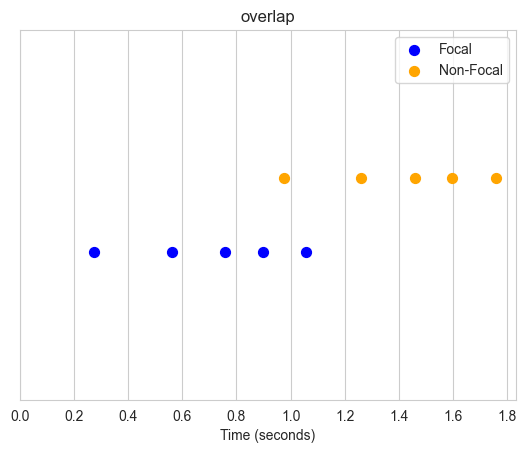

In [33]:
a = [0.275, 0.286, 0.197, 0.1382, 0.16]

x_positions_a = np.cumsum(a)
x_positions_b = x_positions_a + 0.7

plt.scatter(x_positions_a, [0.2] * len(a), c='blue', s=50, label="Focal")
plt.scatter(x_positions_b, [0.3] * len(a), c='orange', s=50, label="Non-Focal")

plt.xticks(np.arange(0, max(x_positions_b) + 0.2, 0.2))
plt.xlabel("Time (seconds)")
plt.title("overlap")

plt.yticks([])
plt.ylim(0, 0.5)
plt.legend()
plt.show()

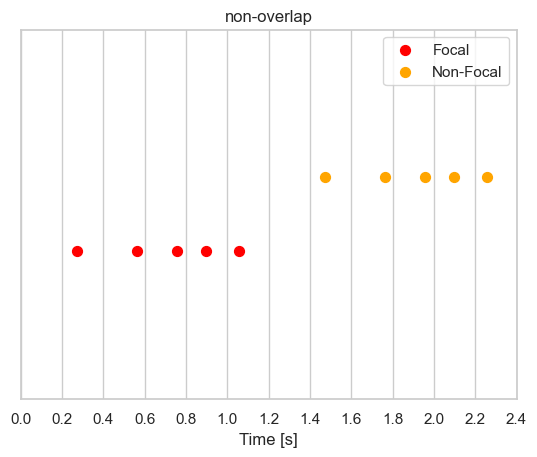

In [347]:
a = [0.275, 0.286, 0.197, 0.1382, 0.16]

x_positions_a = np.cumsum(a)
x_positions_b = x_positions_a + 1.2
# x_positions_c = x_positions_a + 2.4

plt.scatter(x_positions_a, [0.2] * len(a), c='red', s=50, label="Focal")
plt.scatter(x_positions_b, [0.3] * len(a), c='orange', s=50, label="Non-Focal")
# plt.scatter(x_positions_c, [0.2] * len(a), c='red', s=50)

plt.xticks(np.arange(0, max(x_positions_b) + 0.2, 0.2))
plt.xlabel("Time [s]")
plt.title("non-overlap")

plt.yticks([])
plt.ylim(0, 0.5)
plt.legend()
plt.show()

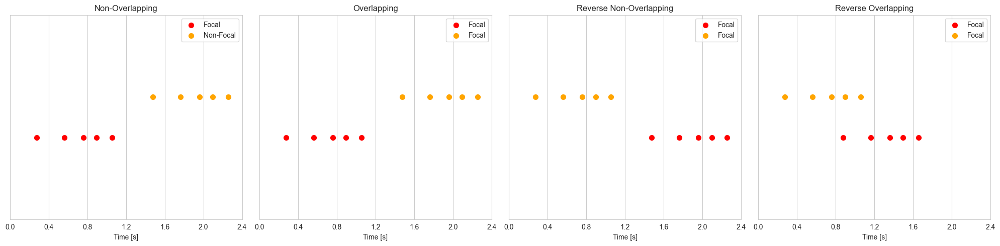

In [32]:
a = [0.275, 0.286, 0.197, 0.1382, 0.16]
x_positions_a = np.cumsum(a)
x_positions_b = x_positions_a + 1.2

fig, axes = plt.subplots(1, 4, figsize=(20, 5))  # 1 row, 4 columns, shared y-axis

# Plot 1
axes[0].scatter(x_positions_a, [0.2] * len(a), c='red', s=50, label="Focal")
axes[0].scatter(x_positions_b, [0.3] * len(a), c='orange', s=50, label="Non-Focal")
axes[0].set_title("Non-Overlapping")
axes[0].legend()

# Plot 2
axes[1].scatter(x_positions_a, [0.2] * len(a), c='red', s=50, label="Focal")
x_positions_b = x_positions_a + 1.2
axes[1].scatter(x_positions_b, [0.3] * len(a), c='orange', s=50, label="Focal")
axes[1].set_title("Overlapping")
axes[1].legend()

# Plot 3
axes[2].scatter(x_positions_b, [0.2] * len(a), c='red', s=50, label="Focal")
x_positions_b = x_positions_a + 0.6
axes[2].scatter(x_positions_a, [0.3] * len(a), c='orange', s=50, label="Focal")
axes[2].set_title("Reverse Non-Overlapping")
axes[2].legend()

# Plot 4
axes[3].scatter(x_positions_b, [0.2] * len(a), c='red', s=50, label="Focal")
x_positions_b = x_positions_a + .6
axes[3].scatter(x_positions_a, [0.3] * len(a), c='orange', s=50, label="Focal")
axes[3].set_title("Reverse Overlapping")
axes[3].legend()

# Common settings
for ax in axes:
    ax.set_xticks(np.arange(0, max(x_positions_b + .6) + 0.2, 0.4))
    ax.set_xlabel("Time [s]")
    ax.set_yticks([])
    ax.set_ylim(0, 0.5)

plt.tight_layout()
plt.show()

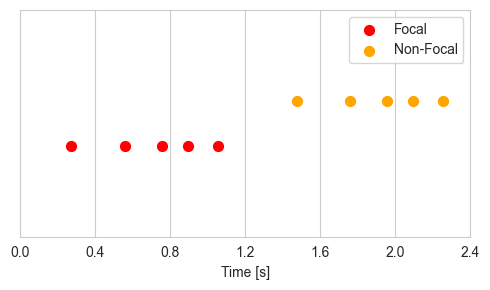

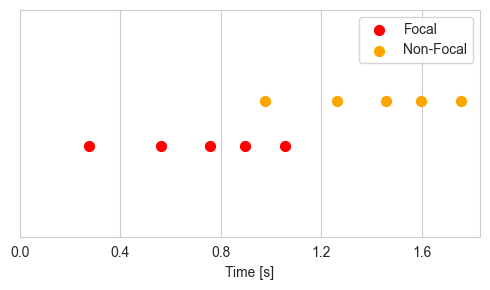

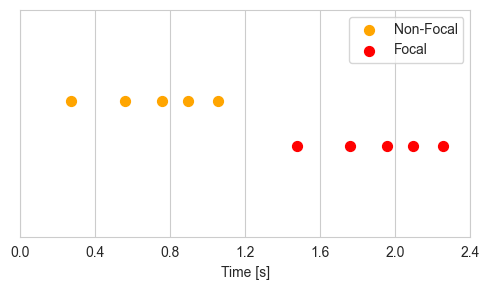

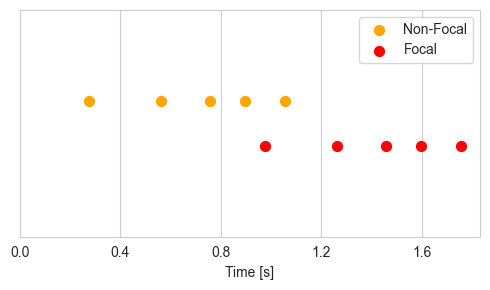

In [44]:
# Data
a = [0.275, 0.286, 0.197, 0.1382, 0.16]
x_positions_a = np.cumsum(a)
color1 = 'red'
color2 = 'orange'

# Define common settings function to avoid repetition
def apply_common_settings(ax, x_positions):
    """Applies common axis settings."""
    # Calculate x-ticks based on the max position used in this specific plot
    max_x = np.max(x_positions) if isinstance(x_positions, np.ndarray) else x_positions # Handle case if only x_pos_a used
    if len(x_positions) > 0:
         max_x = np.max(x_positions)
    else:
        max_x = 0 # Default if no data

    # Determine max position from all x positions used in the plot
    all_x_coords = []
    for coll in ax.collections:
         all_x_coords.extend(coll.get_offsets()[:, 0])

    if all_x_coords:
        max_limit = max(all_x_coords) + 0.2
    else:
        max_limit = 1 # Default if no data plotted

    ax.set_xticks(np.arange(0, max_limit, 0.4))
    ax.set_xlabel("Time [s]")
    ax.set_yticks([]) # No y-axis ticks
    ax.set_ylim(0, 0.5) # Fixed y-axis range


# --- Plot 1: Non-Overlapping ---
fig1, ax1 = plt.subplots(1, 1, figsize=(5, 3)) # Create a new figure and axis
x_positions_b_plot1 = x_positions_a + 1.2
ax1.scatter(x_positions_a, [0.2] * len(a), c='red', s=50, label="Focal")
ax1.scatter(x_positions_b_plot1, [0.3] * len(a), c='orange', s=50, label="Non-Focal") # Label was correct here
# ax1.set_title("Non-Overlapping")
ax1.legend()
apply_common_settings(ax1, np.concatenate((x_positions_a, x_positions_b_plot1))) # Apply settings
plt.tight_layout() # Apply tight layout to this specific figure


# --- Plot 2: Overlapping ---
fig2, ax2 = plt.subplots(1, 1, figsize=(5, 3)) # Create a new figure and axis
x_positions_b_plot2 = x_positions_a + 0.7 # Recalculated as in original code
ax2.scatter(x_positions_a, [0.2] * len(a), c='red', s=50, label="Focal") # Label was correct here
ax2.scatter(x_positions_b_plot2, [0.3] * len(a), c='orange', s=50, label="Non-Focal") # Corrected label to Non-Focal
# ax2.set_title("Overlapping")
ax2.legend()
apply_common_settings(ax2, np.concatenate((x_positions_a, x_positions_b_plot2))) # Apply settings
plt.tight_layout() # Apply tight layout to this specific figure


# --- Plot 3: Reverse Non-Overlapping ---
fig3, ax3 = plt.subplots(1, 1, figsize=(5, 3)) # Create a new figure and axis
# Note: In the original code, the roles of focal/non-focal points changed positions and labels.
# Correcting labels based on implied meaning (position A is now Non-Focal, B is Focal)
# and using original position calculations but assigned to the correct labels.
x_positions_b_plot3 = x_positions_a + 1.2 # Recalculated as in original code (was 1.2 initially)
ax3.scatter(x_positions_a, [0.3] * len(a), c='orange', s=50, label="Non-Focal") # Position A is Non-Focal
ax3.scatter(x_positions_b_plot3, [0.2] * len(a), c='red', s=50, label="Focal")     # Position B is Focal
# ax3.set_title("Reverse Non-Overlapping")
# ax3.legend(loc='upper right', labels=['Focal', 'Non-Focal'], fontsize=20) # Keep legend font size as defined in original code
ax3.legend()
apply_common_settings(ax3, np.concatenate((x_positions_a, x_positions_b_plot3))) # Apply settings
plt.tight_layout() # Apply tight layout to this specific figure


# --- Plot 4: Reverse Overlapping ---
fig4, ax4 = plt.subplots(1, 1, figsize=(5, 3)) # Create a new figure and axis
# Same logic as Plot 3 for positions and labels
x_positions_b_plot4 = x_positions_a + 0.7 # Recalculated as in original code (was 1.2 initially)
ax4.scatter(x_positions_a, [0.3] * len(a), c='orange', s=50, label="Non-Focal") # Position A is Non-Focal
ax4.scatter(x_positions_b_plot4, [0.2] * len(a), c='red', s=50, label="Focal")     # Position B is Focal
# ax4.set_title("Reverse Overlapping")
ax4.legend()
apply_common_settings(ax4, np.concatenate((x_positions_a, x_positions_b_plot4))) # Apply settings
plt.tight_layout() # Apply tight layout to this specific figure


# Display all figures
plt.show()

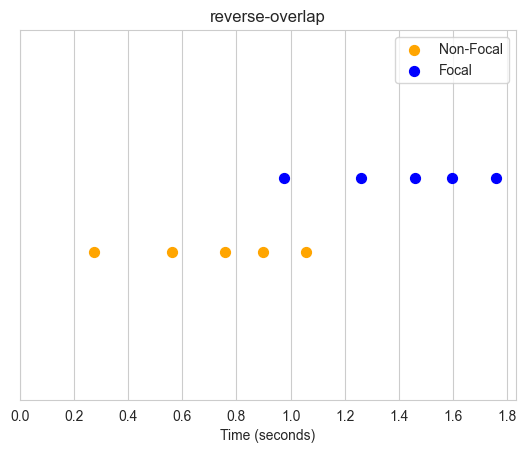

In [145]:
a = [0.275, 0.286, 0.197, 0.1382, 0.16]

x_positions_a = np.cumsum(a)
x_positions_b = x_positions_a + 0.7

plt.scatter(x_positions_a, [0.2] * len(a), c='orange', s=50, label="Non-Focal")
plt.scatter(x_positions_b, [0.3] * len(a), c='blue', s=50, label="Focal")

plt.xticks(np.arange(0, max(x_positions_b) + 0.2, 0.2))
plt.xlabel("Time (seconds)")
plt.title("reverse-overlap")

plt.yticks([])
plt.ylim(0, 0.5)
plt.legend()
plt.show()

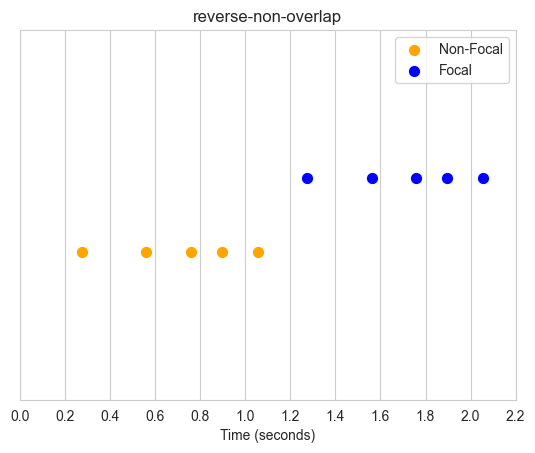

In [146]:
a = [0.275, 0.286, 0.197, 0.1382, 0.16]

x_positions_a = np.cumsum(a)
x_positions_b = x_positions_a + 1

plt.scatter(x_positions_a, [0.2] * len(a), c='orange', s=50, label="Non-Focal")
plt.scatter(x_positions_b, [0.3] * len(a), c='blue', s=50, label="Focal")

plt.xticks(np.arange(0, max(x_positions_b) + 0.2, 0.2))
plt.xlabel("Time (seconds)")
plt.title("reverse-non-overlap")

plt.yticks([])
plt.ylim(0, 0.5)
plt.legend()
plt.show()

## coda types count

In [182]:
pd.DataFrame([x[-2] for x in coda_type_vectors])

,0
0,1+1+3
1,1+1+3
2,1+1+3
3,4R2
4,1+1+3
...,...
1533,1+1+3
1534,8R
1535,1+1+3
1536,9i


In [502]:
df

,Coda Type,Count,Category
0,1+1+3,880,First Coda
1,5R1,198,First Coda
2,4R2,107,First Coda
3,10i,61,First Coda
4,5R2,53,First Coda
5,6i,44,First Coda
6,3D,31,First Coda
7,5R3,26,First Coda
8,8R,25,First Coda
9,10R,17,First Coda


ValueError: cannot convert float NaN to integer

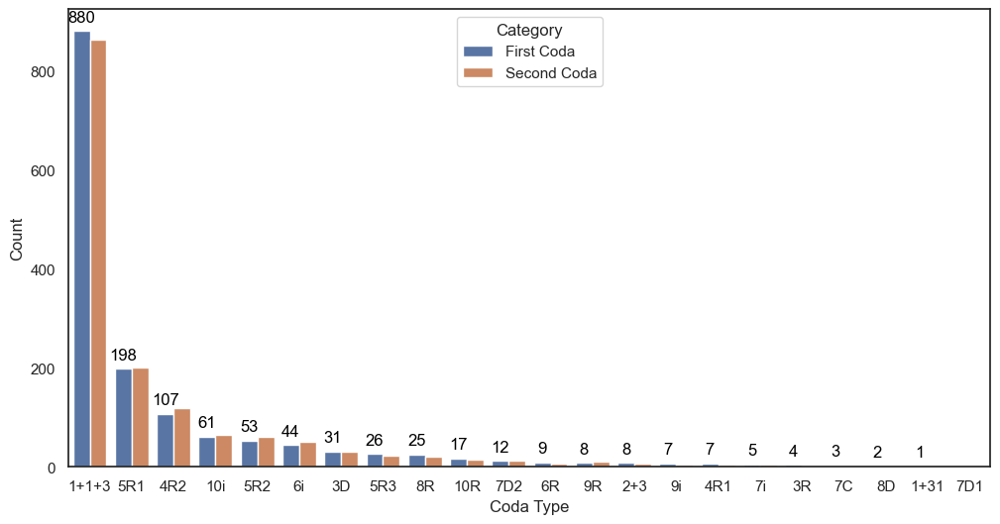

In [498]:
filterd_coda_types = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']
coda_type_vectors = get_vectors_by_col(coda_df.reset_index(drop=True), guy_coda_type_field_name, 'past_codas',
                                       filterd_coda_types)

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Extract the last two elements of each coda_type_vectors list
focal = pd.DataFrame([x[-2] for x in coda_type_vectors])[0].value_counts()
non_focal = pd.DataFrame([x[-1] for x in coda_type_vectors])[0].value_counts()

# Combine both into a single DataFrame
df = pd.DataFrame({
    "Coda Type": focal.index.tolist() + non_focal.index.tolist(),
    "Count": focal.tolist() + non_focal.tolist(),
    "Category": ["First Coda"] * len(focal) + ["Second Coda"] * len(non_focal)
})

# Plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(x="Coda Type", y="Count", hue="Category", data=df)

# Add value labels on bars
for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}",
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=12, color='black',
                xytext=(0, 10), textcoords='offset points')

# Labels and title
plt.xlabel("Coda Type")
plt.ylabel("Count")
plt.title("Coda Type Counts: First vs Second in Pair")
plt.legend(title="Position in Pair")

plt.show()


## abstract graph

In [18]:
pair_categories = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']

In [19]:
def plot_relation_feature(feature_name):
    fig = plt.figure(figsize=(20, 12))
    grid = plt.GridSpec(2, 4, figure=fig, height_ratios=[1, 1])  # Second row slightly shorter

    ### --- Graph 1: Area Plots (First Row, 4 Columns) --- ###
    axes_area = [fig.add_subplot(grid[0, i]) for i in range(4)]  # Create 4 area subplots
    for i, category in enumerate(pair_categories):
        ax = axes_area[i]

        # vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
        vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
        feature_pairs = [vec[-2:] for vec in vectors]
        feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
        feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
        feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
        feature_pairs_df['Non-Focal'] = feature_pairs_df['Non-Focal'] * -1

        ax.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Focal'], color='tomato', alpha=1)
        ax.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Non-Focal'], color='teal', alpha=1)

        ax.invert_yaxis()
        ax.grid(axis='x', linestyle='--', alpha=0.5)
        ax.grid(axis='y', linestyle='--', alpha=0.5)
        ax.set_xlabel(f"{feature_name} [s]")
        ax.set_yticks([])
        ax.set_title(f'Paired {feature_name} comparison of {category}')
        ax.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
            plt.Line2D([0], [0], color='navy', lw=2),
            plt.Line2D([0], [0], color='magenta', lw=2)
        ])

    vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), feature_name, 'past_codas',
                                                  pair_categories, symmetric_duration_exchanges)
    feature_pairs = [vec[-2:] for vec in vectors]
    feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
    feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
    feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
    df_long = pd.melt(feature_pairs_df, var_name="Type", value_name=feature_name)

    ### --- Graph 2: Beeswarm Plot (Second Row, First 2 Columns) --- ###
    # ax_swarm = fig.add_subplot(2, 2, 3)  # Place in row 2, col 1-2
    ax_swarm = fig.add_subplot(grid[1, 0:2])
    sns.swarmplot(x="Type", y=feature_name, data=df_long, hue="Type", palette={"Focal": "tomato", "Non-Focal": "teal"},
                  alpha=1, ax=ax_swarm)
    ax_swarm.set_title("Density-Aligned Symmetric Non-Overlap Pairs")
    ax_swarm.set_ylabel(f"{feature_name} [s]")
    ax_swarm.grid(axis='y', linestyle='--', alpha=0.5)
    ax_swarm.grid(axis='x', linestyle='--', alpha=0.5)
    ax_swarm.set_xlabel("")
    ax_swarm.legend().set_visible(False)

    ### --- Graph 3: hist Plot (Second Row, Last 2 Columns) --- ###
    ax_violin = fig.add_subplot(grid[1, 2:])
    sns.histplot(feature_pairs_df, kde=True, bins=75, alpha=0.5, element="step",
                 palette={"Focal": "tomato", "Non-Focal": "teal"})
    ax_violin.grid(axis='y', linestyle='--', alpha=0.5)
    ax_violin.grid(axis='x', linestyle='--', alpha=0.5)
    ax_violin.set_xlabel(f'{feature_name} [s]')
    ax_violin.set_ylabel("Frequency")
    ax_violin.set_title("Symmetric Non-Overlap pairs Distributions")

    plt.tight_layout()
    plt.suptitle(f"Comparing Focal and Non-Focal Coda {feature_name}", y=1.02, fontsize=16)
    plt.show()

In [22]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import matplotlib.gridspec as gridspec 
import seaborn as sns

def plot_relation_feature(feature_name, color1, color2):
    # Remove the single combined figure setup
    # fig = plt.figure(figsize=(20, 12))
    # grid = plt.GridSpec(2, 4, figure=fig, height_ratios=[1, 1])
    # axes_area = [fig.add_subplot(grid[0, i]) for i in range(4)]
    # axes = axes.flatten()

    # --- Graph 1: Area Plots (Separate Figures) ---
    for i, category in enumerate(pair_categories):
        # Create a new figure and axes for each area plot
        fig_area, ax_area = plt.subplots(figsize=(5, 6)) # Adjust size as needed per plot

        # Data preparation for this specific area plot category
        vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
        feature_pairs = [vec[-2:] for vec in vectors]
        feature_pairs_df_area = pd.DataFrame(np.vstack(feature_pairs))
        feature_pairs_df_area.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
        feature_pairs_df_area = feature_pairs_df_area.sort_values(by='Focal').reset_index(drop=True)
        feature_pairs_df_area['Non-Focal'] = feature_pairs_df_area['Non-Focal'] * -1

        # Plotting on the new axes
        ax_area.fill_betweenx(feature_pairs_df_area.index, 0, feature_pairs_df_area['Focal'], color=color1, alpha=1)
        ax_area.fill_betweenx(feature_pairs_df_area.index, 0, feature_pairs_df_area['Non-Focal'], color=color2, alpha=1)

        # Setting axes properties for this plot
        ax_area.invert_yaxis()
        ax_area.grid(axis='x', linestyle='--', alpha=0.5)
        ax_area.grid(axis='y', linestyle='--', alpha=0.5)
        ax_area.set_xlabel(f"Duration [s]", fontsize=20) # Keep fontsize as defined in original code
        ax_area.set_yticks([])
        # ax_area.set_title(f'Paired {feature_name} comparison of {category}') # Title commented out as requested
        ax_area.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
            plt.Line2D([0], [0], color=color1, lw=2),
            plt.Line2D([0], [0], color=color2, lw=2)
        ], fontsize=20) # Keep legend font size as defined in original code

        plt.tight_layout() # Apply tight layout to this individual figure
        plt.show() # Show this individual figure

    # --- Data Preparation for Beeswarm and Histogram (Shared Data) ---
    # This block needs to run once after the area plot loop but before swarm/hist
    vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), feature_name, 'past_codas',
                                                  pair_categories, symmetric_duration_exchanges)
    feature_pairs = [vec[-2:] for vec in vectors]
    feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
    feature_pairs_df.rename(columns={0: 'Non-Focal', 1: 'Focal'}, inplace=True)
    feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
    df_long = pd.melt(feature_pairs_df, var_name="Type", value_name=feature_name)

    ### --- Graph 2: Beeswarm Plot (Separate Figure) --- ###
    fig_swarm, ax_swarm = plt.subplots(figsize=(10, 6)) # Create a new figure and axes

    sns.swarmplot(x="Type", y=feature_name, data=df_long, hue="Type", palette={"Focal": color1, "Non-Focal": color2},
                  alpha=1, ax=ax_swarm) # Plot on the new axes

    # Setting axes properties for this plot
    # ax_swarm.set_title("Density-Aligned Symmetric Non-Overlap Pairs") # Title commented out as requested
    ax_swarm.set_ylabel(f"Length [s]", fontsize=20) # Keep fontsize as defined in original code
    ax_swarm.grid(axis='y', linestyle='--', alpha=0.5)
    ax_swarm.grid(axis='x', linestyle='--', alpha=0.5)
    ax_swarm.xaxis.set_tick_params(labelsize=20)
    ax_swarm.set_xlabel("") # Keep fontsize as defined in original code
    ax_swarm.legend().set_visible(False) # Keep legend hidden as defined in original code

    plt.tight_layout() # Apply tight layout to this individual figure
    plt.show() # Show this individual figure

    ### --- Graph 3: hist Plot (Separate Figure) --- ###
    fig_hist, ax_hist = plt.subplots(figsize=(10, 6)) # Create a new figure and axes

    sns.histplot(feature_pairs_df, kde=True, bins=75, alpha=0.5, element="step",
                 palette={"Focal": color1, "Non-Focal": color2}, ax=ax_hist) # Plot on the new axes

    # Setting axes properties for this plot
    ax_hist.grid(axis='y', linestyle='--', alpha=0.5)
    ax_hist.grid(axis='x', linestyle='--', alpha=0.5)
    legend = ax_hist.get_legend() # Use get_legend() to retrieve the existing legend
    if legend: # Check if a legend was created
        for text in legend.get_texts():
            text.set_fontsize(20)# ax_violin.set_title("Symmetric Non-Overlap pairs Distributions")
    ax_hist.set_xlabel(f'Length [s]', fontsize=20) # Keep fontsize as defined in original code
    ax_hist.set_ylabel("Frequency", fontsize=20) # Keep fontsize as defined in original code
    # ax_hist.set_title("Symmetric Non-Overlap pairs Distributions") # Title commented out as requested

    plt.tight_layout() # Apply tight layout to this individual figure
    plt.show() # Show this individual figure


#### duration

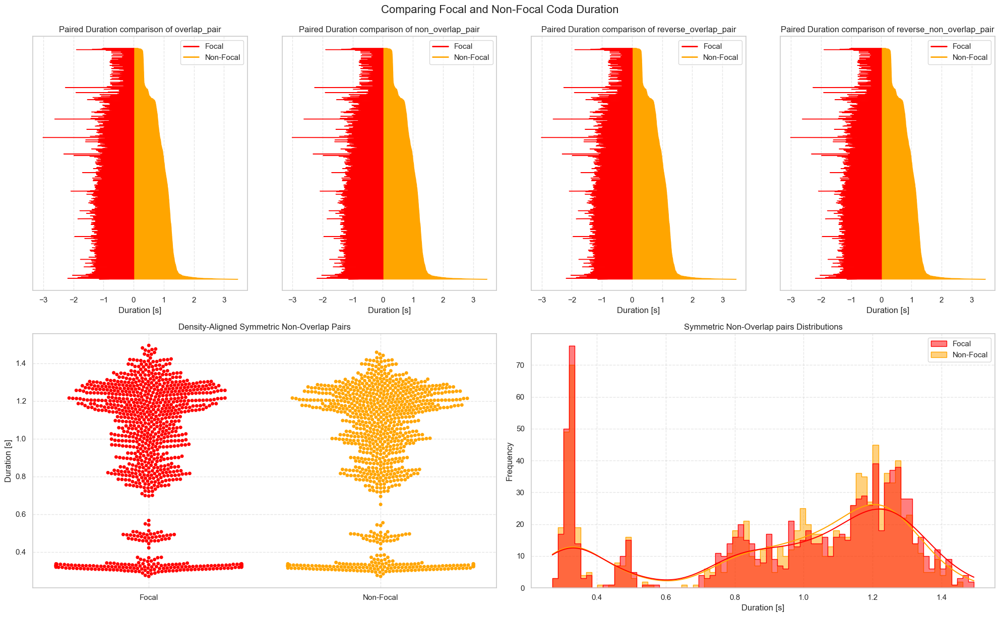

In [373]:
plot_relation_feature('Duration')

#### ICI1

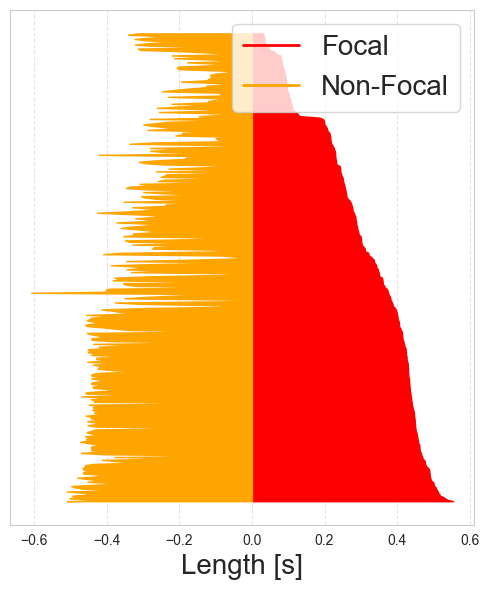

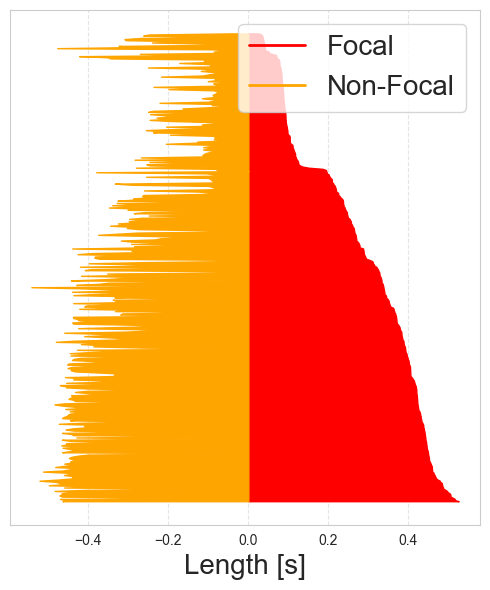

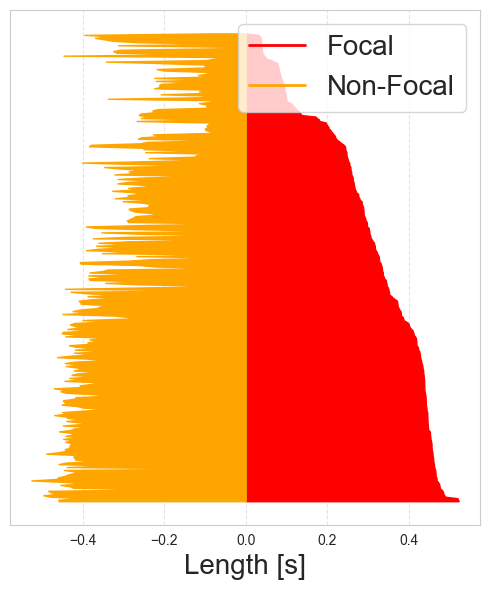

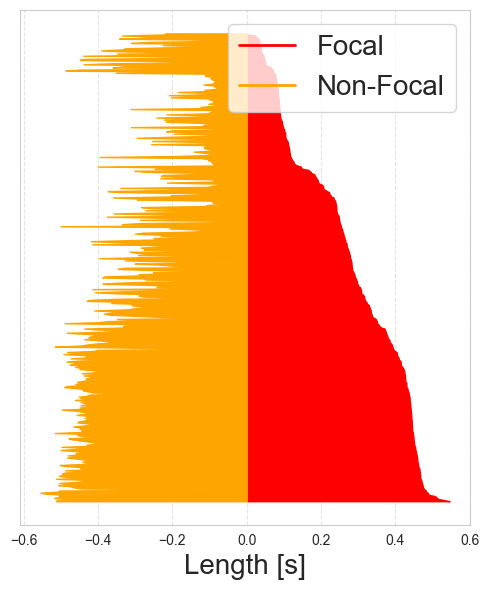

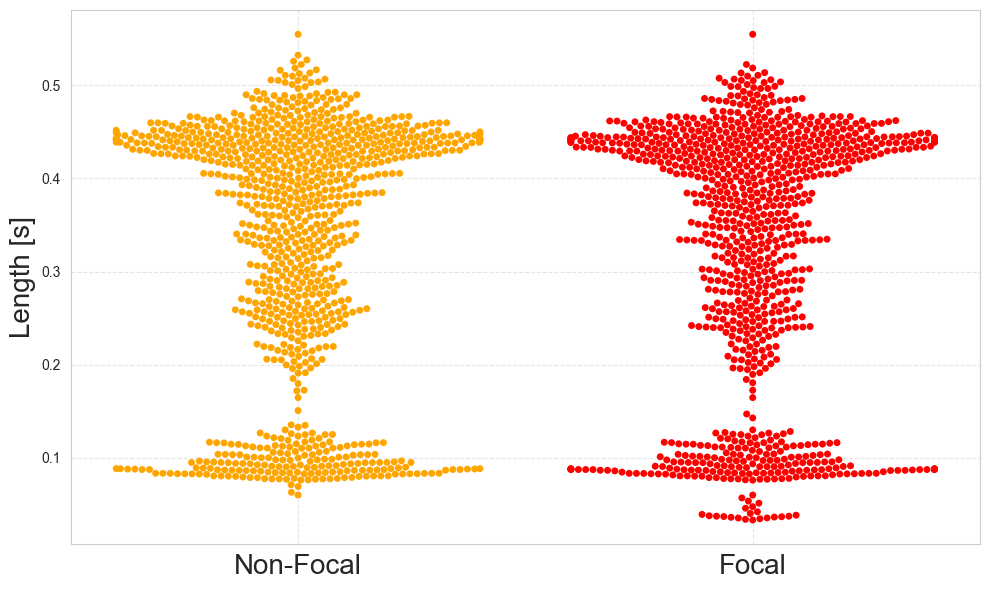

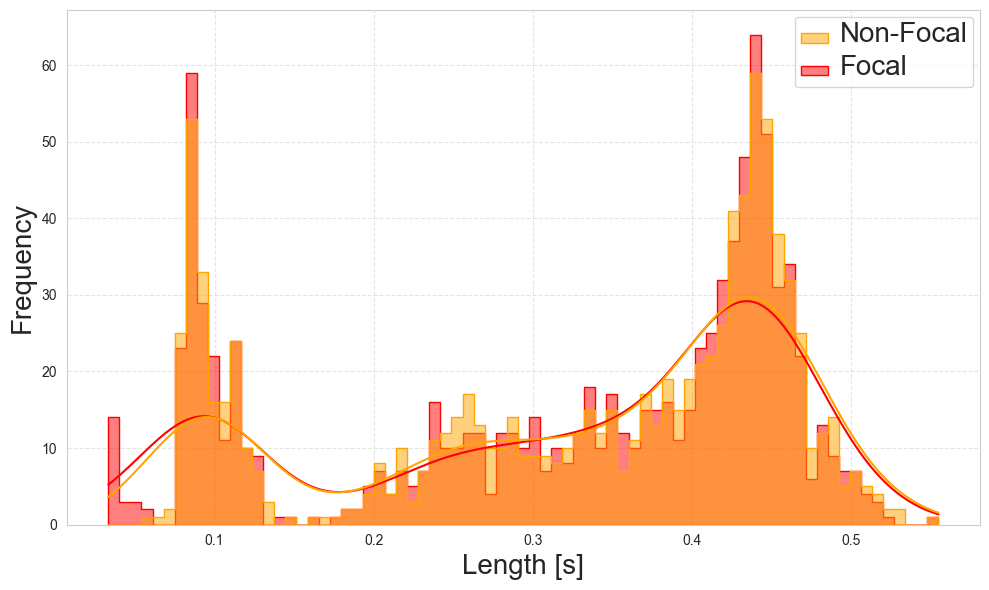

In [21]:
plot_relation_feature('ICI1', 'red', 'orange')

#### ICI2

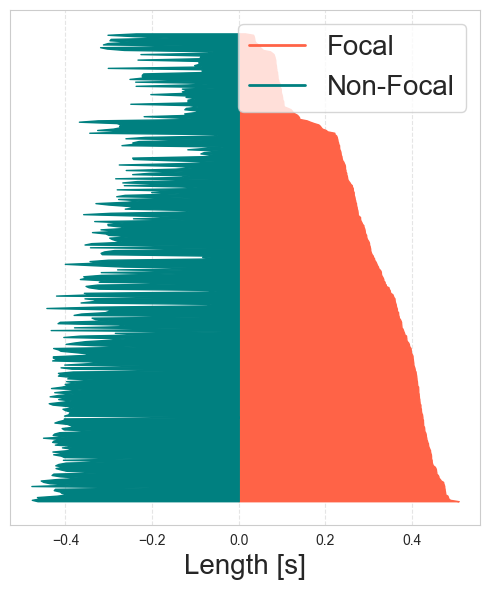

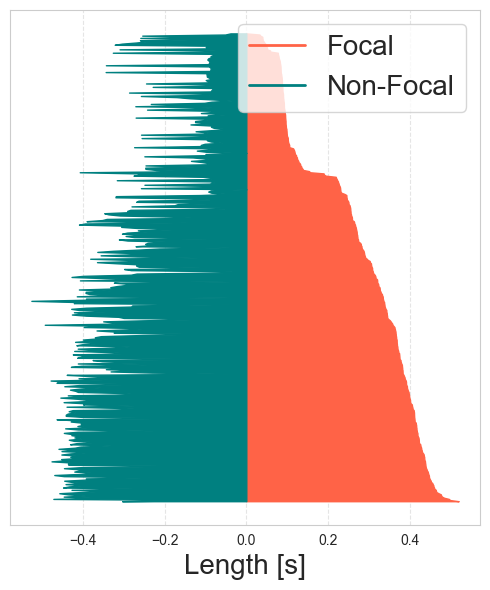

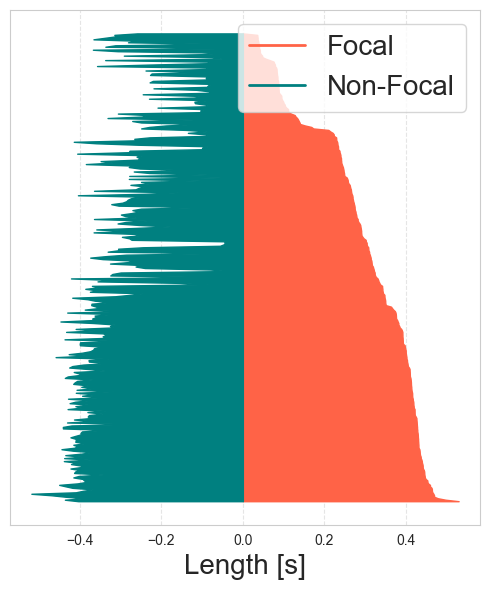

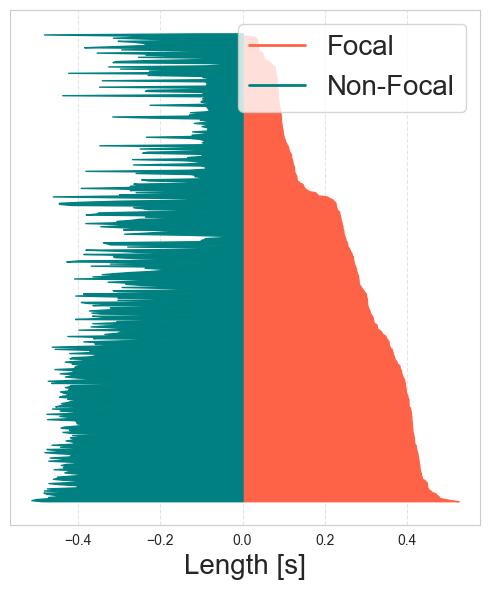

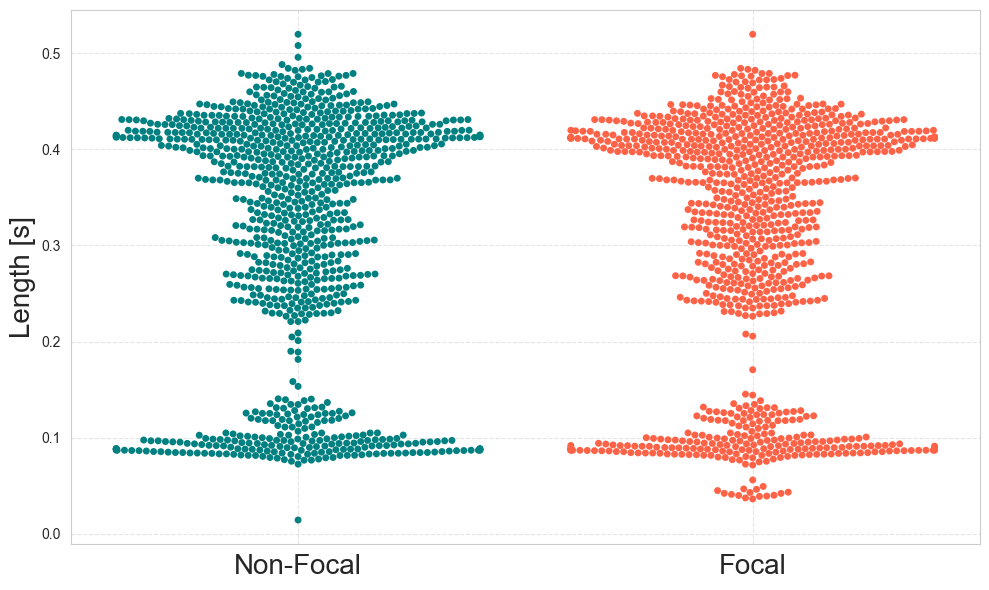

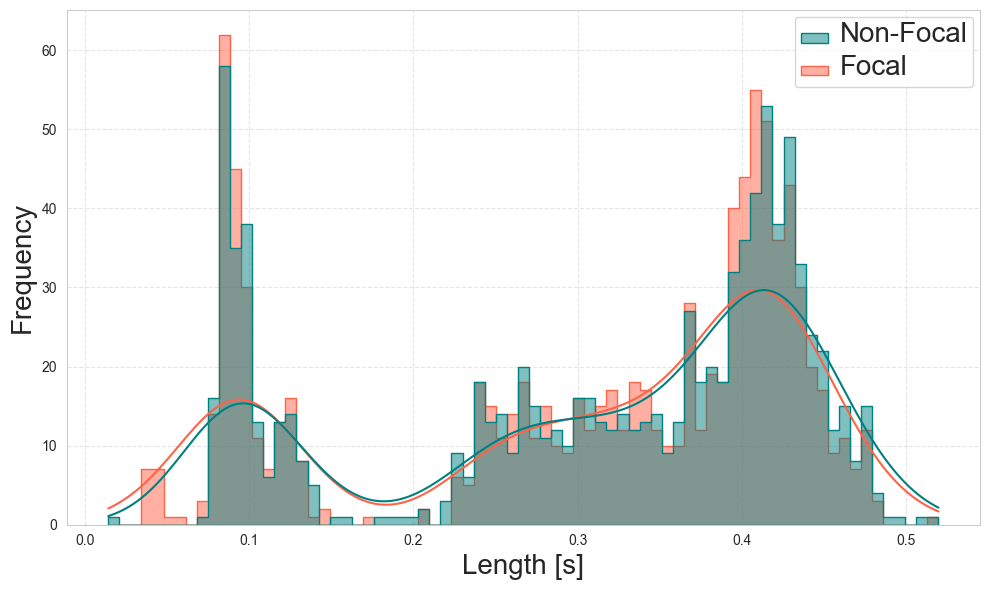

In [75]:
plot_relation_feature('ICI2', 'tomato', 'teal')

#### Main-Duration, Subs-ICI1 and ICI2

C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 9.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 9.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWar

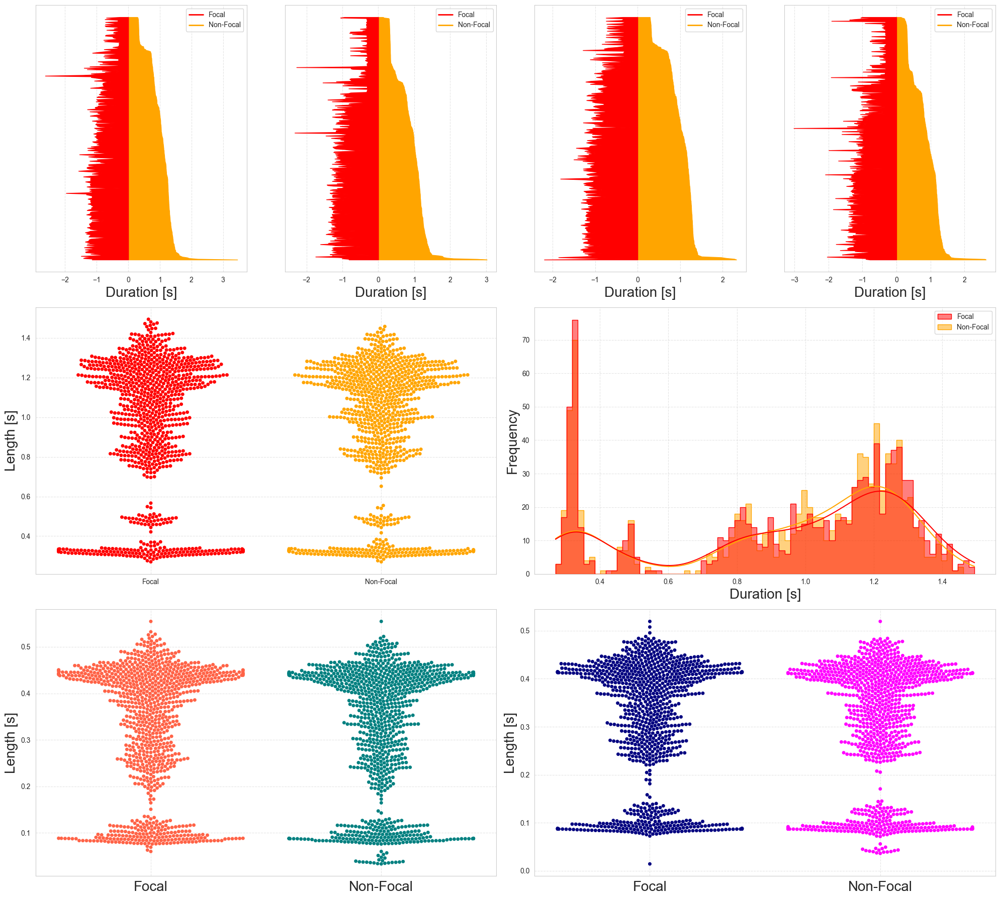

In [135]:
feature_name = 'Duration'
fig = plt.figure(figsize=(20, 18))
grid = plt.GridSpec(3, 4, figure=fig, height_ratios=[1, 1, 1])  # Second row slightly shorter

### --- Graph 1: Area Plots (First Row, 4 Columns) --- ###
axes_area = [fig.add_subplot(grid[0, i]) for i in range(4)]  # Create 4 area subplots
for i, category in enumerate(pair_categories):
    ax = axes_area[i]

    # vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
    vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
    feature_pairs = [vec[-2:] for vec in vectors]
    feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
    feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
    feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
    feature_pairs_df['Non-Focal'] = feature_pairs_df['Non-Focal'] * -1

    ax.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Focal'], color='orange', alpha=1)
    ax.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Non-Focal'], color='red', alpha=1)

    ax.invert_yaxis()
    ax.grid(axis='x', linestyle='--', alpha=0.5)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
    ax.set_xlabel(f"{feature_name} [s]", fontsize=20)
    ax.set_yticks([])
    # ax.set_title(f'Paired {feature_name} comparison of {category}')
    ax.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
        plt.Line2D([0], [0], color='red', lw=2),
        plt.Line2D([0], [0], color='orange', lw=2)
    ])

vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), feature_name, 'past_codas',
                                              pair_categories, symmetric_duration_exchanges)
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
df_long = pd.melt(feature_pairs_df, var_name="Type", value_name=feature_name)

### --- Graph 2: Beeswarm Plot (Second Row, First 2 Columns) --- ###
# ax_swarm = fig.add_subplot(2, 2, 3)  # Place in row 2, col 1-2
ax_swarm = fig.add_subplot(grid[1, 0:2])
sns.swarmplot(x="Type", y=feature_name, data=df_long, hue="Type", palette={"Focal": "red", "Non-Focal": "orange"},
              alpha=1, ax=ax_swarm)
# ax_swarm.set_title(f"Density-Aligned Symmetric Non-Overlap Pairs {feature_name}")
ax_swarm.set_ylabel(f"Length [s]", fontsize=20)
ax_swarm.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm.set_xlabel("")
ax_swarm.legend().set_visible(False)


### --- Graph 3: hist Plot (Second Row, Last 2 Columns) --- ###
ax_violin = fig.add_subplot(grid[1, 2:])
sns.histplot(feature_pairs_df, kde=True, bins=75, alpha=0.5, element="step",
             palette={"Focal": "red", "Non-Focal": "orange"})
ax_violin.grid(axis='y', linestyle='--', alpha=0.5)
ax_violin.grid(axis='x', linestyle='--', alpha=0.5)
ax_violin.set_xlabel(f'{feature_name} [s]', fontsize=20)
ax_violin.set_ylabel("Frequency", fontsize=20)
# ax_violin.set_title("Symmetric Non-Overlap pairs Distributions")


### --- Graph 4: Beeswarm Plot (Second Row, First 2 Columns) --- ###
vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI1', 'past_codas', pair_categories,
                                              symmetric_duration_exchanges)
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
df_long = pd.melt(feature_pairs_df, var_name="Type", value_name=feature_name)

ax_swarm = fig.add_subplot(grid[2, 0:2])
sns.swarmplot(x="Type", y=feature_name, data=df_long, hue="Type", palette={"Focal": "tomato", "Non-Focal": "teal"},
              alpha=1, ax=ax_swarm)
# ax_swarm.set_title("Density-Aligned Symmetric Non-Overlap Pairs ICI1")
ax_swarm.set_ylabel(f"Length [s]", fontsize=20)
ax_swarm.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm.set_xlabel("")
ax_swarm.legend().set_visible(False)
ax_swarm.xaxis.set_tick_params(labelsize=20)

### --- Graph 5: Beeswarm Plot (Second Row, First 2 Columns) --- ###
vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI2', 'past_codas', pair_categories,
                                              symmetric_duration_exchanges)
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
df_long = pd.melt(feature_pairs_df, var_name="Type", value_name=feature_name)

ax_swarm = fig.add_subplot(grid[2, 2:])
sns.swarmplot(x="Type", y=feature_name, data=df_long, hue="Type", palette={"Focal": "navy", "Non-Focal": "magenta"},
              alpha=1, ax=ax_swarm)
# ax_swarm.set_title("Density-Aligned Symmetric Non-Overlap Pairs ICI2")
ax_swarm.set_ylabel(f"Length [s]", fontsize=20)
ax_swarm.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm.set_xlabel("")
ax_swarm.legend().set_visible(False)
ax_swarm.xaxis.set_tick_params(labelsize=20)

plt.tight_layout()
# plt.suptitle(f"Comparing Focal and Non-Focal Coda", y=1.02, fontsize=16)
plt.show()

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\2139397778.py:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_area1.set_xticklabels(xticklabels, fontsize=10)


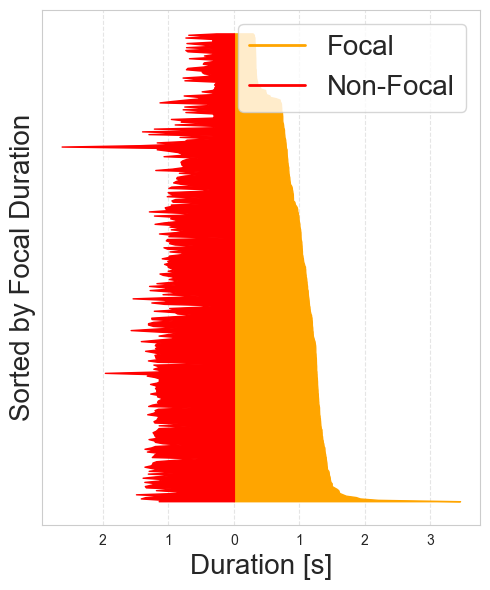

In [31]:
feature_name = 'Duration'
fig_area1 = plt.figure(figsize=(5, 6)) # Adjust size as needed
ax_area1 = fig_area1.add_subplot(1, 1, 1)
category = pair_categories[0] 

vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
feature_pairs_df['Non-Focal'] = feature_pairs_df['Non-Focal'] * -1 # Keep negative for plotting left side

ax_area1.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Focal'], color='orange', alpha=1)
ax_area1.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Non-Focal'], color='red', alpha=1)

ax_area1.invert_yaxis()
ax_area1.grid(axis='x', linestyle='--', alpha=0.5)
ax_area1.grid(axis='y', linestyle='--', alpha=0.5)
ax_area1.set_xlabel(f"{feature_name} [s]", fontsize=20)
ax_area1.set_ylabel(f"Sorted by Non-Focal Duration", fontsize=20)
ax_area1.set_yticks([])
# ax_area1.set_title(f'Paired {feature_name} comparison of {category}')

# --- Modify x-axis labels to show positive values ---
# Get current tick locations
xticks = ax_area1.get_xticks()
xticklabels = [f'{abs(tick):.0f}' for tick in xticks]
ax_area1.set_xticklabels(xticklabels, fontsize=10)
# --- End modification ---


ax_area1.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
    plt.Line2D([0], [0], color='orange', lw=2), # Corrected handle colors to match plot
    plt.Line2D([0], [0], color='red', lw=2)
], fontsize=20)
fig_area1.tight_layout()
plt.show()


C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\984775275.py:37: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_area1.set_xticklabels(xticklabels, fontsize=10)


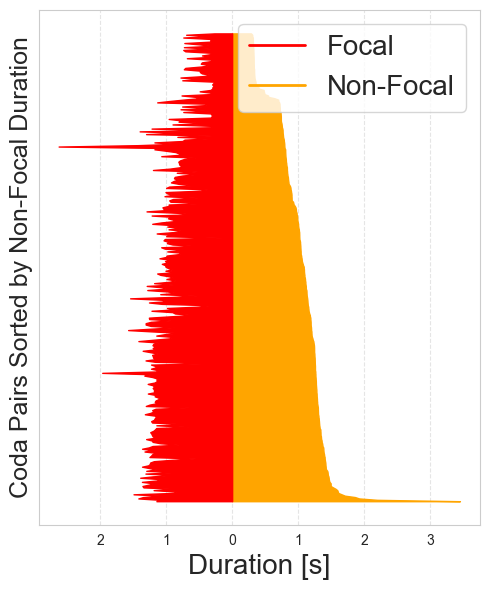

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\984775275.py:71: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_area2.set_xticklabels(xticklabels, fontsize=10)


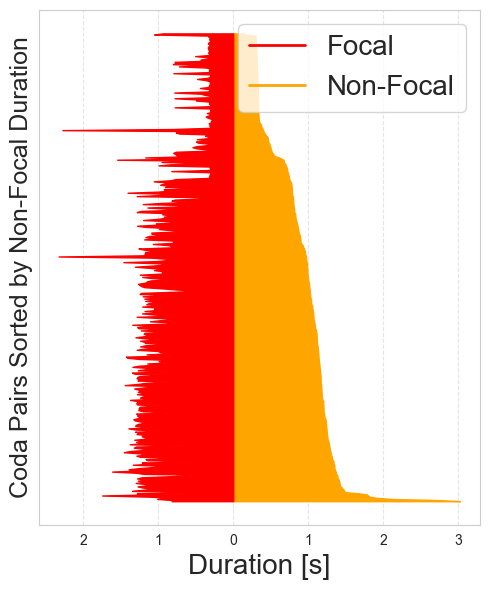

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\984775275.py:104: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_area3.set_xticklabels(xticklabels, fontsize=10)


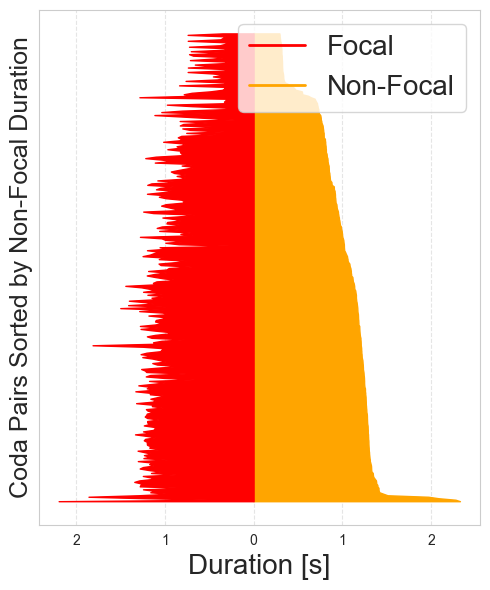

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\984775275.py:137: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax_area4.set_xticklabels(xticklabels, fontsize=10)


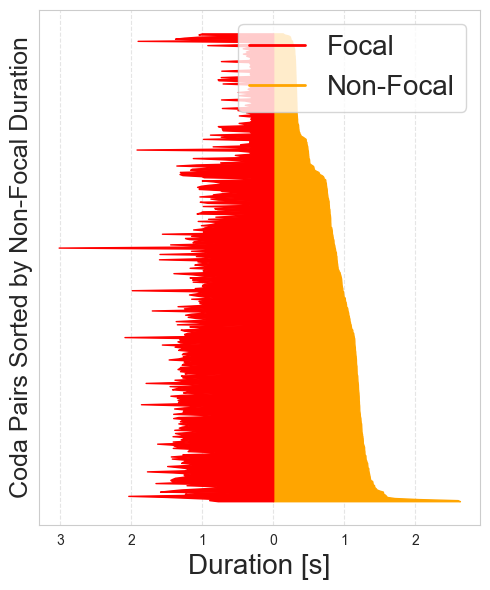

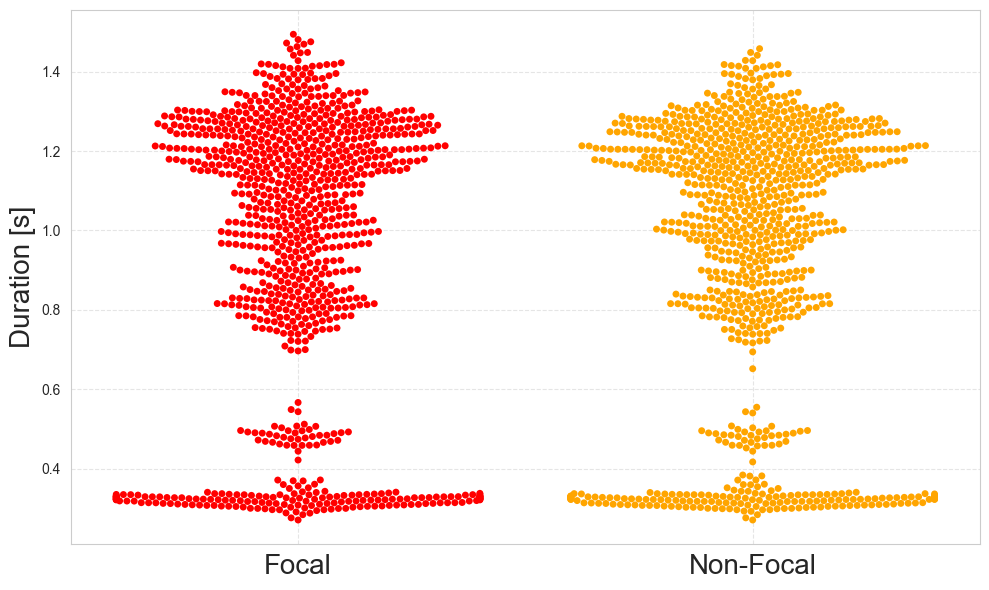

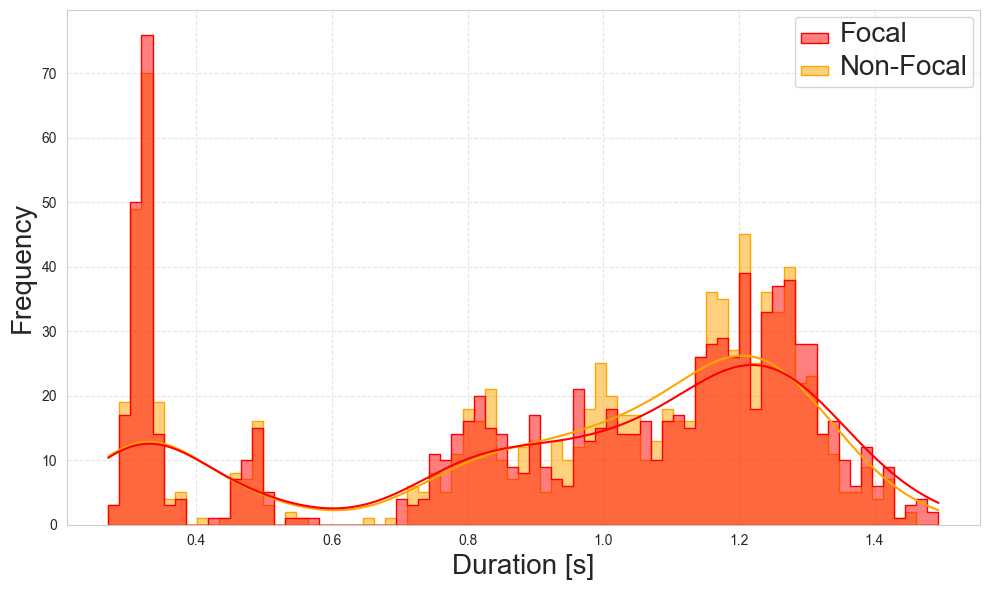

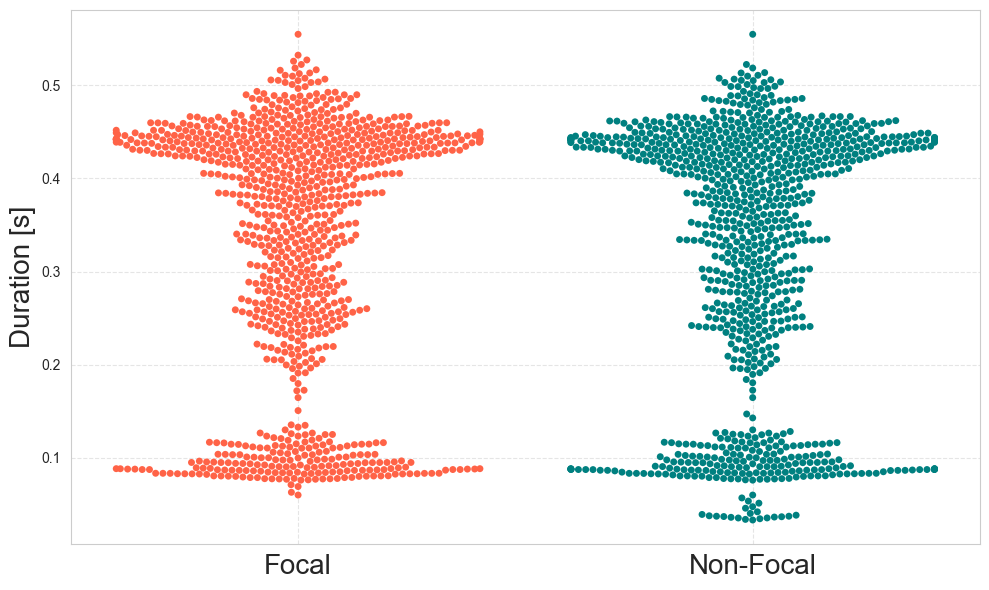

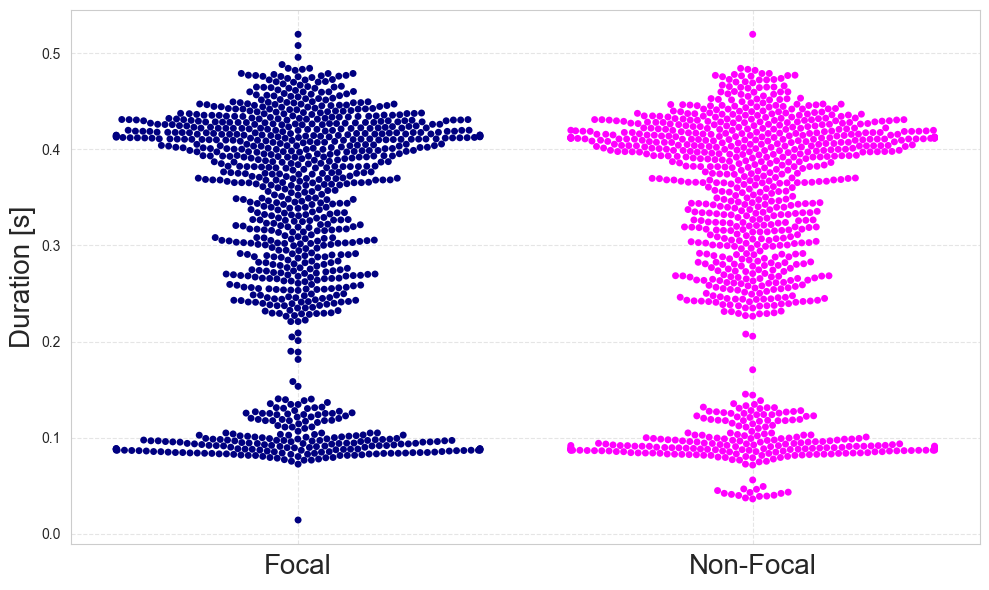

In [39]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

feature_name = 'Duration'

### --- Plot 1 - Area Plot 1 --- ###
fig_area1 = plt.figure(figsize=(5, 6))
ax_area1 = fig_area1.add_subplot(1, 1, 1)
category = pair_categories[0] 

vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
feature_pairs_df['Non-Focal'] = feature_pairs_df['Non-Focal'] * -1

ax_area1.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Focal'], color='orange', alpha=1)
ax_area1.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Non-Focal'], color='red', alpha=1)

ax_area1.invert_yaxis()
ax_area1.grid(axis='x', linestyle='--', alpha=0.5)
ax_area1.grid(axis='y', linestyle='--', alpha=0.5)
ax_area1.set_xlabel(f"{feature_name} [s]", fontsize=20)
ax_area1.set_ylabel(f"Coda Pairs Sorted by Non-Focal Duration", fontsize=18)
ax_area1.set_yticks([])
# ax_area1.set_title(f'Paired {feature_name} comparison of {category}')
ax_area1.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
], fontsize=20)
xticks = ax_area1.get_xticks()
xticklabels = [f'{abs(tick):.0f}' for tick in xticks]
ax_area1.set_xticklabels(xticklabels, fontsize=10)

fig_area1.tight_layout()
plt.show()

### --- Plot 2 - Area Plot 2 --- ###
fig_area2 = plt.figure(figsize=(5,6)) 
ax_area2 = fig_area2.add_subplot(1, 1, 1)
category = pair_categories[1]

vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
feature_pairs_df['Non-Focal'] = feature_pairs_df['Non-Focal'] * -1

ax_area2.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Focal'], color='orange', alpha=1)
ax_area2.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Non-Focal'], color='red', alpha=1)

ax_area2.invert_yaxis()
ax_area2.grid(axis='x', linestyle='--', alpha=0.5)
ax_area2.grid(axis='y', linestyle='--', alpha=0.5)
ax_area2.set_xlabel(f"{feature_name} [s]", fontsize=20)
ax_area2.set_yticks([])
ax_area2.set_ylabel(f"Coda Pairs Sorted by Non-Focal Duration", fontsize=18)

# ax_area2.set_title(f'Paired {feature_name} comparison of {category}')
ax_area2.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
], fontsize=20)
xticks = ax_area2.get_xticks()
xticklabels = [f'{abs(tick):.0f}' for tick in xticks]
ax_area2.set_xticklabels(xticklabels, fontsize=10)

fig_area2.tight_layout()
plt.show()

### --- Plot 3 - Area Plot 3 --- ###
fig_area3 = plt.figure(figsize=(5, 6)) 
ax_area3 = fig_area3.add_subplot(1, 1, 1)
category = pair_categories[2] 
vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
feature_pairs_df['Non-Focal'] = feature_pairs_df['Non-Focal'] * -1

ax_area3.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Focal'], color='orange', alpha=1)
ax_area3.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Non-Focal'], color='red', alpha=1)

ax_area3.invert_yaxis()
ax_area3.grid(axis='x', linestyle='--', alpha=0.5)
ax_area3.grid(axis='y', linestyle='--', alpha=0.5)
ax_area3.set_xlabel(f"{feature_name} [s]", fontsize=20)
ax_area3.set_ylabel(f"Coda Pairs Sorted by Non-Focal Duration", fontsize=18)
ax_area3.set_yticks([])
# ax_area3.set_title(f'Paired {feature_name} comparison of {category}')
ax_area3.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
], fontsize=20)
xticks = ax_area3.get_xticks()
xticklabels = [f'{abs(tick):.0f}' for tick in xticks]
ax_area3.set_xticklabels(xticklabels, fontsize=10)

fig_area3.tight_layout()
plt.show()

### --- Plot 4 - Area Plot 4 --- ###
fig_area4 = plt.figure(figsize=(5, 6)) # Adjust size as needed
ax_area4 = fig_area4.add_subplot(1, 1, 1)
category = pair_categories[3]

vectors = get_vectors_by_col(coda_df.reset_index(drop=True), feature_name, 'past_codas', [category])
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
feature_pairs_df['Non-Focal'] = feature_pairs_df['Non-Focal'] * -1

ax_area4.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Focal'], color='orange', alpha=1)
ax_area4.fill_betweenx(feature_pairs_df.index, 0, feature_pairs_df['Non-Focal'], color='red', alpha=1)

ax_area4.invert_yaxis()
ax_area4.grid(axis='x', linestyle='--', alpha=0.5)
ax_area4.grid(axis='y', linestyle='--', alpha=0.5)
ax_area4.set_xlabel(f"{feature_name} [s]", fontsize=20)
ax_area4.set_ylabel(f"Coda Pairs Sorted by Non-Focal Duration", fontsize=18)
ax_area4.set_yticks([])
# ax_area4.set_title(f'Paired {feature_name} comparison of {category}')
ax_area4.legend(loc='upper right', labels=['Focal', 'Non-Focal'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
], fontsize=20)
xticks = ax_area4.get_xticks()
xticklabels = [f'{abs(tick):.0f}' for tick in xticks]
ax_area4.set_xticklabels(xticklabels, fontsize=10)

fig_area4.tight_layout()
plt.show()

vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), feature_name, 'past_codas',
                                              pair_categories, symmetric_duration_exchanges)
feature_pairs = [vec[-2:] for vec in vectors]
feature_pairs_df = pd.DataFrame(np.vstack(feature_pairs))
feature_pairs_df.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df = feature_pairs_df.sort_values(by='Focal').reset_index(drop=True)
df_long = pd.melt(feature_pairs_df, var_name="Type", value_name=feature_name)

### --- Plot 5: Beeswarm Plot (Second Row, First 2 Columns) --- ###
fig_swarm1 = plt.figure(figsize=(10, 6))
ax_swarm1 = fig_swarm1.add_subplot(1, 1, 1)
sns.swarmplot(x="Type", y=feature_name, data=df_long, hue="Type", palette={"Focal": "red", "Non-Focal": "orange"},
              alpha=1, ax=ax_swarm1)
# ax_swarm1.set_title(f"Density-Aligned Symmetric Non-Overlap Pairs {feature_name}")
ax_swarm1.set_ylabel(f"Duration [s]", fontsize=20)
ax_swarm1.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm1.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm1.set_xlabel("")
ax_swarm1.xaxis.set_tick_params(labelsize=20)
ax_swarm1.legend().set_visible(False)
fig_swarm1.tight_layout()
plt.show()


### --- Plot 6: hist Plot (Second Row, Last 2 Columns) --- ###
fig_hist = plt.figure(figsize=(10, 6))
ax_violin = fig_hist.add_subplot(1, 1, 1)
sns.histplot(feature_pairs_df, kde=True, bins=75, alpha=0.5, element="step",
             palette={"Focal": "red", "Non-Focal": "orange"})
ax_violin.grid(axis='y', linestyle='--', alpha=0.5)
ax_violin.grid(axis='x', linestyle='--', alpha=0.5)
ax_violin.set_xlabel(f'{feature_name} [s]', fontsize=20)
ax_violin.set_ylabel("Frequency", fontsize=20)
legend = ax_violin.get_legend() # Use get_legend() to retrieve the existing legend
if legend: # Check if a legend was created
    for text in legend.get_texts():
        text.set_fontsize(20)# ax_violin.set_title("Symmetric Non-Overlap pairs Distributions")
fig_hist.tight_layout()
plt.show()


### --- Plot 7: Beeswarm Plot (Third Row, First 2 Columns) --- ###
vectors_ici1 = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI1', 'past_codas', pair_categories,
                                              symmetric_duration_exchanges)
feature_pairs_ici1 = [vec[-2:] for vec in vectors_ici1]
feature_pairs_df_ici1 = pd.DataFrame(np.vstack(feature_pairs_ici1))
feature_pairs_df_ici1.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df_ici1 = feature_pairs_df_ici1.sort_values(by='Focal').reset_index(drop=True)
df_long_ici1 = pd.melt(feature_pairs_df_ici1, var_name="Type", value_name='ICI1')

fig_swarm2 = plt.figure(figsize=(10, 6))
ax_swarm2 = fig_swarm2.add_subplot(1, 1, 1)
sns.swarmplot(x="Type", y='ICI1', data=df_long_ici1, hue="Type", palette={"Focal": "tomato", "Non-Focal": "teal"},
              alpha=1, ax=ax_swarm2)
# ax_swarm2.set_title("Density-Aligned Symmetric Non-Overlap Pairs ICI1")
ax_swarm2.set_ylabel(f"Duration [s]", fontsize=20)
ax_swarm2.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm2.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm2.set_xlabel("")
ax_swarm2.legend().set_visible(False)
ax_swarm2.xaxis.set_tick_params(labelsize=20)
fig_swarm2.tight_layout()
plt.show()

### --- Plot 8: Beeswarm Plot (Third Row, Last 2 Columns) --- ###
vectors_ici2 = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'ICI2', 'past_codas', pair_categories,
                                              symmetric_duration_exchanges)
feature_pairs_ici2 = [vec[-2:] for vec in vectors_ici2]
feature_pairs_df_ici2 = pd.DataFrame(np.vstack(feature_pairs_ici2))
feature_pairs_df_ici2.rename(columns={0: 'Focal', 1: 'Non-Focal'}, inplace=True)
feature_pairs_df_ici2 = feature_pairs_df_ici2.sort_values(by='Focal').reset_index(drop=True)
df_long_ici2 = pd.melt(feature_pairs_df_ici2, var_name="Type", value_name='ICI2')

fig_swarm3 = plt.figure(figsize=(10, 6))
ax_swarm3 = fig_swarm3.add_subplot(1, 1, 1)
sns.swarmplot(x="Type", y='ICI2', data=df_long_ici2, hue="Type", palette={"Focal": "navy", "Non-Focal": "magenta"},
              alpha=1, ax=ax_swarm3)
# ax_swarm3.set_title("Density-Aligned Symmetric Non-Overlap Pairs ICI2")
ax_swarm3.set_ylabel(f"Duration [s]", fontsize=20)
ax_swarm3.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm3.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm3.set_xlabel("")
ax_swarm3.legend().set_visible(False)
ax_swarm3.xaxis.set_tick_params(labelsize=20)
fig_swarm3.tight_layout()
plt.show()

#### CI vs CB

### coll pairing visualization

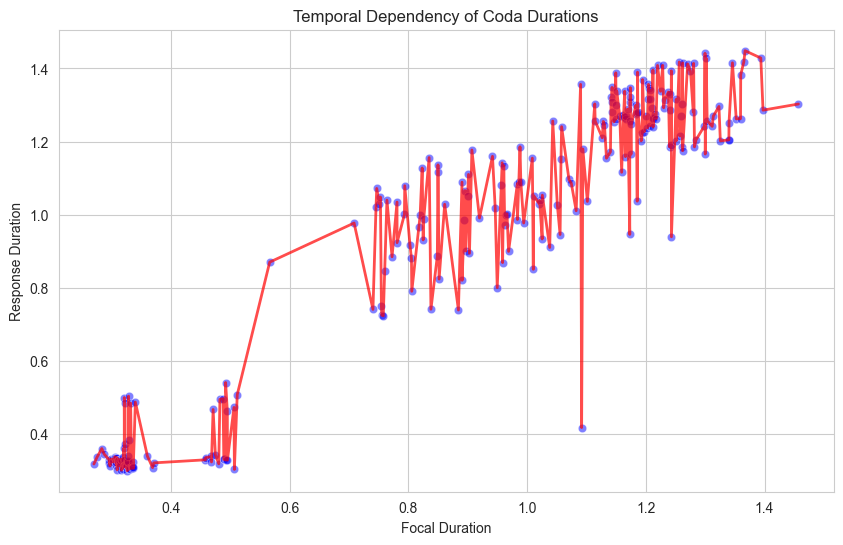

In [148]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x="col1", y="col2", data=duration_pairs_df, color="blue", alpha=0.5)
sns.lineplot(x="col1", y="col2", data=duration_pairs_df, color="red", linewidth=2, alpha=0.7)
plt.xlabel("Focal Duration")
plt.ylabel("Response Duration")
plt.title("Temporal Dependency of Coda Durations")
plt.show()

### nice visutailization

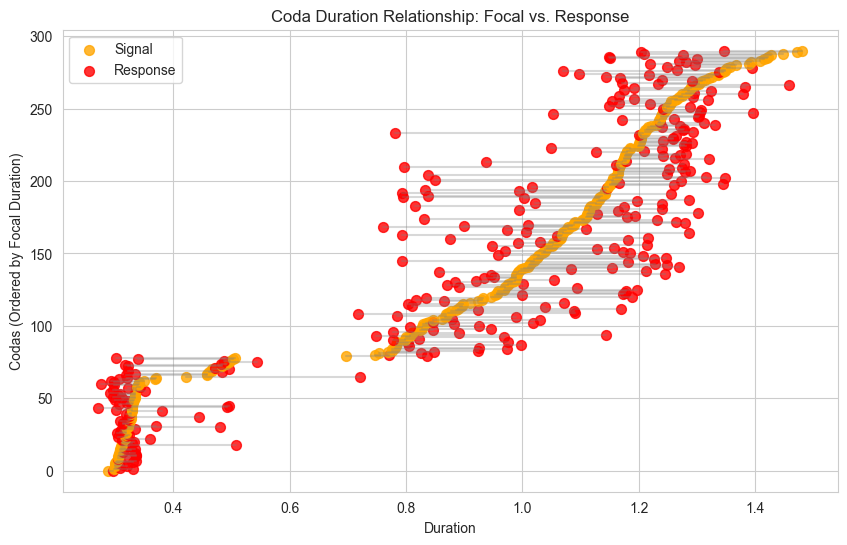

In [162]:
duration_vectors = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), 'Duration', 'past_codas',
                                                       ['non_overlap_pair'], symmetric_duration_exchanges)
duration_pairs = [vec[-2:] for vec in duration_vectors]

duration_pairs_df = pd.DataFrame(np.vstack(duration_pairs))
duration_pairs_df.rename(columns={0: 'col1', 1: 'col2'}, inplace=True)
duration_pairs_df = duration_pairs_df.sort_values(by='col1').reset_index(drop=True)

# Sort by focal duration for clarity
duration_df = duration_pairs_df.sort_values("col1")

# Create color gradient
colors = sns.color_palette("viridis", as_cmap=True)(np.linspace(0, 1, len(duration_df)))

fig, ax = plt.subplots(figsize=(10, 6))

for i in range(len(duration_df)):
    ax.plot([duration_df["col1"].iloc[i], duration_df["col2"].iloc[i]], [i, i], color="gray", alpha=0.3)
    ax.scatter(duration_df["col1"].iloc[i], i, color="orange", s=50, alpha=0.8, label="Signal" if i == 0 else "")
    ax.scatter(duration_df["col2"].iloc[i], i, color="red", s=50, alpha=0.8, label="Response" if i == 0 else "")

ax.set_xlabel("Duration")
ax.set_ylabel("Codas (Ordered by Focal Duration)")
ax.set_title("Coda Duration Relationship: Focal vs. Response")
ax.legend()
plt.show()

### graph 2

C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 11.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 13.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


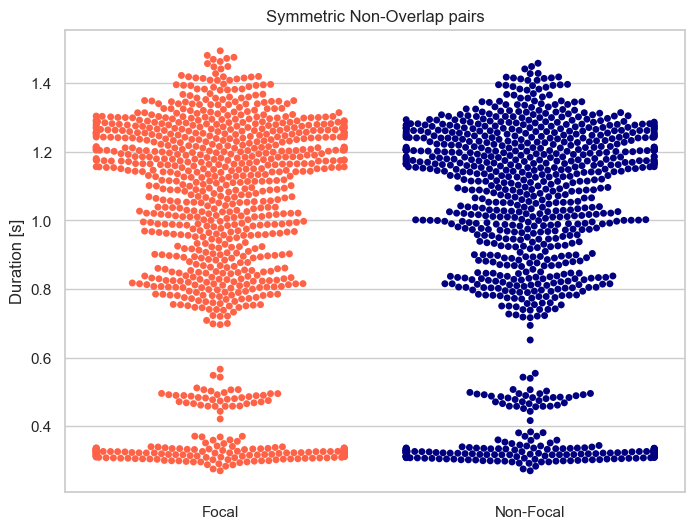

In [390]:
df_long = pd.melt(duration_df, var_name="Type", value_name="Duration")
df_long["Type"] = df_long["Type"].replace({"col1": "Focal", "col2": "Non-Focal"})

# Beeswarm Plot
plt.figure(figsize=(8, 6))
# sns.swarmplot(x="Type", y="Duration", data=df_long, hue="Type", palette={"Focal": "teal", "Non-Focal": "magenta"}, alpha=1)
# sns.swarmplot(x="Type", y="Duration", data=df_long, hue="Type", palette={"Focal": "tomato", "Non-Focal": "navy"}, alpha=1)
#
plt.title("Symmetric Non-Overlap pairs")
plt.ylabel("Duration [s]")
plt.xlabel("")
plt.legend().set_visible(False)  # Hides the legend
plt.show()

### graph 3

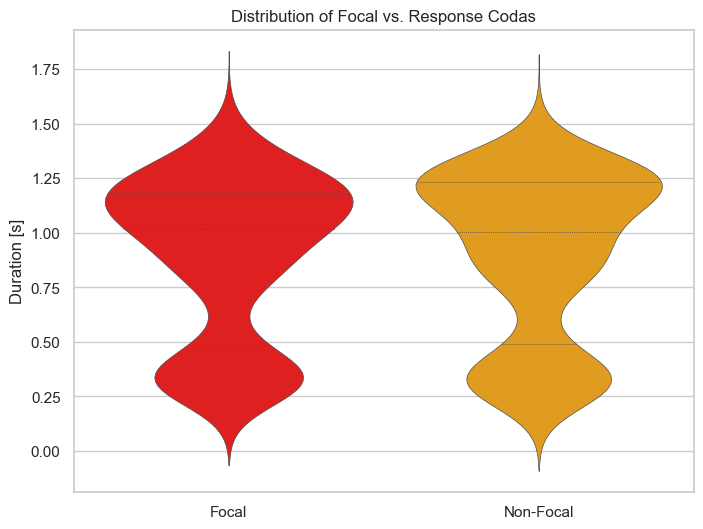

In [249]:
sns.set_theme(style="whitegrid")
plt.figure(figsize=(8, 6))

sns.violinplot(data=[duration_df["col1"], duration_df["col2"]], inner="quartile", split=True, gap=.1,
               palette=["red", "orange"], alpha=1, bw_adjust=.2, cut=3, linewidth=0.5)

plt.xticks([0, 1], ["Focal", "Non-Focal"])
plt.ylabel("Duration [s]")
plt.title("Distribution of Focal vs. Response Codas")
plt.show()

## correlation and regression

In [414]:
def plot_regression(label_name):
    # --- All Exchanges ---
    vectors = get_vectors_by_col(coda_df.reset_index(drop=True), label_name, 'past_codas',
                                 ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair',
                                  'reverse_non_overlap_pair'])
    X_all = np.array([vec[-2] for vec in vectors]).reshape(-1, 1)
    y_all = [vec[-1] for vec in vectors]

    X_train_all, X_test_all, y_train_all, y_test_all = train_test_split(X_all, y_all, test_size=0.2, random_state=42)
    linear_reg_all = LinearRegression()
    linear_reg_all.fit(X_train_all, y_train_all)
    y_pred_linear_all = linear_reg_all.predict(X_test_all)
    poly_reg_all = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
    poly_reg_all.fit(X_train_all, y_train_all)

    # --- Symmetric Exchanges ---
    vectors_sym = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), label_name, 'past_codas',
                                                      ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair',
                                                       'reverse_non_overlap_pair'], symmetric_duration_exchanges)
    X_sym = np.array([vec[-2] for vec in vectors_sym]).reshape(-1, 1)
    y_sym = [vec[-1] for vec in vectors_sym]

    X_train_sym, X_test_sym, y_train_sym, y_test_sym = train_test_split(X_sym, y_sym, test_size=0.2, random_state=42)
    linear_reg_sym = LinearRegression()
    linear_reg_sym.fit(X_train_sym, y_train_sym)
    y_pred_linear_sym = linear_reg_sym.predict(X_test_sym)
    poly_reg_sym = make_pipeline(PolynomialFeatures(degree=2), LinearRegression())
    poly_reg_sym.fit(X_train_sym, y_train_sym)

    # --- Plotting ---
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot for All Exchanges
    axes[0].scatter(X_all, y_all, color='blue', alpha=0.5, label=f'Actual {label_name}')
    axes[0].plot(X_test_all, y_pred_linear_all, color='red', label='Linear Regression')
    x_range_all = np.linspace(X_all.min(), X_all.max(), 100).reshape(-1, 1)
    axes[0].plot(x_range_all, poly_reg_all.predict(x_range_all), color='green',
                 label='Polynomial Regression (degree 2)')
    axes[0].set_title(f'Predicting Non-Focal {label_name} from Focal {label_name} (All Exchanges)')
    axes[0].set_xlabel(f'Focal {label_name} [s]')
    axes[0].set_ylabel(f'Non-Focal {label_name} [s]')
    axes[0].legend()

    # Plot for Symmetric Exchanges
    axes[1].scatter(X_sym, y_sym, color='blue', alpha=0.5, label=f'Actual {label_name}')
    axes[1].plot(X_test_sym, y_pred_linear_sym, color='red', label='Linear Regression')
    x_range_sym = np.linspace(X_sym.min(), X_sym.max(), 100).reshape(-1, 1)
    axes[1].plot(x_range_sym, poly_reg_sym.predict(x_range_sym), color='green',
                 label='Polynomial Regression (degree 2)')
    axes[1].set_title(f'Predicting Non-Focal {label_name} from Focal {label_name} (Symmetric Exchanges)')
    axes[1].set_xlabel(f'Focal {label_name} [s]')
    axes[1].set_ylabel(f'Non-Focal {label_name} [s]')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

### duration

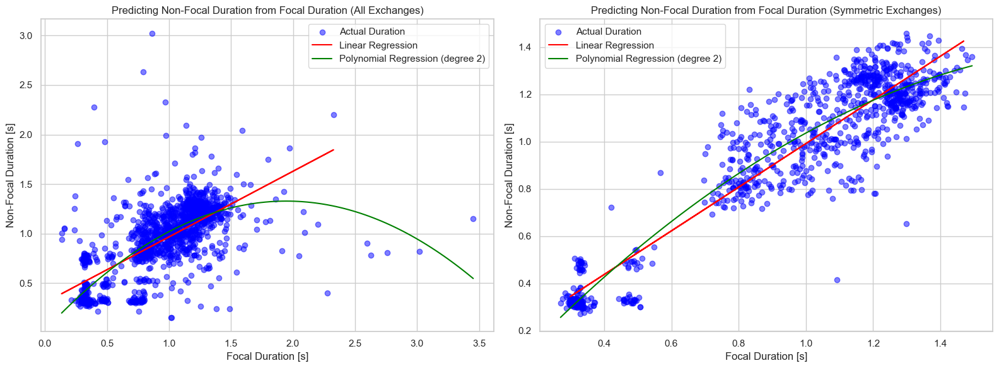

In [415]:
plot_regression('Duration')

### ICI1

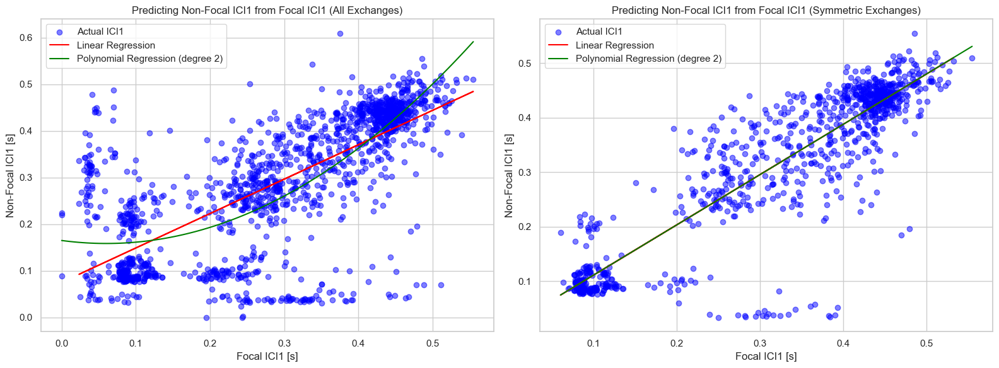

In [416]:
plot_regression('ICI1')

### ICI2

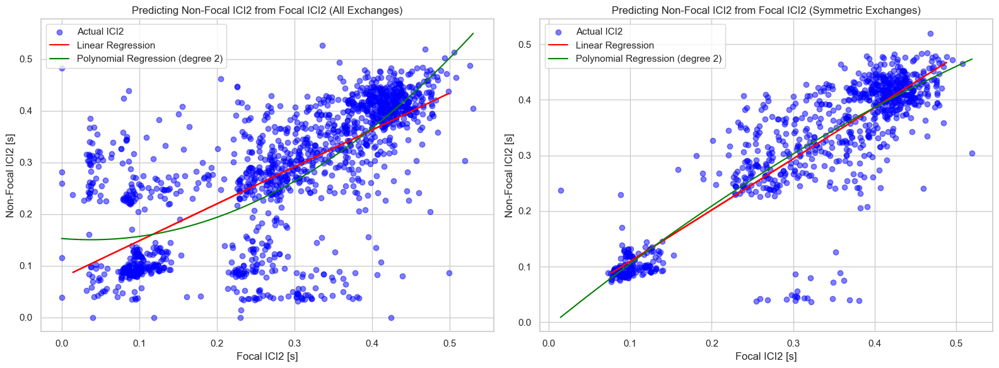

In [417]:
plot_regression('ICI2')

## mutual information plotting

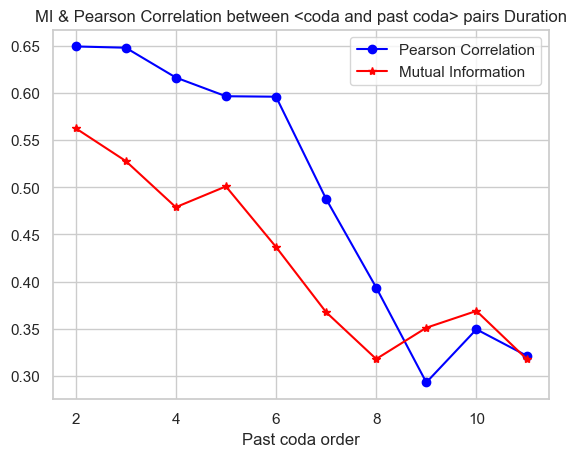

In [420]:
def get_pairs_by_idx(vectors, order):
    return [(vec[-order - 1], vec[-1]) for vec in vectors if len(vec) >= order + 1]


label_name = 'Duration'
sequence_options = list(range(2, 12))
vectors = get_vectors_by_col(coda_df.reset_index(drop=True), label_name, 'past_codas',
                             ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair'])
vectors_sym = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), label_name, 'past_codas',
                                                  ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair',
                                                   'reverse_non_overlap_pair'], symmetric_duration_exchanges)

pearson_corrs = []
mis = []
seqs = []
for seq in sequence_options:
    pairs = get_pairs_by_idx(vectors, seq)
    if len(pairs) == 0:
        continue

    first = list(map(lambda x: x[0], pairs))
    second = list(map(lambda x: x[1], pairs))

    pearson_corr, _ = pearsonr(first, second)
    pearson_corrs.append(pearson_corr)

    mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
    mis.append(mi)
    seqs.append(seq)

plt.plot(seqs, pearson_corrs, marker='o', color='blue', label='Pearson Correlation')
plt.plot(seqs, mis, marker='*', color='red', label='Mutual Information')
plt.xlabel('Past coda order')
plt.title(f"MI & Pearson Correlation between <coda and past coda> pairs {feature_name}")
plt.legend(loc='best')
plt.show()

In [424]:
def plot_mi(label_name):
    # Compute metrics for all exchanges
    vectors = get_vectors_by_col(coda_df.reset_index(drop=True), label_name, 'past_codas',
                                 ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair',
                                  'reverse_non_overlap_pair'])
    pearson_corrs_all = []
    mis_all = []
    seqs_all = []
    for seq in sequence_options:
        pairs = get_pairs_by_idx(vectors, seq)
        if not pairs:
            continue
        first = [p[0] for p in pairs]
        second = [p[1] for p in pairs]
        corr, _ = pearsonr(first, second)
        pearson_corrs_all.append(corr)
        mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
        mis_all.append(mi[0])
        seqs_all.append(seq)

    # Compute metrics for symmetric exchanges
    vectors_sym = get_vectors_by_col_with_type_filter(coda_df.reset_index(drop=True), label_name, 'past_codas',
                                                      ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair',
                                                       'reverse_non_overlap_pair'],
                                                      symmetric_duration_exchanges)
    pearson_corrs_sym = []
    mis_sym = []
    seqs_sym = []
    for seq in sequence_options:
        pairs = get_pairs_by_idx(vectors_sym, seq)
        if not pairs:
            continue
        first = [p[0] for p in pairs]
        second = [p[1] for p in pairs]
        corr, _ = pearsonr(first, second)
        pearson_corrs_sym.append(corr)
        mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
        mis_sym.append(mi[0])
        seqs_sym.append(seq)

    # Plot the results side by side
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Left subplot: All exchanges
    axes[0].plot(seqs_all, pearson_corrs_all, marker='o', color='blue', label='Pearson Correlation')
    axes[0].plot(seqs_all, mis_all, marker='*', color='red', label='Mutual Information')
    axes[0].set_xlabel('Past coda order')
    axes[0].set_title('Correlation and MI for All Coda Pairs')
    axes[0].legend(loc='best')

    # Right subplot: Symmetric exchanges
    axes[1].plot(seqs_sym, pearson_corrs_sym, marker='o', color='blue', label='Pearson Correlation')
    axes[1].plot(seqs_sym, mis_sym, marker='*', color='red', label='Mutual Information')
    axes[1].set_xlabel('Past coda order')
    axes[1].set_title('Correlation and MI for Symmetric Coda Pairs')
    axes[1].legend(loc='best')

    fig.suptitle(f'Correlation & MI for Non-Focal {label_name} Using Past Focal Coda {label_name}', fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

### Duration

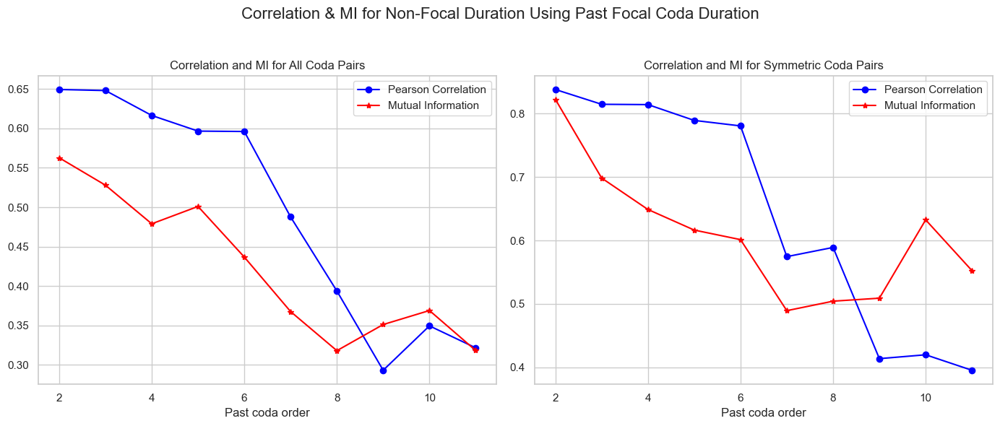

In [425]:
plot_mi('Duration')

### ICI1

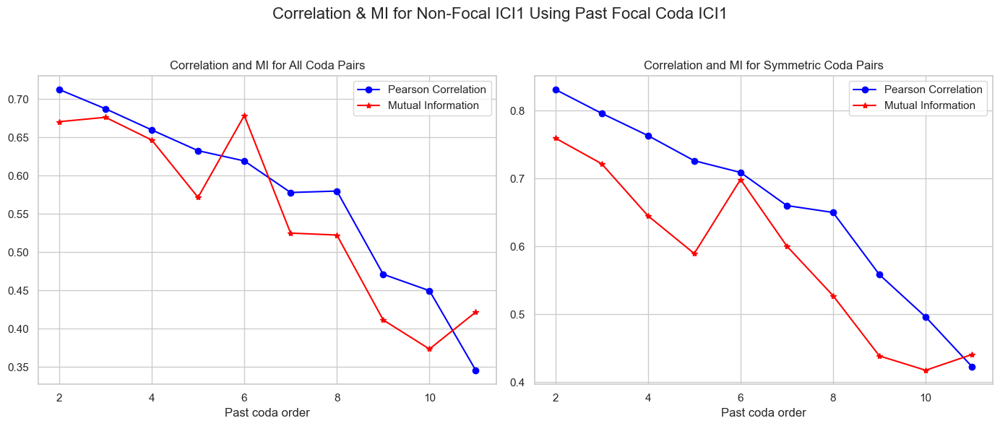

In [426]:
plot_mi('ICI1')

### ICI2

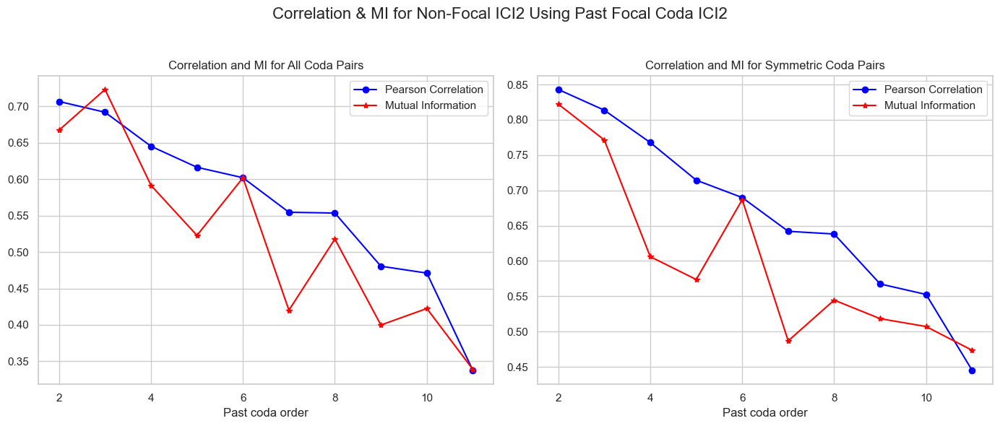

In [427]:
plot_mi('ICI2')

### ci vs cb

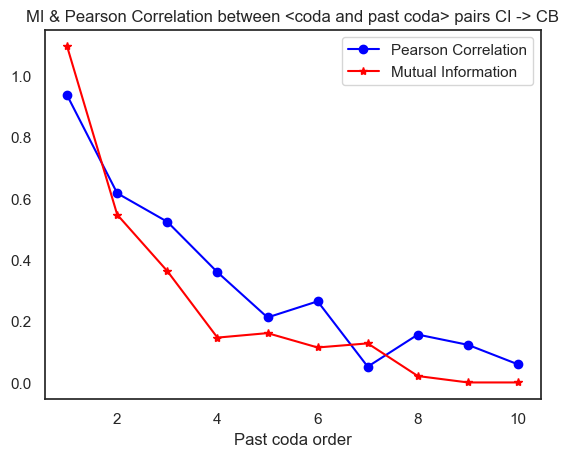

In [491]:
ci_cb_vectors = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 1)
ci_cb_vectors = [vec for vec in ci_cb_vectors if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]
plot_correlation_and_mi(ci_cb_vectors, range(1, 11), 'CI -> CB')

# def plot_correlation_and_mi(vectors, sequence_options, feature_name):
#     pearson_corrs = []
#     mis = []
#     seqs = []
#     for seq in sequence_options:
#         pairs = get_pairs_by_idx(vectors, seq)
#         if len(pairs) == 0:
#             continue
#
#         first = list(map(lambda x: x[0], pairs))
#         second = list(map(lambda x: x[1], pairs))
#         # print(f"len pairs={len(pairs)}, len(first)={len(first)}, len(second)={len(second)}")
#
#         pearson_corr, _ = pearsonr(first, second)
#         pearson_corrs.append(pearson_corr)
#
#         mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
#         mis.append(mi)
#         seqs.append(seq)
#         #print(f"seq={seq}, pearson correlation={pearson_corr}")
#         #print(f"seq={seq}, mi ={mi}")

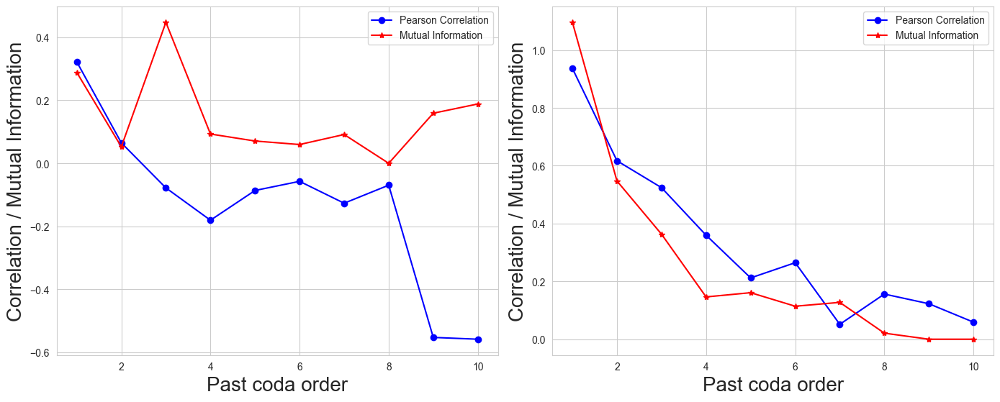

In [46]:
# Compute metrics for all exchanges
vectors_1 = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 1)
vectors_1 = [vec for vec in vectors_1 if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]

pearson_corrs = []
sequence_options = range(1, 11)

mis = []
seqs = []
for seq in sequence_options:
    pairs = get_pairs_by_idx(vectors_1, seq)
    if len(pairs) == 0:
        continue

    first = list(map(lambda x: x[0], pairs))
    second = list(map(lambda x: x[1], pairs))
    pearson_corr, _ = pearsonr(first, second)
    pearson_corrs.append(pearson_corr)
    mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
    mis.append(mi)
    seqs.append(seq)

# Compute metrics for symmetric exchanges
vectors_0 = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 0)
vectors_0 = [vec for vec in vectors_0 if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]

pearson_corrs_0 = []
mis_sym = []
seqs_sym = []
for seq in sequence_options:
    pairs = get_pairs_by_idx(vectors_0, seq)
    if not pairs:
        continue
    first = [p[0] for p in pairs]
    second = [p[1] for p in pairs]
    corr, _ = pearsonr(first, second)
    pearson_corrs_0.append(corr)
    mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
    mis_sym.append(mi[0])
    seqs_sym.append(seq)

# Plot the results side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Left subplot: All exchanges
axes[0].plot(seqs_sym, pearson_corrs_0, marker='o', color='blue', label='Pearson Correlation')
axes[0].plot(seqs_sym, mis_sym, marker='*', color='red', label='Mutual Information')
axes[0].set_xlabel('Past coda order', fontsize=20)
axes[0].set_ylabel('Correlation / Mutual Information', fontsize=20)
# axes[0].set_title('Correlation and MI for Cluster 0 pairs')
axes[0].legend(loc='best')
axes[0].grid(True)

# Right subplot: Symmetric exchanges
axes[1].plot(seqs, pearson_corrs, marker='o', color='blue', label='Pearson Correlation')
axes[1].plot(seqs, mis, marker='*', color='red', label='Mutual Information')
axes[1].set_xlabel('Past coda order', fontsize=20)
axes[1].set_ylabel('Correlation / Mutual Information', fontsize=20)
# axes[1].set_title('Correlation and MI for Cluster 1 pairs')
axes[1].legend(loc='best')
axes[1].grid(True)

# fig.suptitle(f'Correlation & MI for Non-Focal CB Using Past Focal Coda CI', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

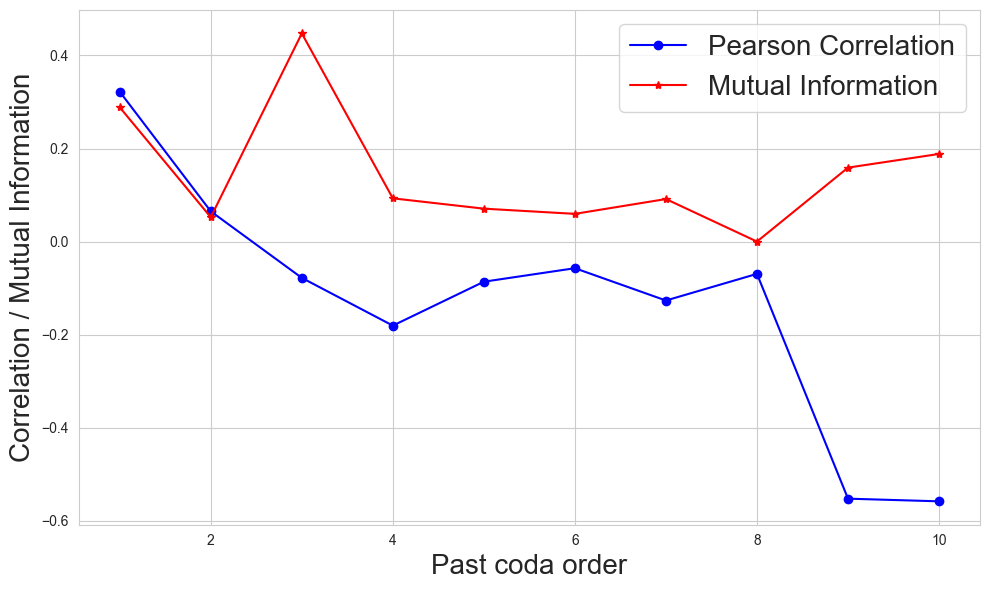

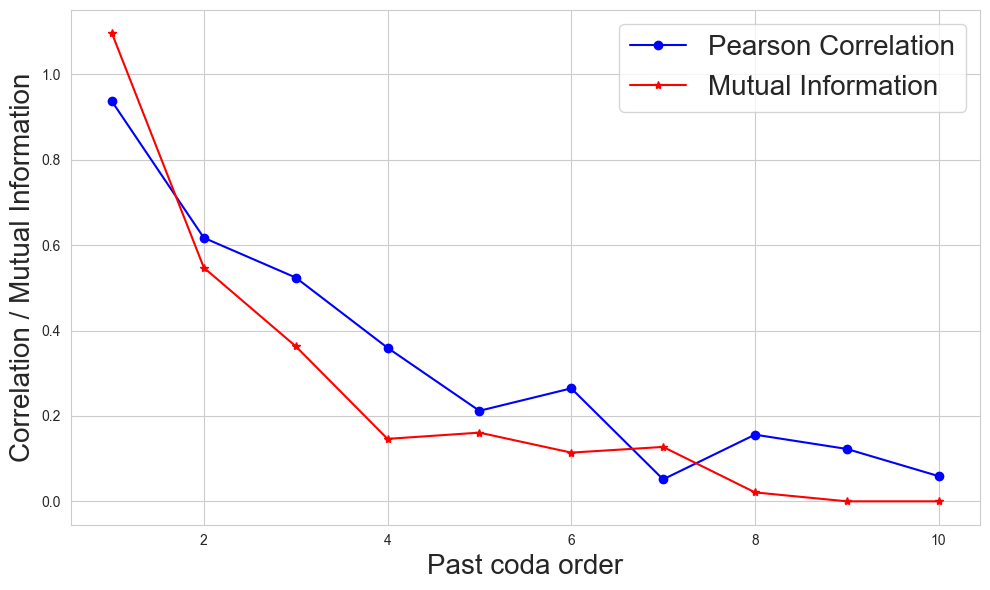

In [87]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from sklearn.feature_selection import mutual_info_regression

# --- Data Calculation (Keep as is) ---
# Compute metrics for Cluster 1 exchanges (based on variable names used in plotting)
vectors_1 = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 1)
vectors_1 = [vec for vec in vectors_1 if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]

pearson_corrs = []
sequence_options = range(1, 11) # Define sequence_options
mis = []
seqs = []
for seq in sequence_options:
    pairs = get_pairs_by_idx(vectors_1, seq)
    if len(pairs) == 0:
        continue

    first = list(map(lambda x: x[0], pairs))
    second = list(map(lambda x: x[1], pairs))
    pearson_corr, _ = pearsonr(first, second)
    pearson_corrs.append(pearson_corr)
    mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
    mis.append(mi)
    seqs.append(seq)

# Compute metrics for Cluster 0 (Symmetric) exchanges (based on variable names used in plotting)
vectors_0 = get_vectors_ci_cb(coda_df_clean.reset_index(drop=True), 'past_codas', None, 0)
vectors_0 = [vec for vec in vectors_0 if not any(np.isnan(vec) or np.isinf(vec) for vec in vec)]

pearson_corrs_0 = []
mis_sym = []
seqs_sym = []
for seq in sequence_options: # Use the same sequence_options
    pairs = get_pairs_by_idx(vectors_0, seq)
    if not pairs:
        continue
    first = [p[0] for p in pairs]
    second = [p[1] for p in pairs]
    corr, _ = pearsonr(first, second)
    pearson_corrs_0.append(corr)
    mi = mutual_info_regression(np.array(first).reshape(-1, 1), np.array(second), discrete_features=[False])
    mis_sym.append(mi[0])
    seqs_sym.append(seq)


# --- Plot 1: Cluster 0 (Symmetric) exchanges ---
fig1, ax1 = plt.subplots(figsize=(10, 6)) # Create a new figure and axes

ax1.plot(seqs_sym, pearson_corrs_0, marker='o', color='blue', label='Pearson Correlation')
ax1.plot(seqs_sym, mis_sym, marker='*', color='red', label='Mutual Information')

ax1.set_xlabel('Past coda order', fontsize=20)
ax1.set_ylabel('Correlation / Mutual Information', fontsize=20)
# ax1.set_title('Correlation and MI for Cluster 0 pairs') # Remove title
ax1.legend(loc='best', fontsize=20) # Set legend font size
ax1.grid(True)

plt.tight_layout() # Use tight_layout for this individual figure
plt.show() # Show the first plot

# --- Plot 2: Cluster 1 exchanges ---
fig2, ax2 = plt.subplots(figsize=(10, 6)) # Create another new figure and axes

ax2.plot(seqs, pearson_corrs, marker='o', color='blue', label='Pearson Correlation')
ax2.plot(seqs, mis, marker='*', color='red', label='Mutual Information')

ax2.set_xlabel('Past coda order', fontsize=20)
ax2.set_ylabel('Correlation / Mutual Information', fontsize=20)
# ax2.set_title('Correlation and MI for Cluster 1 pairs') # Remove title
ax2.legend(loc='best', fontsize=20) # Set legend font size
ax2.grid(True)

plt.tight_layout() # Use tight_layout for this individual figure
plt.show() # Show the second plot

# Remove the original combined figure creation, suptitle, and tight_layout calls
# fig, axes = plt.subplots(1, 2, figsize=(14, 6)) # Removed
# fig.suptitle(...) # Removed
# plt.tight_layout(rect=[0, 0, 1, 0.95]) # Removed

## ci vs cb abstract graph

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\2919470110.py:66: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='Feature', y='Duration', data=df_melted,
C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 6.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\2919470110.py:79: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='Feature', y='Duration', data=df_melted,
C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 33.3% of the points cannot be placed; you may want to decrease the size of the marker

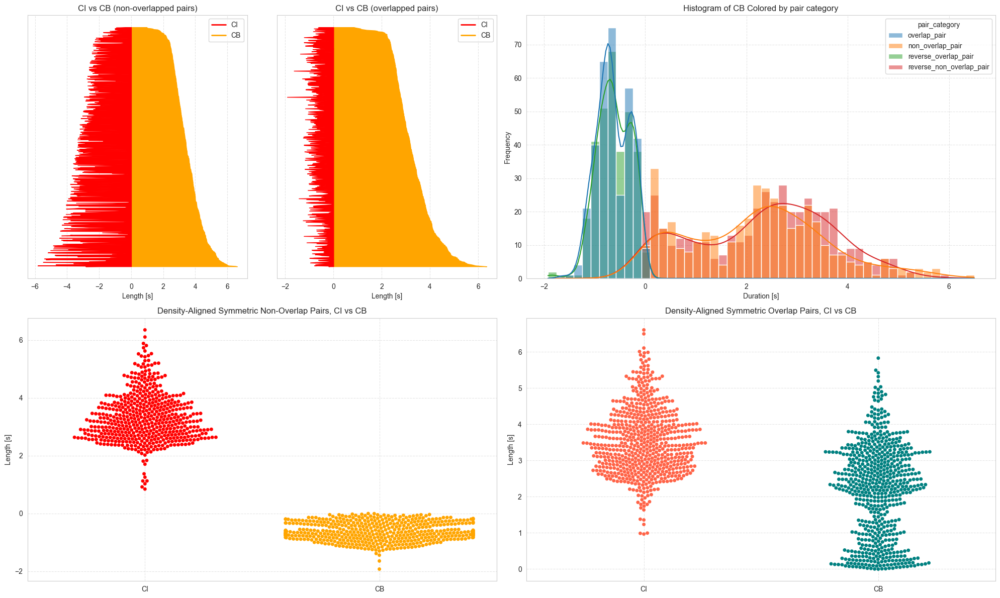

In [45]:
feature_name='Duration'
fig = plt.figure(figsize=(20, 12))
grid = plt.GridSpec(2, 4, figure=fig, height_ratios=[1, 1])

filtered_df = coda_df[(coda_df['CB'] > 0) & (coda_df['CB'].notna()) & (coda_df['CI'].notna())]
ci_cb_pairs_non_overlapped = filtered_df[['CI', 'CB']]

filtered_df = coda_df[(coda_df['CB'] < 0) & (coda_df['CB'].notna()) & (coda_df['CI'].notna())]
ci_cb_pairs_overlapped_df = filtered_df[['CI', 'CB']]

### --- Graph 1: Area Plots (First Row, 2 Columns) --- ###
ax = fig.add_subplot(grid[0, 1])
ci_cb_pairs_overlapped_df = ci_cb_pairs_overlapped_df.sort_values(by='CI').reset_index(drop=True)
ax.fill_betweenx(ci_cb_pairs_overlapped_df.index, 0, ci_cb_pairs_overlapped_df['CI'], color='orange', alpha=1)
ax.fill_betweenx(ci_cb_pairs_overlapped_df.index, 0, ci_cb_pairs_overlapped_df['CB'], color='red', alpha=1)
ax.invert_yaxis()
ax.grid(axis='x', linestyle='--', alpha=0.5)
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.set_xlabel(f"Length [s]")
ax.set_yticks([])
ax.set_title(f'CI vs CB (overlapped pairs)')
ax.legend(loc='upper right', labels=['CI', 'CB'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
])

ax = fig.add_subplot(grid[0, 0])
ci_cb_pairs_non_overlapped = ci_cb_pairs_non_overlapped.sort_values(by='CI').reset_index(drop=True)
ci_cb_pairs_non_overlapped['CB'] = ci_cb_pairs_non_overlapped['CB'] * -1
ax.fill_betweenx(ci_cb_pairs_non_overlapped.index, 0, ci_cb_pairs_non_overlapped['CI'], color='orange', alpha=1)
ax.fill_betweenx(ci_cb_pairs_non_overlapped.index, 0, ci_cb_pairs_non_overlapped['CB'], color='red', alpha=1)
ax.invert_yaxis()
ax.grid(axis='x', linestyle='--', alpha=0.5)
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.set_xlabel(f"Length [s]")
ax.set_yticks([])
ax.set_title(f'CI vs CB (non-overlapped pairs)')
ax.legend(loc='upper right', labels=['CI', 'CB'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
])

col_options = ['overlap_pair', 'non_overlap_pair', 'reverse_overlap_pair', 'reverse_non_overlap_pair']


def extract_field(row, field_name, col_options):
    for col_name in col_options:
        if row[col_name] is not None:
            return row[col_name][field_name]
    return None


ax = fig.add_subplot(grid[0, 2:])  # Place in row 2, col 1-2
sns.histplot(data=coda_df, x='CB', hue='pair_category', hue_order=col_options, kde=True, palette='tab10', bins=50)
ax.grid(axis='y', linestyle='--', alpha=0.5)
ax.grid(axis='x', linestyle='--', alpha=0.5)
ax.set_xlabel(f'{feature_name} [s]')
ax.set_ylabel("Frequency")
ax.set_title('Histogram of CB Colored by pair category')

# Plot swarm for CB on the right
ax_swarm = fig.add_subplot(grid[1, 0:2])
# ci_cb_pairs_overlapped_df['CB'] = ci_cb_pairs_overlapped_df['CB'] * -1
df_melted = pd.melt(ci_cb_pairs_overlapped_df, value_vars=['CI', 'CB'],
                    var_name='Feature', value_name='Duration')
sns.swarmplot(x='Feature', y='Duration', data=df_melted,
              palette={'CI': 'red', 'CB': 'orange'}, alpha=1, ax=ax_swarm)
ax_swarm.set_title(f"Density-Aligned Symmetric Non-Overlap Pairs, CI vs CB")
ax_swarm.set_ylabel(f"Length [s]")
ax_swarm.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm.set_xlabel("")
ax_swarm.legend().set_visible(False)

ax_swarm = fig.add_subplot(grid[1, 2:])
ci_cb_pairs_non_overlapped['CB'] = ci_cb_pairs_non_overlapped['CB'] * -1
df_melted = pd.melt(ci_cb_pairs_non_overlapped, value_vars=['CI', 'CB'],
                    var_name='Feature', value_name='Duration')
sns.swarmplot(x='Feature', y='Duration', data=df_melted,
              palette={'CI': 'tomato', 'CB': 'teal'}, alpha=1, ax=ax_swarm)
ax_swarm.set_title(f"Density-Aligned Symmetric Overlap Pairs, CI vs CB")
ax_swarm.set_ylabel(f"Length [s]")
ax_swarm.grid(axis='y', linestyle='--', alpha=0.5)
ax_swarm.grid(axis='x', linestyle='--', alpha=0.5)
ax_swarm.set_xlabel("")
ax_swarm.legend().set_visible(False)
plt.tight_layout()
plt.show()

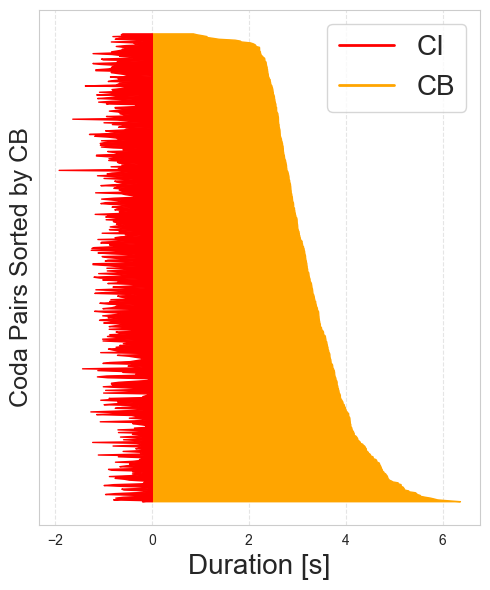

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\3472664728.py:43: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(xticklabels, fontsize=10)


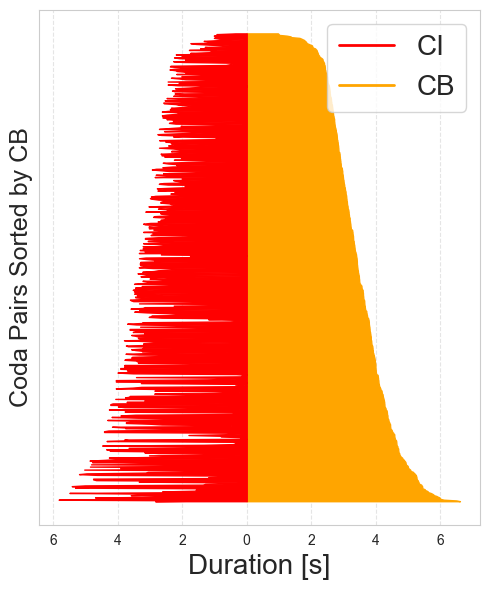

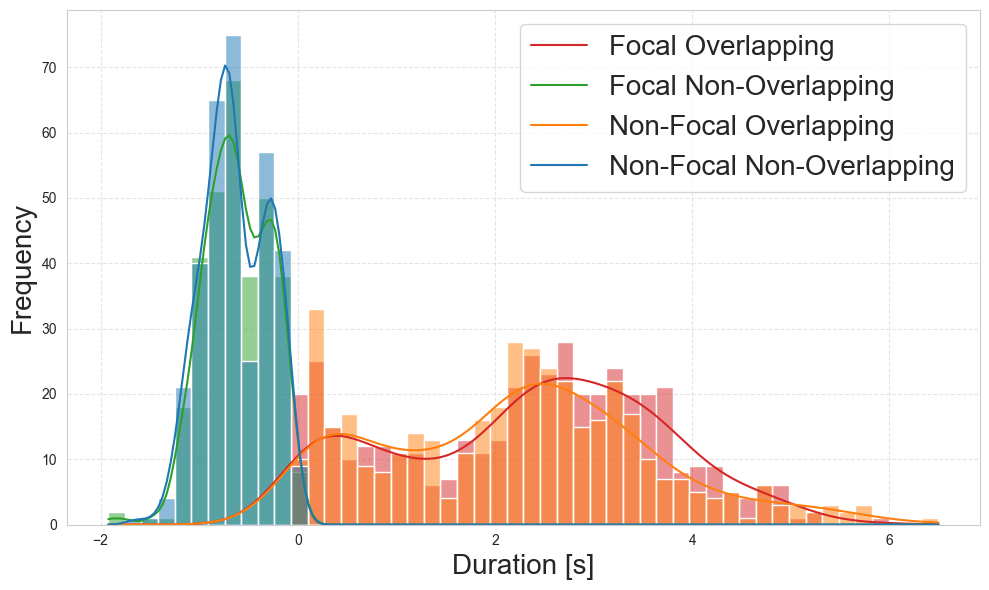

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\3472664728.py:74: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='Feature', y='Duration', data=df_melted, palette={'CI': 'red', 'CB': 'orange'}, alpha=1, ax=ax4)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
C:\Users\Maor\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 14.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


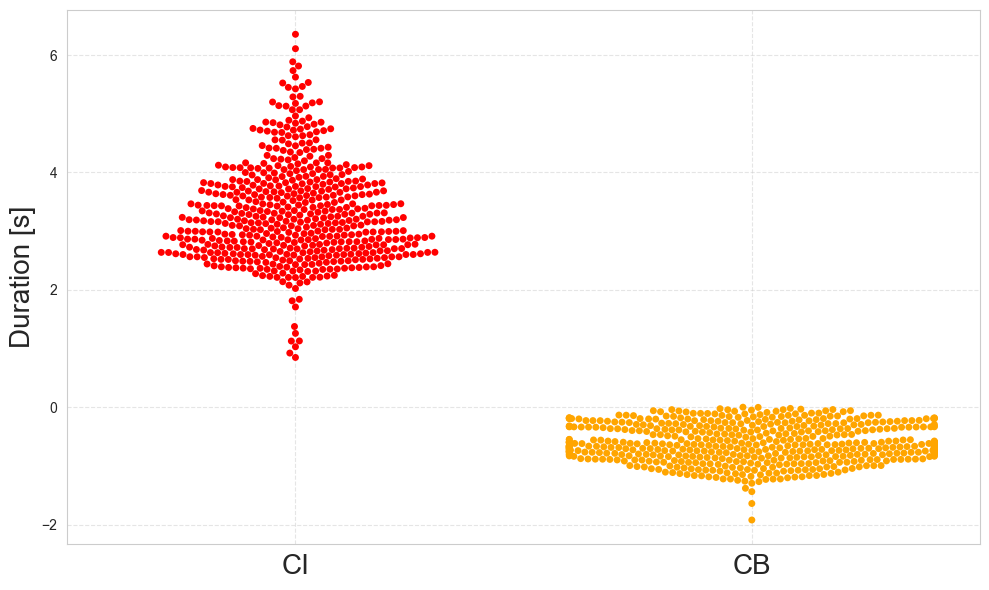

C:\Users\Maor\AppData\Local\Temp\ipykernel_1840\3472664728.py:89: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  sns.swarmplot(x='Feature', y='Duration', data=df_melted, palette={'CI': 'tomato', 'CB': 'teal'}, alpha=1, ax=ax5)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


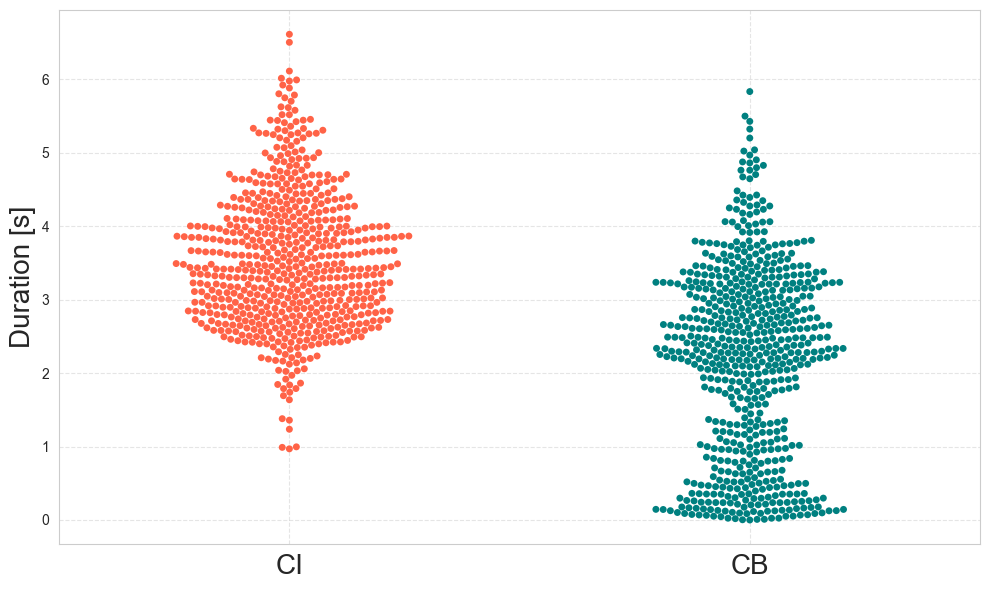

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

### --- Graph 1: Area Plot for Overlapped Pairs --- ###
fig1, ax1 = plt.subplots(figsize=(5, 6))
ci_cb_pairs_overlapped_df = ci_cb_pairs_overlapped_df.sort_values(by='CI').reset_index(drop=True)
ax1.fill_betweenx(ci_cb_pairs_overlapped_df.index, 0, ci_cb_pairs_overlapped_df['CI'], color='orange', alpha=1)
ax1.fill_betweenx(ci_cb_pairs_overlapped_df.index, 0, ci_cb_pairs_overlapped_df['CB'], color='red', alpha=1)
ax1.invert_yaxis()
ax1.grid(axis='x', linestyle='--', alpha=0.5)
ax1.grid(axis='y', linestyle='--', alpha=0.5)
ax1.set_xlabel(f"Duration [s]", fontsize=20) # Font size set
ax1.set_ylabel(f"Coda Pairs Sorted by CB", fontsize=18)
ax1.set_yticks([])
# ax1.set_title(f'CI vs CB (Overlapped Pairs)')
ax1.legend(loc='upper right', labels=['CI', 'CB'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
], fontsize=20)
plt.tight_layout()
plt.show()

### --- Graph 2: Area Plot for Non-Overlapped Pairs --- ###
fig2, ax2 = plt.subplots(figsize=(5, 6))
ci_cb_pairs_non_overlapped = ci_cb_pairs_non_overlapped.sort_values(by='CI').reset_index(drop=True)
ci_cb_pairs_non_overlapped['CB'] = ci_cb_pairs_non_overlapped['CB'] * -1
ax2.fill_betweenx(ci_cb_pairs_non_overlapped.index, 0, ci_cb_pairs_non_overlapped['CI'], color='orange', alpha=1)
ax2.fill_betweenx(ci_cb_pairs_non_overlapped.index, 0, ci_cb_pairs_non_overlapped['CB'], color='red', alpha=1)
ax2.invert_yaxis()
ax2.grid(axis='x', linestyle='--', alpha=0.5)
ax2.grid(axis='y', linestyle='--', alpha=0.5)
ax2.set_xlabel(f"Duration [s]", fontsize=20) # Font size set
ax2.set_ylabel(f"Coda Pairs Sorted by CB", fontsize=18)
ax2.set_yticks([])
xticks = ax2.get_xticks()
xticklabels = [f'{abs(tick):.0f}' for tick in xticks]
ax2.set_xticklabels(xticklabels, fontsize=10)

# ax2.set_title(f'CI vs CB (Non-Overlapped Pairs)')
ax2.legend(loc='upper right', labels=['CI', 'CB'], handles=[
    plt.Line2D([0], [0], color='red', lw=2),
    plt.Line2D([0], [0], color='orange', lw=2)
], fontsize=20)
plt.tight_layout()
plt.show()


### --- Graph 3: Histogram of CB by Pair Category --- ###
fig3, ax3 = plt.subplots(figsize=(10, 6))
hist_plot = sns.histplot(data=coda_df, x='CB', hue='pair_category', hue_order=col_options, kde=True, palette='tab10', bins=50, ax=ax3)
ax3.grid(axis='y', linestyle='--', alpha=0.5)
ax3.grid(axis='x', linestyle='--', alpha=0.5)
ax3.set_xlabel(f'{feature_name} [s]', fontsize=20)
ax3.set_ylabel("Frequency", fontsize=20)
# ax3.set_title('Histogram of CB Colored by Pair Category')

# Explicitly set legend labels and font size
new_labels = ['Focal Overlapping', 'Focal Non-Overlapping', 'Non-Focal Overlapping', 'Non-Focal Non-Overlapping']
legend = ax3.legend(labels=new_labels, fontsize=20)

plt.tight_layout()
plt.show()

### --- Graph 4: Swarm Plot for Overlapped Pairs (CI vs CB) --- ###
fig4, ax4 = plt.subplots(figsize=(10, 6))
df_melted = pd.melt(ci_cb_pairs_overlapped_df, value_vars=['CI', 'CB'], var_name='Feature', value_name='Duration')
sns.swarmplot(x='Feature', y='Duration', data=df_melted, palette={'CI': 'red', 'CB': 'orange'}, alpha=1, ax=ax4)
# ax4.set_title(f"Density-Aligned Symmetric Non-Overlap Pairs, CI vs CB")
ax4.xaxis.set_tick_params(labelsize=20)
ax4.set_ylabel(f"Duration [s]", fontsize=20) # Font size set
ax4.grid(axis='y', linestyle='--', alpha=0.5)
ax4.grid(axis='x', linestyle='--', alpha=0.5)
ax4.set_xlabel("", fontsize=20) # Font size set (even for empty label)
ax4.legend().set_visible(False)
plt.tight_layout()
plt.show()

### --- Graph 5: Swarm Plot for Non-Overlapped Pairs (CI vs CB) --- ###
fig5, ax5 = plt.subplots(figsize=(10, 6))
ci_cb_pairs_non_overlapped['CB'] = ci_cb_pairs_non_overlapped['CB'] * -1
df_melted = pd.melt(ci_cb_pairs_non_overlapped, value_vars=['CI', 'CB'], var_name='Feature', value_name='Duration')
sns.swarmplot(x='Feature', y='Duration', data=df_melted, palette={'CI': 'tomato', 'CB': 'teal'}, alpha=1, ax=ax5)
# ax5.set_title(f"Density-Aligned Symmetric Overlap Pairs, CI vs CB")
ax5.xaxis.set_tick_params(labelsize=20)
ax5.set_ylabel(f"Duration [s]", fontsize=20) # Font size set
ax5.grid(axis='y', linestyle='--', alpha=0.5)
ax5.grid(axis='x', linestyle='--', alpha=0.5)
ax5.set_xlabel("", fontsize=20) # Font size set (even for empty label)
ax5.legend().set_visible(False)
plt.tight_layout()
plt.show()